In [1]:
import os
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "0"  # specify which GPU(s) to be used>
os.environ["CUDA_LAUNCH_BLOCKING"] = "1"

In [2]:
import sys
import math
import time
import random
import typing
import imageio
import cv2 as cv
import numpy as np
import pandas as pd
from PIL import Image
from sklearn import metrics
import matplotlib.pyplot as plt
from PIL import Image, ImageFilter
from einops.layers.torch import Rearrange
from sklearn.model_selection import train_test_split

import torch as T
import torchvision
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torchsummary import summary
from torch.optim.adam import Adam
from torch.utils.data import DataLoader
from torch.utils.data import TensorDataset
from torchvision import datasets, models, transforms
from torchvision.models.resnet import resnet50
from kornia.utils.one_hot import one_hot
from sklearn.model_selection import StratifiedKFold

## Load PTH
We previolusly obtained each PTH(weights) from a training process. Now it is neccesary to adquire the embeddings

In [3]:
root = os.getcwd()

In [4]:
weight_paths = "results/Journal_SPIE_1S_2H_binary_kfold"
fold_weight_path = os.path.join(root, weight_paths, "Journal_SPIE_1S_2H_binary_kfold_fold")
fold_weight_path_0 = os.path.join(root, weight_paths, "Journal_SPIE_1S_2H_binary_kfold_fold_0.pth")
fold_weight_path_1 = os.path.join(root, weight_paths, "Journal_SPIE_1S_2H_binary_kfold_fold_1.pth")
fold_weight_path_2 = os.path.join(root, weight_paths, "Journal_SPIE_1S_2H_binary_kfold_fold_2.pth")
fold_weight_path_3 = os.path.join(root, weight_paths, "Journal_SPIE_1S_2H_binary_kfold_fold_3.pth")
fold_weight_path_4 = os.path.join(root, weight_paths, "Journal_SPIE_1S_2H_binary_kfold_fold_4.pth")
fold_weight_path_5 = os.path.join(root, weight_paths, "Journal_SPIE_1S_2H_binary_kfold_fold_5.pth")
fold_weight_path_6 = os.path.join(root, weight_paths, "Journal_SPIE_1S_2H_binary_kfold_fold_6.pth")
fold_weight_path_7 = os.path.join(root, weight_paths, "Journal_SPIE_1S_2H_binary_kfold_fold_7.pth")
fold_weight_path_8 = os.path.join(root, weight_paths, "Journal_SPIE_1S_2H_binary_kfold_fold_8.pth")
fold_weight_path_9 = os.path.join(root, weight_paths, "Journal_SPIE_1S_2H_binary_kfold_fold_9.pth")
print("Folder of PTH model: ", fold_weight_path_0)
print("Folder of PTH model: ", fold_weight_path)

Folder of PTH model:  /home/casanova/Documents/Multi-attention-nodule-classification/results/Journal_SPIE_1S_2H_binary_kfold/Journal_SPIE_1S_2H_binary_kfold_fold_0.pth
Folder of PTH model:  /home/casanova/Documents/Multi-attention-nodule-classification/results/Journal_SPIE_1S_2H_binary_kfold/Journal_SPIE_1S_2H_binary_kfold_fold


## Loading each model 
But, if we want to load the PTH, we need to do certain steps, such as declare each model


In [5]:
def conv3x3_3d(in_planes, out_planes, stride=1):
    """3x3 convolution with padding"""
    return nn.Conv3d(in_planes, out_planes, kernel_size=(3, 3, 3), stride=stride, padding=1, bias=False)

class Basic3dBlock(nn.Module):
    expansion = 1

    def __init__(self, inplanes, planes, stride=1, downsample=None):
        super(Basic3dBlock, self).__init__()
        self.conv1 = conv3x3_3d(inplanes, planes, stride)
        self.bn1 = nn.BatchNorm3d(planes)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = conv3x3_3d(planes, planes)
        self.bn2 = nn.BatchNorm3d(planes)
        self.downsample = downsample
        self.stride = stride

    def forward(self, x):
        identity = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)
        out = self.conv2(out)
        out = self.bn2(out)
        
        if self.downsample is not None:
            identity = self.downsample(x)
            
        out += identity
        out = self.relu(out)

        return out

In [6]:
class BasicConv3dRBF(nn.Module):
    def __init__(self, in_planes, out_planes, kernel_size, stride=1, padding=0, dilation=1):
        super(BasicConv3dRBF, self).__init__()
        self.conv = nn.Conv3d(in_planes, out_planes,
                              kernel_size=kernel_size, stride=stride,
                              padding=padding, dilation=dilation, bias=False)
        self.bn = nn.BatchNorm3d(out_planes)
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        x = self.conv(x)
        x = self.bn(x)
        return x

In [7]:
class RBF_modified(nn.Module):
    def __init__(self, in_channel, out_channel):
        super(RBF_modified, self).__init__()
        self.relu = nn.ReLU(True)
        self.branch0 = nn.Sequential(
            BasicConv3dRBF(in_channel, out_channel, (1, 1, 1)),
        )
        self.branch1 = nn.Sequential(
            BasicConv3dRBF(in_channel, out_channel, (1, 1, 1)),
            BasicConv3dRBF(out_channel, out_channel, kernel_size=(1, 3, 1), padding=(0, 1, 0)),
            BasicConv3dRBF(out_channel, out_channel, kernel_size=(3, 1, 1), padding=(1, 0, 0)),
            BasicConv3dRBF(out_channel, out_channel, (3, 3, 3), padding=3, dilation=3)
        )
        self.branch2 = nn.Sequential(
            BasicConv3dRBF(in_channel, out_channel, (1, 1, 1)),
            BasicConv3dRBF(out_channel, out_channel, kernel_size=(1, 5, 1), padding=(0, 2, 0)),
            BasicConv3dRBF(out_channel, out_channel, kernel_size=(5, 1, 1), padding=(2, 0, 0)),
            BasicConv3dRBF(out_channel, out_channel, (3, 3, 3), padding=5, dilation=5)
        )
        self.branch3 = nn.Sequential(
            BasicConv3dRBF(in_channel, out_channel, (1, 1, 1)),
            BasicConv3dRBF(out_channel, out_channel, kernel_size=(1, 7, 1), padding=(0, 3, 0)),
            BasicConv3dRBF(out_channel, out_channel, kernel_size=(7, 1, 1), padding=(3, 0, 0)),
            BasicConv3dRBF(out_channel, out_channel, (3, 3, 3), padding=7, dilation=7)
        )
        self.conv_cat = BasicConv3dRBF(4*out_channel, out_channel, (3, 3, 3), padding=1)
        self.conv_res = BasicConv3dRBF(in_channel, out_channel, (1, 1, 1))

    def forward(self, x):
        x0 = self.branch0(x)
        x1 = self.branch1(x)
        x2 = self.branch2(x)
        x3 = self.branch3(x)
        x_cat = self.conv_cat(T.cat((x0, x1, x2, x3), 1))

        x = self.relu(x_cat + self.conv_res(x))
        
        return x

In [8]:
class RFBMultiHeadAttn_V2(nn.Module):
    def __init__(self, in_dim, filters_head, num_multiheads):
        super(RFBMultiHeadAttn_V2, self).__init__()  
        """
            Multi-head attention
            in_dim = entry dimmension
            filters_head = filters by head
            We plan to make as much attentions as possible, in order to provide a reliable
            classification. Thus, creating different types of projections called k, q and v.
        """    
        self.in_dim = in_dim
        self.filters_head = filters_head
        self.num_multiheads = num_multiheads
        self.inner_filters = filters_head * num_multiheads

        #Queries of each attention made
        self.qkv_rfb = RBF_modified(in_dim, self.inner_filters * 3)

        self.rearrange_for_matmul = Rearrange(
            #"b c (d nh) h w  -> b c nh d h w", nh=num_multiheads
            "b (nh c) d h w  -> b nh c d h w", nh=num_multiheads
        )
        self.rearrange_back = Rearrange("b nh c d h w -> b (c nh) d h w")
        self.rearrange_for = Rearrange("nh b c d h w -> b (c nh) d h w")
        self.gamma_one = nn.Parameter(T.zeros(1))
        self.gamma_two = nn.Parameter(T.zeros(1))
        self.gamma_thr = nn.Parameter(T.zeros(1))
        self.gamma_fou = nn.Parameter(T.zeros(1))
        self.gamma_fiv = nn.Parameter(T.zeros(1))
        self.softmax = nn.Softmax(dim=-1)
    
    def forward(self, x):
        """
            inputs :
                x : input feature maps( B X C X D X W X H)
            returns :
                out : self attention value + input feature + num of heads
                attention: B X C X D X N (N is Width*Height)
        """
        
        #It is important to obtain a size of the input
        m_batchsize, C, dim, width, height = x.size()
#         print("x:        ", x.shape)
        #Now, we're gonna obtain an attention for each one 
#         print(self.qkv_rfb(x).shape)
        proj_qkv = self.qkv_rfb(x).view(m_batchsize, -1, dim, width, height)
#         print("proj_qkv: ", proj_qkv.shape)
        proj_qkv_rearranged = self.rearrange_for_matmul(proj_qkv)
#         print("rearanfed:", proj_qkv_rearranged.shape)
        q, k, v = proj_qkv_rearranged.chunk(chunks=3, dim=2)
#         print(q.shape, k.shape, v.shape)
        #return v para sonido #PARTE IMPORTANTE

        sim = (k @ q.permute(0, 1, 2, 3, 5, 4))
        att_map = self.softmax(sim)  # BX (N) X (N)
        proj_v = att_map @ v 
#         print("proj_v:   ", proj_v.shape)
        out_att = self.rearrange_back(proj_v)
#         print("out_att:  ", out_att.shape)
        out_heads = out_att.chunk(chunks=self.num_multiheads, dim=1)
#         print("out_heads:", out_heads[0].shape, out_heads[1].shape, out_heads[2].shape)
        out_gamma = T.cat([self.gamma_one,self.gamma_two,self.gamma_thr,self.gamma_fou,self.gamma_fiv])
        result = T.stack([(out_gamma[index] * heads + x) for index, heads in enumerate(out_heads)])
#         print("result;   ", result.shape)
        return self.rearrange_for(result)

In [9]:
#If you want to print inside the sequential module
class PrintLayer(nn.Module):
    def __init__(self):
        super(PrintLayer, self).__init__()
    
    def forward(self, x):
        # Do your print / debug stuff here
        print(x.size())
        return x

In [23]:
class RFBMultiHAttnNetwork_V3(nn.Module):
    def __init__(self):
        super().__init__()
        self.heads = 3
        self.RFBMHA_V3 = nn.Sequential(
            Basic3dBlock(1, 32), #Video y después audio
            RFBMultiHeadAttn_V2(32, 32, self.heads),
            nn.BatchNorm3d(32*self.heads),
            nn.Dropout(0.1),
#             Basic3dBlock(32*self.heads, 32*self.heads),      
#             RFBMultiHeadAttn_V2(32*self.heads, 32*self.heads, self.heads),
#             nn.BatchNorm3d(32*self.heads*self.heads),
#             nn.Dropout(0.1),
            nn.AdaptiveAvgPool3d((1,1,1)),
            #PrintLayer()
        )
        self.fc1 = nn.Linear(32*self.heads, 16)
        self.fc2 = nn.Linear(16,1)


    def forward(self, x):
        x = self.RFBMHA_V3(x)
        x = x.view(-1, x.size()[1])
        x = self.fc1(x)
        embebido16d = x
        x = self.fc2(x)
        embebido1d = x
        x = T.sigmoid(x)
        return x

    def get_embebido16d(self): #Agrego este metodo par poder obtener el valor de fc1
        return self.embebido16d

    def get_embebido1d(self): #Agrego este metodo par poder obtener el valor de fc2
        return self.embebido1d

## Preprocessing the data 
But, if we want to load the PTH, we need to do certain steps, such as load the data


In [11]:
#LIDC_path = "/data/Datasets/Pulmonary_nodules/LIDC_IDRI/LIDC-IDRI_images_npy_3d_HU"
#LIDC_path = "/home/Data/Datasets/Pulmonary_nodules/LIDC_IDRI/LIDC-IDRI_images_npy_3d_HU"
LIDC_path = "/data/casanova/LIDC-IDRI_images_npy_3d_HU/"
print(len(os.listdir(LIDC_path)))
min_val = 90000
max_val = 0
for i, value in enumerate(os.listdir(LIDC_path)):
    if (value == "meta_created_info_3d.csv"): continue;
    elif(value == "meta_created_info_3d_4R.csv"): continue;
    elif(value == "meta_created_info_3d_3R.csv"): continue;
    elif(value == "meta_created_info_3d_4R_binary.csv"): continue;
    elif(value == "meta_created_info_3d_3R_binary.csv"): continue;
    elif(value == "meta_created_info_3d_1stRAD.csv"): continue;
    elif(value == "meta_created_info_3d_2ndRAD.csv"): continue;
    elif(value == "meta_created_info_3d_3rdRAD.csv"): continue;
    elif(value == "meta_created_info_3d_4thRAD.csv"): continue;        
    elif(value == "meta_created_info_3d_1stRAD_all.csv"): continue;        
    elif(value == "meta_created_info_3d_2ndRAD_all.csv"): continue;        
    elif(value == "meta_created_info_3d_3rdRAD_all.csv"): continue;        
    elif(value == "meta_created_info_3d_4thRAD_all.csv"): continue;        
    elif(value == "meta_created_info_3d_1stRAD_diameter.csv"): continue;        
    elif(value == "meta_created_info_3d_2ndRAD_diameter.csv"): continue;        
    elif(value == "meta_created_info_3d_3rdRAD_diameter.csv"): continue;        
    elif(value == "meta_created_info_3d_4thRAD_diameter.csv"): continue;
    else:
        patient_folder = os.path.join(LIDC_path,value)
        length_folder  = len(os.listdir(patient_folder)) 
        if (length_folder > max_val): max_val = length_folder
        if (length_folder < min_val): min_val = length_folder
        #if (length_folder == 1): print(value)
print("Max value", max_val)
print("Min value", min_val)

2642
Max value 57
Min value 1


In [12]:
df_3R = pd.read_csv(os.path.join(LIDC_path, "meta_created_info_3d_3R.csv")) 
df_4R = pd.read_csv(os.path.join(LIDC_path, "meta_created_info_3d_4R.csv")) 
df = pd.concat([df_4R, df_3R])
# df_benign = df_all[df_all['malignancy']<3]
# df_malign = df_all[df_all['malignancy']>3]
# df = pd.concat([df_benign, df_malign])
df.head(30)

,patient_id,nodule_no,folder,malignancy,is_cancer,calcification,lobulation,texture,spiculation,subtlety,margin,intercept,slope
0,1,0,LICD-0001_NI000,5,True,6,3,5,5,5,4,-1024.0,1.0
1,3,1,LICD-0003_NI001,5,True,6,2,4,3,5,3,-1024.0,1.0
2,3,2,LICD-0003_NI002,4,True,6,2,5,2,4,4,-1024.0,1.0
3,3,3,LICD-0003_NI003,4,True,6,1,5,1,4,5,-1024.0,1.0
4,4,0,LICD-0004_NI000,1,False,3,1,5,1,3,5,-1024.0,1.0
5,5,0,LICD-0005_NI000,3,Ambiguous,6,1,5,1,3,5,-1024.0,1.0
6,5,1,LICD-0005_NI001,3,Ambiguous,6,1,5,1,4,5,-1024.0,1.0
7,6,3,LICD-0006_NI003,3,Ambiguous,6,2,5,2,3,4,-1024.0,1.0
8,7,0,LICD-0007_NI000,5,True,6,4,5,5,5,3,-1024.0,1.0
9,8,1,LICD-0008_NI001,3,Ambiguous,6,2,5,1,3,4,-1024.0,1.0


In [13]:
df.groupby('malignancy').count()['patient_id']

malignancy
1    121
2     53
3    388
4    203
5    156
Name: patient_id, dtype: int64

In [14]:
def hu_normalize(im, slope, intercept):
    """normalize the image to Houndsfield Unit
    """
    im = im * slope + intercept
    im[im > 400] = 400
    im[im < -1000] = -1000

    im = (255 - 0)/(400 - (-1000)) * (im - 400) + 255

    return im.astype(np.uint8)

In [15]:
#Please have a try with this manner
data_transforms = transforms.Compose([
        transforms.RandomVerticalFlip(),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor()])

#datasets.ImageFolder(os.path.join(data_dir, x), data_transforms[x])

class Augmenter:
    def __init__(self, hflip=True, rotate=True, blurring=False):
        self.hflip = hflip
        self.rotate = rotate
        self.blurring = blurring

    def augment(self, x):
        im = Image.fromarray(x)
        yield im
        if self.hflip:
            yield im.transpose(Image.FLIP_LEFT_RIGHT)
        if self.rotate:
            yield im.transpose(Image.ROTATE_90)
            yield im.transpose(Image.ROTATE_180)
            yield im.transpose(Image.ROTATE_270)
        if self.blurring:
            yield im.filter(ImageFilter.GaussianBlur(1))

In [16]:
nodule_size = 16
X_train, X_test, y_train, y_test = train_test_split(df["folder"], df["malignancy"], test_size=0.20, random_state=100)
print(len(y_test), len(y_train))
num_data = len(X_train)
img_size = 32

x = T.zeros((num_data, 1, 5, img_size, img_size))
y = T.zeros((num_data, 1))


for c, row in enumerate(X_train):
    patient_folder  = os.path.join(LIDC_path,row)
    length_folder   = len(os.listdir(patient_folder)) 
    image_folder    = sorted(os.listdir(patient_folder))
    middle_value    = len(image_folder)//2
    
    if (length_folder == 1): 
        tensor_image_3d = [image_folder, image_folder, image_folder, image_folder, image_folder]
    elif (length_folder == 2): 
        tensor_image_3d = [image_folder[0], image_folder[0], image_folder[1], image_folder[1], image_folder[1]]
    elif (length_folder == 3): 
        tensor_image_3d = [image_folder[0], image_folder[0], image_folder[1], image_folder[2], image_folder[2]]
    elif (length_folder == 4): 
        tensor_image_3d = [image_folder[0], image_folder[1], image_folder[2], image_folder[3], image_folder[3]]
    elif (length_folder >= 5): 
        tensor_image_3d = [image_folder[middle_value-2], image_folder[middle_value-1], image_folder[middle_value], 
                           image_folder[middle_value+1], image_folder[middle_value+2]]
    patient = df[df['folder'] == row]
    
    for i, value in enumerate(tensor_image_3d):
        
        im = np.load(os.path.join(root, patient_folder, value))
        im = im - np.min(im)
        im = ((im/np.max(im))*255).astype(np.uint8)
        width, height = im.shape; width = width//2; height = height//2
        if((im.shape[0] < 32) or (im.shape[1] < 32)): im = cv.resize(im, (32, 32))
        elif((im.shape[0] < width+nodule_size) or (im.shape[1] < width+nodule_size)): im = cv.resize(im, (32, 32))
        else: im = im[width-nodule_size:width+nodule_size, width-nodule_size:width+nodule_size]
        
        x[c, 0, i, :, :] = T.from_numpy(np.array(im).astype(np.float32))
        if(int(patient.malignancy) == 1): y[c, 0:] = int(0)
        if(int(patient.malignancy) == 2): y[c, 0:] = int(0)
        if(int(patient.malignancy) == 4): y[c, 0:] = int(1)
        if(int(patient.malignancy) == 5): y[c, 0:] = int(1)

print("x: ",x.shape)
print("y: ",y.shape)

185 736


/tmp/ipykernel_210830/3383675106.py:41: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 1): y[c, 0:] = int(0)
/tmp/ipykernel_210830/3383675106.py:42: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 2): y[c, 0:] = int(0)
/tmp/ipykernel_210830/3383675106.py:43: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 4): y[c, 0:] = int(1)
/tmp/ipykernel_210830/3383675106.py:44: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 5): y[c, 0:] = int(1)


x:  torch.Size([736, 1, 5, 32, 32])
y:  torch.Size([736, 1])


torch.Size([1, 5, 32, 32]) tensor([1.])


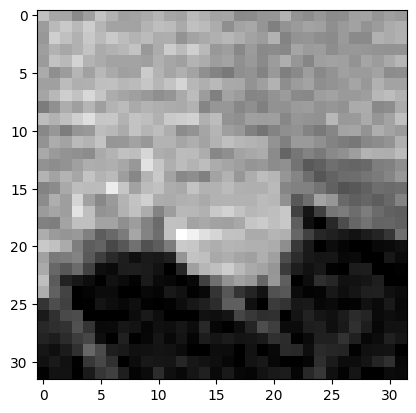

torch.Size([1, 5, 32, 32]) tensor([1.])


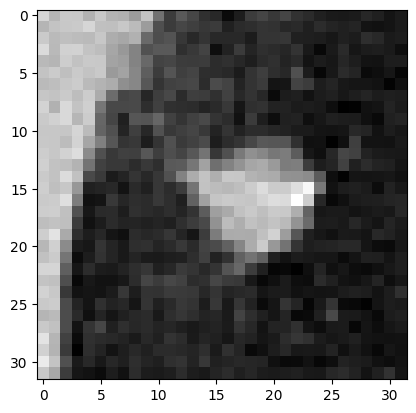

torch.Size([1, 5, 32, 32]) tensor([0.])


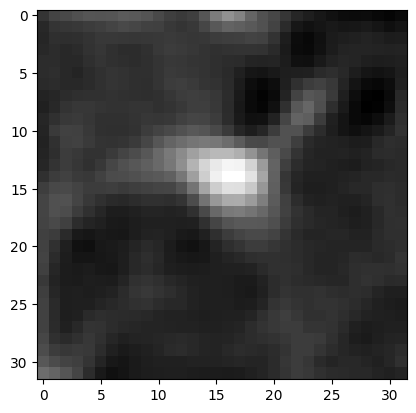

torch.Size([1, 5, 32, 32]) tensor([1.])


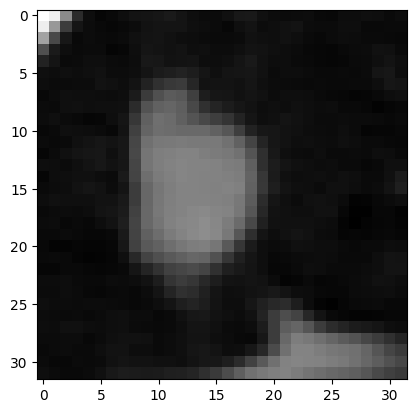

torch.Size([1, 5, 32, 32]) tensor([1.])


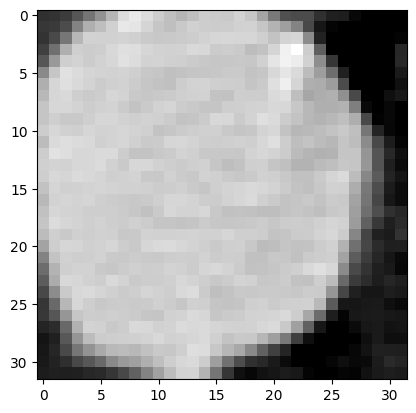

torch.Size([1, 5, 32, 32]) tensor([1.])


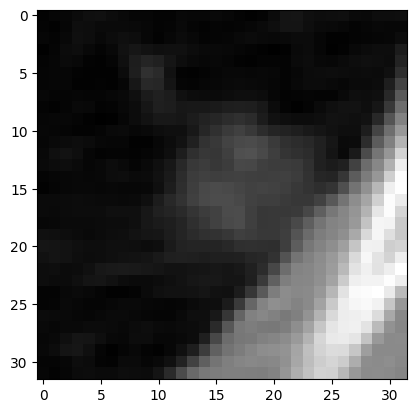

torch.Size([1, 5, 32, 32]) tensor([1.])


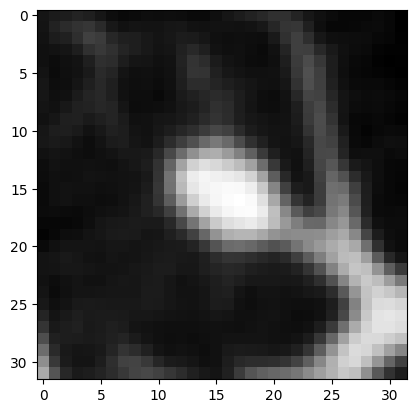

torch.Size([1, 5, 32, 32]) tensor([1.])


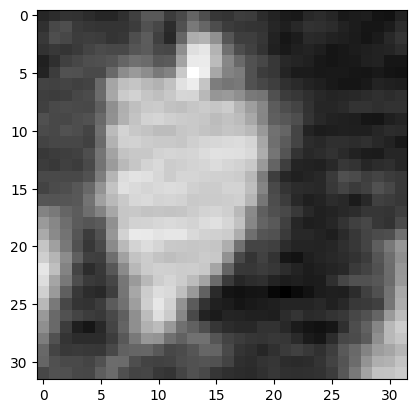

torch.Size([1, 5, 32, 32]) tensor([0.])


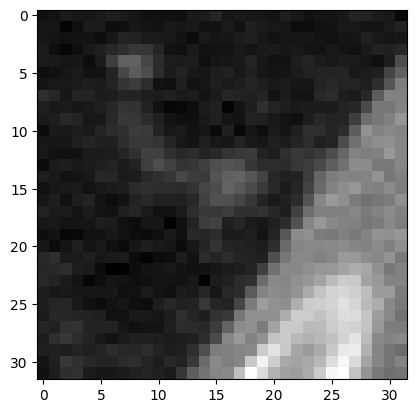

torch.Size([1, 5, 32, 32]) tensor([0.])


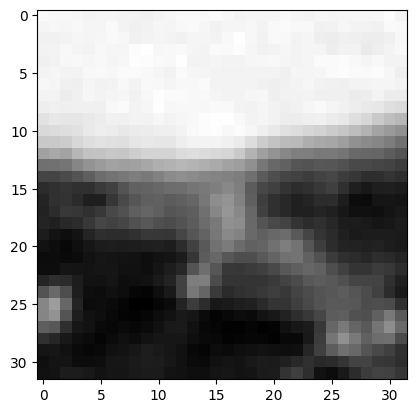

torch.Size([1, 5, 32, 32]) tensor([0.])


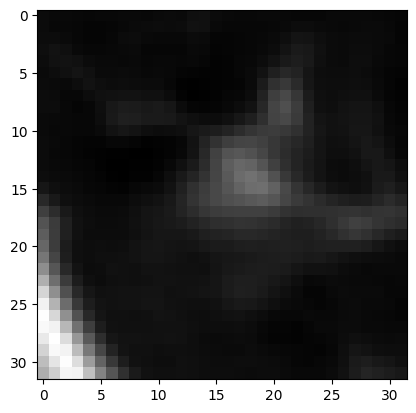

torch.Size([1, 5, 32, 32]) tensor([0.])


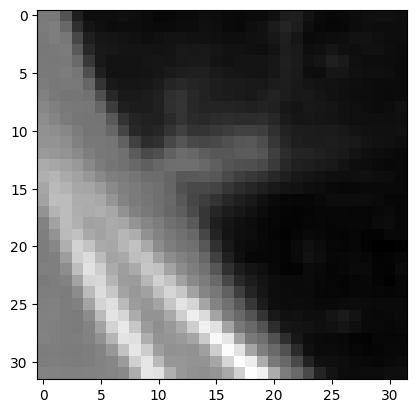

torch.Size([1, 5, 32, 32]) tensor([0.])


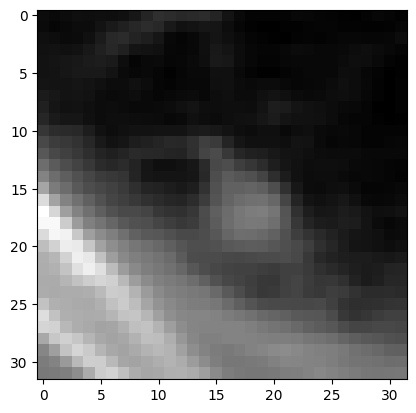

torch.Size([1, 5, 32, 32]) tensor([1.])


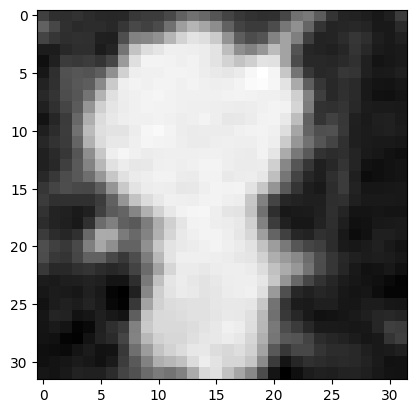

torch.Size([1, 5, 32, 32]) tensor([1.])


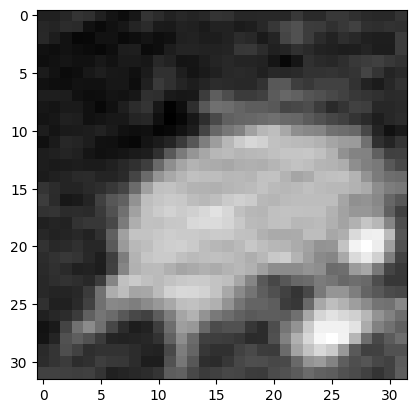

torch.Size([1, 5, 32, 32]) tensor([1.])


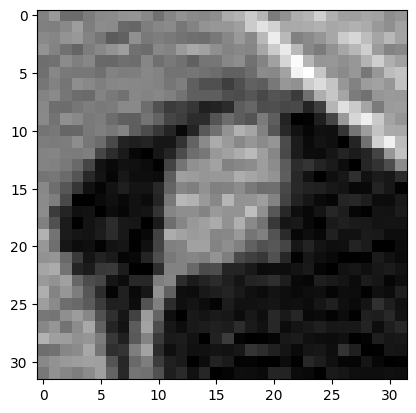

torch.Size([1, 5, 32, 32]) tensor([0.])


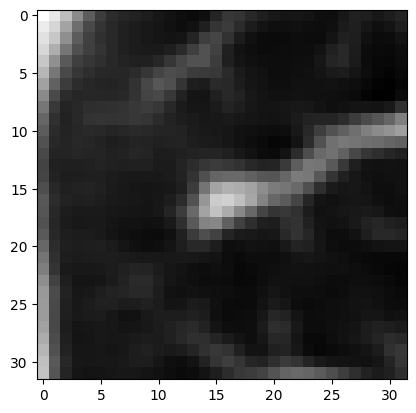

torch.Size([1, 5, 32, 32]) tensor([0.])


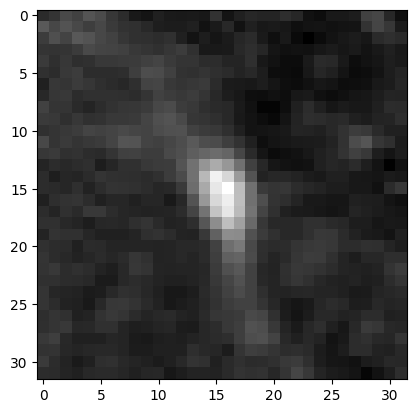

torch.Size([1, 5, 32, 32]) tensor([0.])


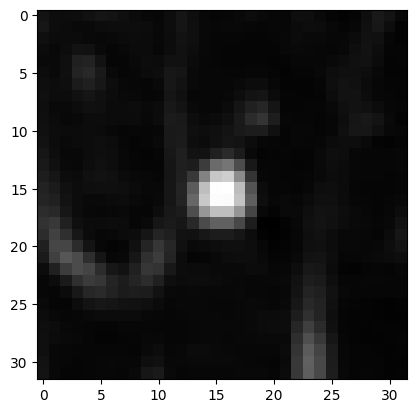

torch.Size([1, 5, 32, 32]) tensor([0.])


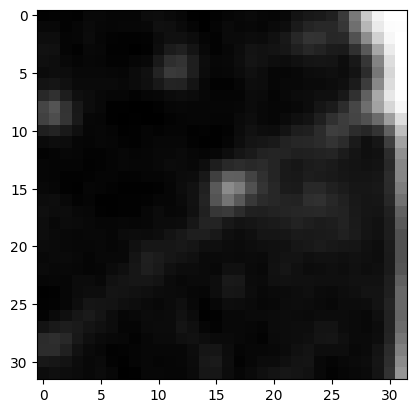

torch.Size([1, 5, 32, 32]) tensor([0.])


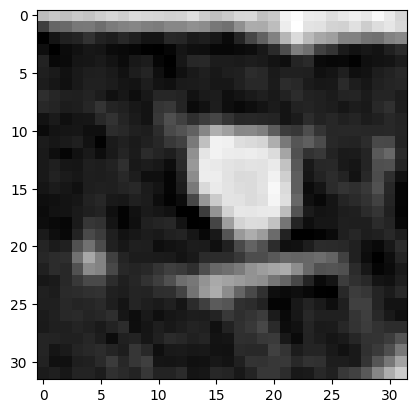

torch.Size([1, 5, 32, 32]) tensor([0.])


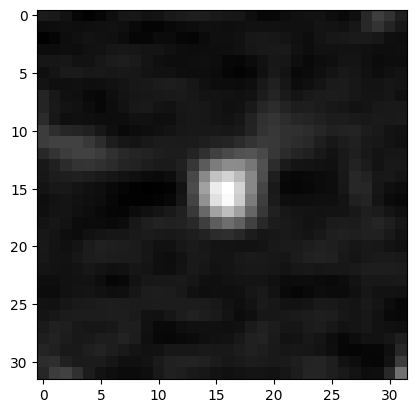

torch.Size([1, 5, 32, 32]) tensor([0.])


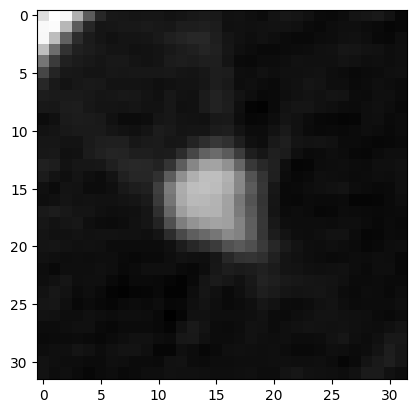

torch.Size([1, 5, 32, 32]) tensor([1.])


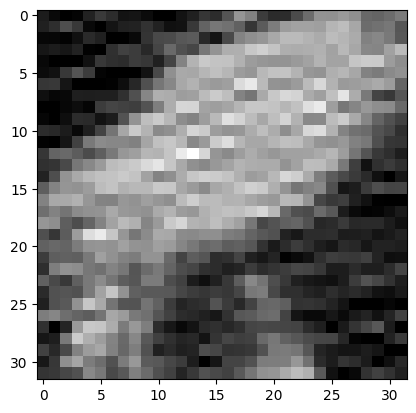

torch.Size([1, 5, 32, 32]) tensor([0.])


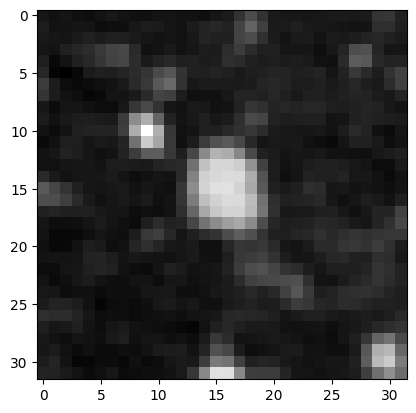

torch.Size([1, 5, 32, 32]) tensor([0.])


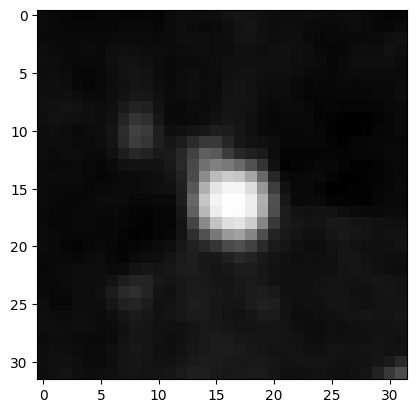

torch.Size([1, 5, 32, 32]) tensor([0.])


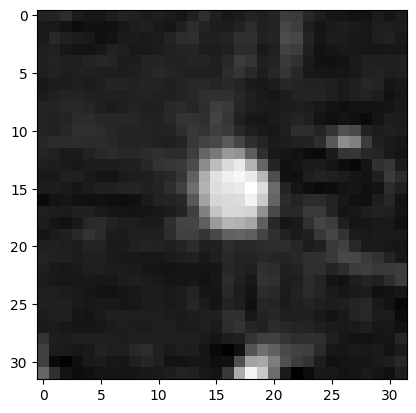

torch.Size([1, 5, 32, 32]) tensor([0.])


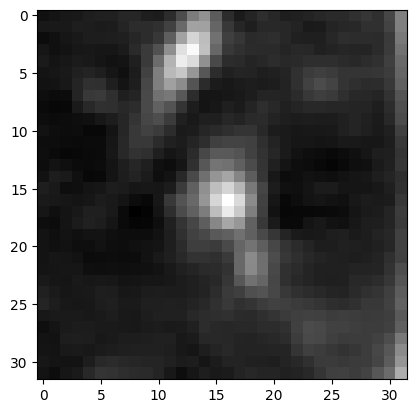

torch.Size([1, 5, 32, 32]) tensor([1.])


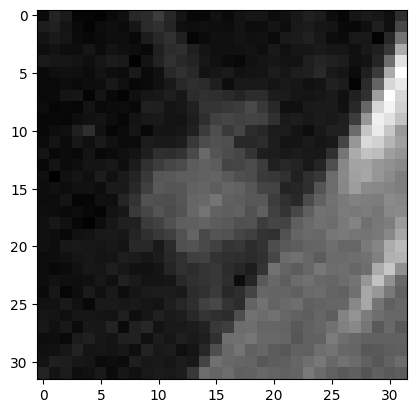

torch.Size([1, 5, 32, 32]) tensor([0.])


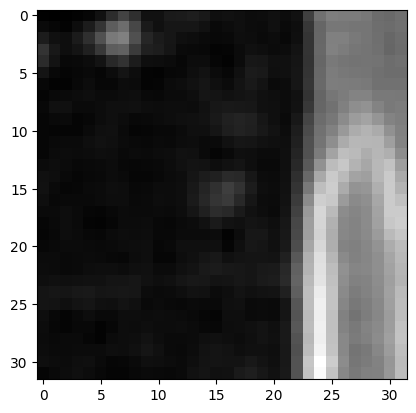

torch.Size([1, 5, 32, 32]) tensor([0.])


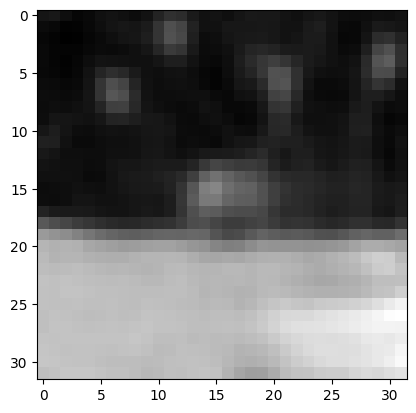

torch.Size([1, 5, 32, 32]) tensor([1.])


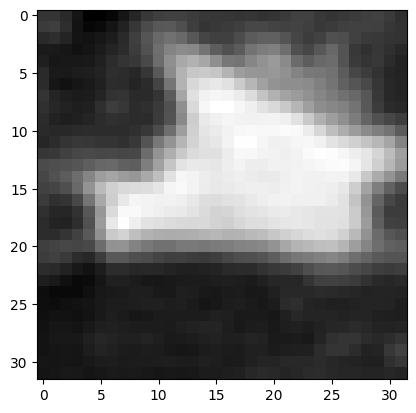

torch.Size([1, 5, 32, 32]) tensor([0.])


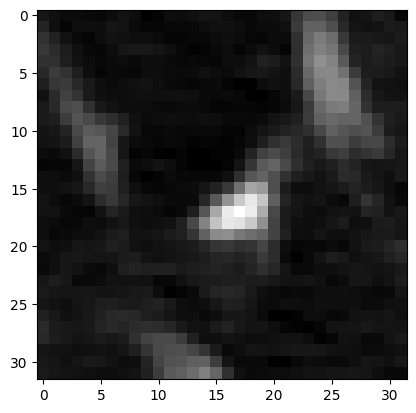

torch.Size([1, 5, 32, 32]) tensor([0.])


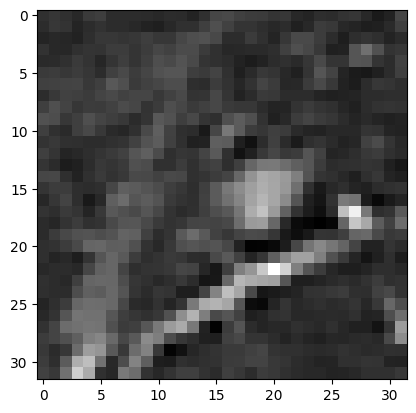

torch.Size([1, 5, 32, 32]) tensor([1.])


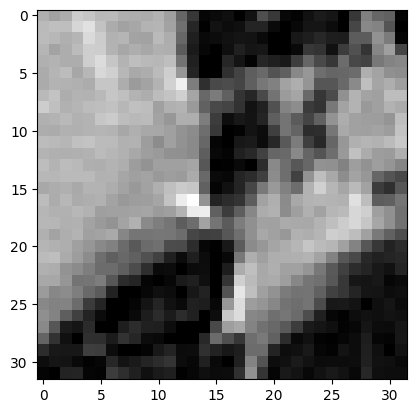

torch.Size([1, 5, 32, 32]) tensor([1.])


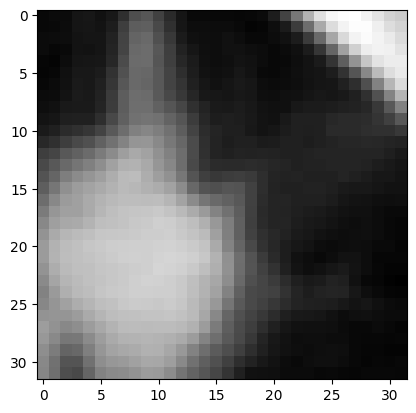

torch.Size([1, 5, 32, 32]) tensor([0.])


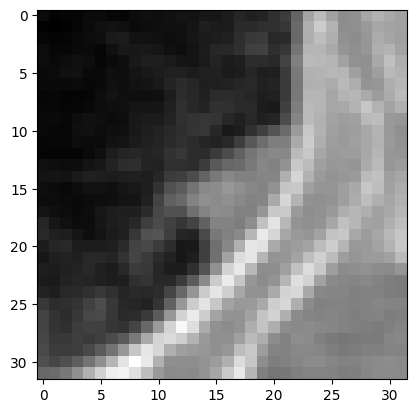

torch.Size([1, 5, 32, 32]) tensor([1.])


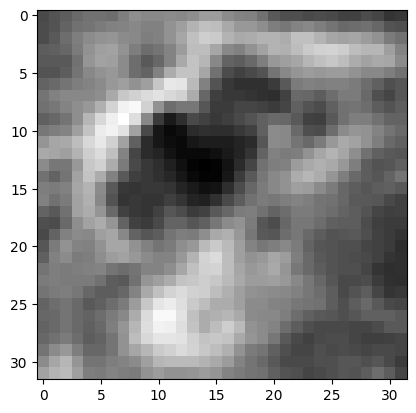

torch.Size([1, 5, 32, 32]) tensor([0.])


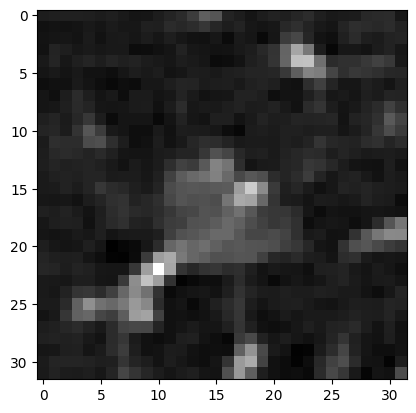

torch.Size([1, 5, 32, 32]) tensor([1.])


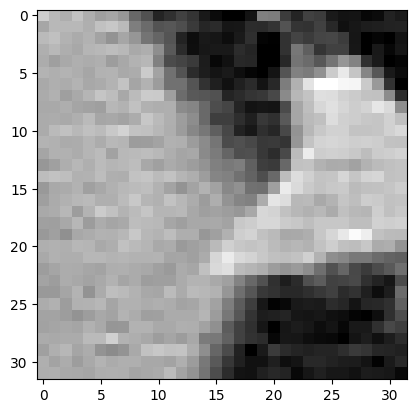

torch.Size([1, 5, 32, 32]) tensor([0.])


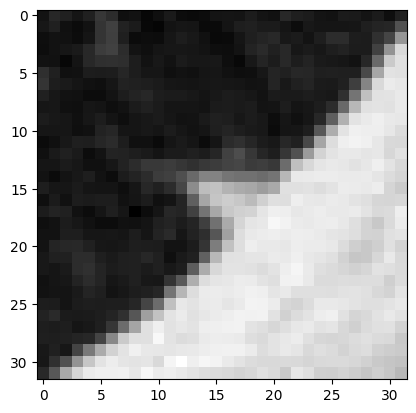

torch.Size([1, 5, 32, 32]) tensor([0.])


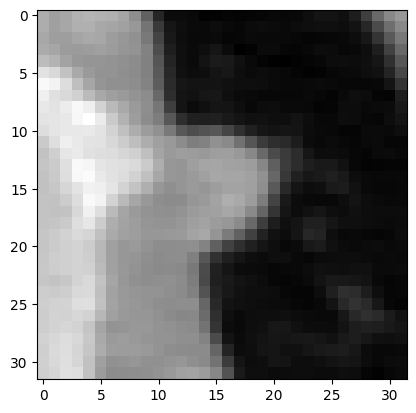

torch.Size([1, 5, 32, 32]) tensor([1.])


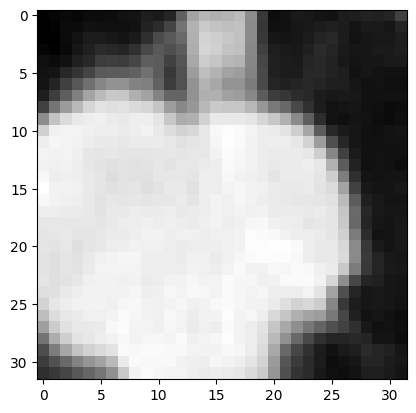

torch.Size([1, 5, 32, 32]) tensor([0.])


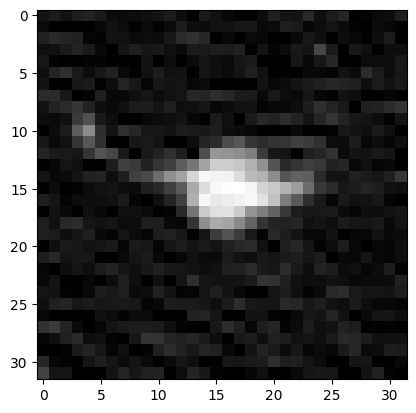

torch.Size([1, 5, 32, 32]) tensor([1.])


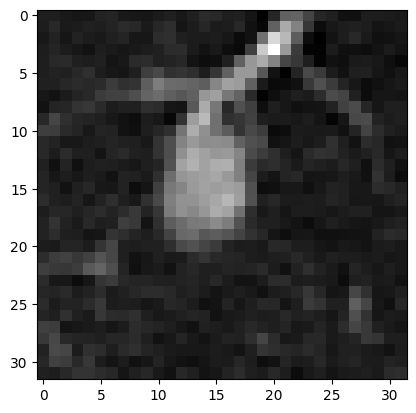

torch.Size([1, 5, 32, 32]) tensor([1.])


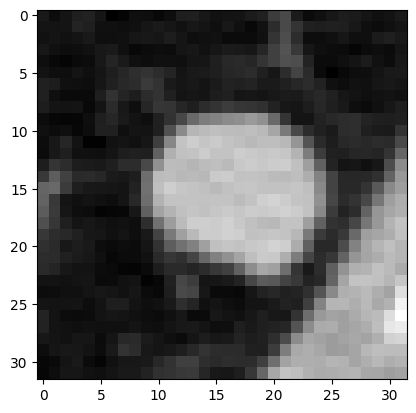

torch.Size([1, 5, 32, 32]) tensor([1.])


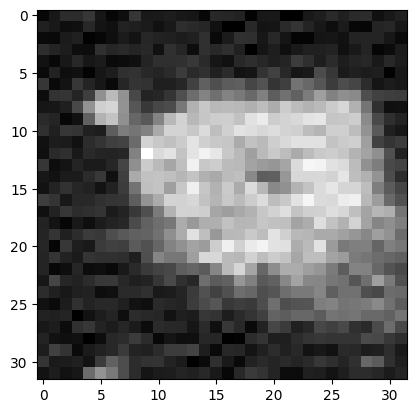

torch.Size([1, 5, 32, 32]) tensor([0.])


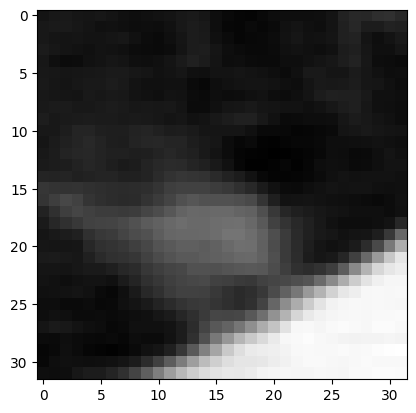

torch.Size([1, 5, 32, 32]) tensor([0.])


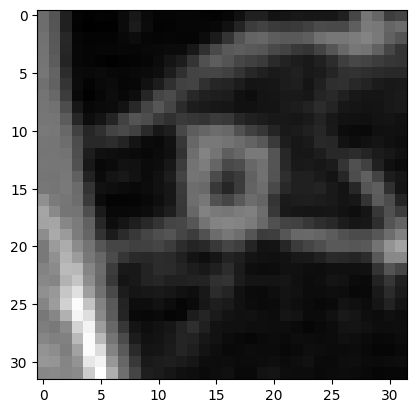

torch.Size([1, 5, 32, 32]) tensor([0.])


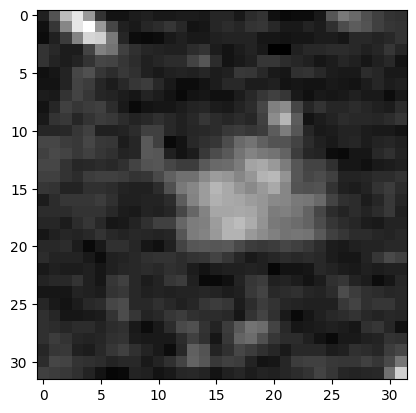

torch.Size([1, 5, 32, 32]) tensor([0.])


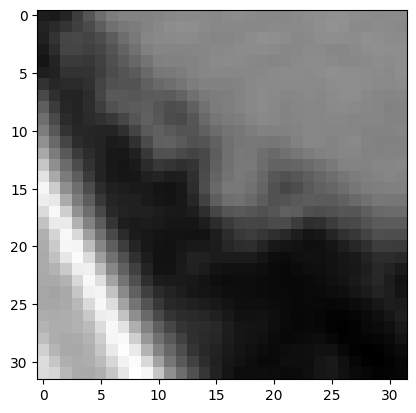

torch.Size([1, 5, 32, 32]) tensor([1.])


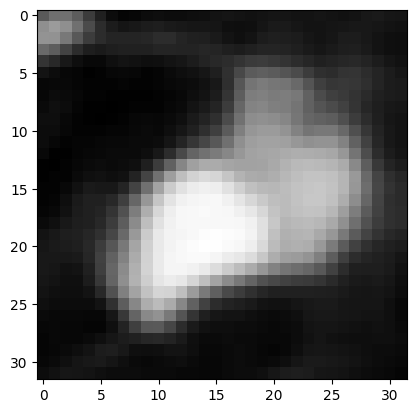

torch.Size([1, 5, 32, 32]) tensor([0.])


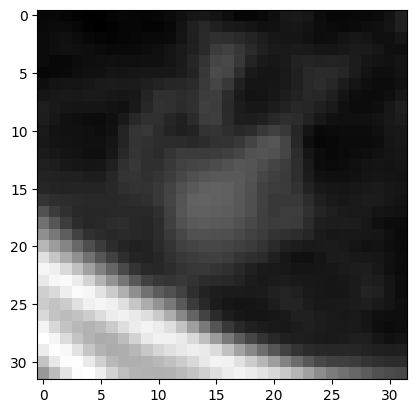

torch.Size([1, 5, 32, 32]) tensor([1.])


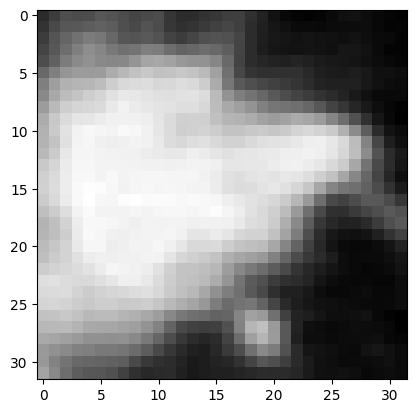

torch.Size([1, 5, 32, 32]) tensor([1.])


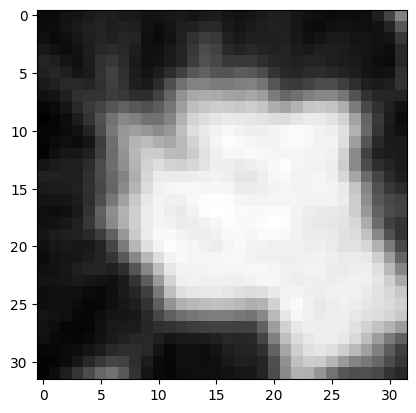

torch.Size([1, 5, 32, 32]) tensor([0.])


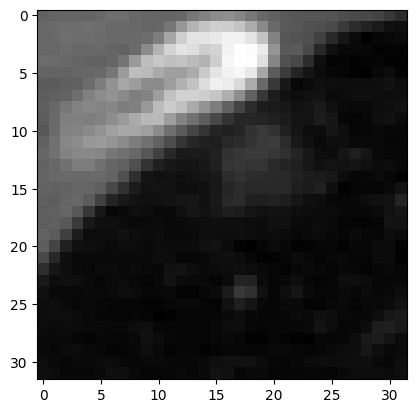

torch.Size([1, 5, 32, 32]) tensor([0.])


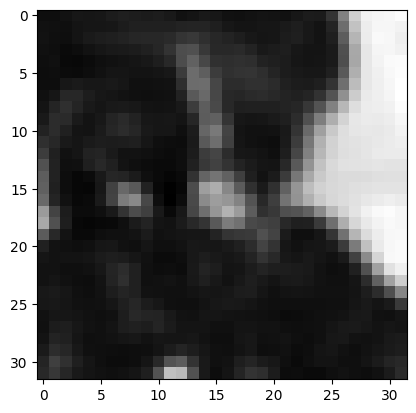

torch.Size([1, 5, 32, 32]) tensor([1.])


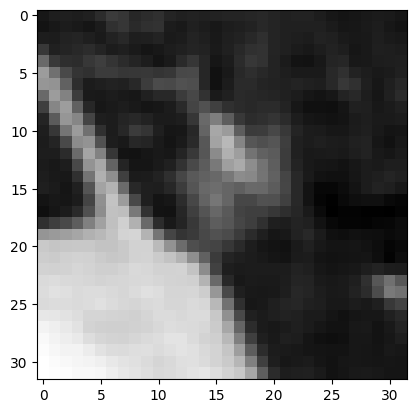

torch.Size([1, 5, 32, 32]) tensor([1.])


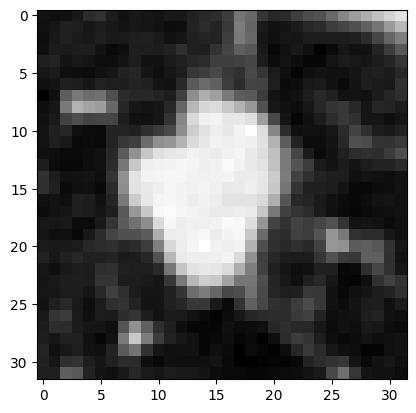

torch.Size([1, 5, 32, 32]) tensor([0.])


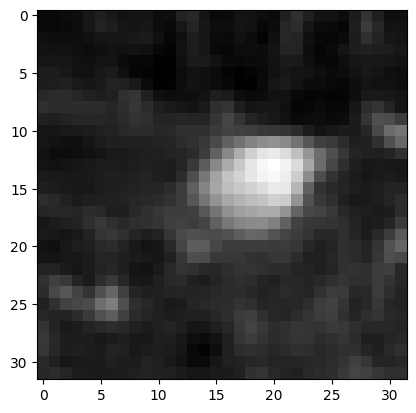

torch.Size([1, 5, 32, 32]) tensor([0.])


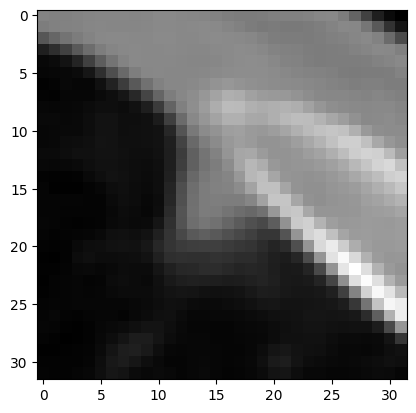

torch.Size([1, 5, 32, 32]) tensor([0.])


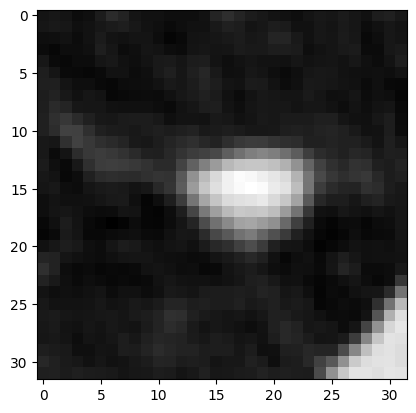

torch.Size([1, 5, 32, 32]) tensor([0.])


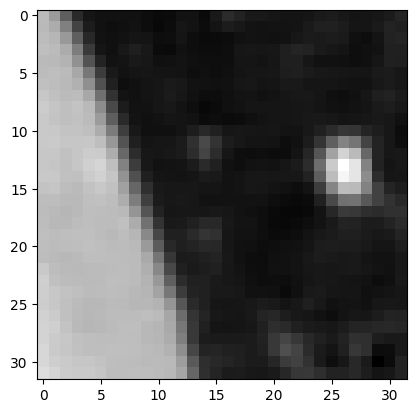

torch.Size([1, 5, 32, 32]) tensor([1.])


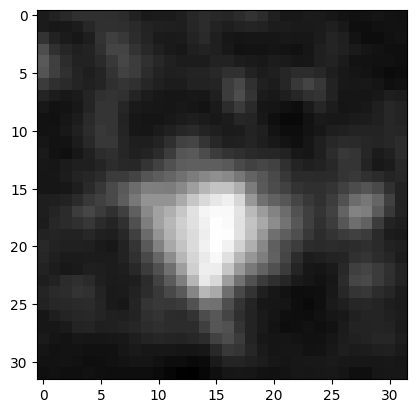

torch.Size([1, 5, 32, 32]) tensor([0.])


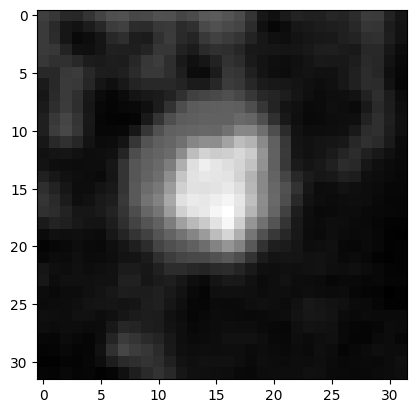

torch.Size([1, 5, 32, 32]) tensor([1.])


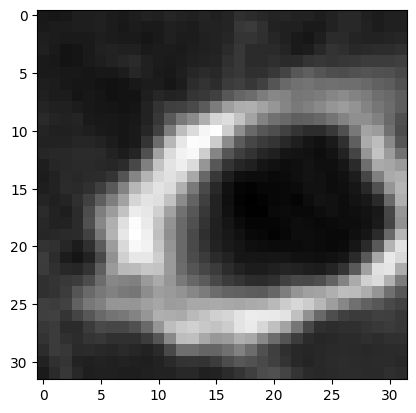

torch.Size([1, 5, 32, 32]) tensor([1.])


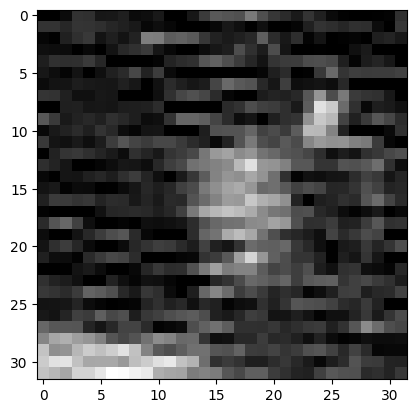

torch.Size([1, 5, 32, 32]) tensor([0.])


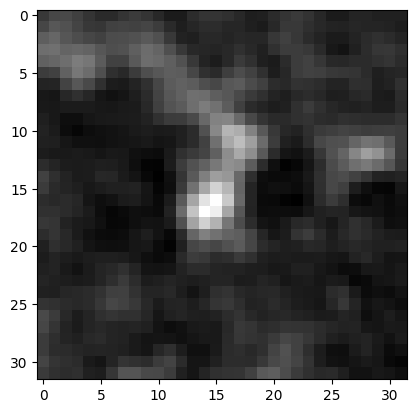

torch.Size([1, 5, 32, 32]) tensor([0.])


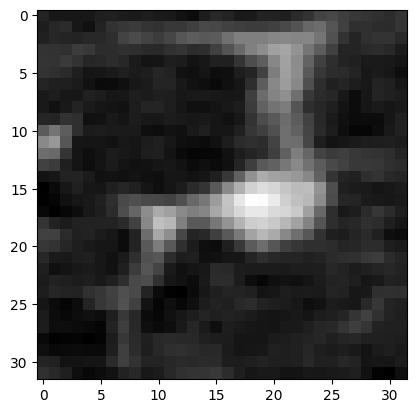

torch.Size([1, 5, 32, 32]) tensor([1.])


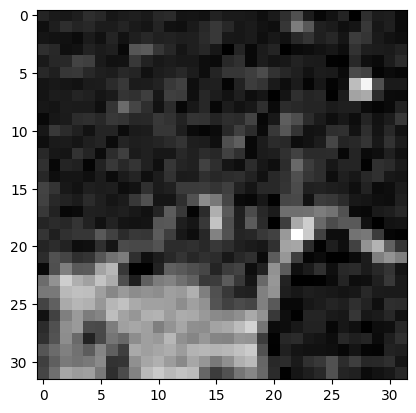

torch.Size([1, 5, 32, 32]) tensor([1.])


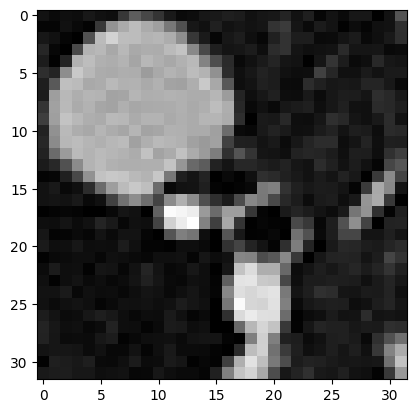

torch.Size([1, 5, 32, 32]) tensor([0.])


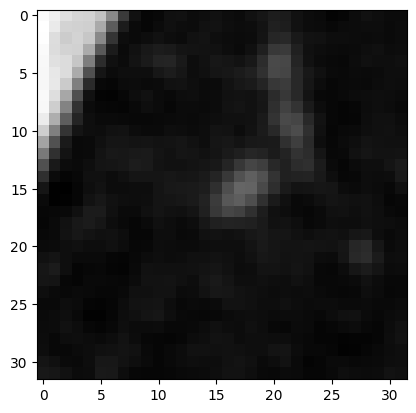

torch.Size([1, 5, 32, 32]) tensor([1.])


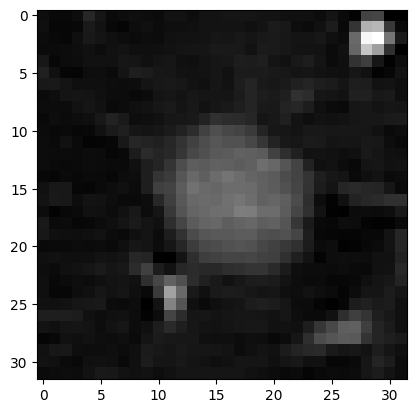

torch.Size([1, 5, 32, 32]) tensor([0.])


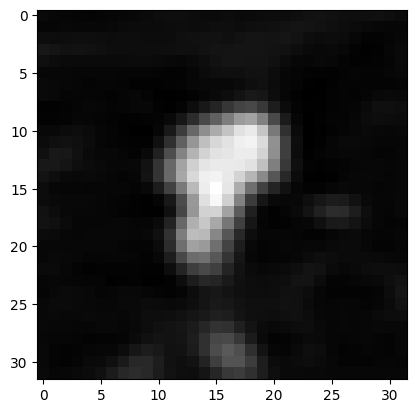

torch.Size([1, 5, 32, 32]) tensor([0.])


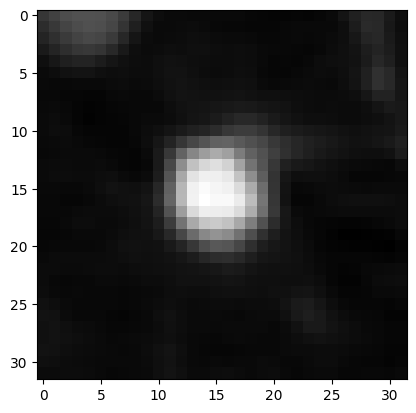

torch.Size([1, 5, 32, 32]) tensor([1.])


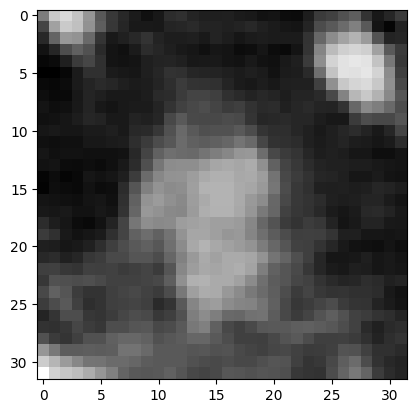

torch.Size([1, 5, 32, 32]) tensor([1.])


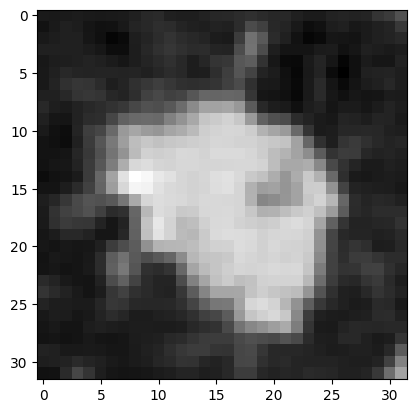

torch.Size([1, 5, 32, 32]) tensor([0.])


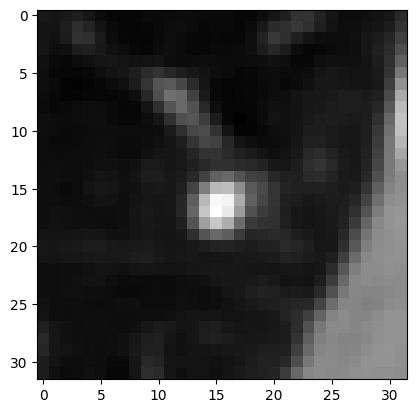

torch.Size([1, 5, 32, 32]) tensor([0.])


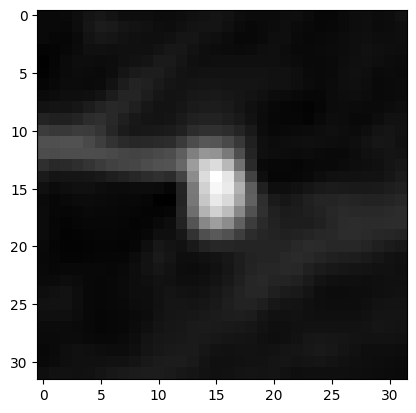

torch.Size([1, 5, 32, 32]) tensor([0.])


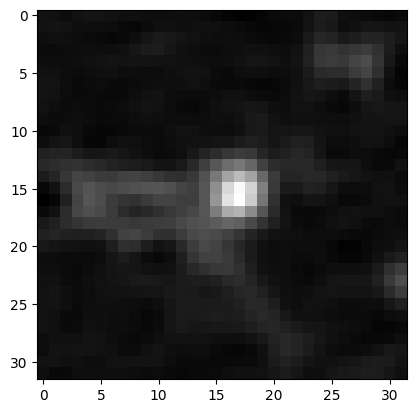

torch.Size([1, 5, 32, 32]) tensor([0.])


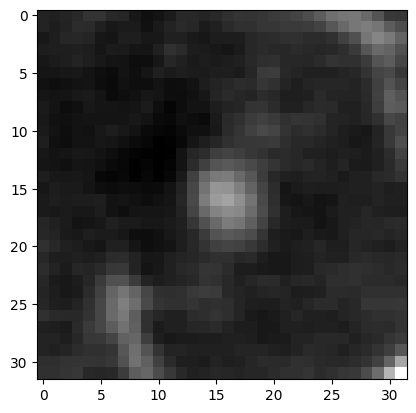

torch.Size([1, 5, 32, 32]) tensor([1.])


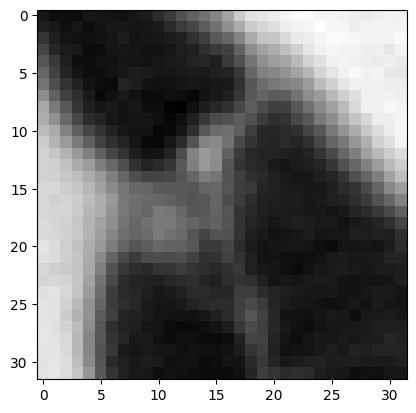

torch.Size([1, 5, 32, 32]) tensor([1.])


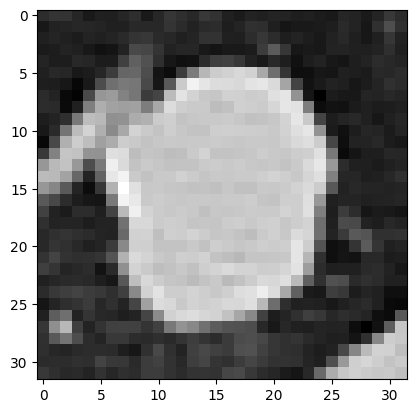

torch.Size([1, 5, 32, 32]) tensor([0.])


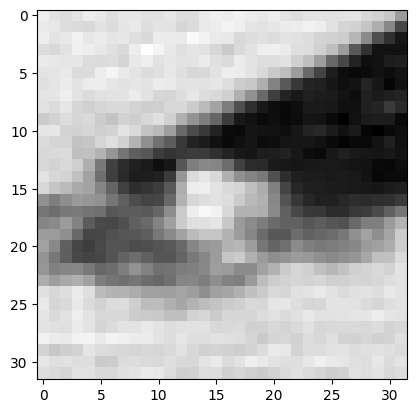

torch.Size([1, 5, 32, 32]) tensor([0.])


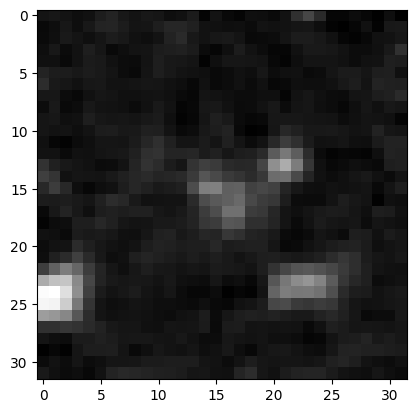

torch.Size([1, 5, 32, 32]) tensor([1.])


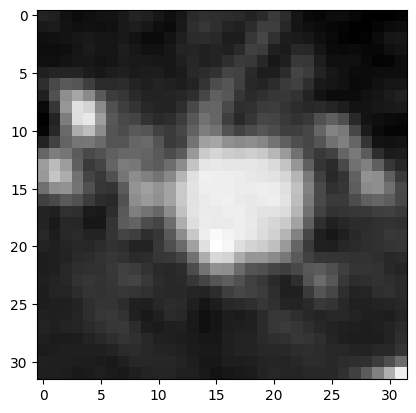

torch.Size([1, 5, 32, 32]) tensor([0.])


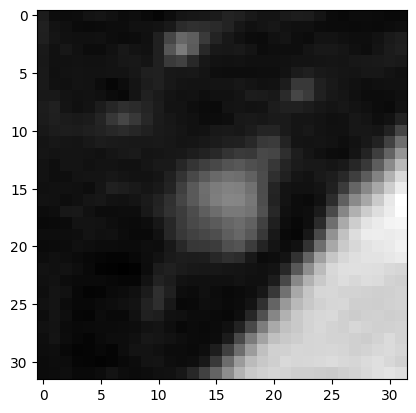

torch.Size([1, 5, 32, 32]) tensor([0.])


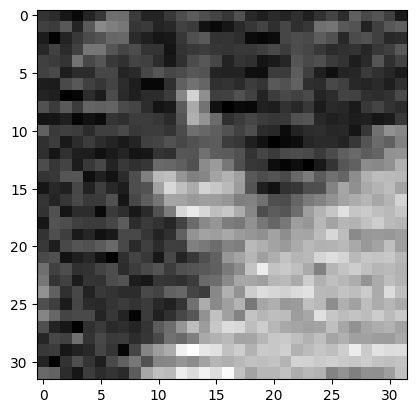

torch.Size([1, 5, 32, 32]) tensor([1.])


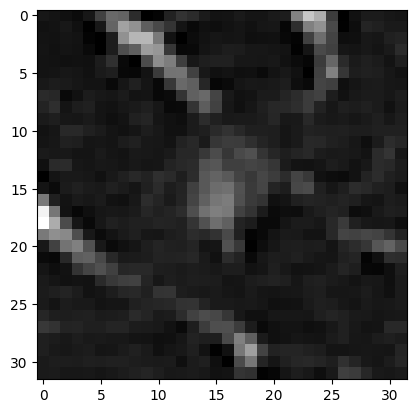

torch.Size([1, 5, 32, 32]) tensor([0.])


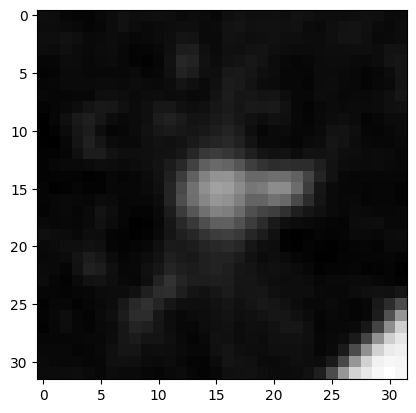

torch.Size([1, 5, 32, 32]) tensor([0.])


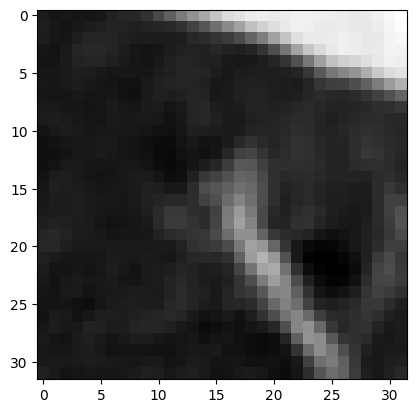

torch.Size([1, 5, 32, 32]) tensor([1.])


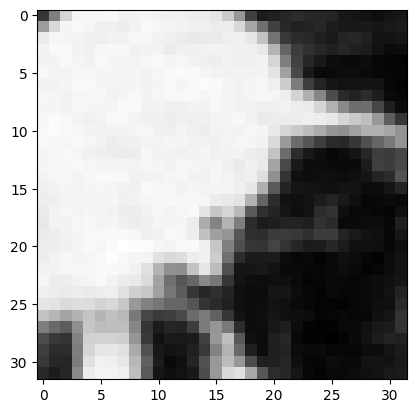

torch.Size([1, 5, 32, 32]) tensor([0.])


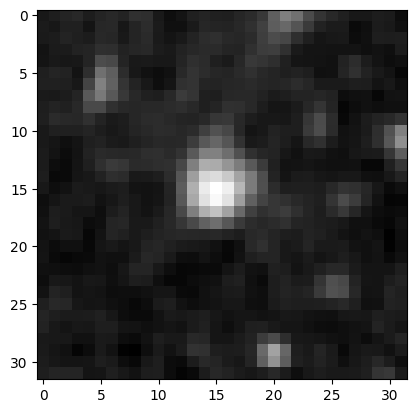

torch.Size([1, 5, 32, 32]) tensor([0.])


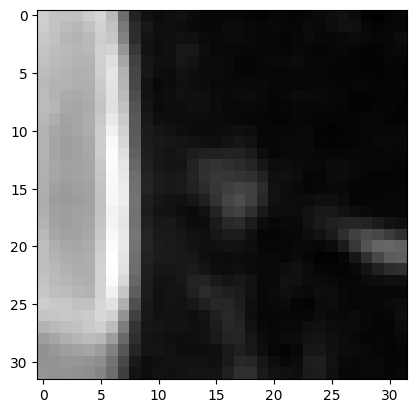

torch.Size([1, 5, 32, 32]) tensor([1.])


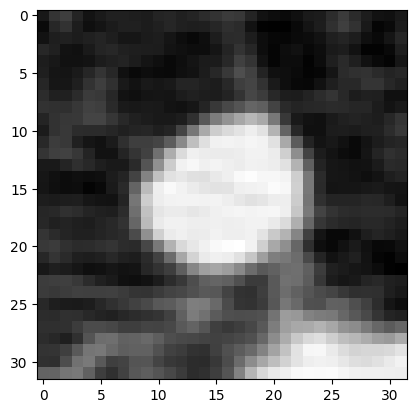

torch.Size([1, 5, 32, 32]) tensor([1.])


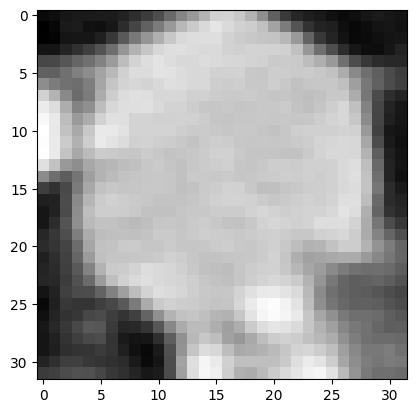

torch.Size([1, 5, 32, 32]) tensor([1.])


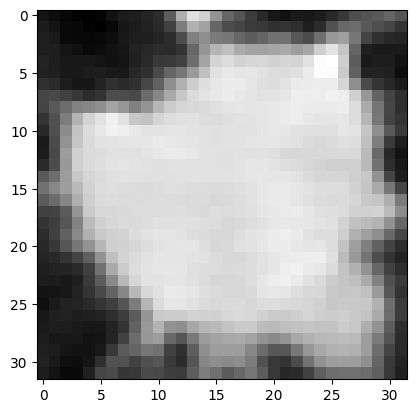

torch.Size([1, 5, 32, 32]) tensor([0.])


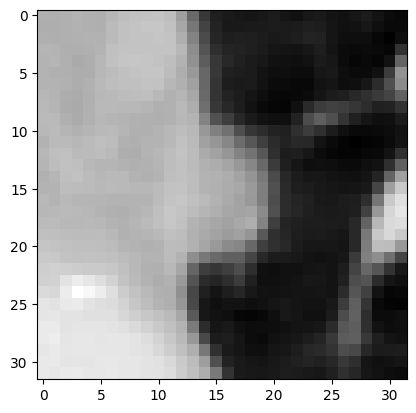

torch.Size([1, 5, 32, 32]) tensor([0.])


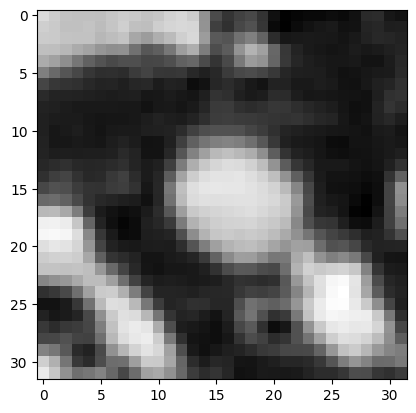

torch.Size([1, 5, 32, 32]) tensor([0.])


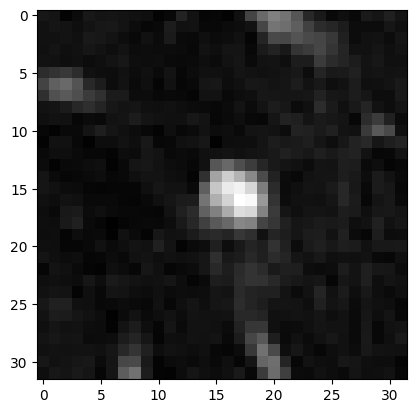

torch.Size([1, 5, 32, 32]) tensor([1.])


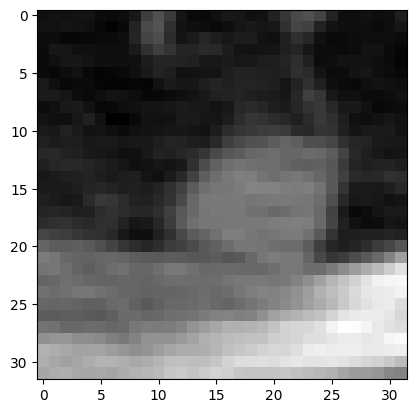

torch.Size([1, 5, 32, 32]) tensor([0.])


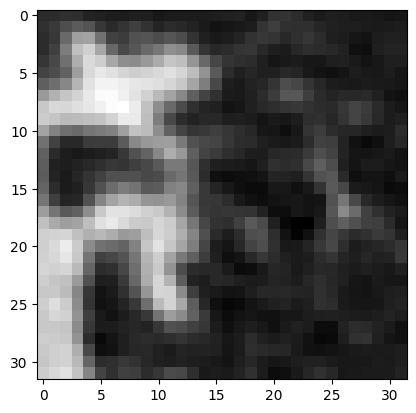

torch.Size([1, 5, 32, 32]) tensor([0.])


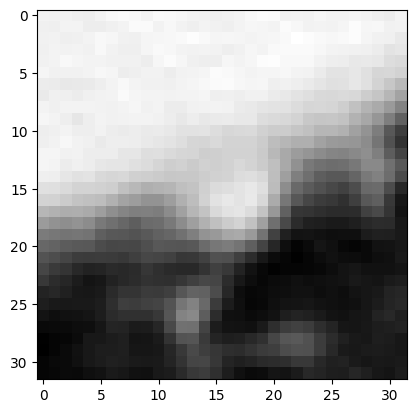

torch.Size([1, 5, 32, 32]) tensor([1.])


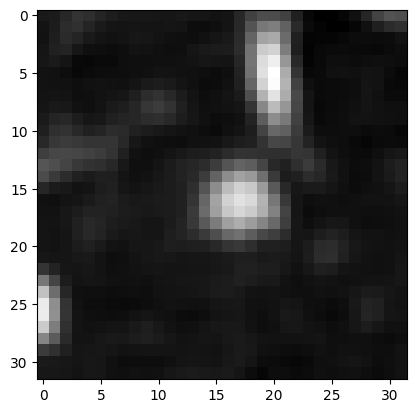

torch.Size([1, 5, 32, 32]) tensor([1.])


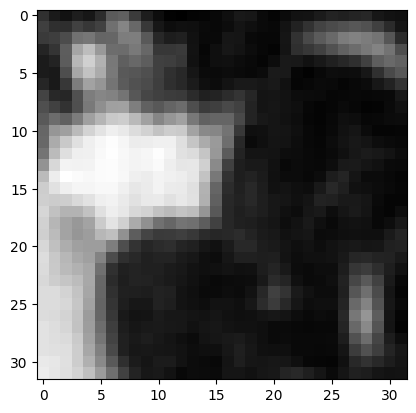

torch.Size([1, 5, 32, 32]) tensor([0.])


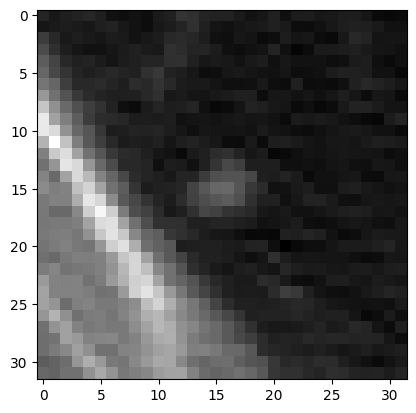

torch.Size([1, 5, 32, 32]) tensor([1.])


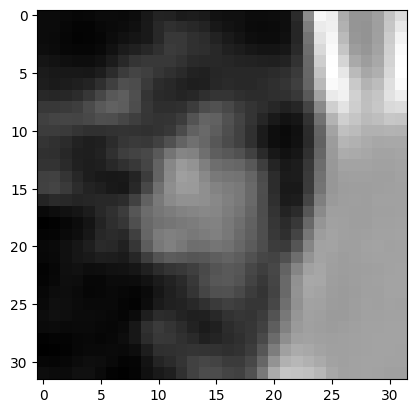

torch.Size([1, 5, 32, 32]) tensor([1.])


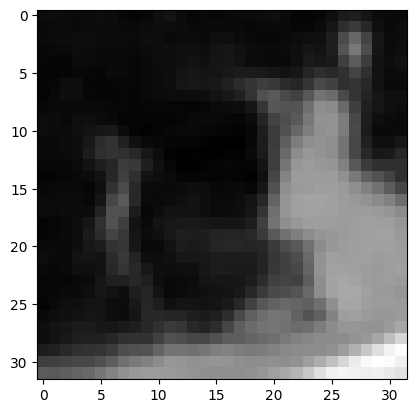

torch.Size([1, 5, 32, 32]) tensor([0.])


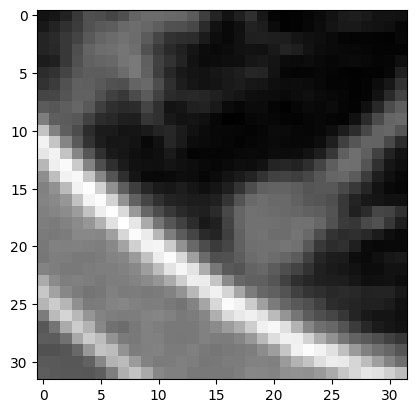

torch.Size([1, 5, 32, 32]) tensor([1.])


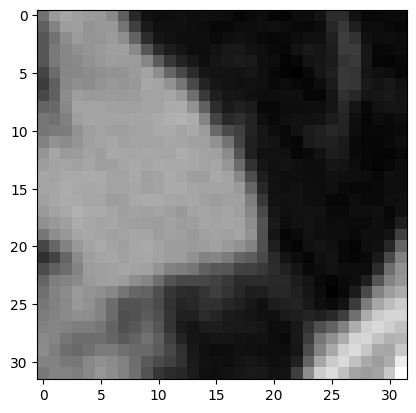

torch.Size([1, 5, 32, 32]) tensor([0.])


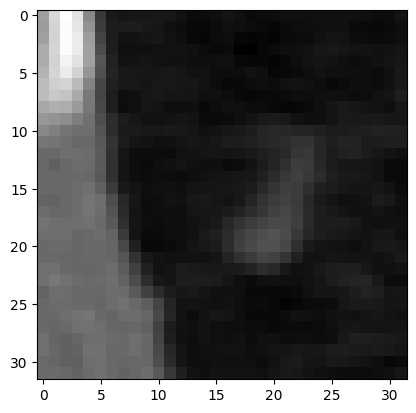

torch.Size([1, 5, 32, 32]) tensor([0.])


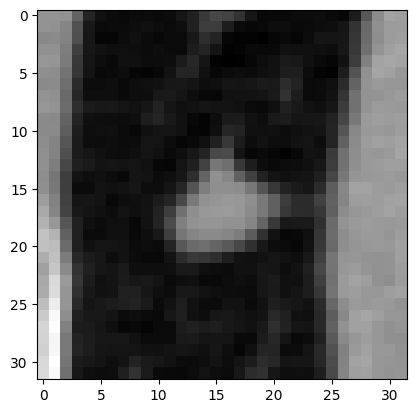

torch.Size([1, 5, 32, 32]) tensor([0.])


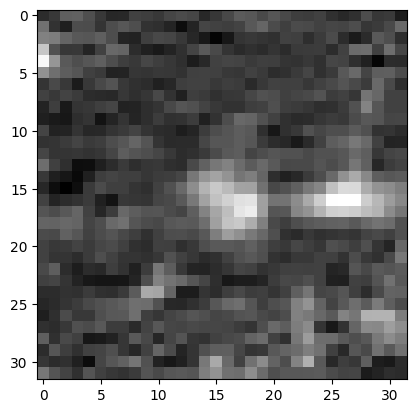

torch.Size([1, 5, 32, 32]) tensor([0.])


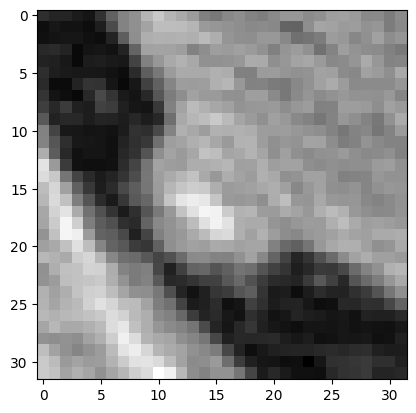

torch.Size([1, 5, 32, 32]) tensor([1.])


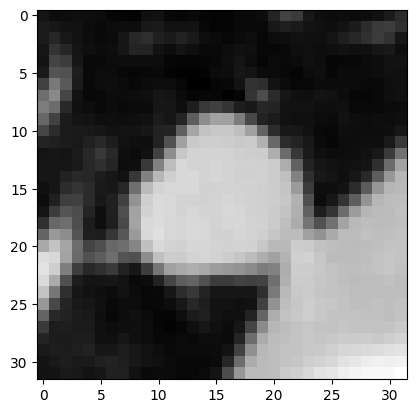

torch.Size([1, 5, 32, 32]) tensor([0.])


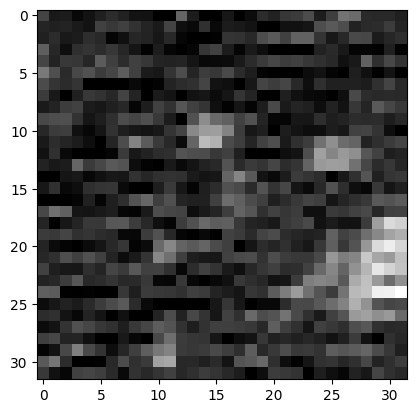

torch.Size([1, 5, 32, 32]) tensor([0.])


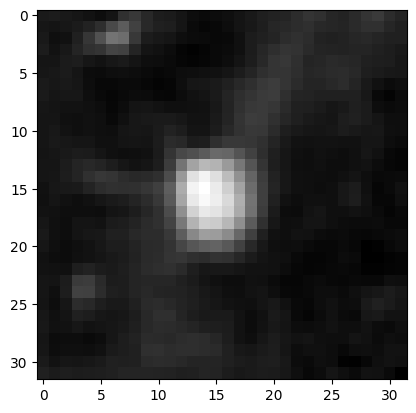

torch.Size([1, 5, 32, 32]) tensor([1.])


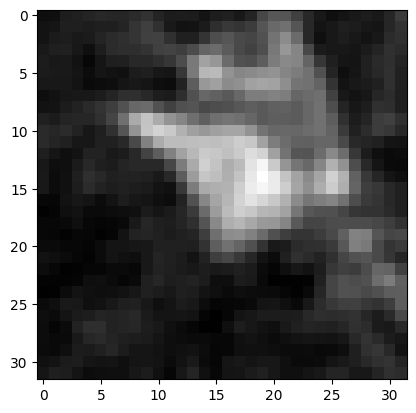

torch.Size([1, 5, 32, 32]) tensor([0.])


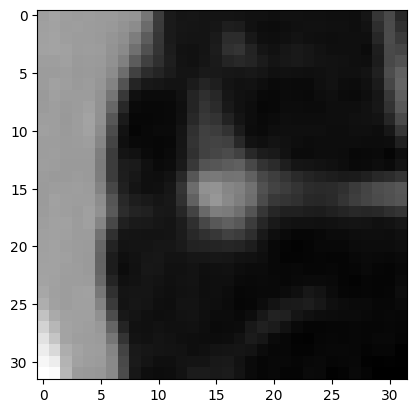

torch.Size([1, 5, 32, 32]) tensor([0.])


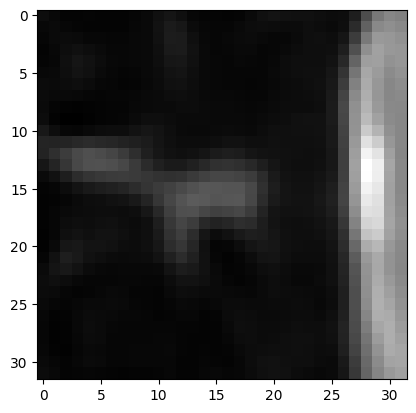

torch.Size([1, 5, 32, 32]) tensor([1.])


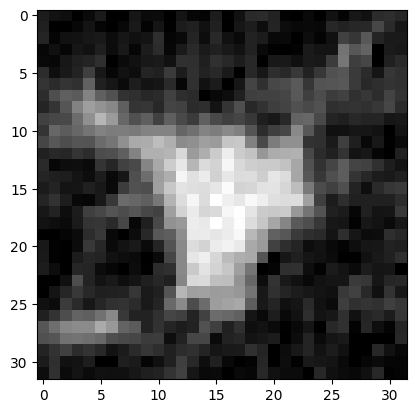

torch.Size([1, 5, 32, 32]) tensor([1.])


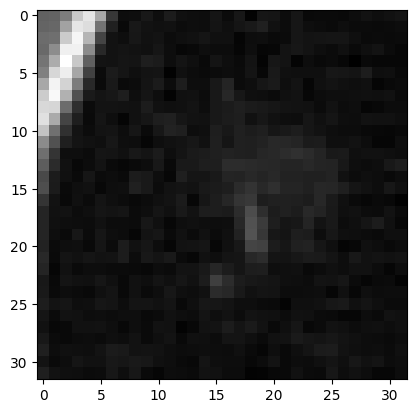

torch.Size([1, 5, 32, 32]) tensor([0.])


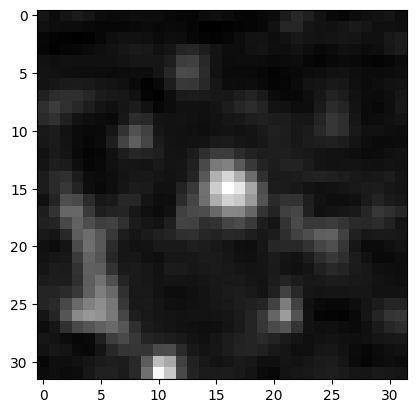

torch.Size([1, 5, 32, 32]) tensor([0.])


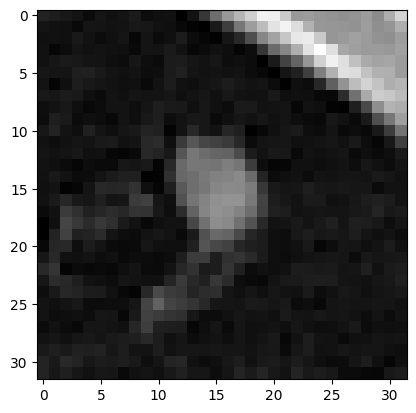

torch.Size([1, 5, 32, 32]) tensor([1.])


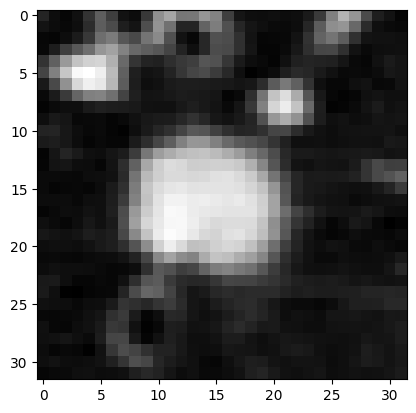

torch.Size([1, 5, 32, 32]) tensor([1.])


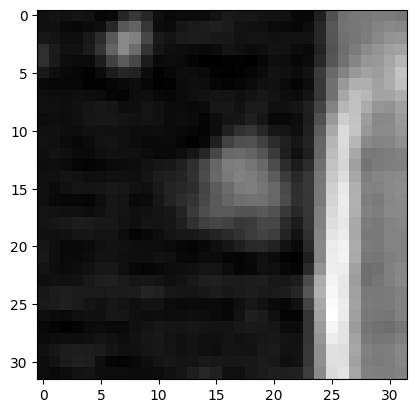

torch.Size([1, 5, 32, 32]) tensor([0.])


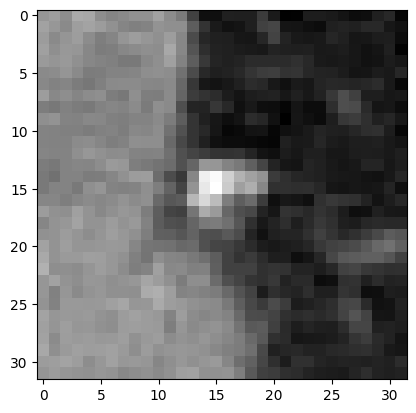

torch.Size([1, 5, 32, 32]) tensor([0.])


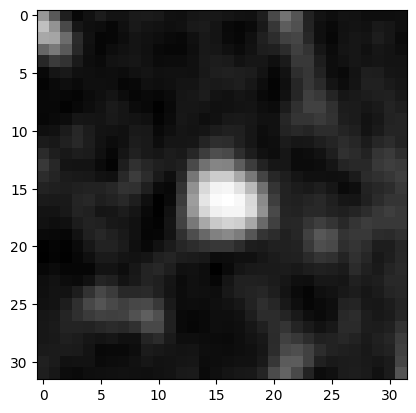

torch.Size([1, 5, 32, 32]) tensor([1.])


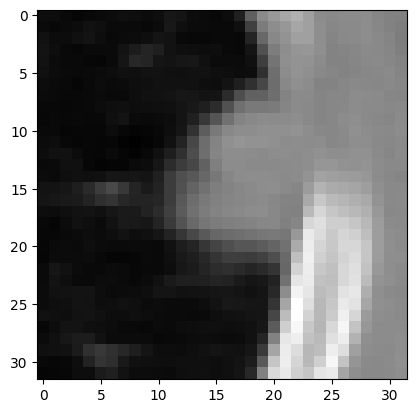

torch.Size([1, 5, 32, 32]) tensor([0.])


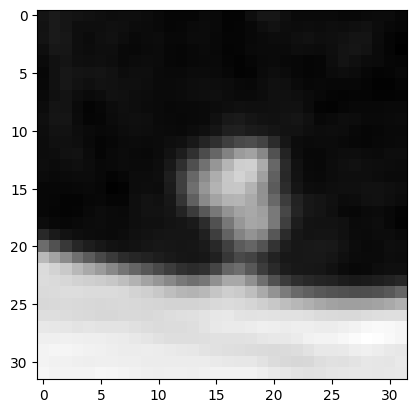

torch.Size([1, 5, 32, 32]) tensor([1.])


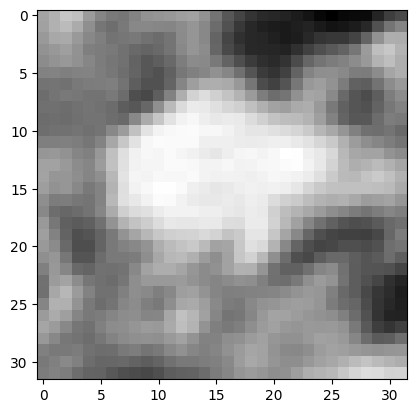

torch.Size([1, 5, 32, 32]) tensor([0.])


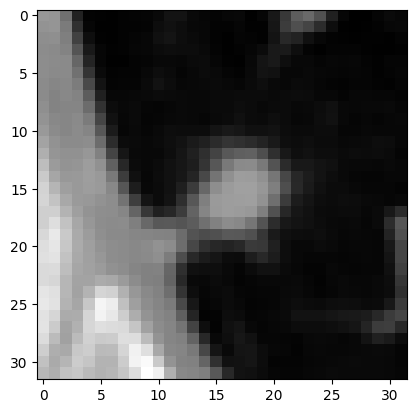

torch.Size([1, 5, 32, 32]) tensor([1.])


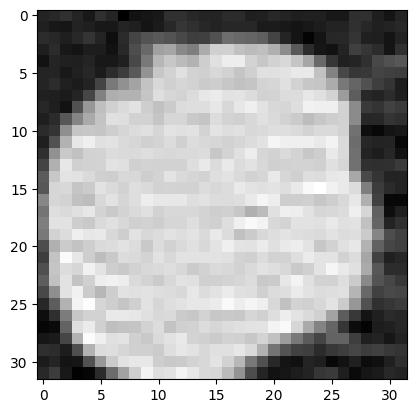

torch.Size([1, 5, 32, 32]) tensor([0.])


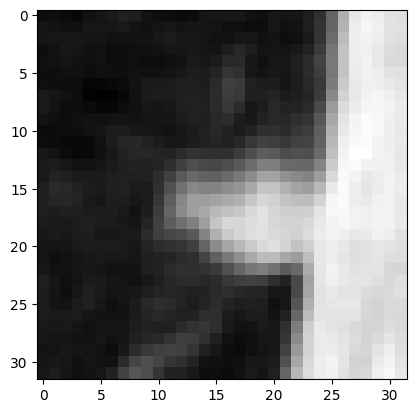

torch.Size([1, 5, 32, 32]) tensor([0.])


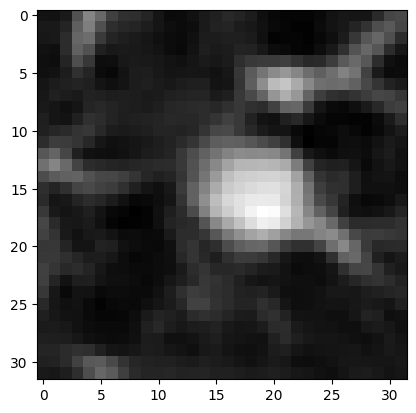

torch.Size([1, 5, 32, 32]) tensor([0.])


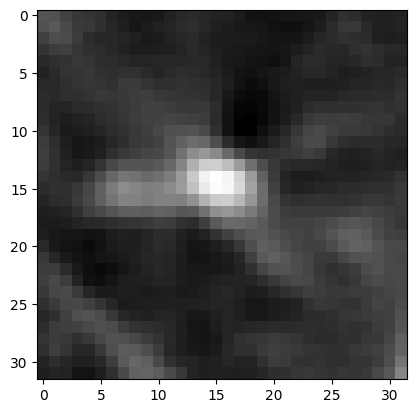

torch.Size([1, 5, 32, 32]) tensor([0.])


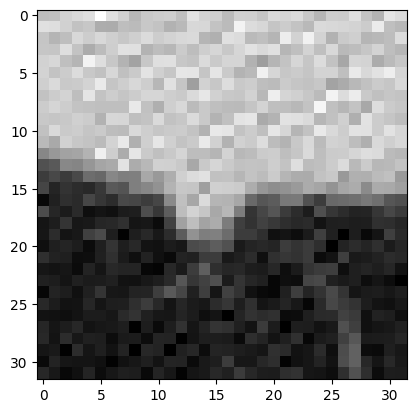

torch.Size([1, 5, 32, 32]) tensor([1.])


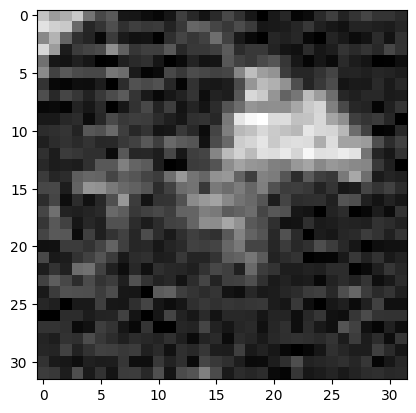

torch.Size([1, 5, 32, 32]) tensor([0.])


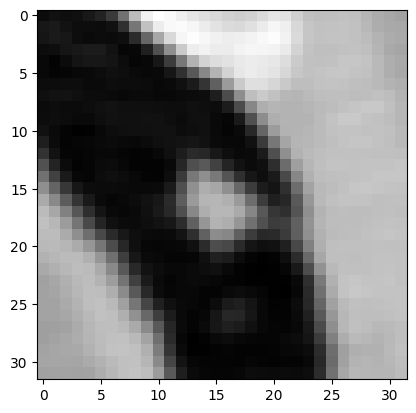

torch.Size([1, 5, 32, 32]) tensor([0.])


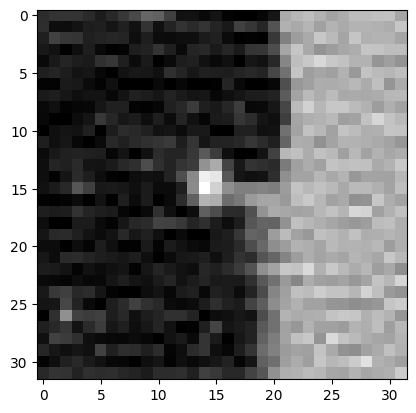

torch.Size([1, 5, 32, 32]) tensor([0.])


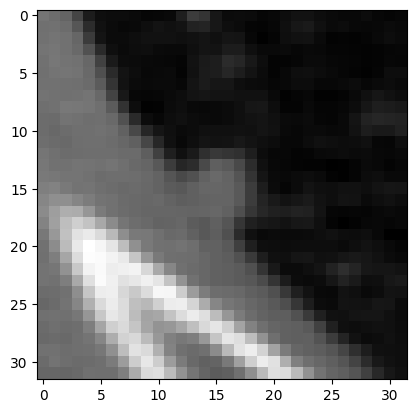

torch.Size([1, 5, 32, 32]) tensor([0.])


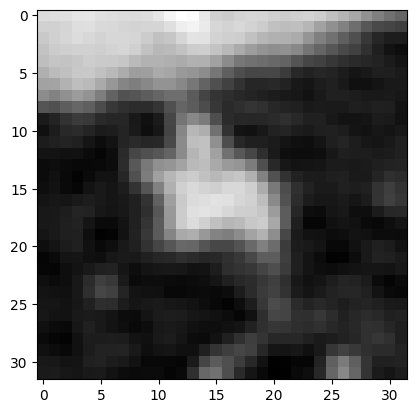

torch.Size([1, 5, 32, 32]) tensor([1.])


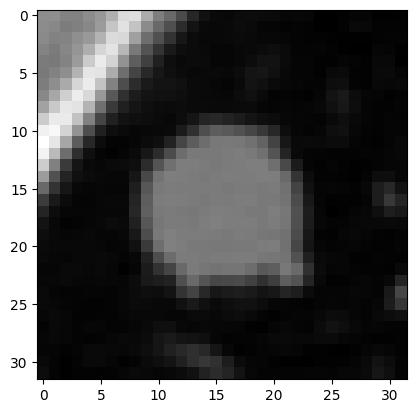

torch.Size([1, 5, 32, 32]) tensor([1.])


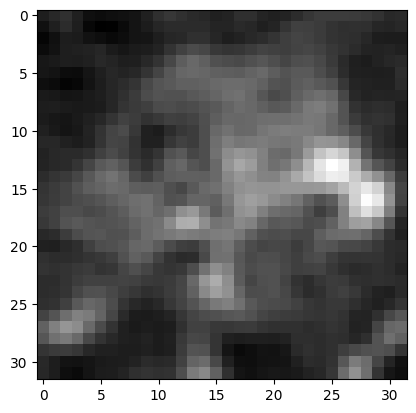

torch.Size([1, 5, 32, 32]) tensor([0.])


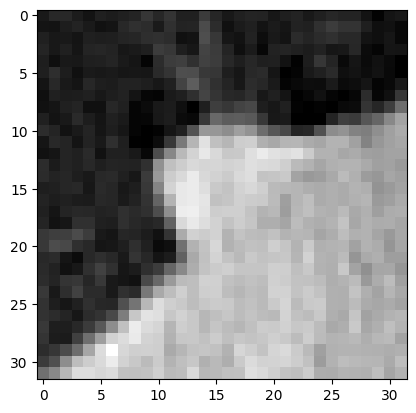

torch.Size([1, 5, 32, 32]) tensor([0.])


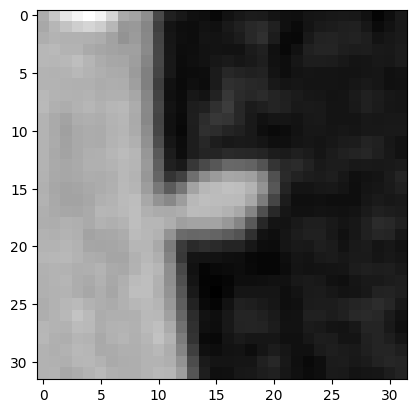

torch.Size([1, 5, 32, 32]) tensor([1.])


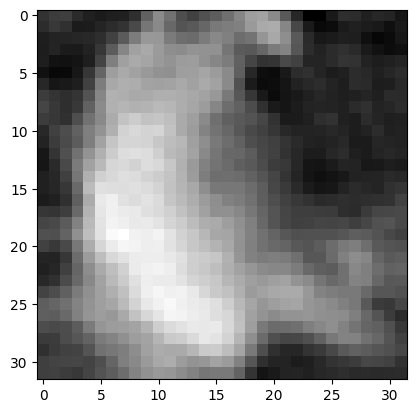

torch.Size([1, 5, 32, 32]) tensor([0.])


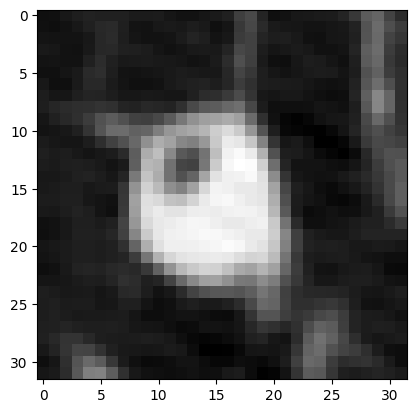

torch.Size([1, 5, 32, 32]) tensor([1.])


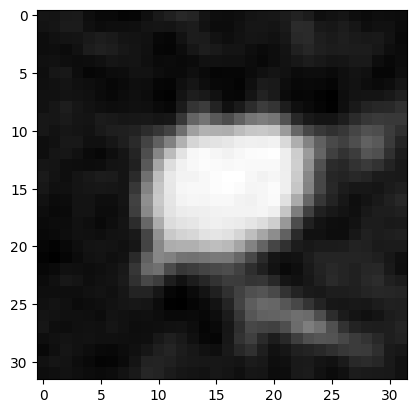

torch.Size([1, 5, 32, 32]) tensor([1.])


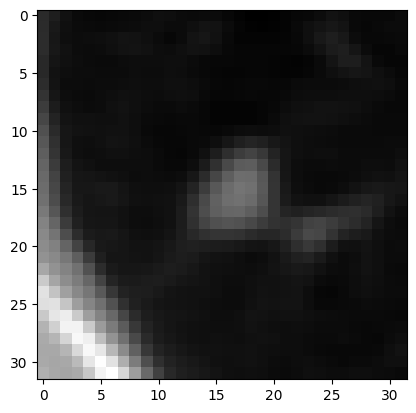

torch.Size([1, 5, 32, 32]) tensor([0.])


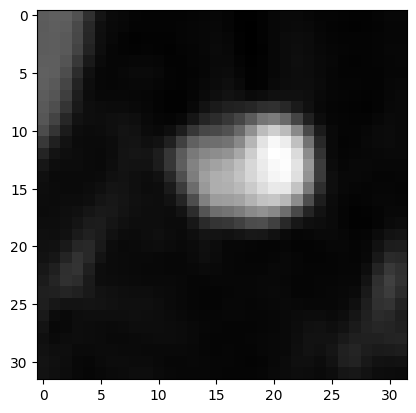

torch.Size([1, 5, 32, 32]) tensor([0.])


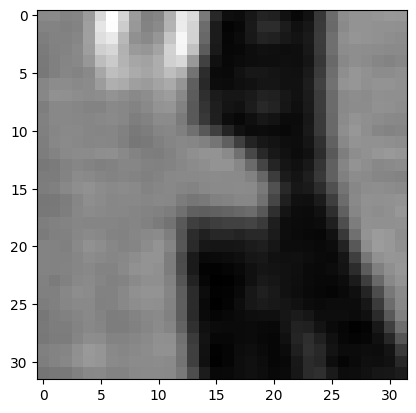

torch.Size([1, 5, 32, 32]) tensor([0.])


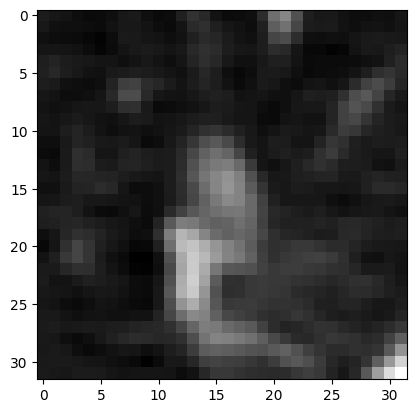

torch.Size([1, 5, 32, 32]) tensor([0.])


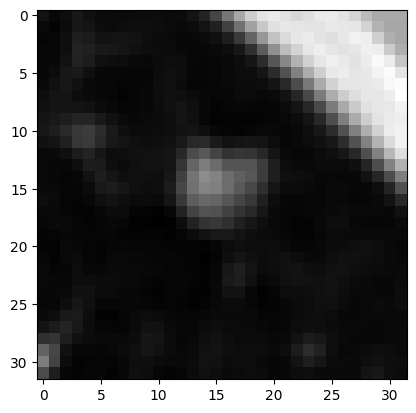

torch.Size([1, 5, 32, 32]) tensor([1.])


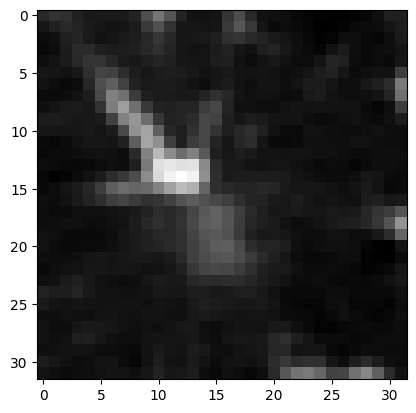

torch.Size([1, 5, 32, 32]) tensor([0.])


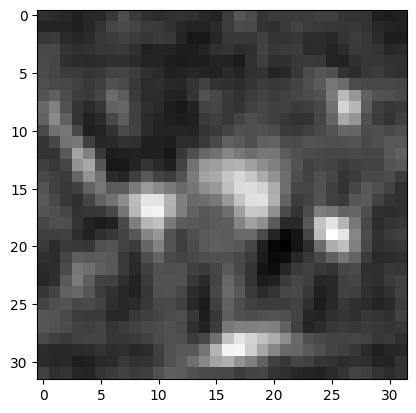

torch.Size([1, 5, 32, 32]) tensor([0.])


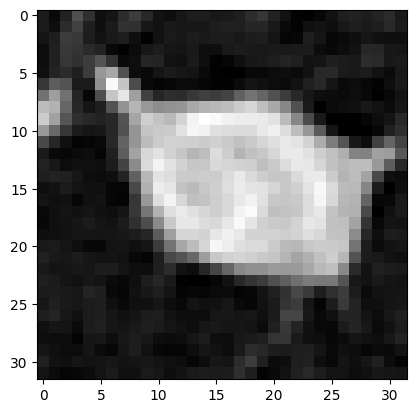

torch.Size([1, 5, 32, 32]) tensor([0.])


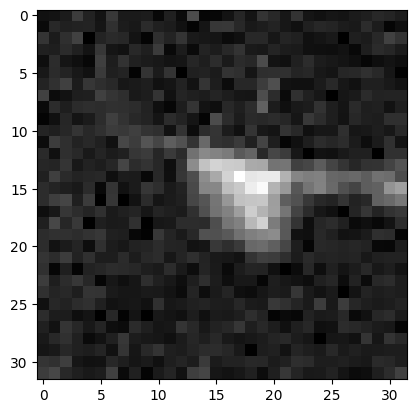

torch.Size([1, 5, 32, 32]) tensor([1.])


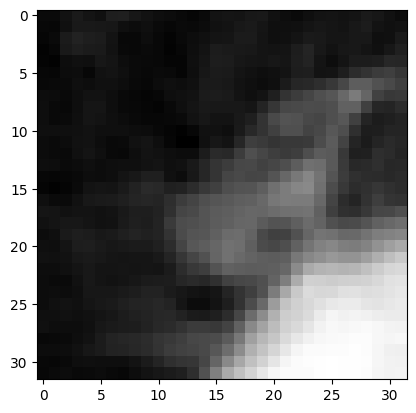

torch.Size([1, 5, 32, 32]) tensor([0.])


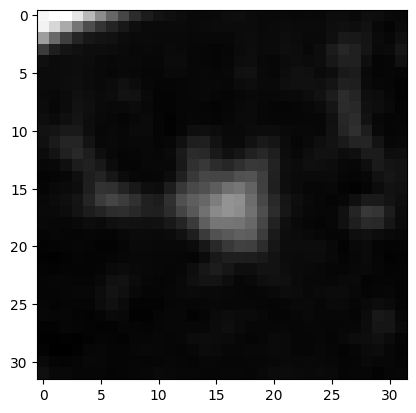

torch.Size([1, 5, 32, 32]) tensor([1.])


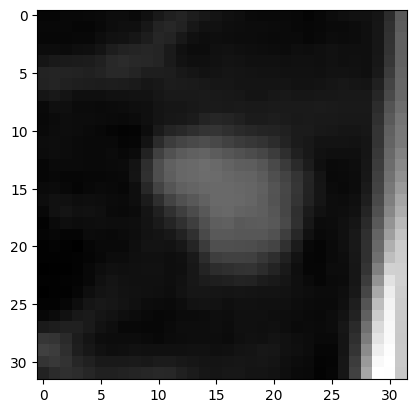

torch.Size([1, 5, 32, 32]) tensor([0.])


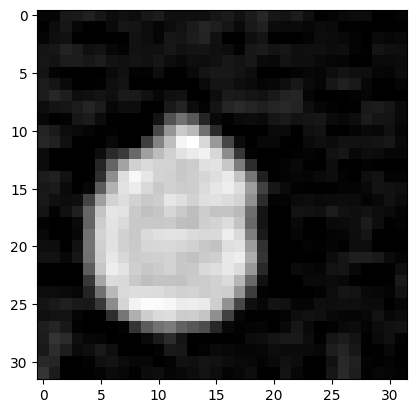

torch.Size([1, 5, 32, 32]) tensor([0.])


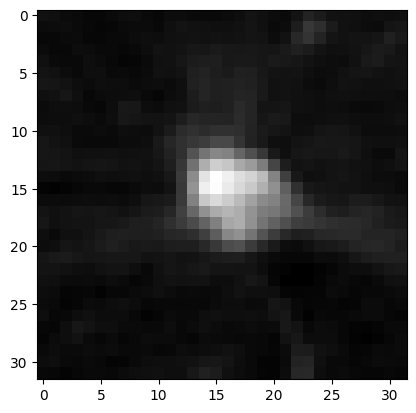

torch.Size([1, 5, 32, 32]) tensor([0.])


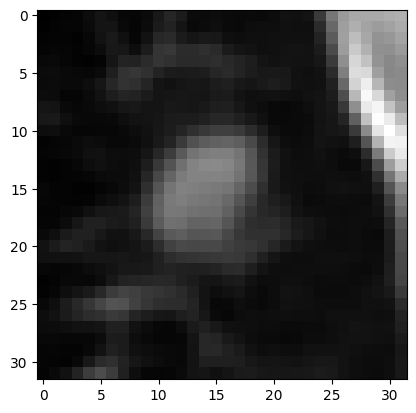

torch.Size([1, 5, 32, 32]) tensor([1.])


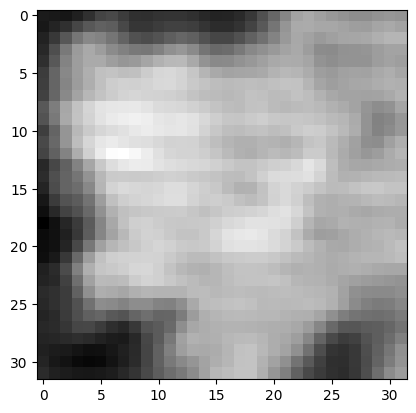

torch.Size([1, 5, 32, 32]) tensor([0.])


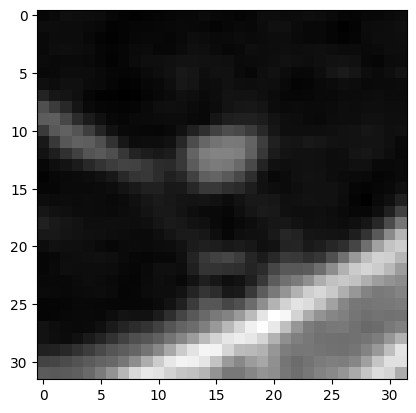

torch.Size([1, 5, 32, 32]) tensor([0.])


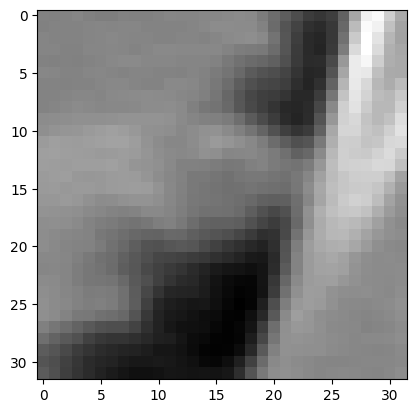

torch.Size([1, 5, 32, 32]) tensor([1.])


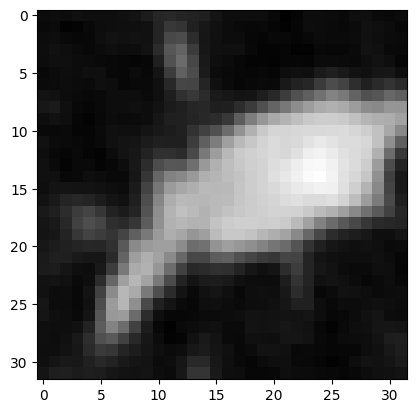

torch.Size([1, 5, 32, 32]) tensor([0.])


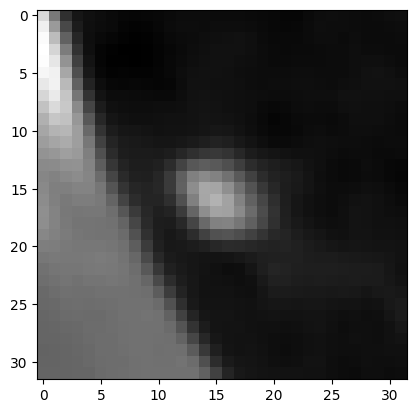

torch.Size([1, 5, 32, 32]) tensor([0.])


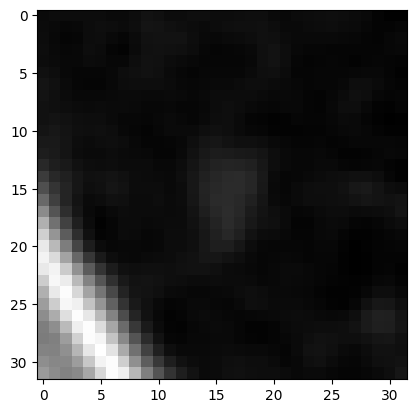

torch.Size([1, 5, 32, 32]) tensor([1.])


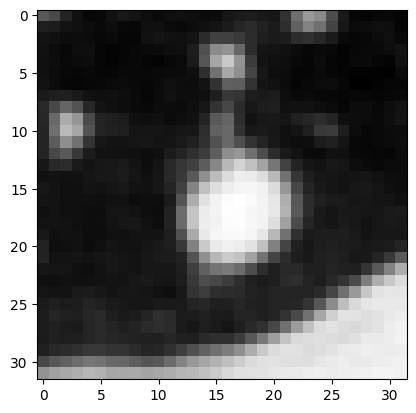

torch.Size([1, 5, 32, 32]) tensor([0.])


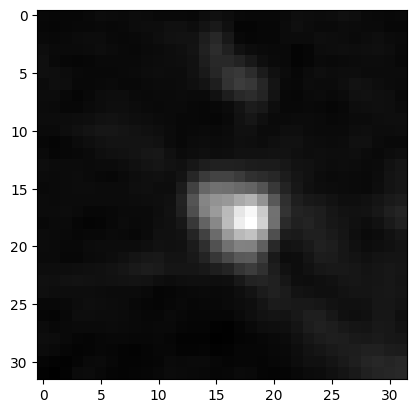

torch.Size([1, 5, 32, 32]) tensor([0.])


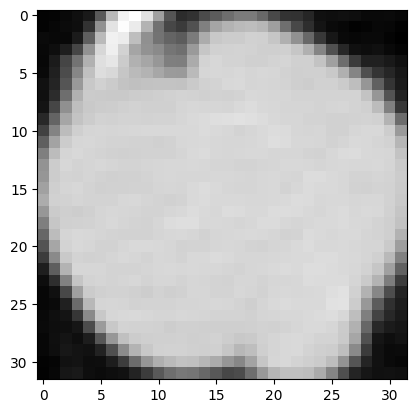

torch.Size([1, 5, 32, 32]) tensor([0.])


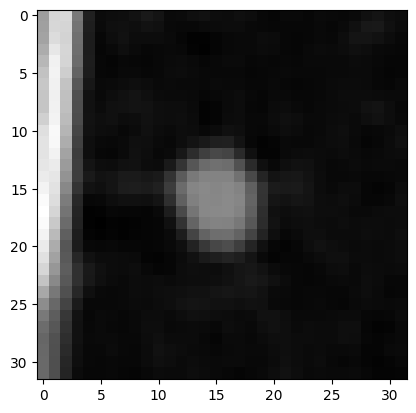

torch.Size([1, 5, 32, 32]) tensor([0.])


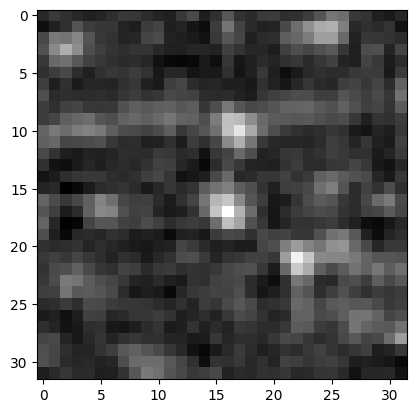

torch.Size([1, 5, 32, 32]) tensor([0.])


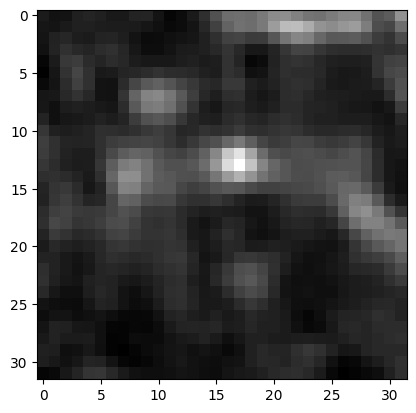

torch.Size([1, 5, 32, 32]) tensor([1.])


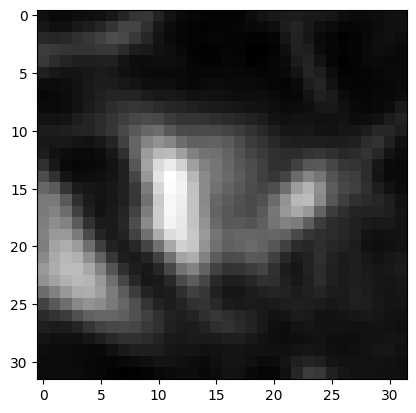

torch.Size([1, 5, 32, 32]) tensor([1.])


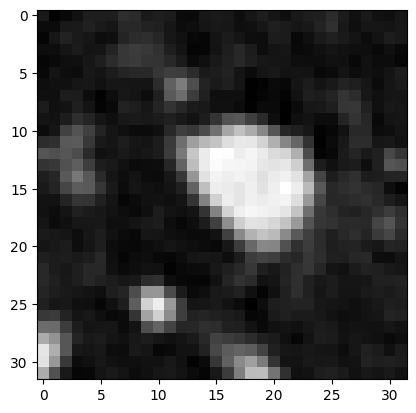

torch.Size([1, 5, 32, 32]) tensor([0.])


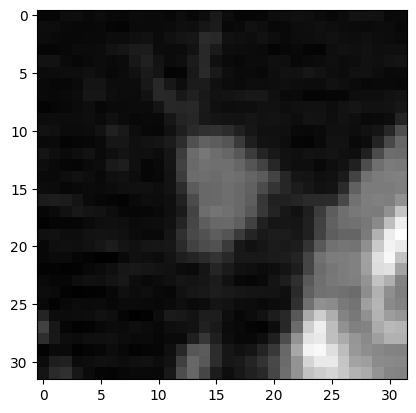

torch.Size([1, 5, 32, 32]) tensor([0.])


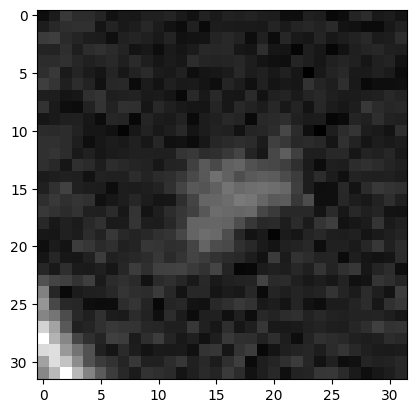

torch.Size([1, 5, 32, 32]) tensor([0.])


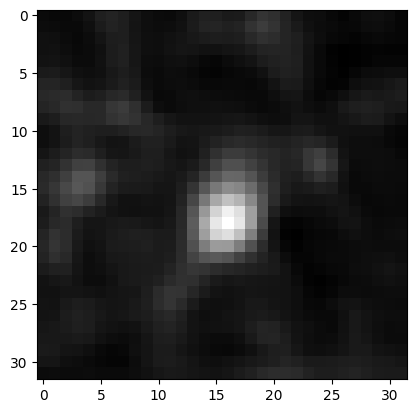

torch.Size([1, 5, 32, 32]) tensor([1.])


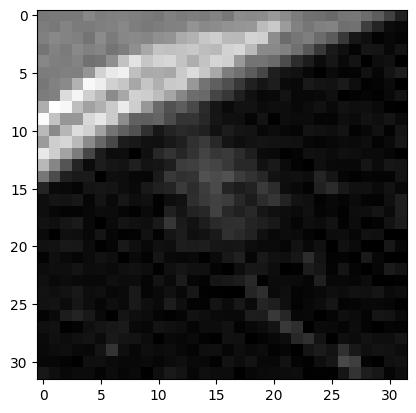

torch.Size([1, 5, 32, 32]) tensor([1.])


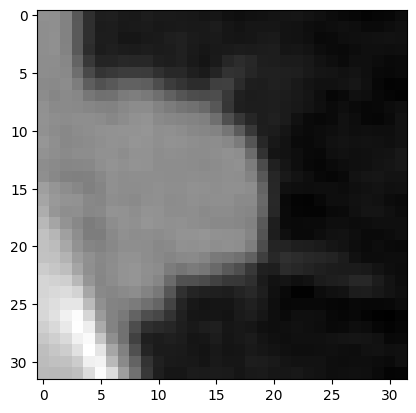

torch.Size([1, 5, 32, 32]) tensor([1.])


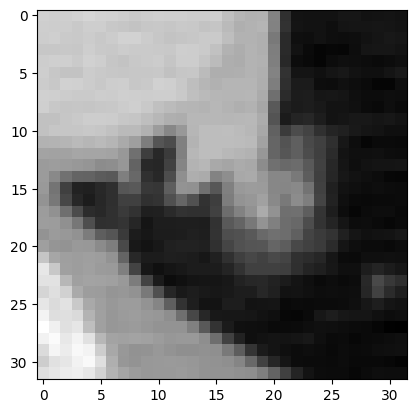

torch.Size([1, 5, 32, 32]) tensor([0.])


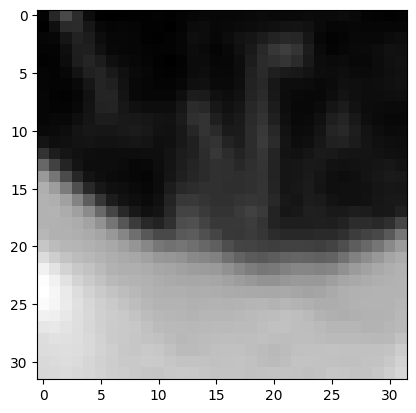

torch.Size([1, 5, 32, 32]) tensor([1.])


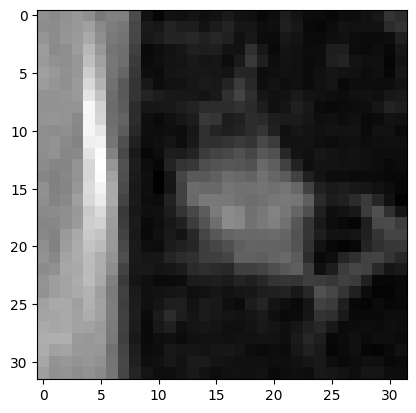

torch.Size([1, 5, 32, 32]) tensor([1.])


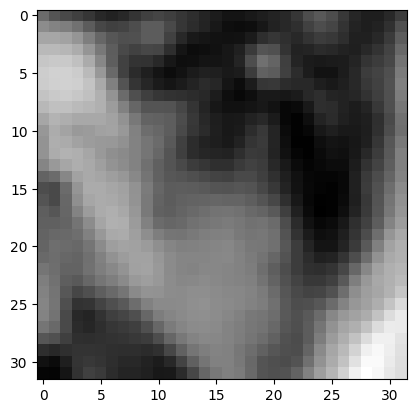

torch.Size([1, 5, 32, 32]) tensor([0.])


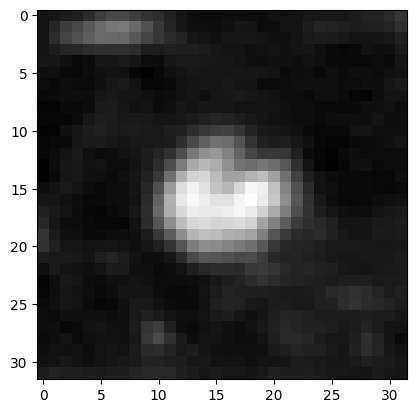

torch.Size([1, 5, 32, 32]) tensor([1.])


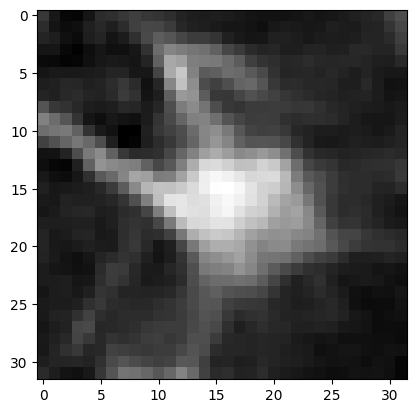

torch.Size([1, 5, 32, 32]) tensor([0.])


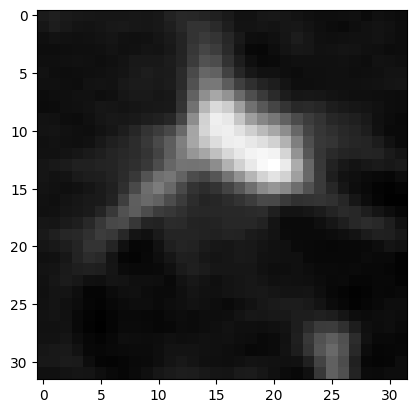

torch.Size([1, 5, 32, 32]) tensor([1.])


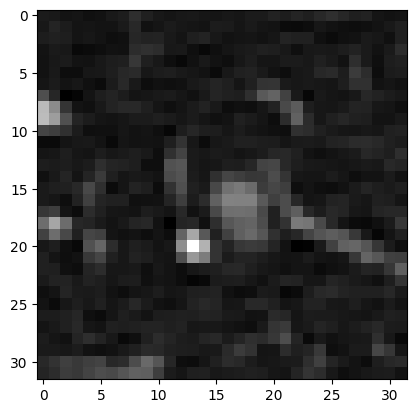

torch.Size([1, 5, 32, 32]) tensor([1.])


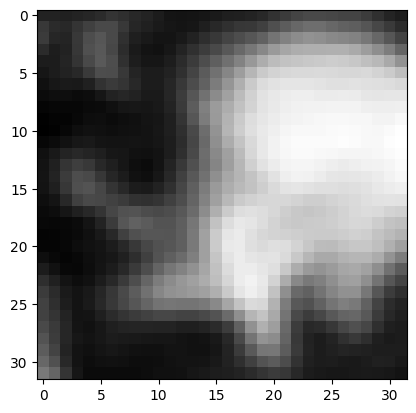

torch.Size([1, 5, 32, 32]) tensor([0.])


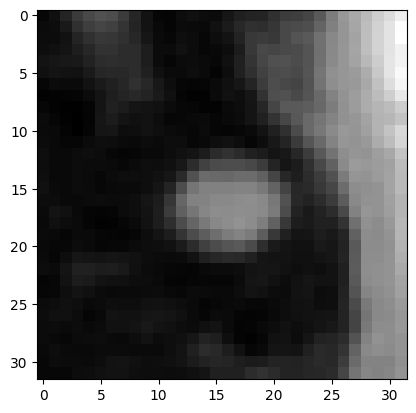

torch.Size([1, 5, 32, 32]) tensor([1.])


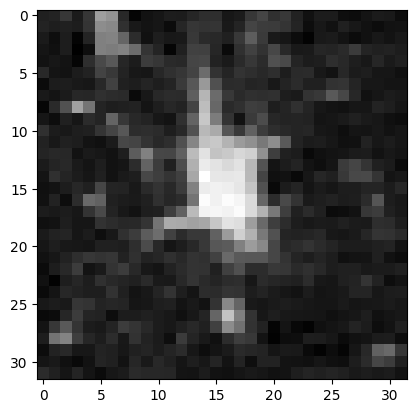

torch.Size([1, 5, 32, 32]) tensor([0.])


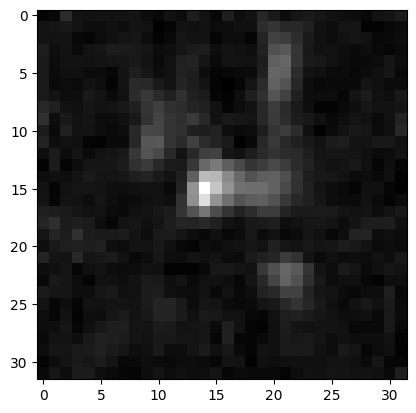

torch.Size([1, 5, 32, 32]) tensor([0.])


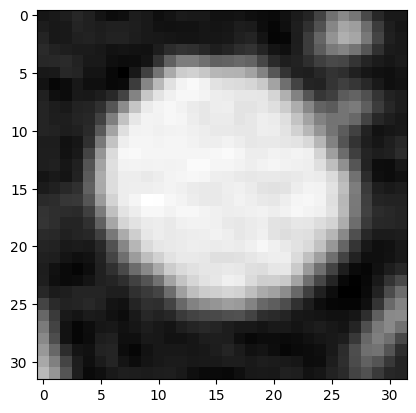

torch.Size([1, 5, 32, 32]) tensor([0.])


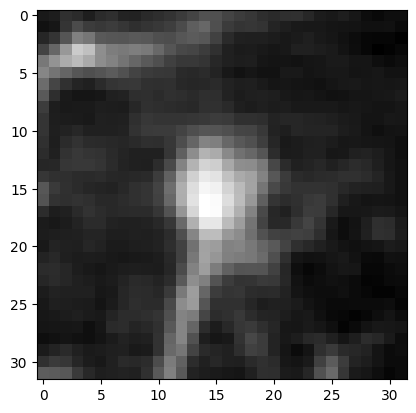

torch.Size([1, 5, 32, 32]) tensor([1.])


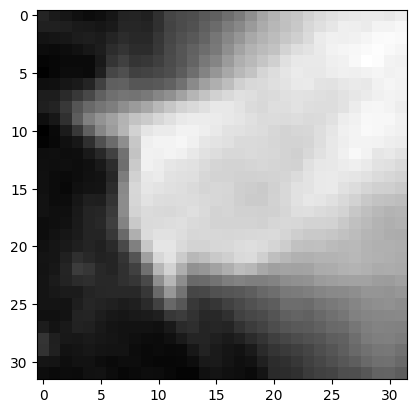

torch.Size([1, 5, 32, 32]) tensor([1.])


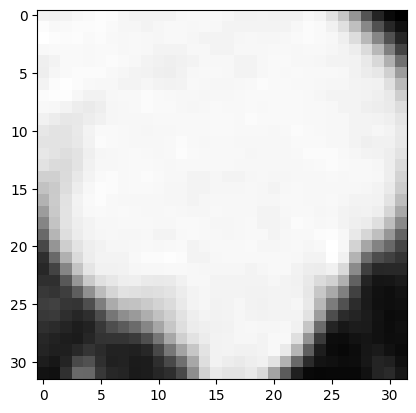

torch.Size([1, 5, 32, 32]) tensor([0.])


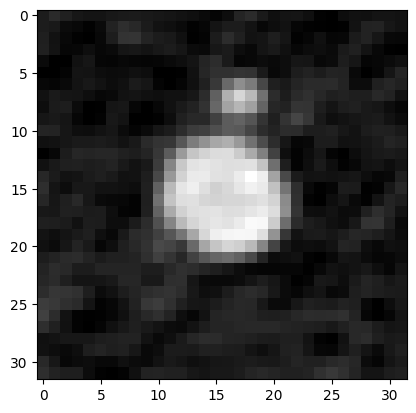

torch.Size([1, 5, 32, 32]) tensor([0.])


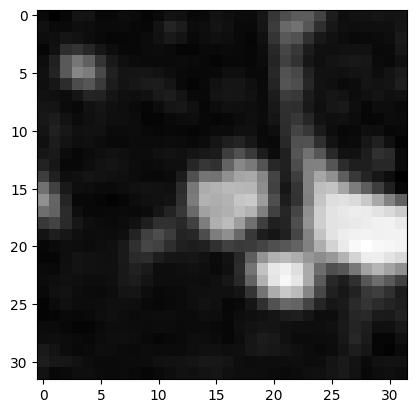

torch.Size([1, 5, 32, 32]) tensor([1.])


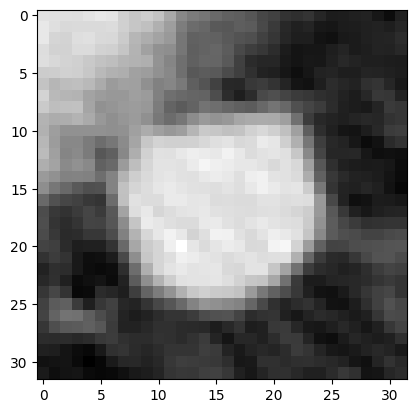

torch.Size([1, 5, 32, 32]) tensor([1.])


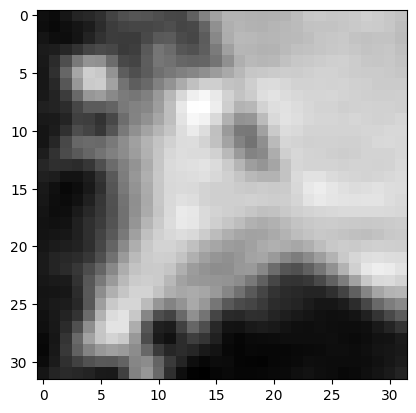

torch.Size([1, 5, 32, 32]) tensor([1.])


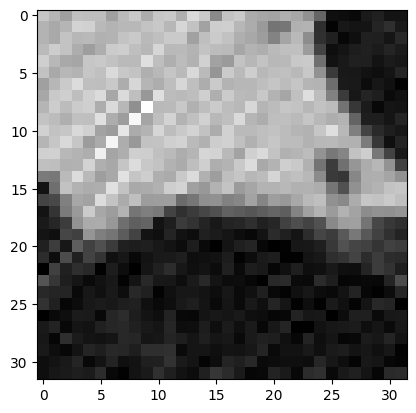

torch.Size([1, 5, 32, 32]) tensor([0.])


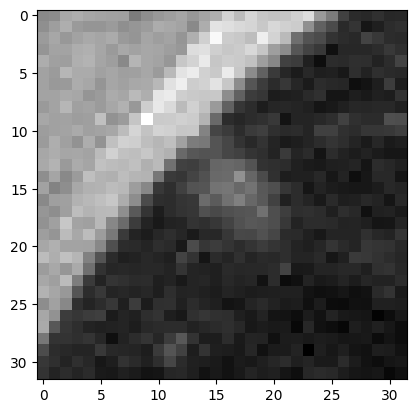

torch.Size([1, 5, 32, 32]) tensor([1.])


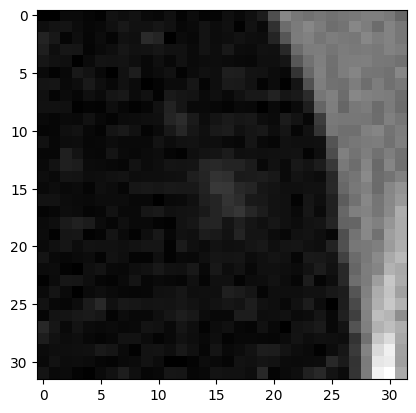

torch.Size([1, 5, 32, 32]) tensor([0.])


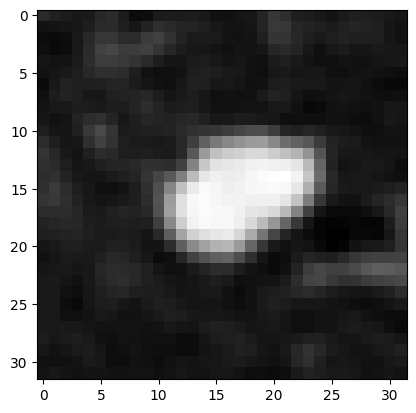

torch.Size([1, 5, 32, 32]) tensor([1.])


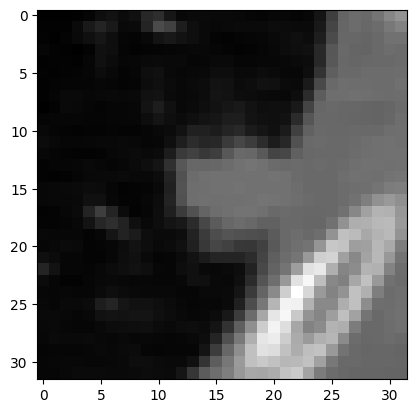

torch.Size([1, 5, 32, 32]) tensor([0.])


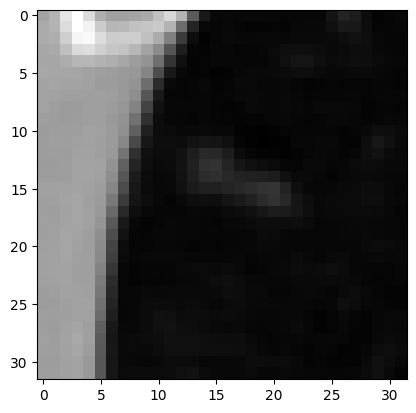

torch.Size([1, 5, 32, 32]) tensor([0.])


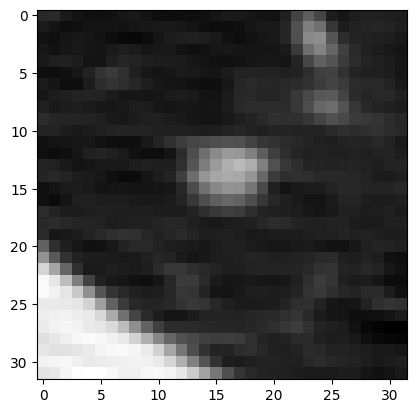

torch.Size([1, 5, 32, 32]) tensor([0.])


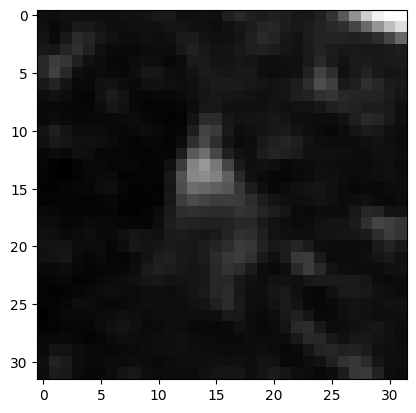

torch.Size([1, 5, 32, 32]) tensor([1.])


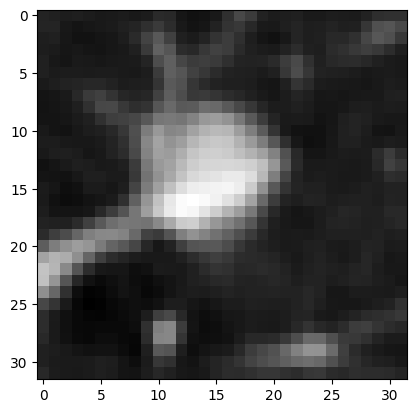

torch.Size([1, 5, 32, 32]) tensor([1.])


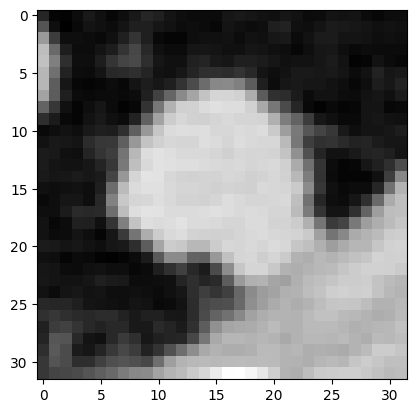

torch.Size([1, 5, 32, 32]) tensor([0.])


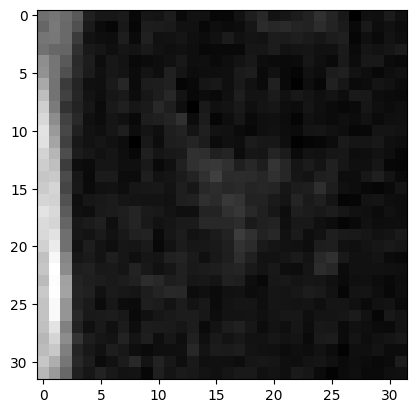

torch.Size([1, 5, 32, 32]) tensor([1.])


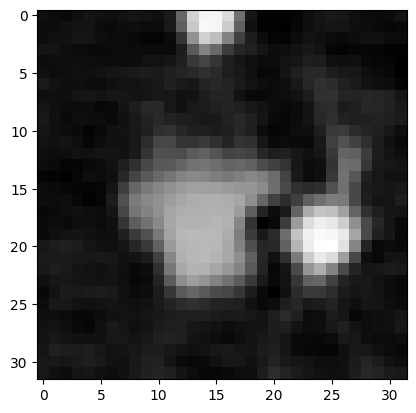

torch.Size([1, 5, 32, 32]) tensor([0.])


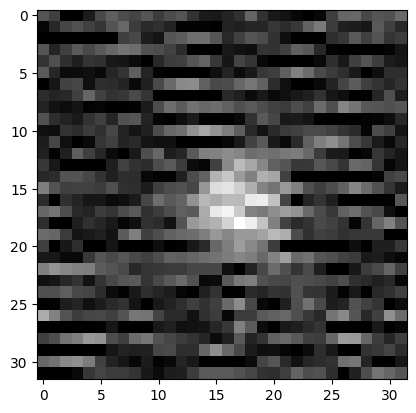

torch.Size([1, 5, 32, 32]) tensor([0.])


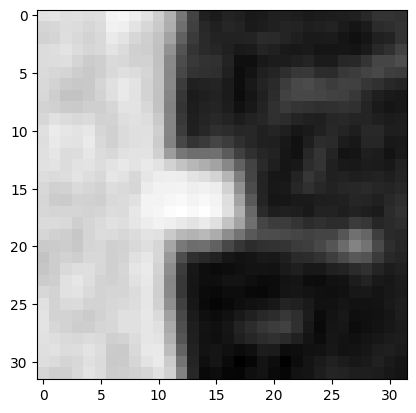

torch.Size([1, 5, 32, 32]) tensor([0.])


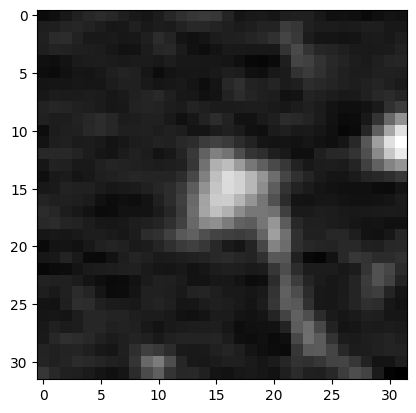

torch.Size([1, 5, 32, 32]) tensor([0.])


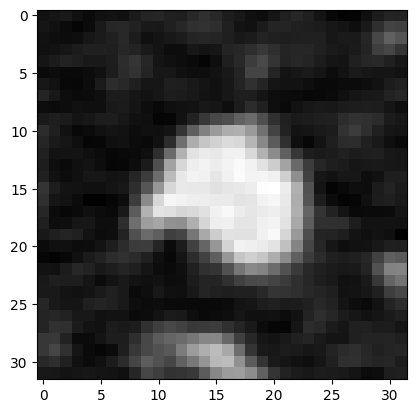

torch.Size([1, 5, 32, 32]) tensor([1.])


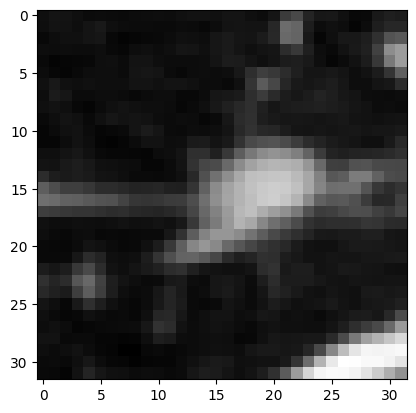

torch.Size([1, 5, 32, 32]) tensor([0.])


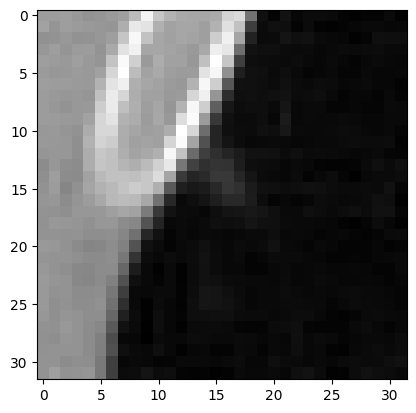

torch.Size([1, 5, 32, 32]) tensor([1.])


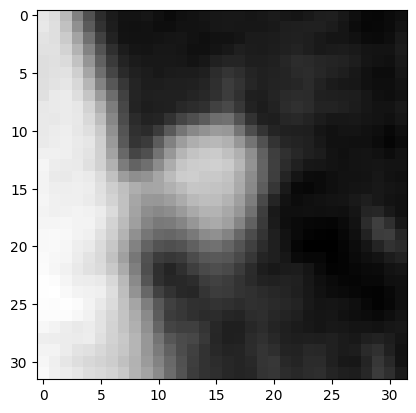

torch.Size([1, 5, 32, 32]) tensor([0.])


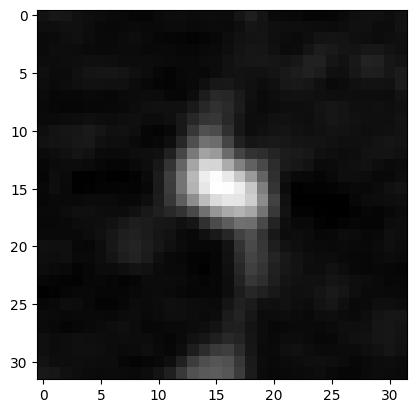

torch.Size([1, 5, 32, 32]) tensor([0.])


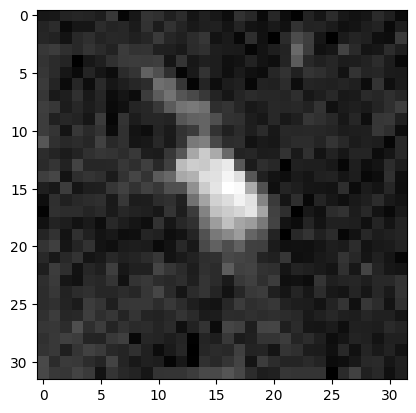

torch.Size([1, 5, 32, 32]) tensor([0.])


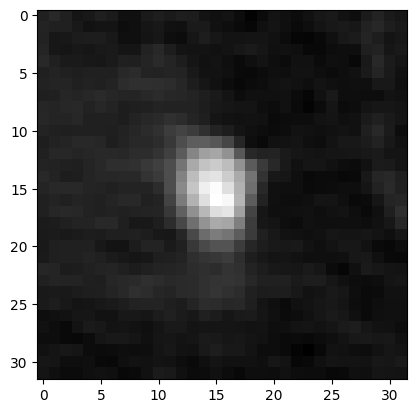

torch.Size([1, 5, 32, 32]) tensor([0.])


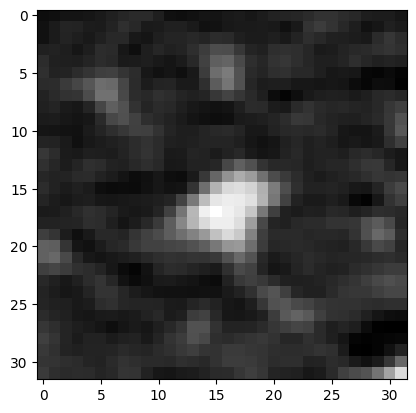

torch.Size([1, 5, 32, 32]) tensor([0.])


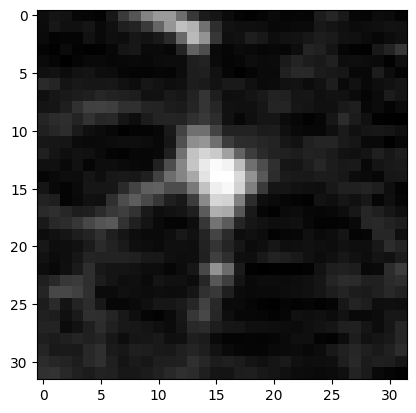

torch.Size([1, 5, 32, 32]) tensor([1.])


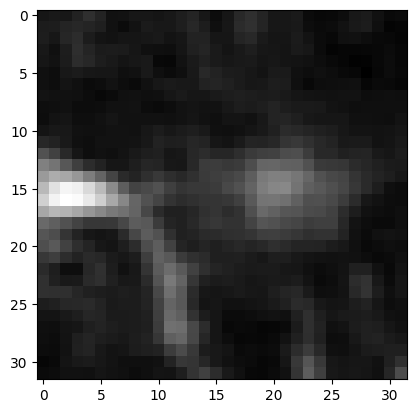

torch.Size([1, 5, 32, 32]) tensor([1.])


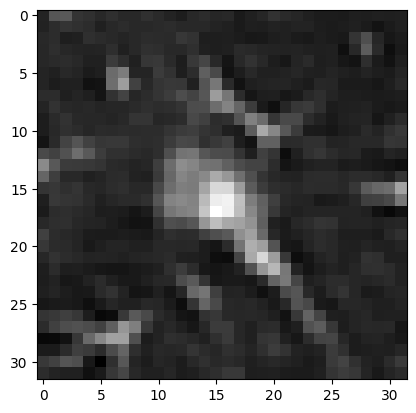

torch.Size([1, 5, 32, 32]) tensor([1.])


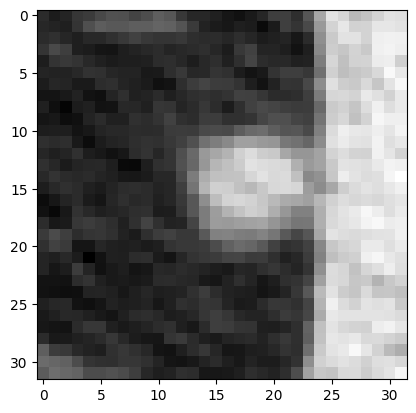

torch.Size([1, 5, 32, 32]) tensor([1.])


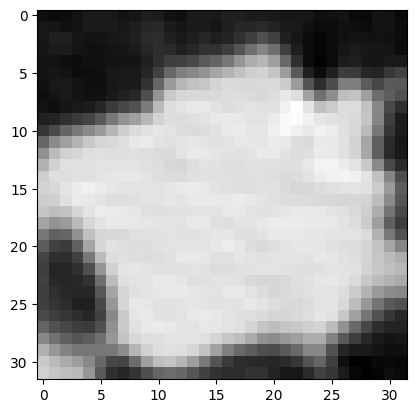

torch.Size([1, 5, 32, 32]) tensor([0.])


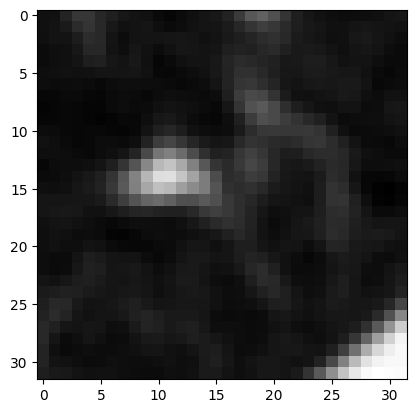

torch.Size([1, 5, 32, 32]) tensor([0.])


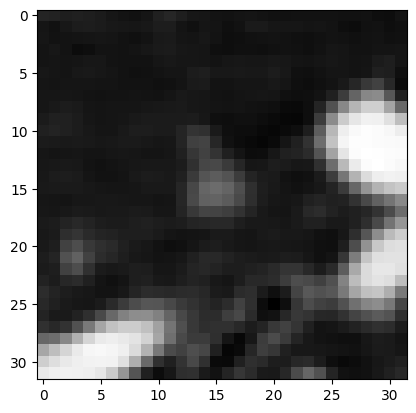

torch.Size([1, 5, 32, 32]) tensor([1.])


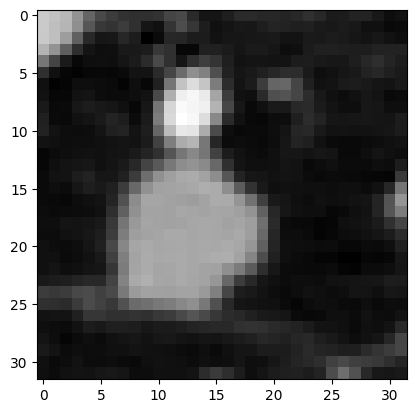

torch.Size([1, 5, 32, 32]) tensor([0.])


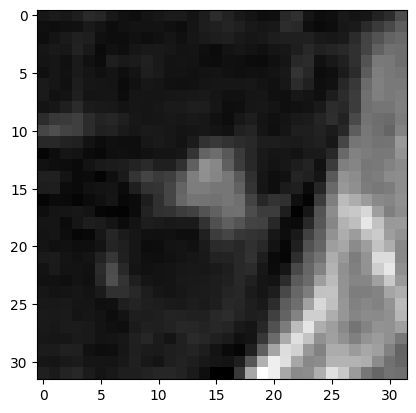

torch.Size([1, 5, 32, 32]) tensor([0.])


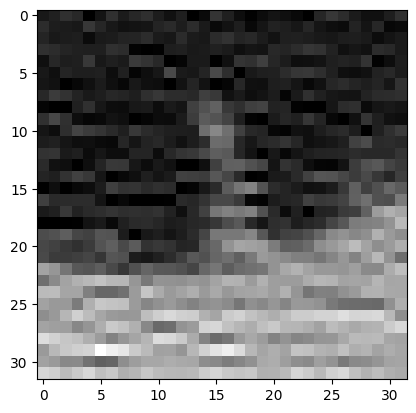

torch.Size([1, 5, 32, 32]) tensor([0.])


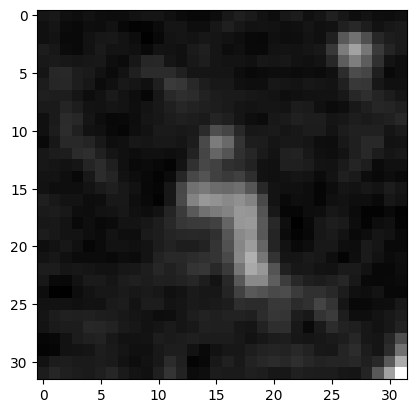

torch.Size([1, 5, 32, 32]) tensor([1.])


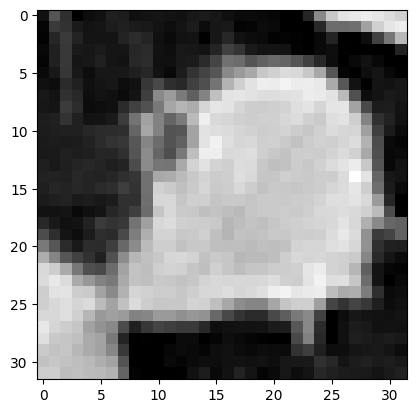

torch.Size([1, 5, 32, 32]) tensor([0.])


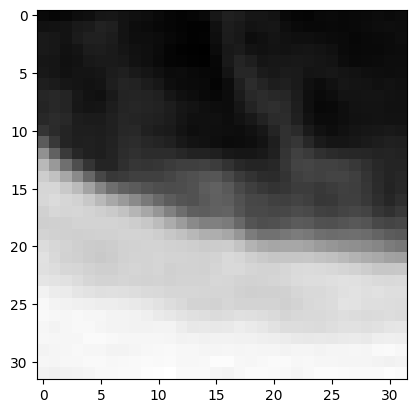

torch.Size([1, 5, 32, 32]) tensor([1.])


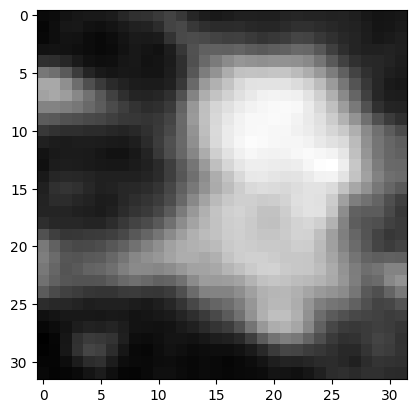

torch.Size([1, 5, 32, 32]) tensor([0.])


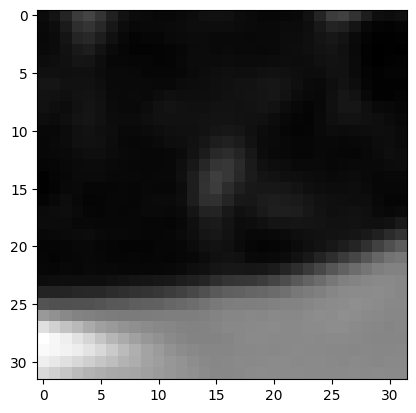

torch.Size([1, 5, 32, 32]) tensor([0.])


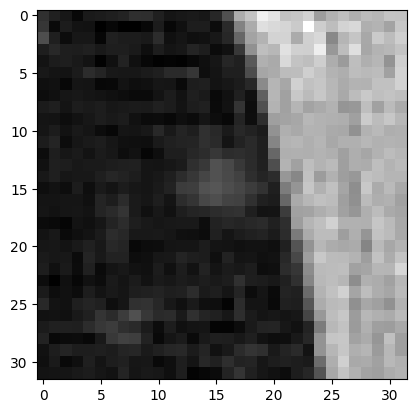

torch.Size([1, 5, 32, 32]) tensor([0.])


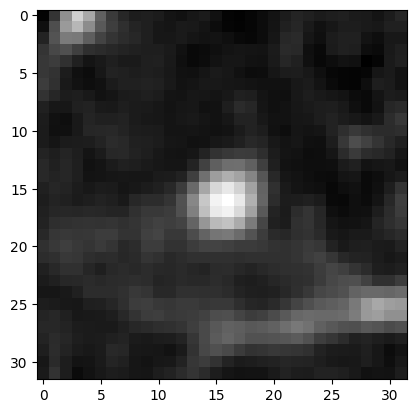

torch.Size([1, 5, 32, 32]) tensor([1.])


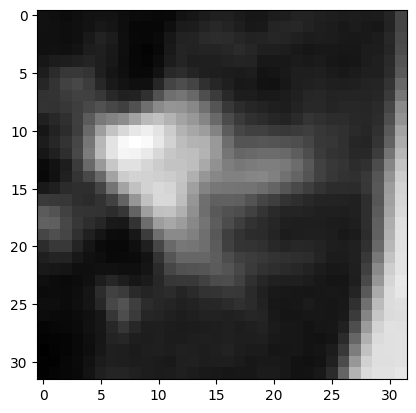

torch.Size([1, 5, 32, 32]) tensor([1.])


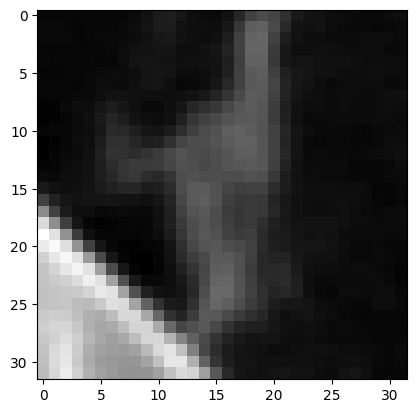

torch.Size([1, 5, 32, 32]) tensor([1.])


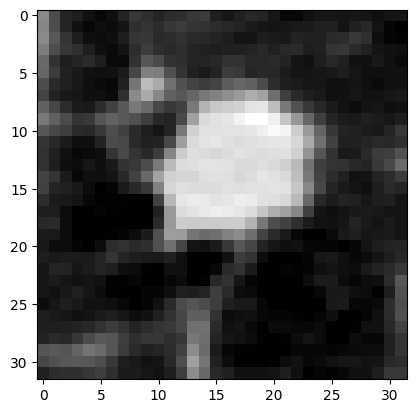

torch.Size([1, 5, 32, 32]) tensor([0.])


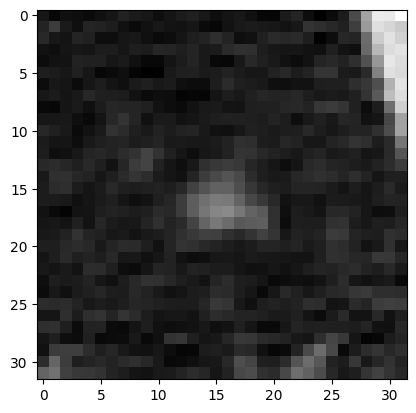

torch.Size([1, 5, 32, 32]) tensor([0.])


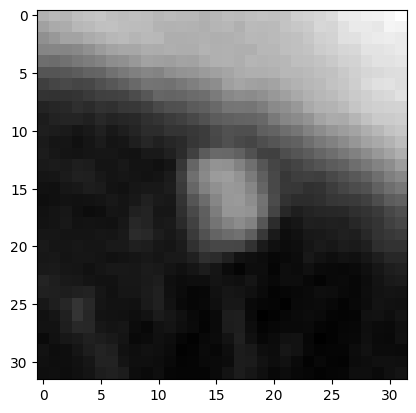

torch.Size([1, 5, 32, 32]) tensor([0.])


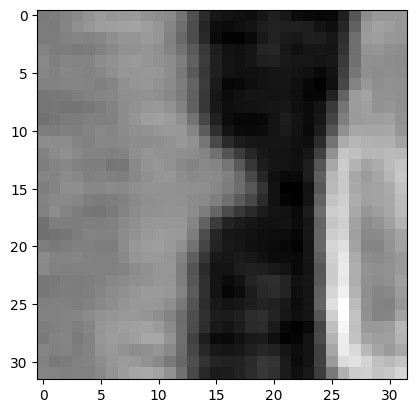

torch.Size([1, 5, 32, 32]) tensor([0.])


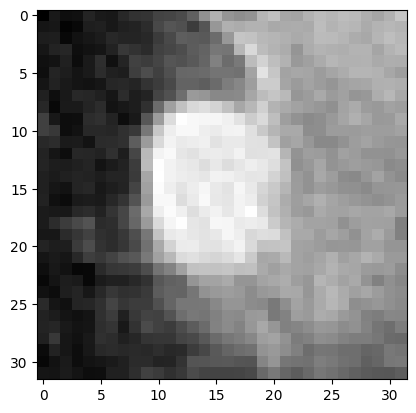

torch.Size([1, 5, 32, 32]) tensor([0.])


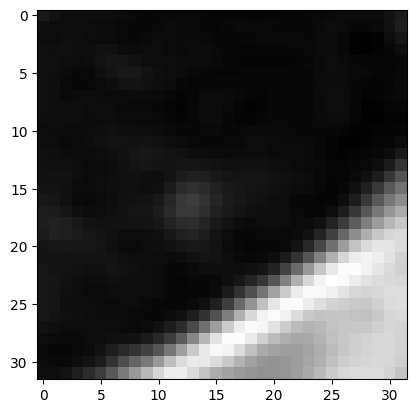

torch.Size([1, 5, 32, 32]) tensor([0.])


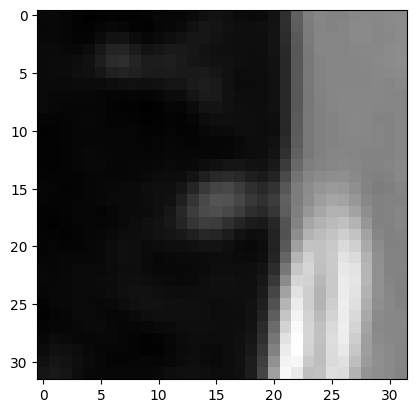

torch.Size([1, 5, 32, 32]) tensor([0.])


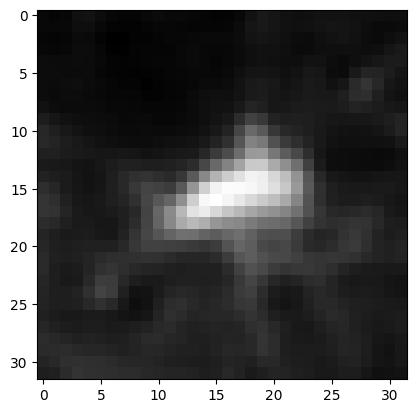

torch.Size([1, 5, 32, 32]) tensor([1.])


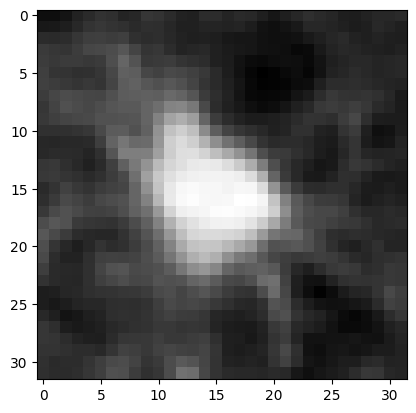

torch.Size([1, 5, 32, 32]) tensor([0.])


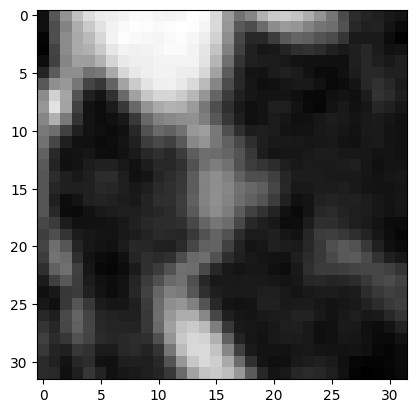

torch.Size([1, 5, 32, 32]) tensor([1.])


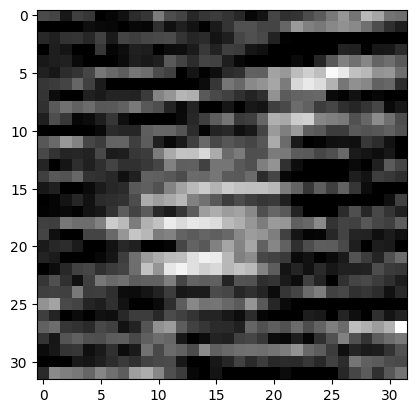

torch.Size([1, 5, 32, 32]) tensor([1.])


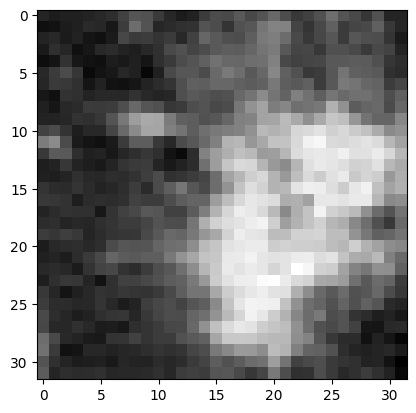

torch.Size([1, 5, 32, 32]) tensor([0.])


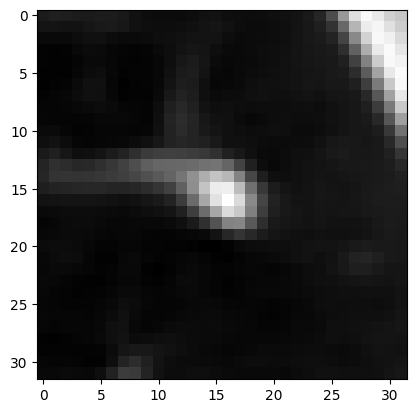

torch.Size([1, 5, 32, 32]) tensor([1.])


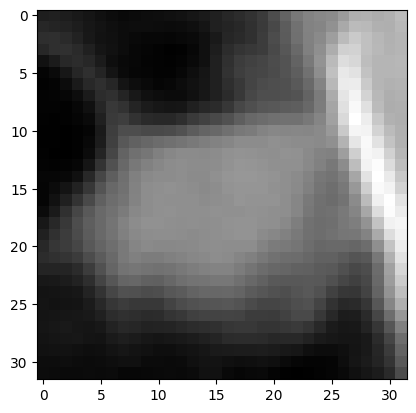

torch.Size([1, 5, 32, 32]) tensor([0.])


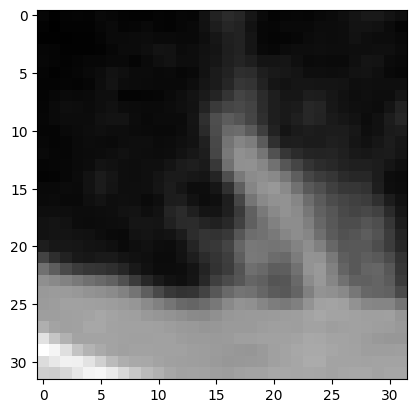

torch.Size([1, 5, 32, 32]) tensor([0.])


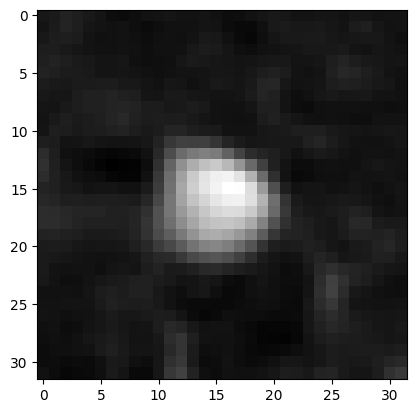

torch.Size([1, 5, 32, 32]) tensor([0.])


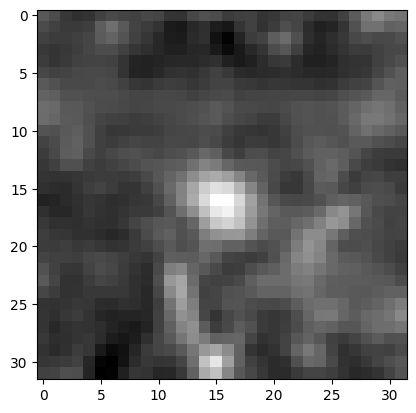

torch.Size([1, 5, 32, 32]) tensor([1.])


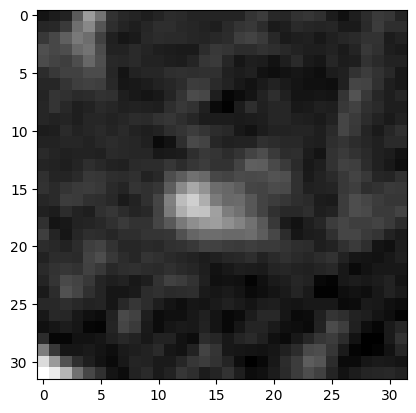

torch.Size([1, 5, 32, 32]) tensor([0.])


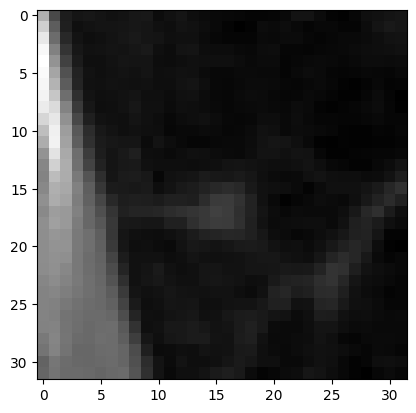

torch.Size([1, 5, 32, 32]) tensor([0.])


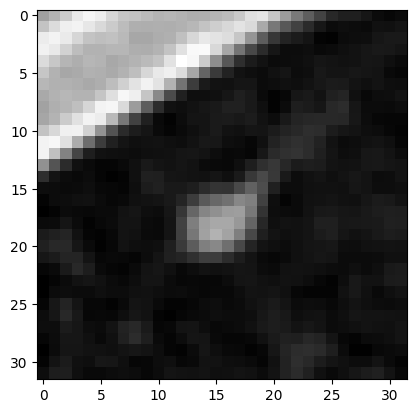

torch.Size([1, 5, 32, 32]) tensor([0.])


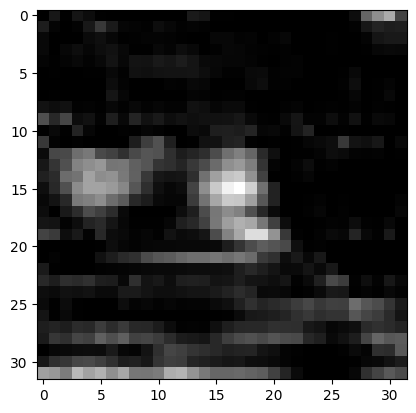

torch.Size([1, 5, 32, 32]) tensor([1.])


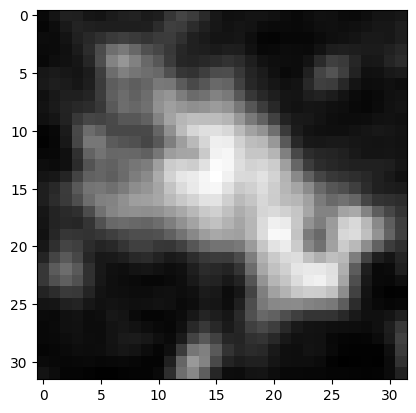

torch.Size([1, 5, 32, 32]) tensor([1.])


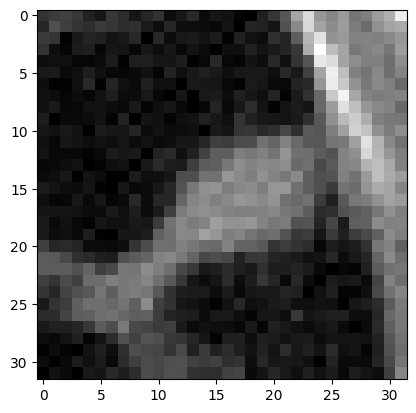

torch.Size([1, 5, 32, 32]) tensor([0.])


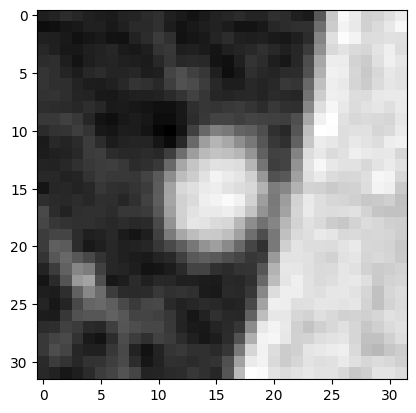

torch.Size([1, 5, 32, 32]) tensor([0.])


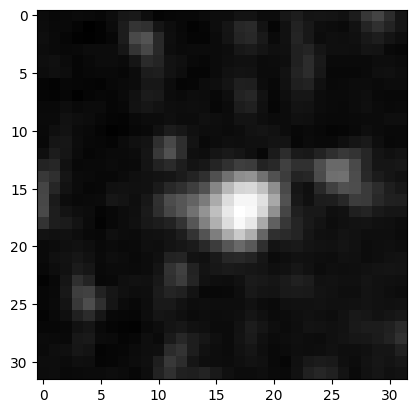

torch.Size([1, 5, 32, 32]) tensor([0.])


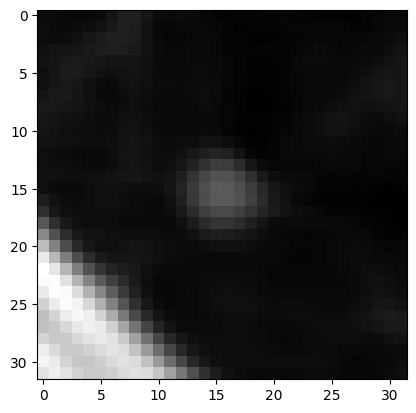

torch.Size([1, 5, 32, 32]) tensor([1.])


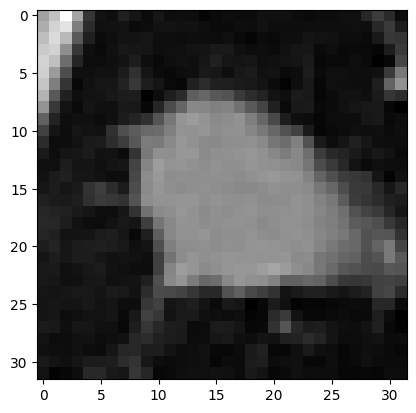

torch.Size([1, 5, 32, 32]) tensor([0.])


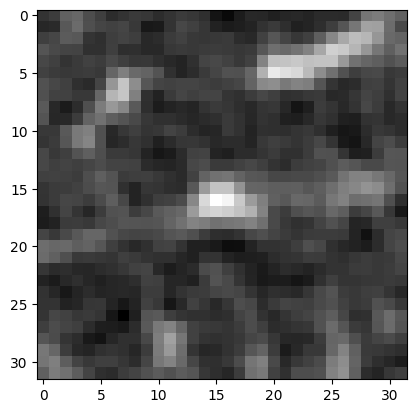

torch.Size([1, 5, 32, 32]) tensor([1.])


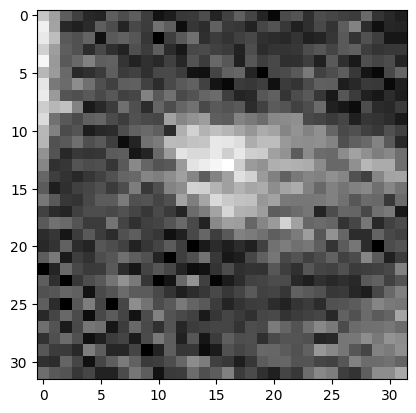

torch.Size([1, 5, 32, 32]) tensor([1.])


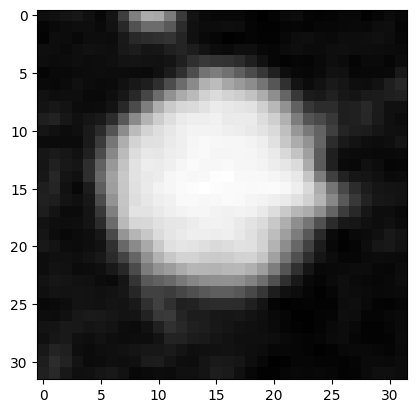

torch.Size([1, 5, 32, 32]) tensor([0.])


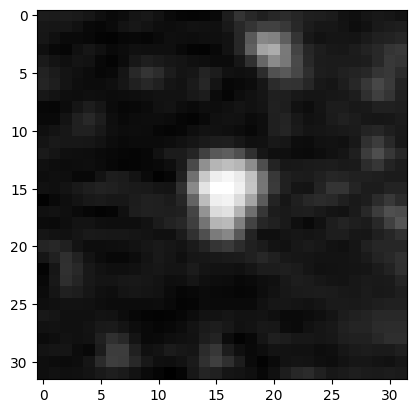

torch.Size([1, 5, 32, 32]) tensor([1.])


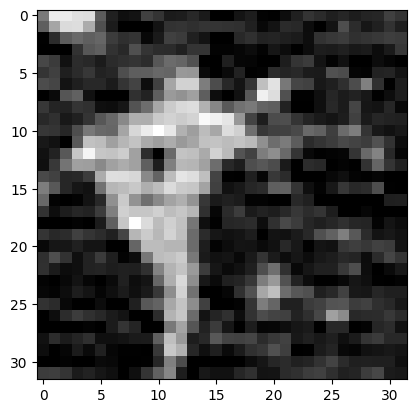

torch.Size([1, 5, 32, 32]) tensor([0.])


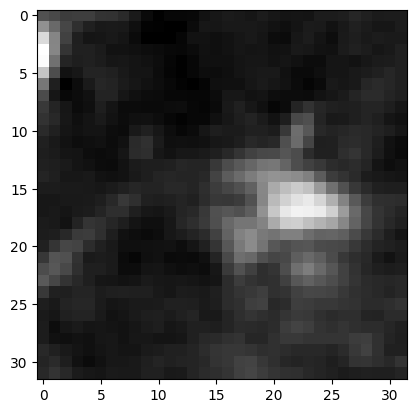

torch.Size([1, 5, 32, 32]) tensor([0.])


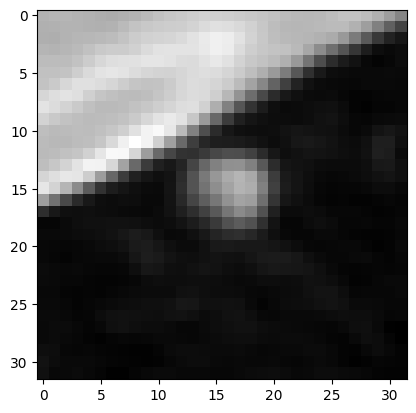

torch.Size([1, 5, 32, 32]) tensor([0.])


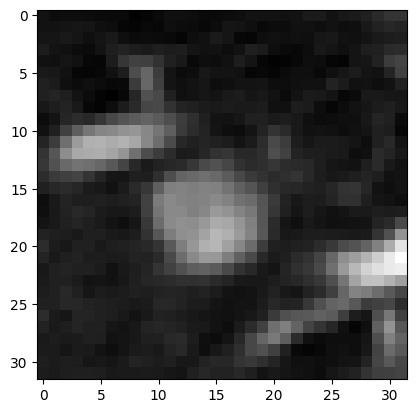

torch.Size([1, 5, 32, 32]) tensor([0.])


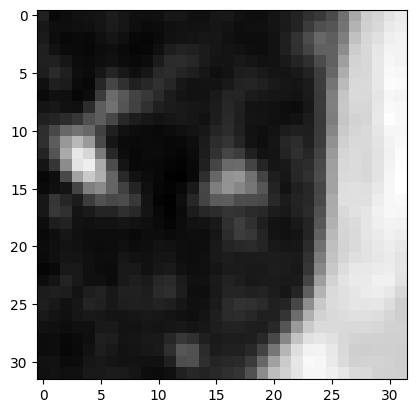

torch.Size([1, 5, 32, 32]) tensor([0.])


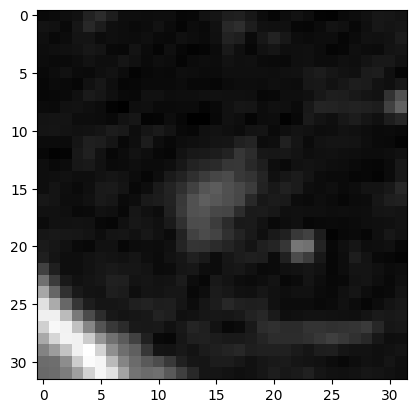

torch.Size([1, 5, 32, 32]) tensor([0.])


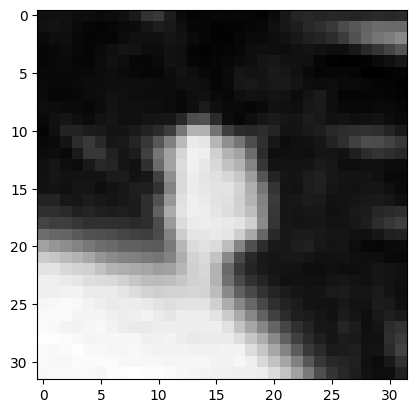

torch.Size([1, 5, 32, 32]) tensor([0.])


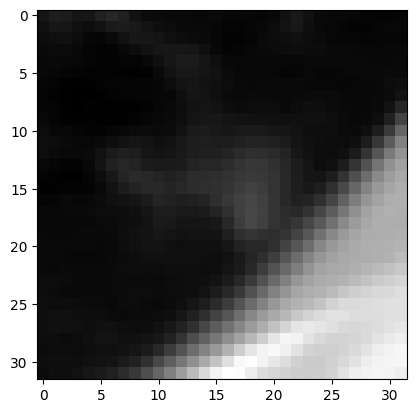

torch.Size([1, 5, 32, 32]) tensor([0.])


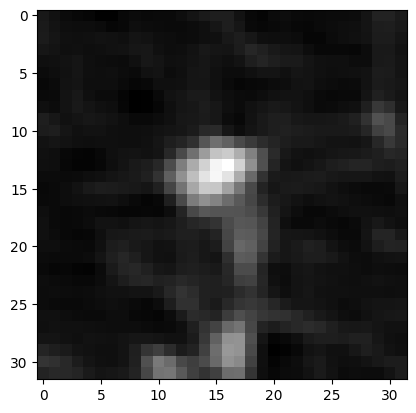

torch.Size([1, 5, 32, 32]) tensor([0.])


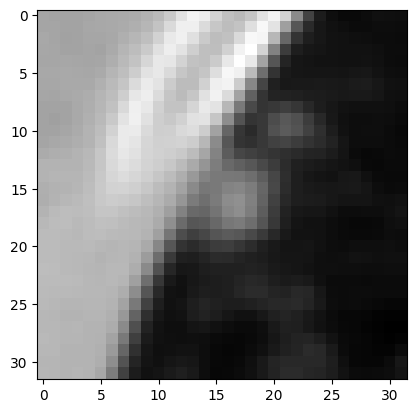

torch.Size([1, 5, 32, 32]) tensor([0.])


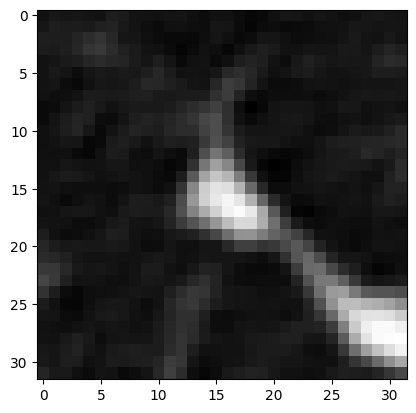

torch.Size([1, 5, 32, 32]) tensor([0.])


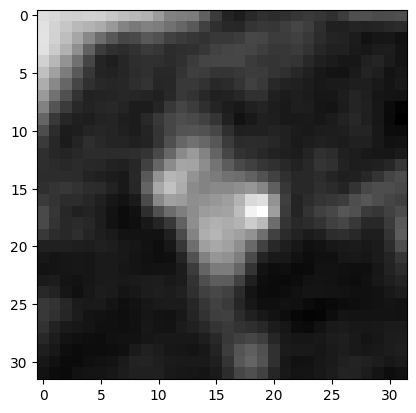

torch.Size([1, 5, 32, 32]) tensor([1.])


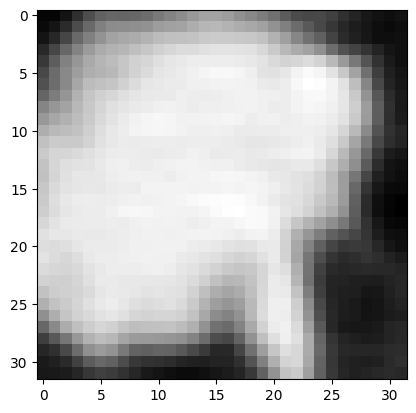

torch.Size([1, 5, 32, 32]) tensor([1.])


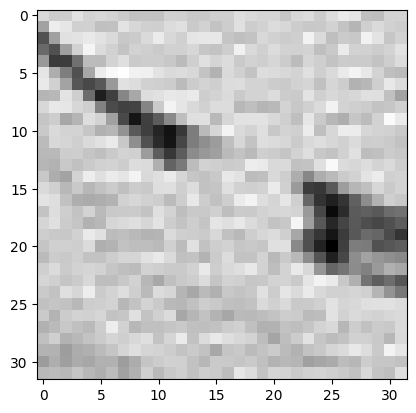

torch.Size([1, 5, 32, 32]) tensor([0.])


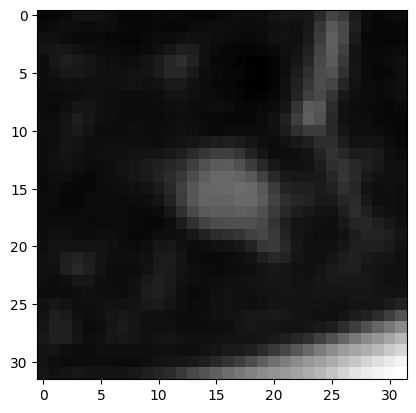

torch.Size([1, 5, 32, 32]) tensor([1.])


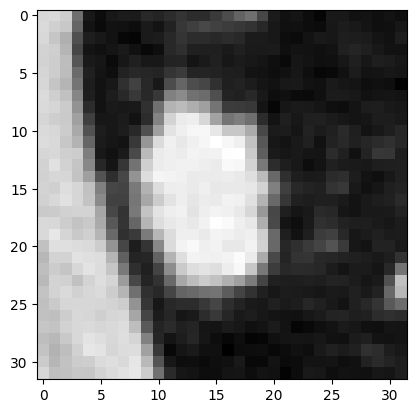

torch.Size([1, 5, 32, 32]) tensor([0.])


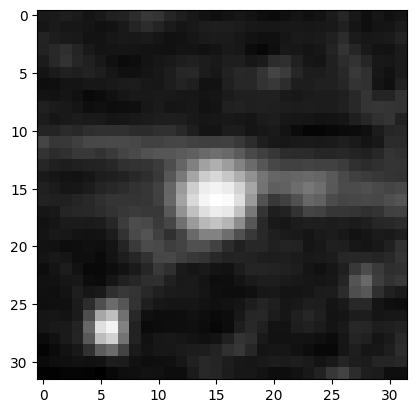

torch.Size([1, 5, 32, 32]) tensor([1.])


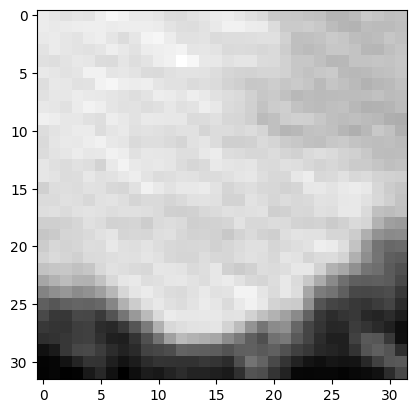

torch.Size([1, 5, 32, 32]) tensor([1.])


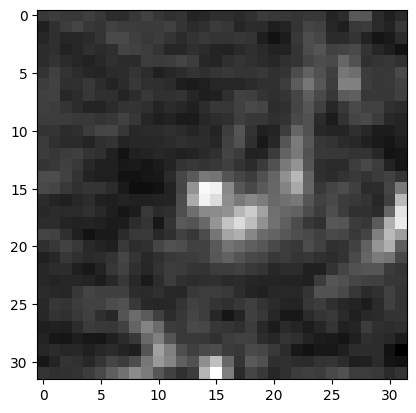

torch.Size([1, 5, 32, 32]) tensor([0.])


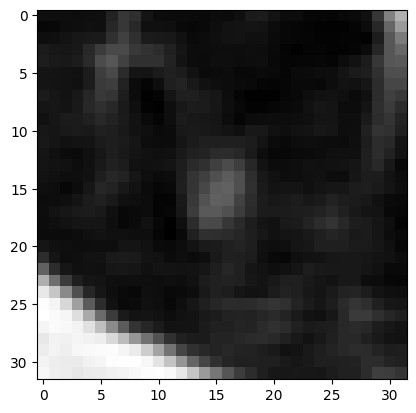

torch.Size([1, 5, 32, 32]) tensor([1.])


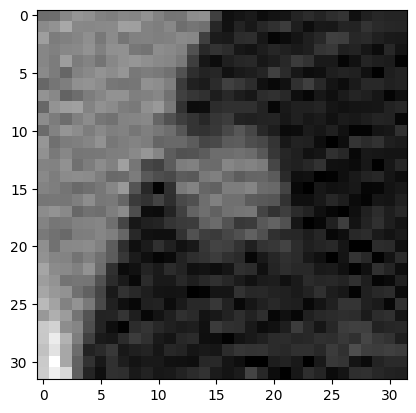

torch.Size([1, 5, 32, 32]) tensor([0.])


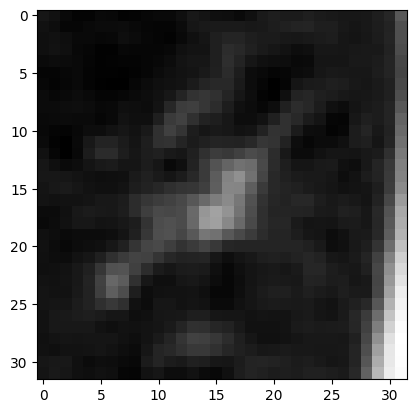

torch.Size([1, 5, 32, 32]) tensor([1.])


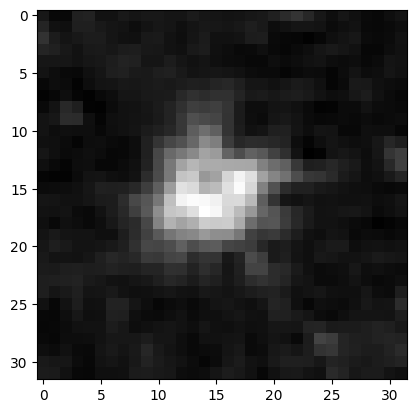

torch.Size([1, 5, 32, 32]) tensor([0.])


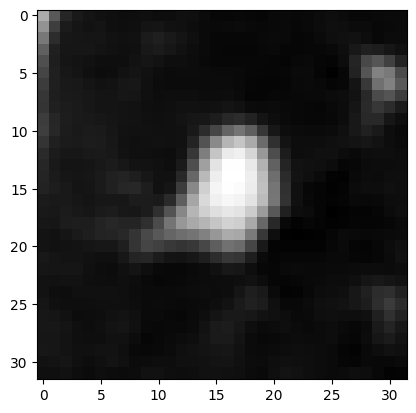

torch.Size([1, 5, 32, 32]) tensor([0.])


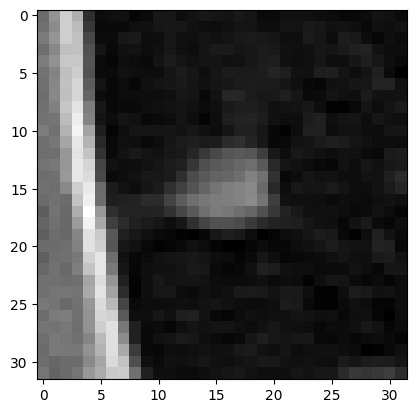

torch.Size([1, 5, 32, 32]) tensor([0.])


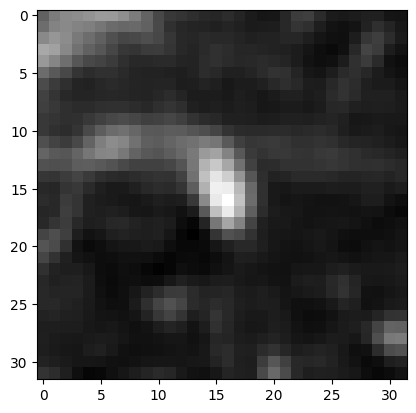

torch.Size([1, 5, 32, 32]) tensor([0.])


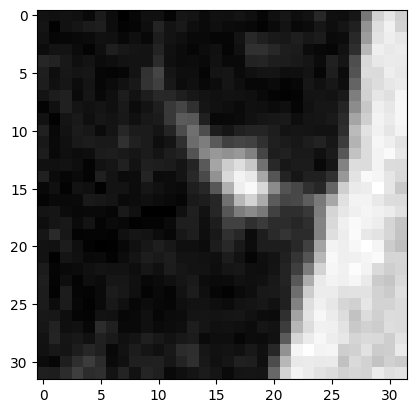

torch.Size([1, 5, 32, 32]) tensor([1.])


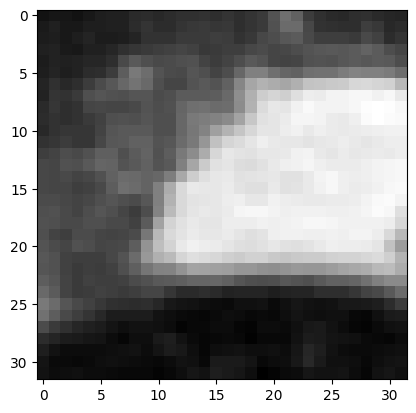

torch.Size([1, 5, 32, 32]) tensor([0.])


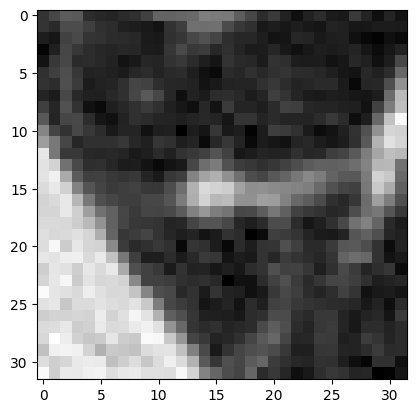

torch.Size([1, 5, 32, 32]) tensor([1.])


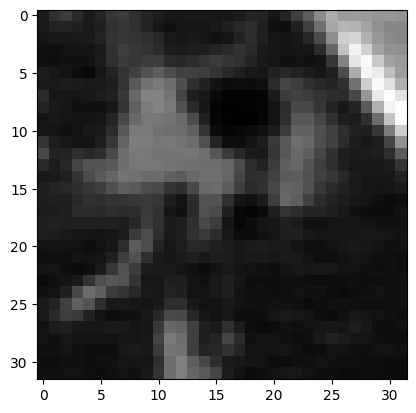

torch.Size([1, 5, 32, 32]) tensor([0.])


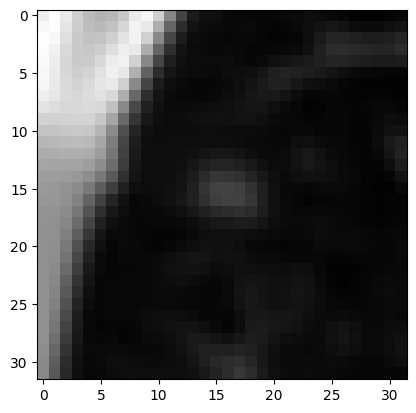

torch.Size([1, 5, 32, 32]) tensor([0.])


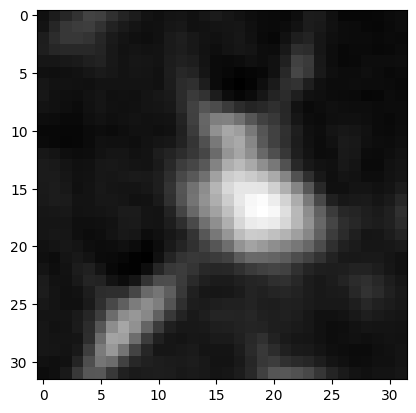

torch.Size([1, 5, 32, 32]) tensor([0.])


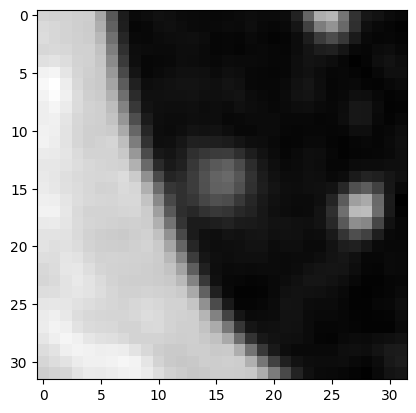

torch.Size([1, 5, 32, 32]) tensor([0.])


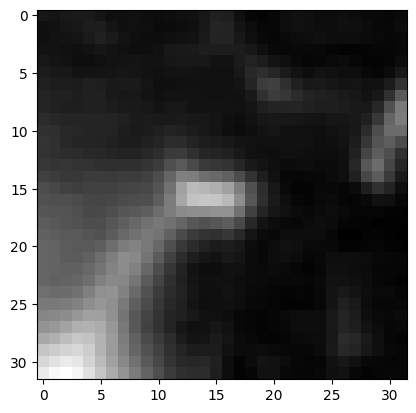

torch.Size([1, 5, 32, 32]) tensor([1.])


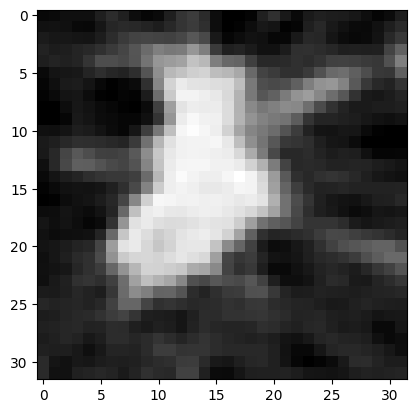

torch.Size([1, 5, 32, 32]) tensor([0.])


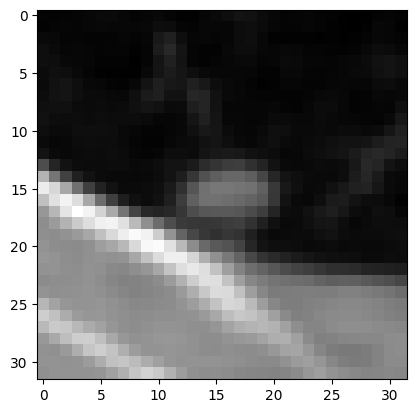

torch.Size([1, 5, 32, 32]) tensor([1.])


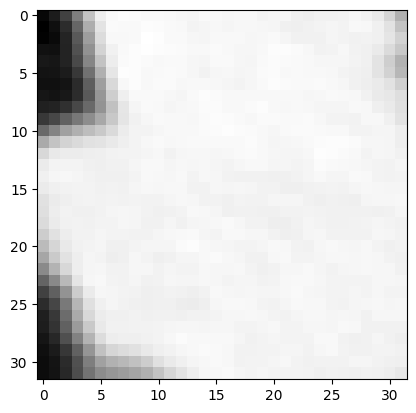

torch.Size([1, 5, 32, 32]) tensor([0.])


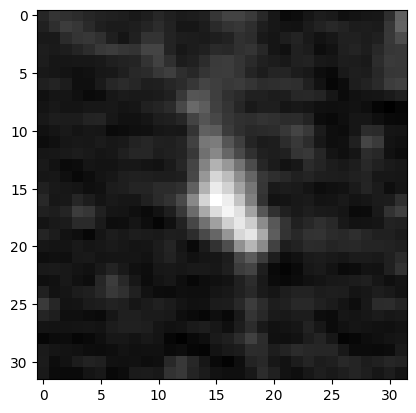

torch.Size([1, 5, 32, 32]) tensor([0.])


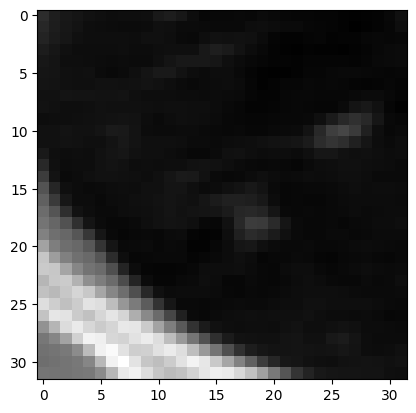

torch.Size([1, 5, 32, 32]) tensor([0.])


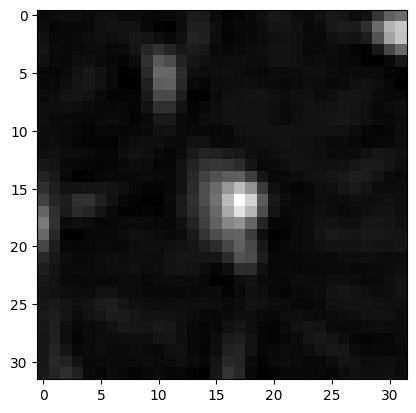

torch.Size([1, 5, 32, 32]) tensor([0.])


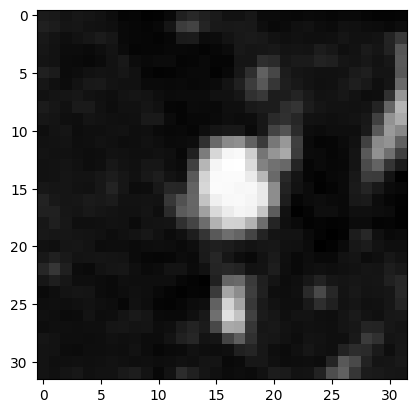

torch.Size([1, 5, 32, 32]) tensor([1.])


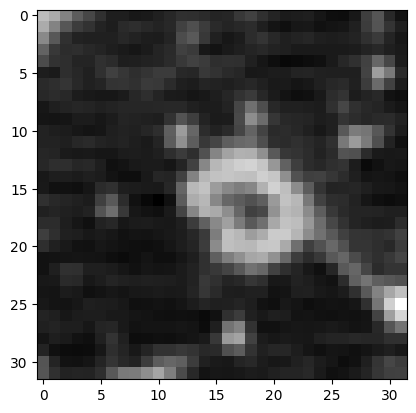

torch.Size([1, 5, 32, 32]) tensor([0.])


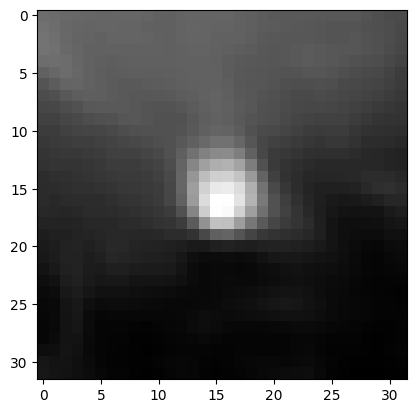

torch.Size([1, 5, 32, 32]) tensor([1.])


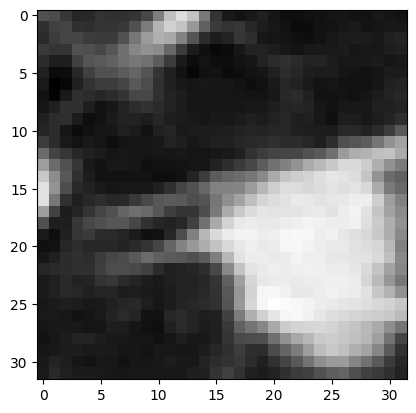

torch.Size([1, 5, 32, 32]) tensor([1.])


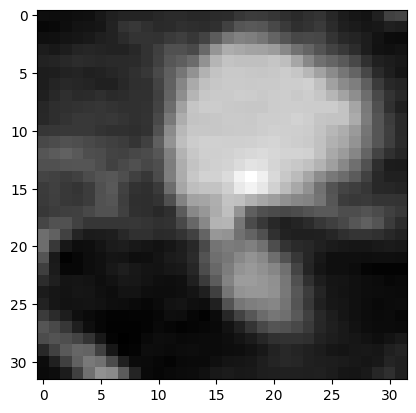

torch.Size([1, 5, 32, 32]) tensor([1.])


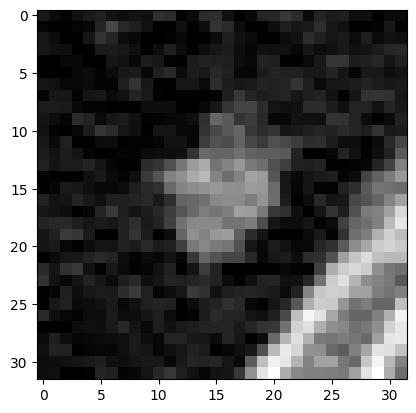

torch.Size([1, 5, 32, 32]) tensor([0.])


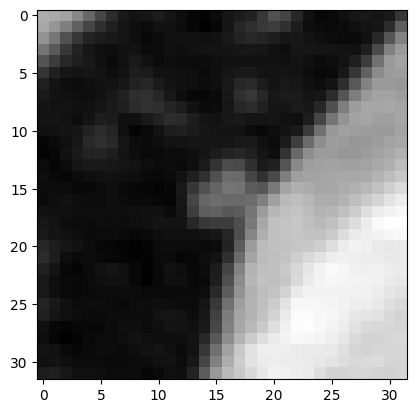

torch.Size([1, 5, 32, 32]) tensor([0.])


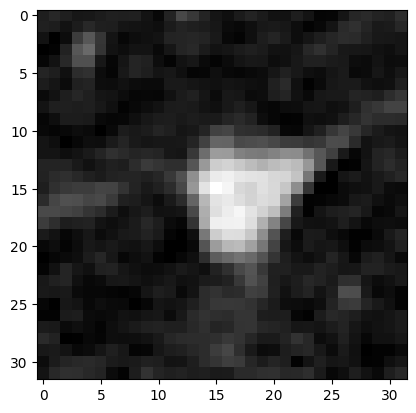

torch.Size([1, 5, 32, 32]) tensor([0.])


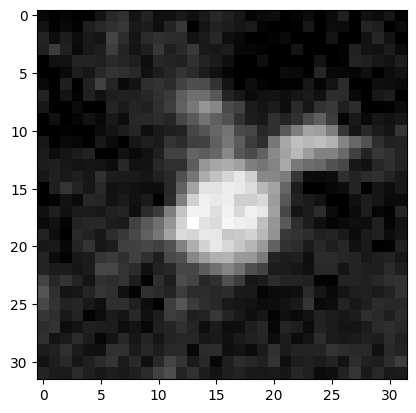

torch.Size([1, 5, 32, 32]) tensor([0.])


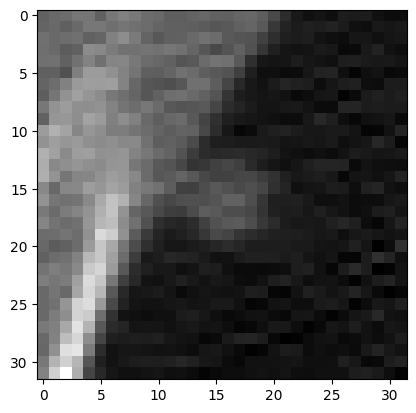

torch.Size([1, 5, 32, 32]) tensor([0.])


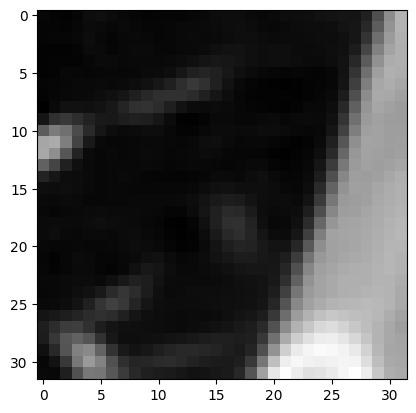

torch.Size([1, 5, 32, 32]) tensor([0.])


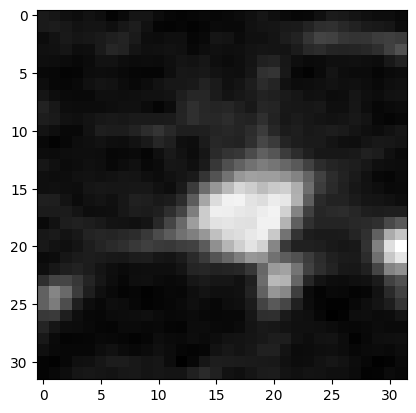

torch.Size([1, 5, 32, 32]) tensor([1.])


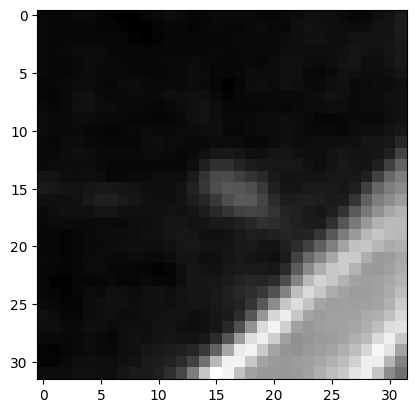

torch.Size([1, 5, 32, 32]) tensor([1.])


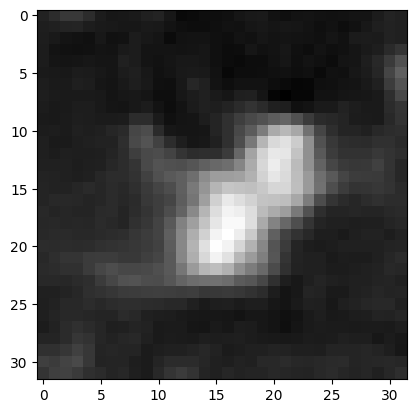

torch.Size([1, 5, 32, 32]) tensor([0.])


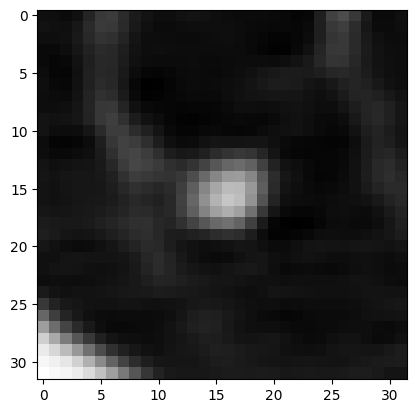

torch.Size([1, 5, 32, 32]) tensor([0.])


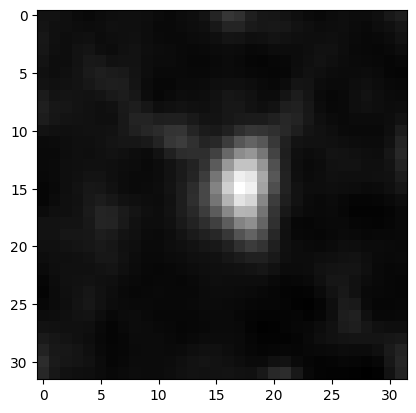

torch.Size([1, 5, 32, 32]) tensor([1.])


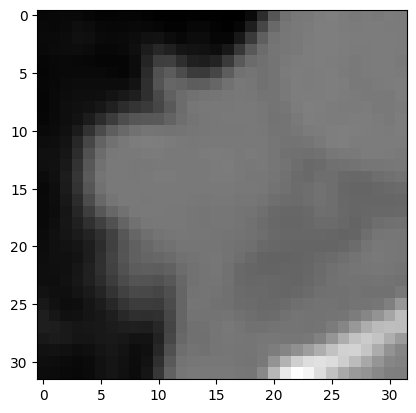

torch.Size([1, 5, 32, 32]) tensor([0.])


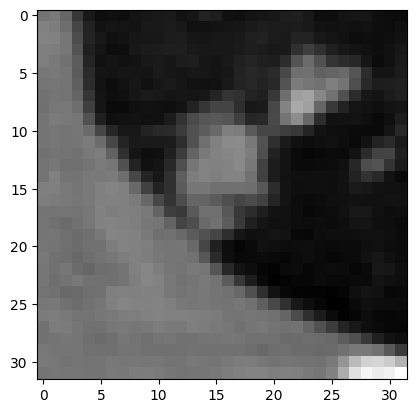

torch.Size([1, 5, 32, 32]) tensor([0.])


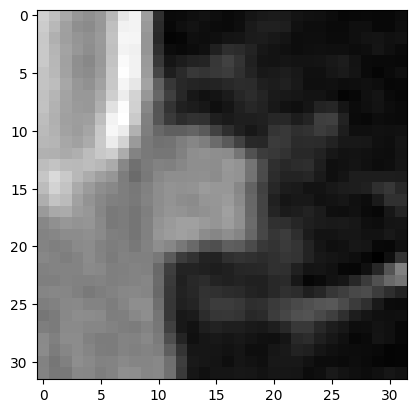

torch.Size([1, 5, 32, 32]) tensor([1.])


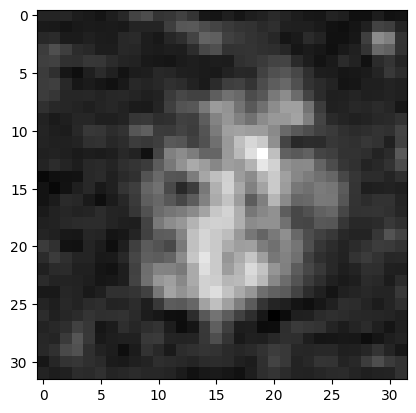

torch.Size([1, 5, 32, 32]) tensor([0.])


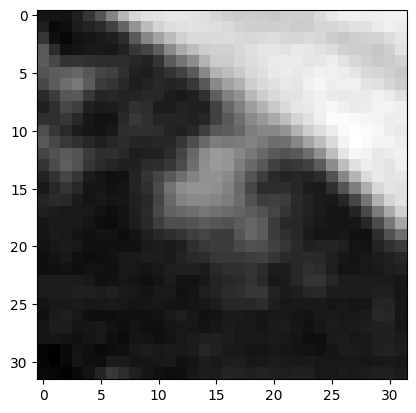

torch.Size([1, 5, 32, 32]) tensor([0.])


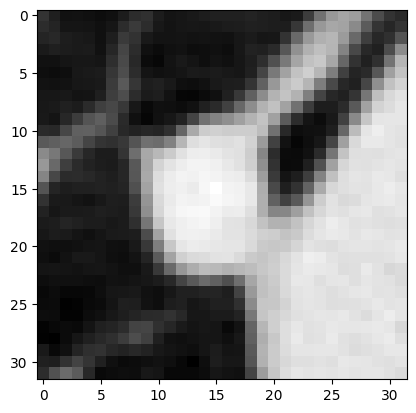

torch.Size([1, 5, 32, 32]) tensor([0.])


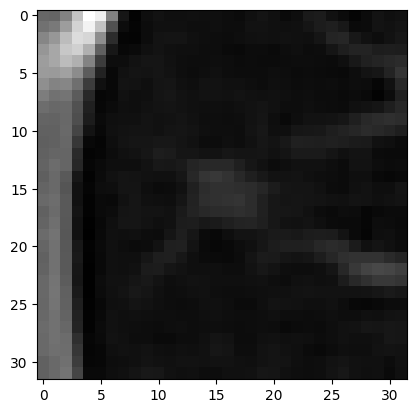

torch.Size([1, 5, 32, 32]) tensor([1.])


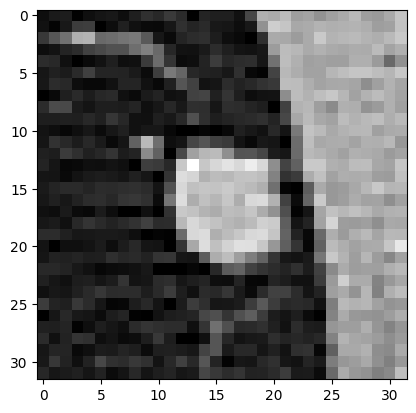

torch.Size([1, 5, 32, 32]) tensor([0.])


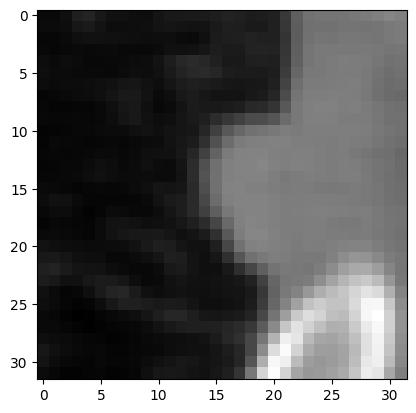

torch.Size([1, 5, 32, 32]) tensor([0.])


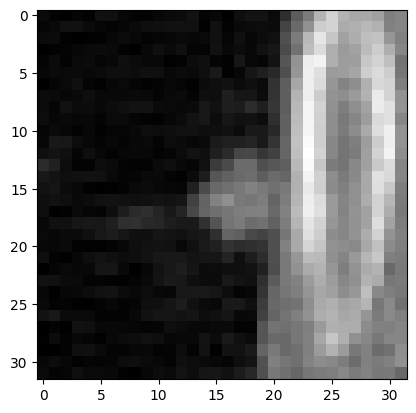

torch.Size([1, 5, 32, 32]) tensor([0.])


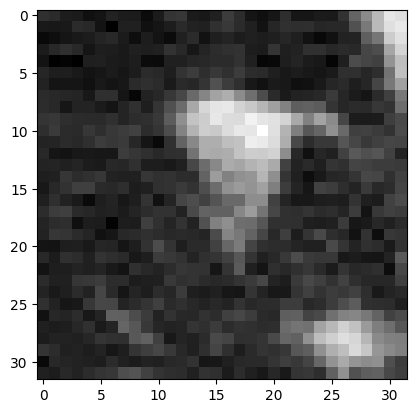

torch.Size([1, 5, 32, 32]) tensor([1.])


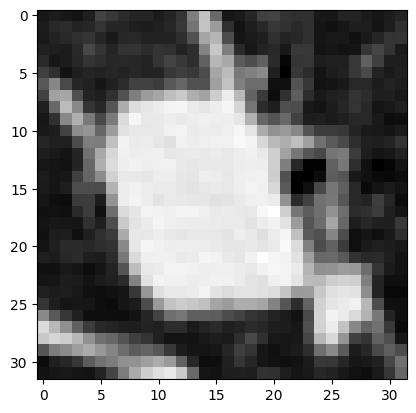

torch.Size([1, 5, 32, 32]) tensor([1.])


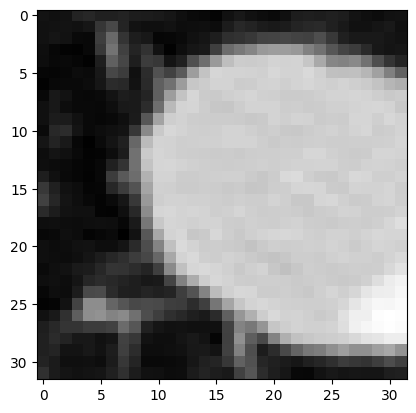

torch.Size([1, 5, 32, 32]) tensor([1.])


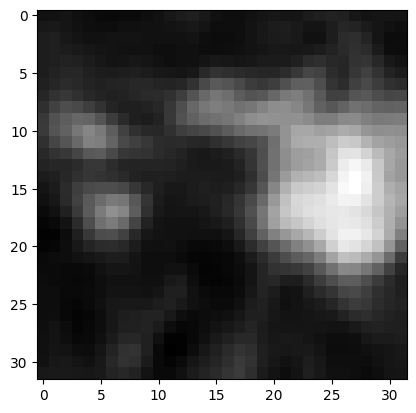

torch.Size([1, 5, 32, 32]) tensor([1.])


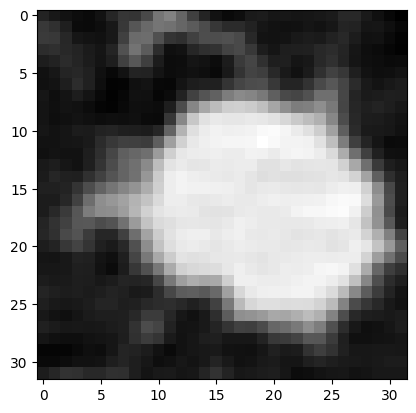

torch.Size([1, 5, 32, 32]) tensor([1.])


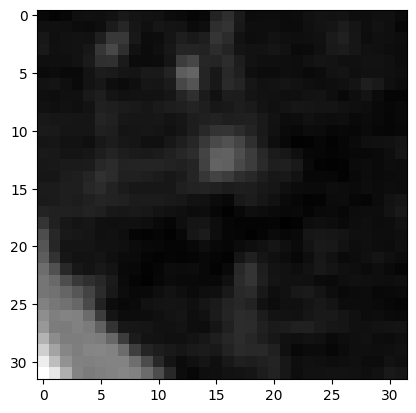

torch.Size([1, 5, 32, 32]) tensor([1.])


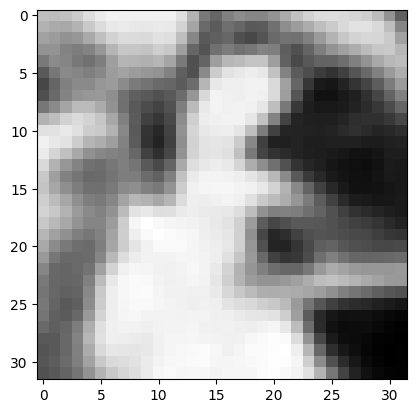

torch.Size([1, 5, 32, 32]) tensor([0.])


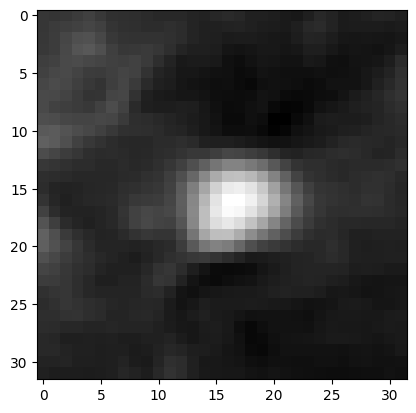

torch.Size([1, 5, 32, 32]) tensor([0.])


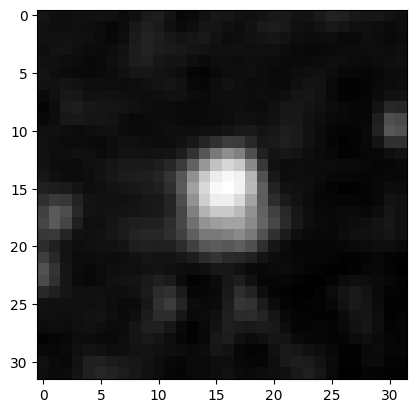

torch.Size([1, 5, 32, 32]) tensor([0.])


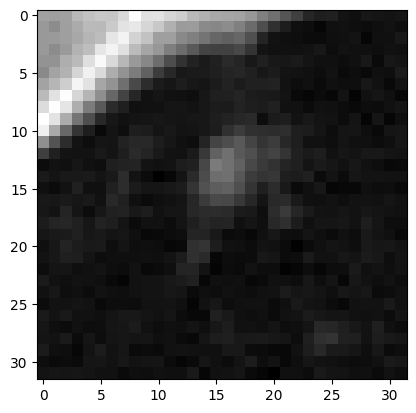

torch.Size([1, 5, 32, 32]) tensor([0.])


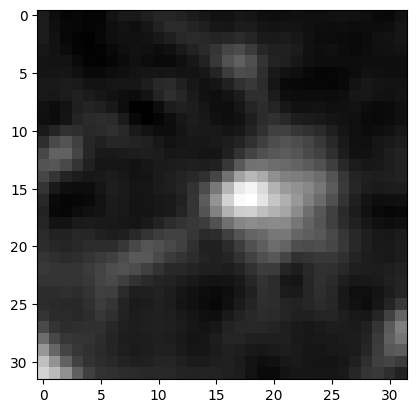

torch.Size([1, 5, 32, 32]) tensor([0.])


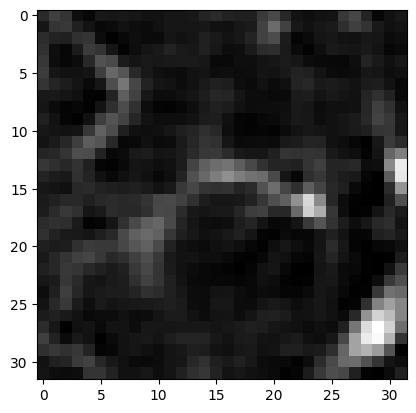

torch.Size([1, 5, 32, 32]) tensor([0.])


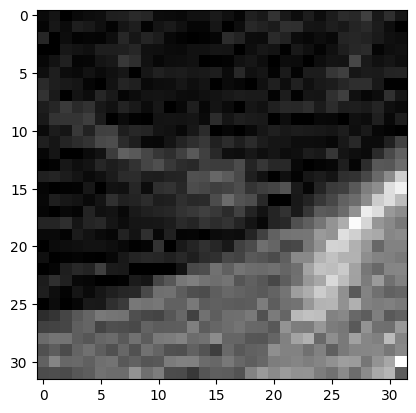

torch.Size([1, 5, 32, 32]) tensor([0.])


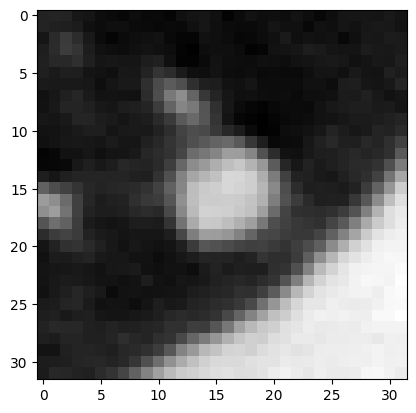

torch.Size([1, 5, 32, 32]) tensor([1.])


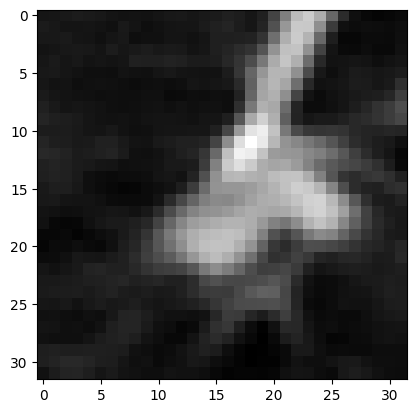

torch.Size([1, 5, 32, 32]) tensor([1.])


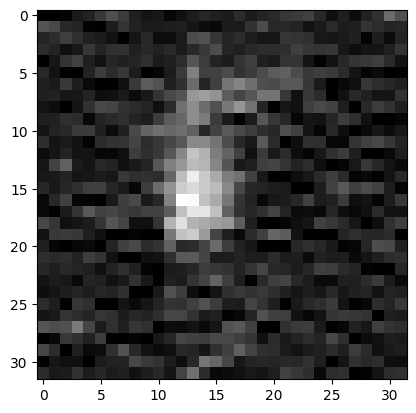

torch.Size([1, 5, 32, 32]) tensor([0.])


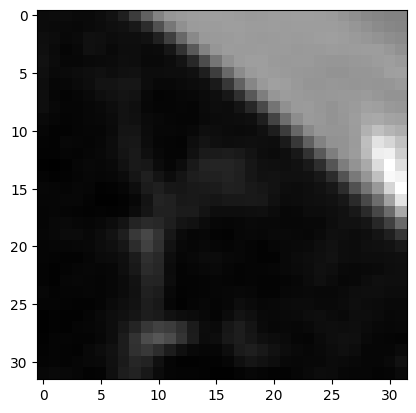

torch.Size([1, 5, 32, 32]) tensor([0.])


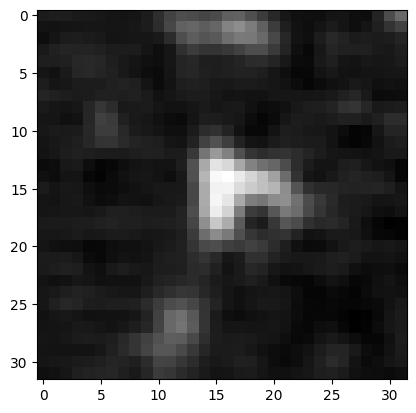

torch.Size([1, 5, 32, 32]) tensor([0.])


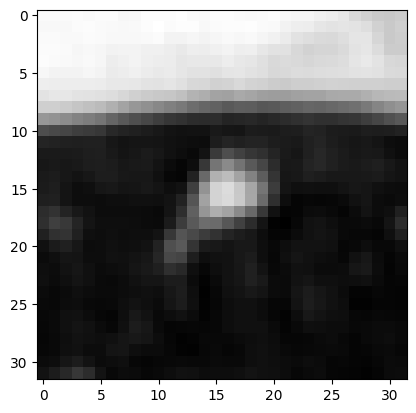

torch.Size([1, 5, 32, 32]) tensor([1.])


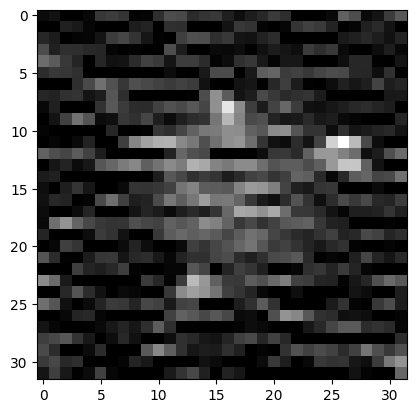

torch.Size([1, 5, 32, 32]) tensor([0.])


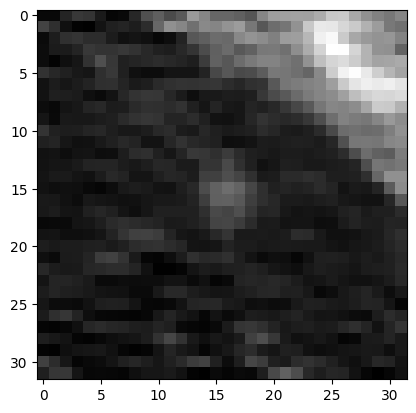

torch.Size([1, 5, 32, 32]) tensor([0.])


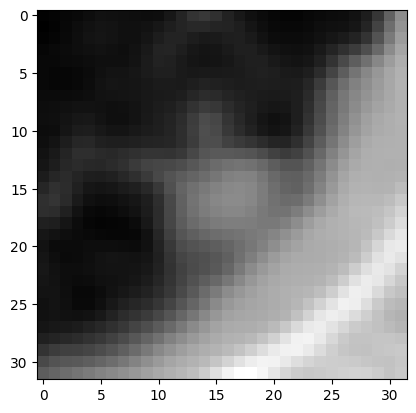

torch.Size([1, 5, 32, 32]) tensor([1.])


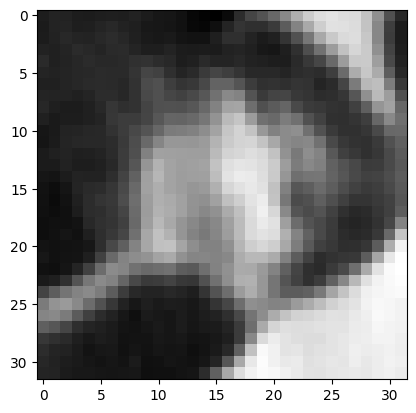

torch.Size([1, 5, 32, 32]) tensor([0.])


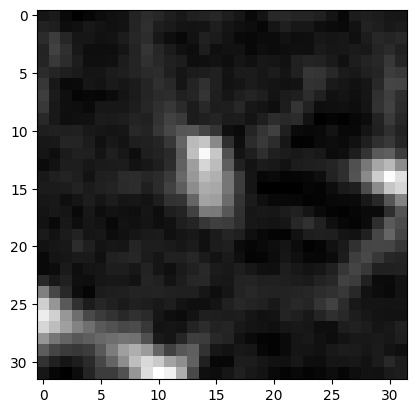

torch.Size([1, 5, 32, 32]) tensor([1.])


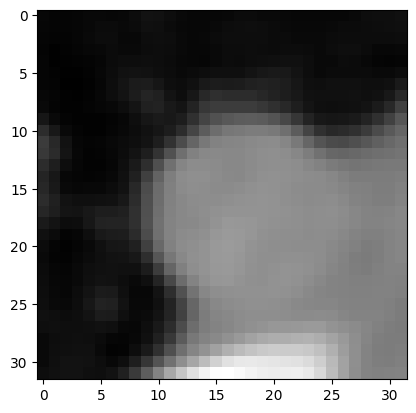

torch.Size([1, 5, 32, 32]) tensor([0.])


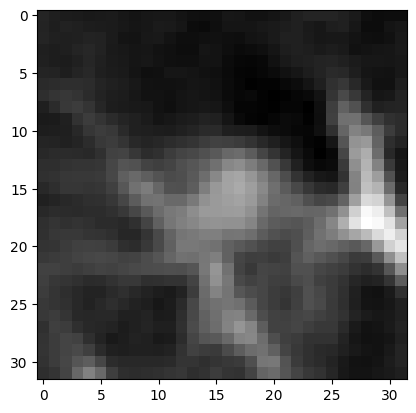

torch.Size([1, 5, 32, 32]) tensor([0.])


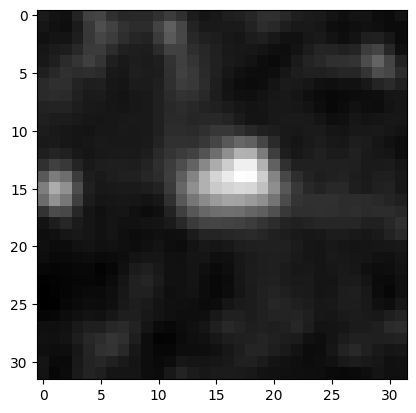

torch.Size([1, 5, 32, 32]) tensor([0.])


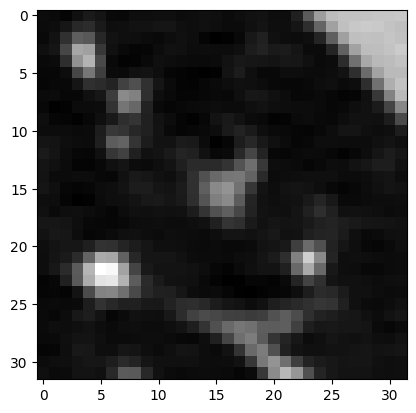

torch.Size([1, 5, 32, 32]) tensor([0.])


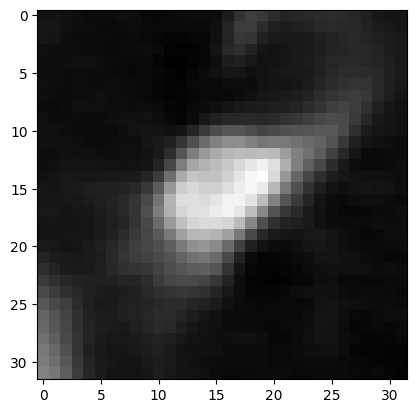

torch.Size([1, 5, 32, 32]) tensor([1.])


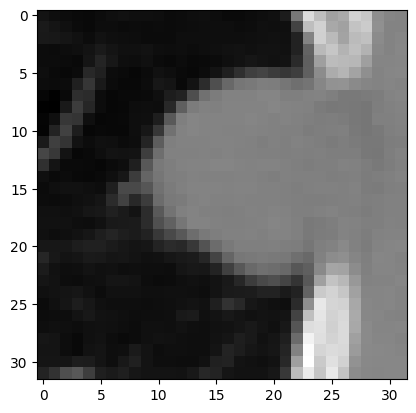

torch.Size([1, 5, 32, 32]) tensor([0.])


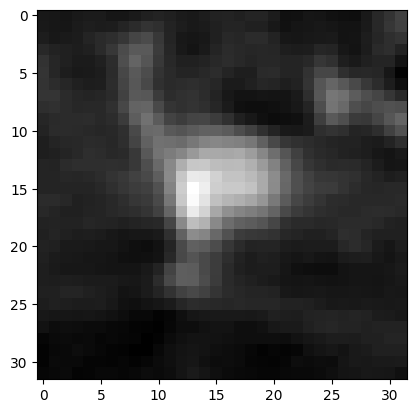

torch.Size([1, 5, 32, 32]) tensor([1.])


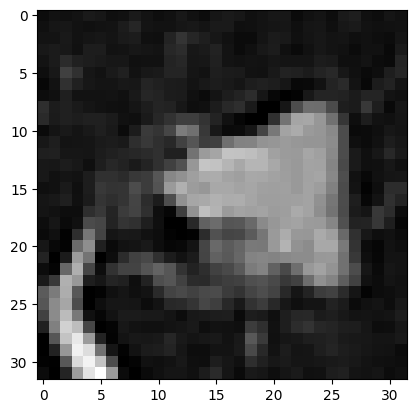

torch.Size([1, 5, 32, 32]) tensor([0.])


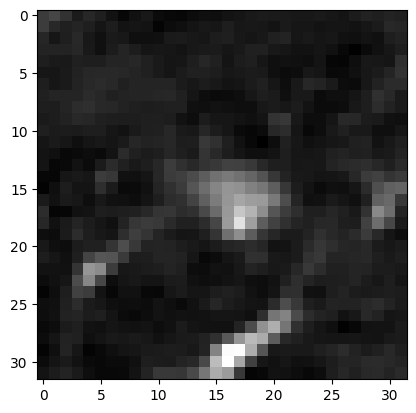

torch.Size([1, 5, 32, 32]) tensor([0.])


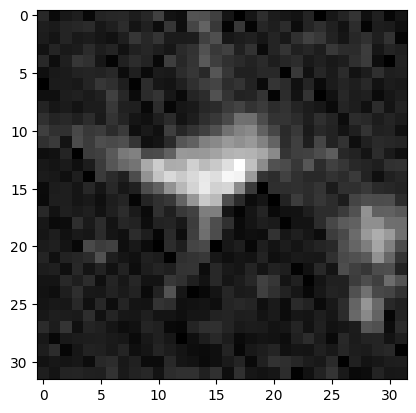

torch.Size([1, 5, 32, 32]) tensor([0.])


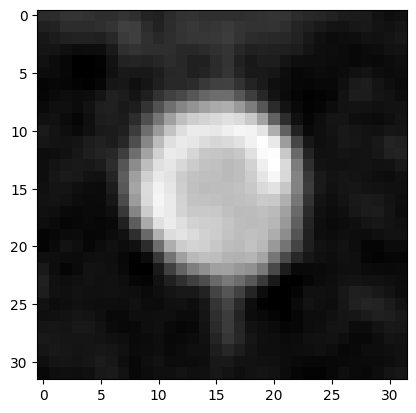

torch.Size([1, 5, 32, 32]) tensor([0.])


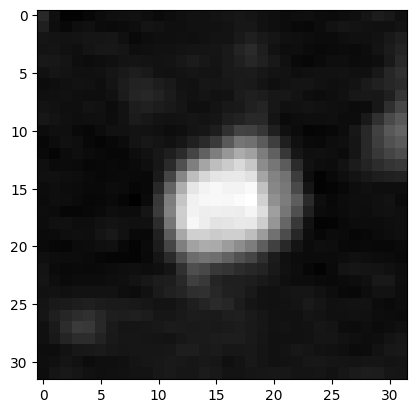

torch.Size([1, 5, 32, 32]) tensor([0.])


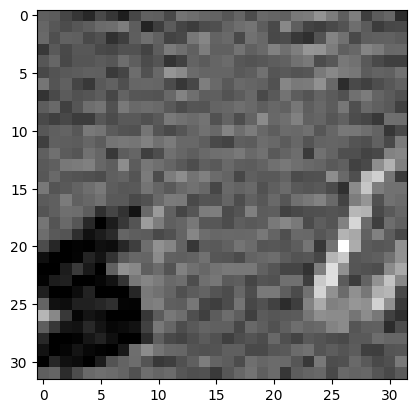

torch.Size([1, 5, 32, 32]) tensor([1.])


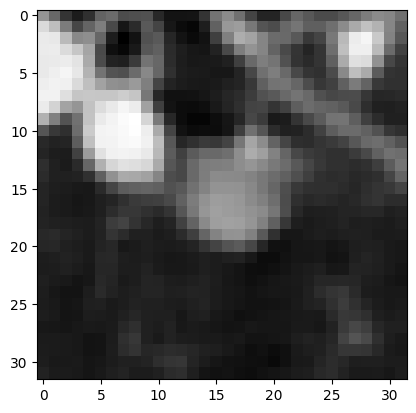

torch.Size([1, 5, 32, 32]) tensor([1.])


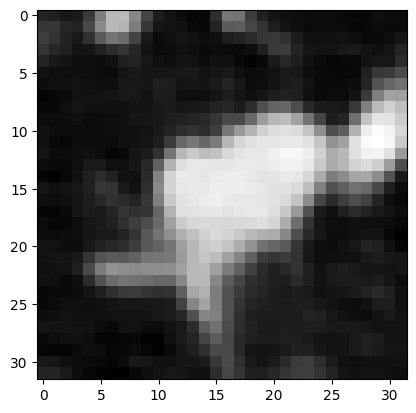

torch.Size([1, 5, 32, 32]) tensor([1.])


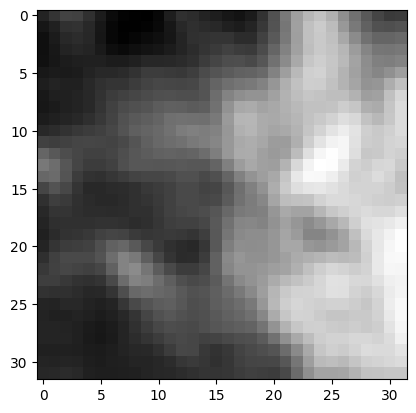

torch.Size([1, 5, 32, 32]) tensor([1.])


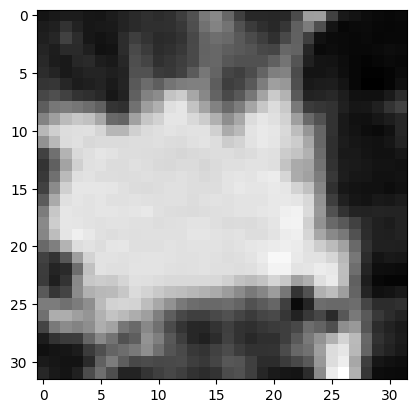

torch.Size([1, 5, 32, 32]) tensor([1.])


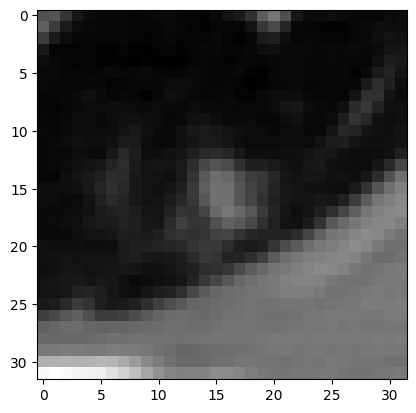

torch.Size([1, 5, 32, 32]) tensor([1.])


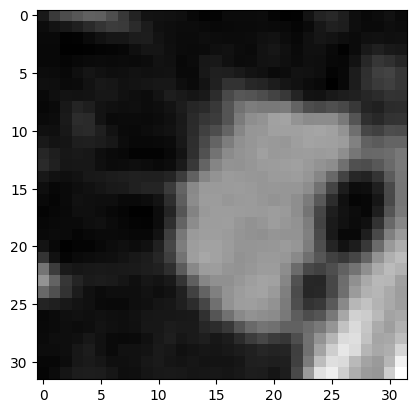

torch.Size([1, 5, 32, 32]) tensor([0.])


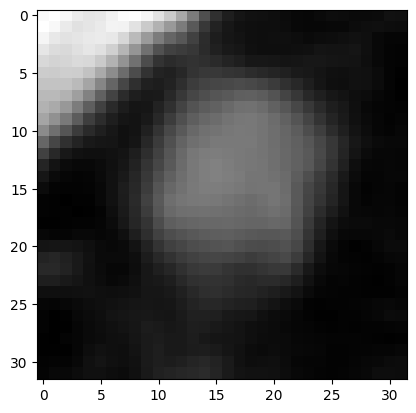

torch.Size([1, 5, 32, 32]) tensor([1.])


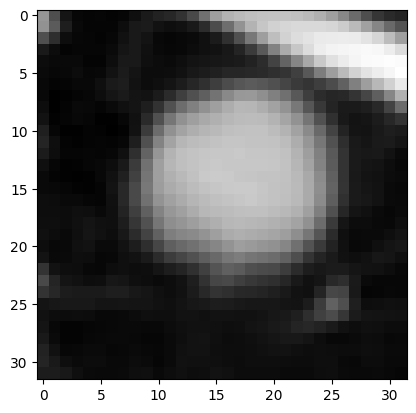

torch.Size([1, 5, 32, 32]) tensor([1.])


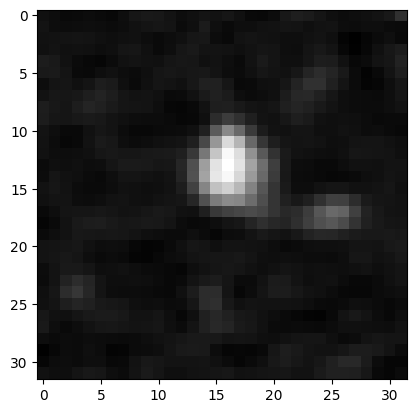

torch.Size([1, 5, 32, 32]) tensor([0.])


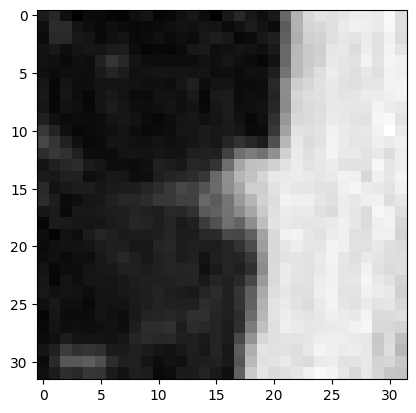

torch.Size([1, 5, 32, 32]) tensor([0.])


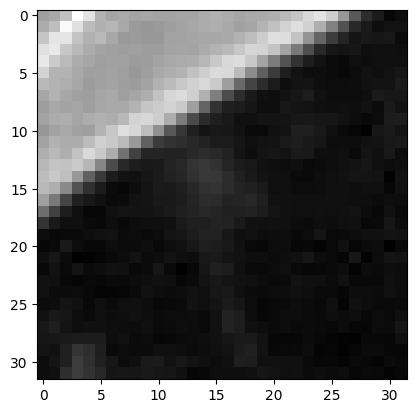

torch.Size([1, 5, 32, 32]) tensor([0.])


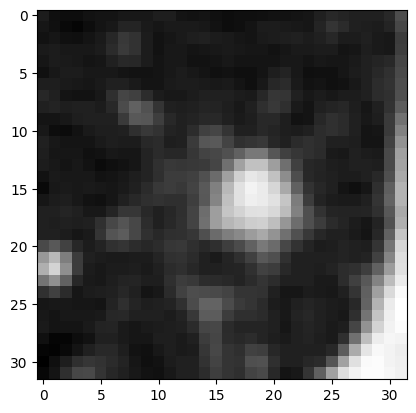

torch.Size([1, 5, 32, 32]) tensor([1.])


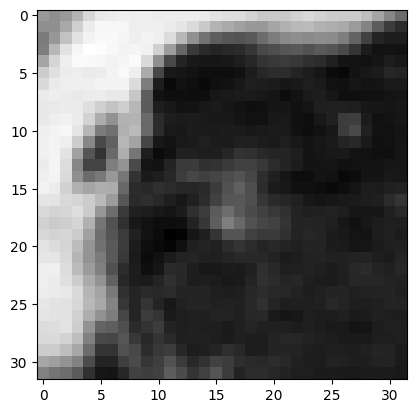

torch.Size([1, 5, 32, 32]) tensor([0.])


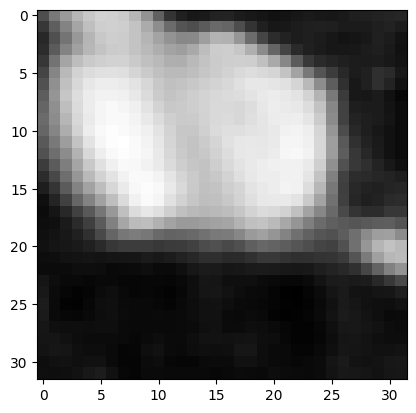

torch.Size([1, 5, 32, 32]) tensor([0.])


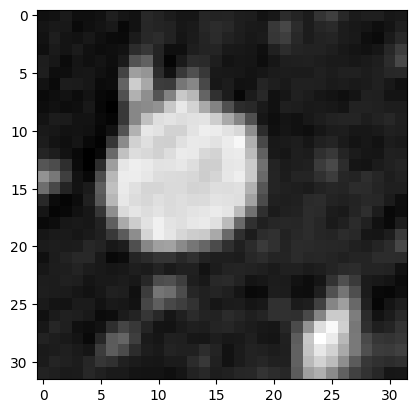

torch.Size([1, 5, 32, 32]) tensor([0.])


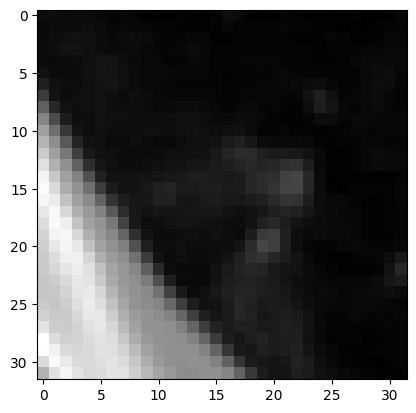

torch.Size([1, 5, 32, 32]) tensor([0.])


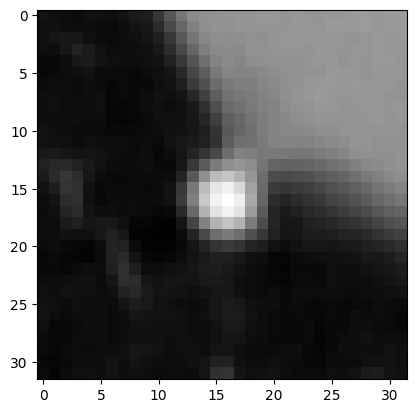

torch.Size([1, 5, 32, 32]) tensor([0.])


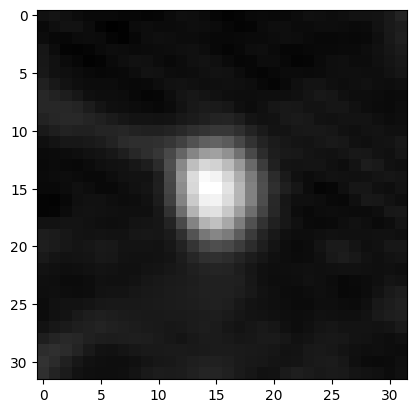

torch.Size([1, 5, 32, 32]) tensor([1.])


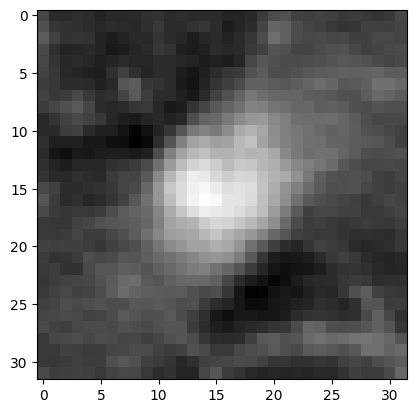

torch.Size([1, 5, 32, 32]) tensor([0.])


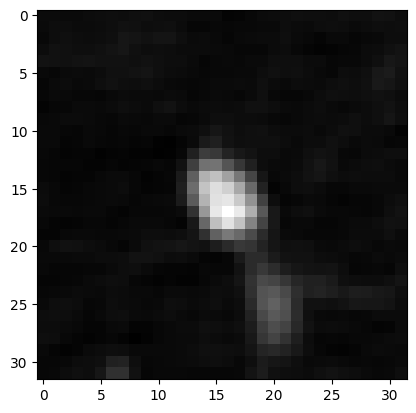

torch.Size([1, 5, 32, 32]) tensor([0.])


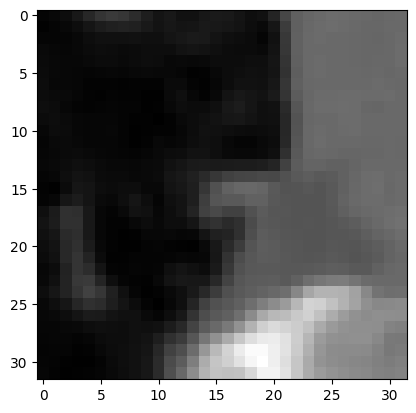

torch.Size([1, 5, 32, 32]) tensor([1.])


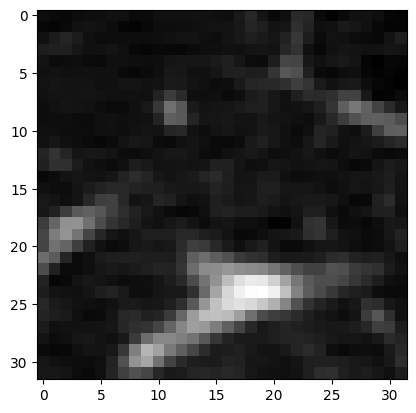

torch.Size([1, 5, 32, 32]) tensor([1.])


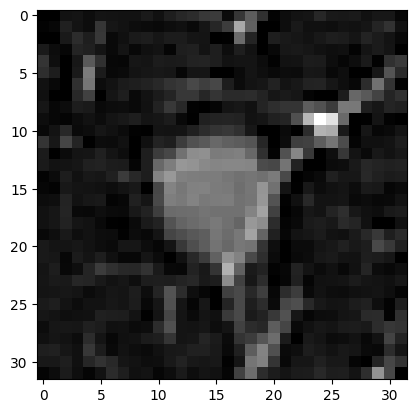

torch.Size([1, 5, 32, 32]) tensor([0.])


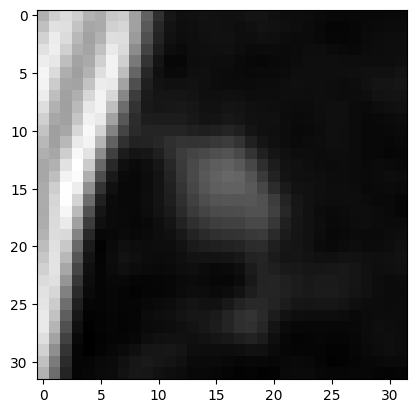

torch.Size([1, 5, 32, 32]) tensor([0.])


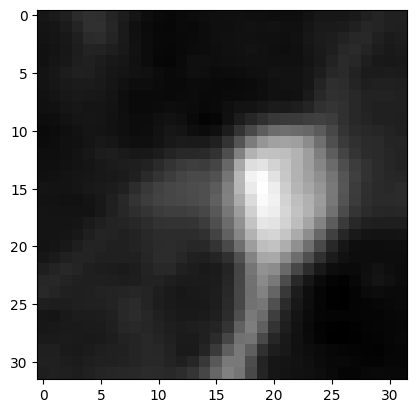

torch.Size([1, 5, 32, 32]) tensor([0.])


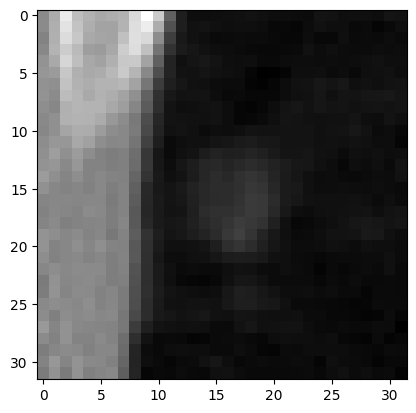

torch.Size([1, 5, 32, 32]) tensor([0.])


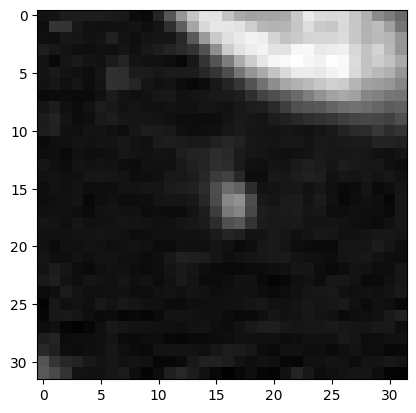

torch.Size([1, 5, 32, 32]) tensor([0.])


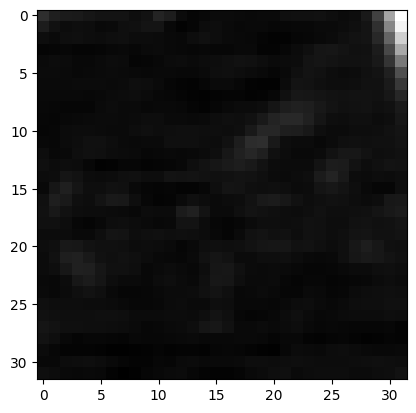

torch.Size([1, 5, 32, 32]) tensor([0.])


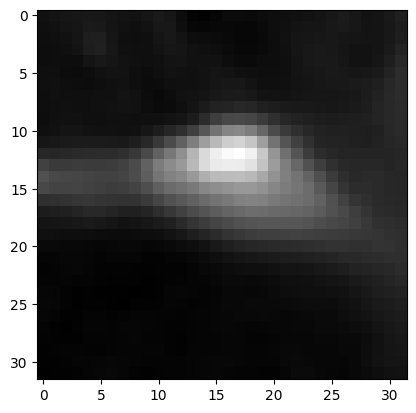

torch.Size([1, 5, 32, 32]) tensor([1.])


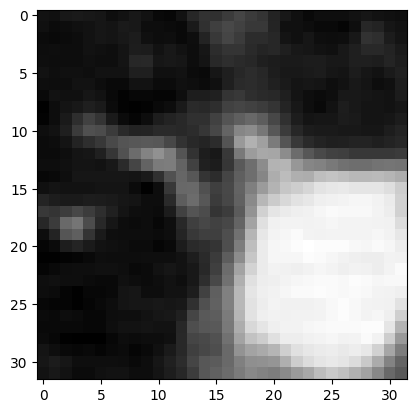

torch.Size([1, 5, 32, 32]) tensor([0.])


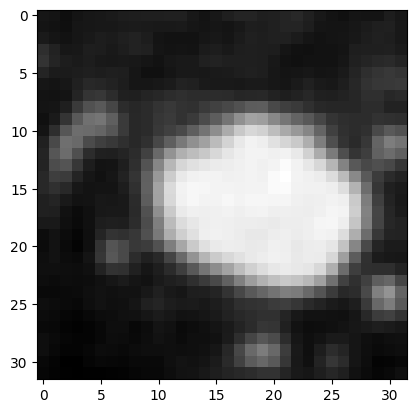

torch.Size([1, 5, 32, 32]) tensor([0.])


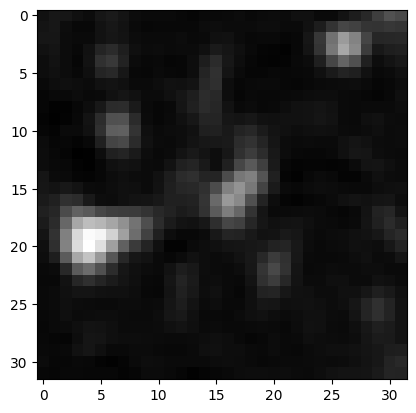

torch.Size([1, 5, 32, 32]) tensor([0.])


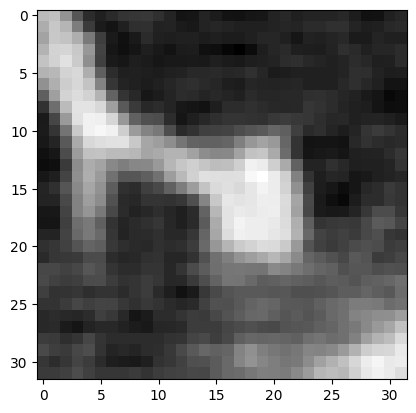

torch.Size([1, 5, 32, 32]) tensor([0.])


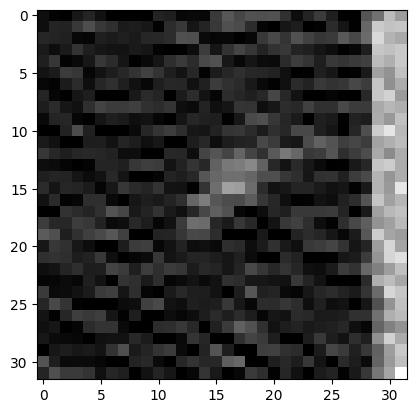

torch.Size([1, 5, 32, 32]) tensor([1.])


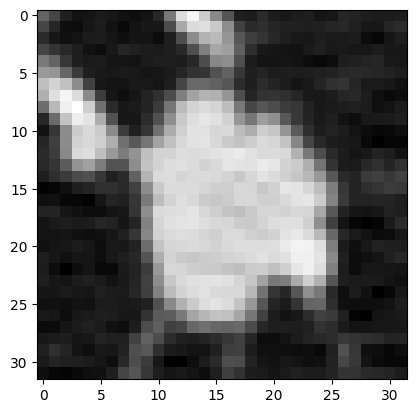

torch.Size([1, 5, 32, 32]) tensor([0.])


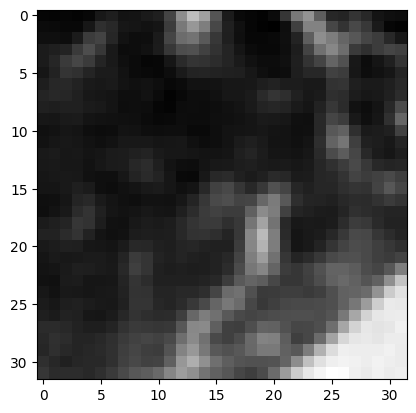

torch.Size([1, 5, 32, 32]) tensor([0.])


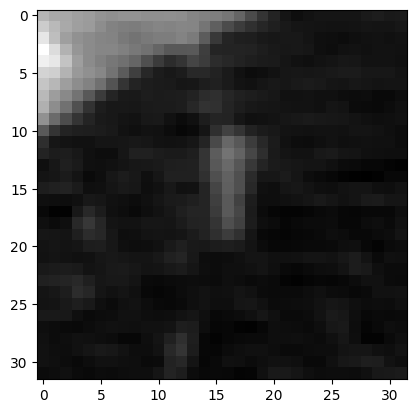

torch.Size([1, 5, 32, 32]) tensor([0.])


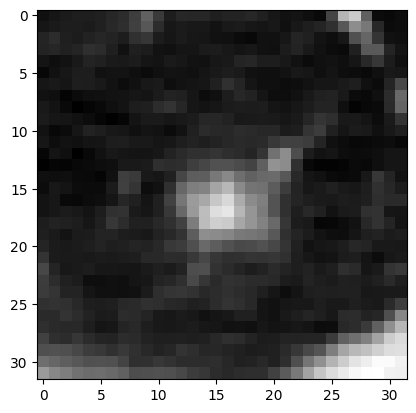

torch.Size([1, 5, 32, 32]) tensor([0.])


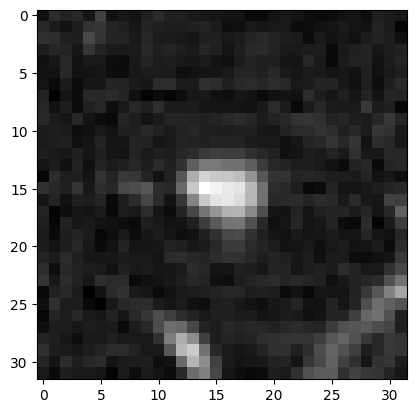

torch.Size([1, 5, 32, 32]) tensor([1.])


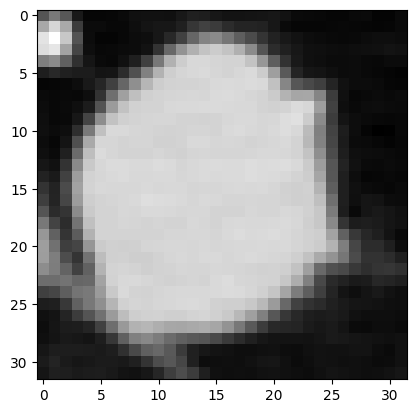

torch.Size([1, 5, 32, 32]) tensor([1.])


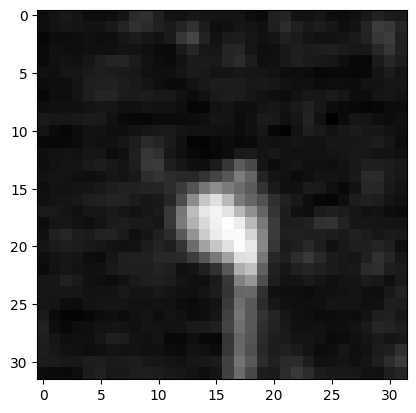

torch.Size([1, 5, 32, 32]) tensor([1.])


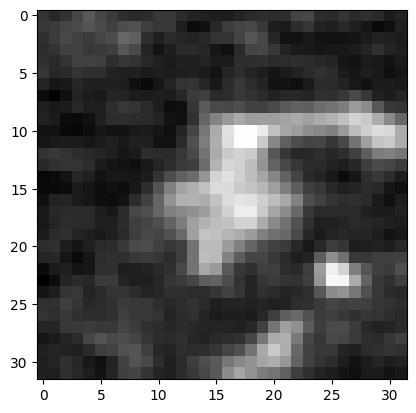

torch.Size([1, 5, 32, 32]) tensor([1.])


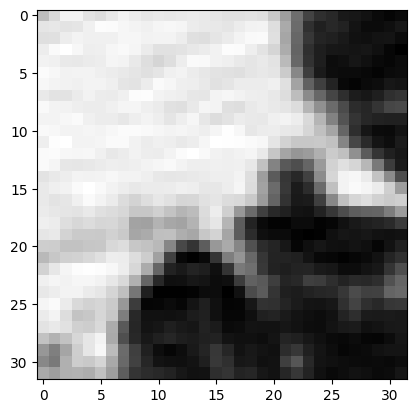

torch.Size([1, 5, 32, 32]) tensor([0.])


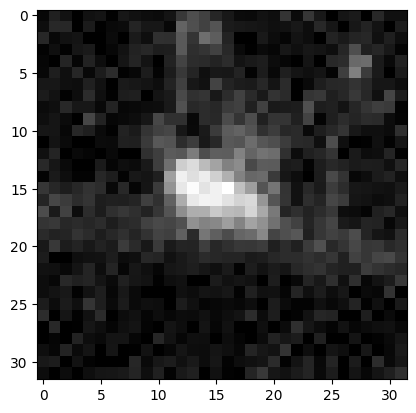

torch.Size([1, 5, 32, 32]) tensor([0.])


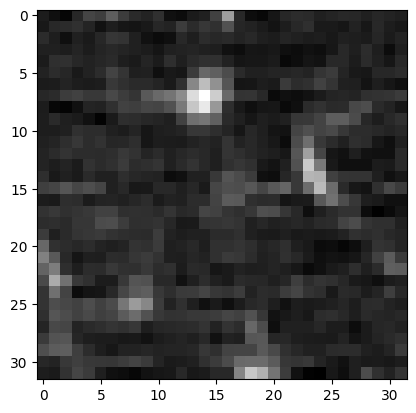

torch.Size([1, 5, 32, 32]) tensor([0.])


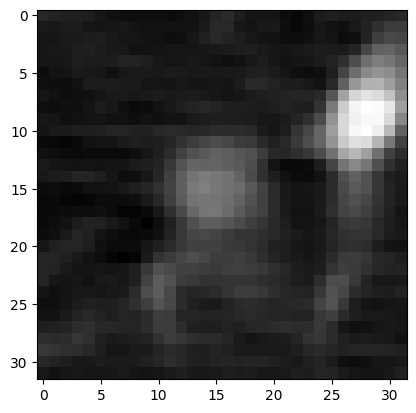

torch.Size([1, 5, 32, 32]) tensor([0.])


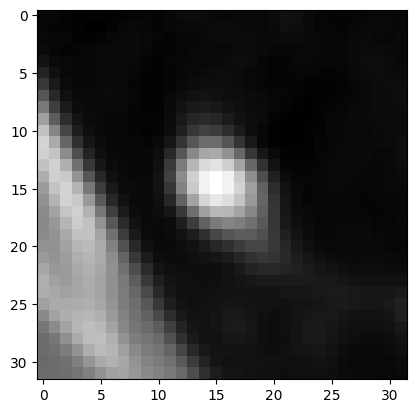

torch.Size([1, 5, 32, 32]) tensor([0.])


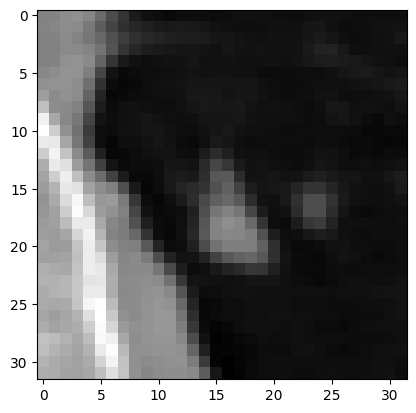

torch.Size([1, 5, 32, 32]) tensor([0.])


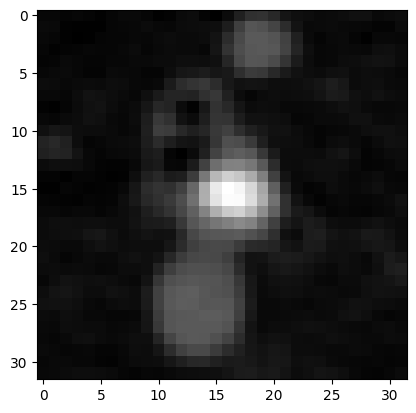

torch.Size([1, 5, 32, 32]) tensor([0.])


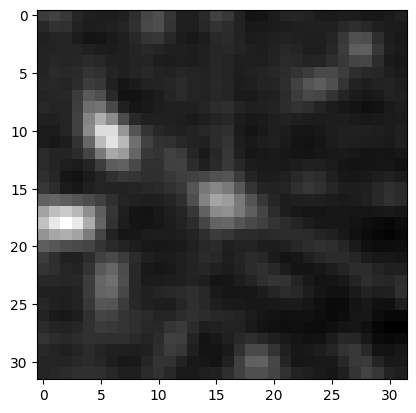

torch.Size([1, 5, 32, 32]) tensor([0.])


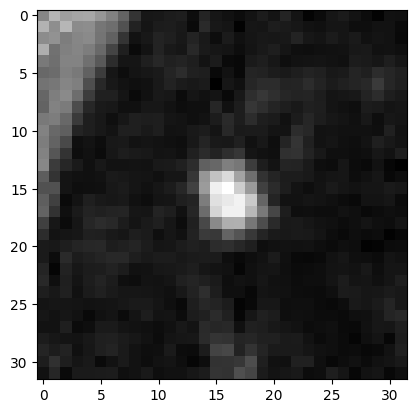

torch.Size([1, 5, 32, 32]) tensor([1.])


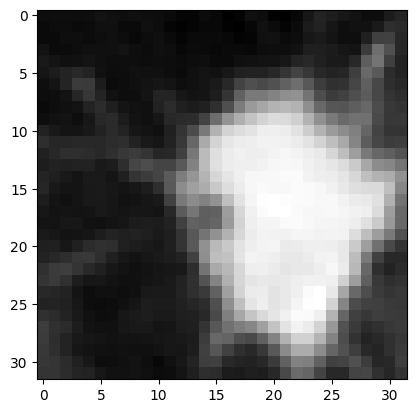

torch.Size([1, 5, 32, 32]) tensor([0.])


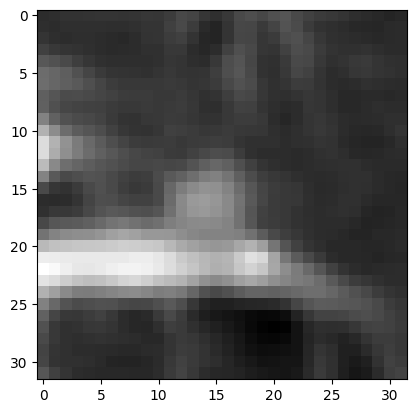

torch.Size([1, 5, 32, 32]) tensor([0.])


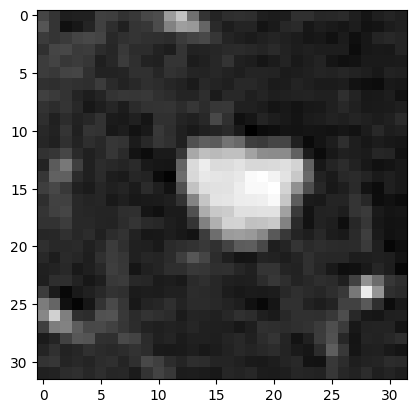

torch.Size([1, 5, 32, 32]) tensor([1.])


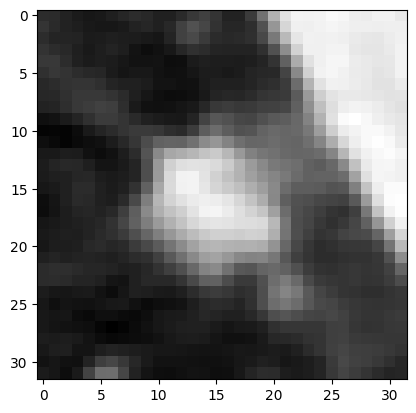

torch.Size([1, 5, 32, 32]) tensor([0.])


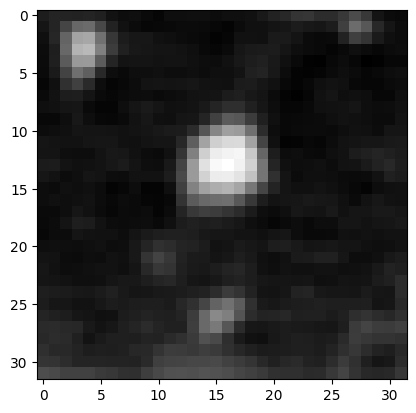

torch.Size([1, 5, 32, 32]) tensor([0.])


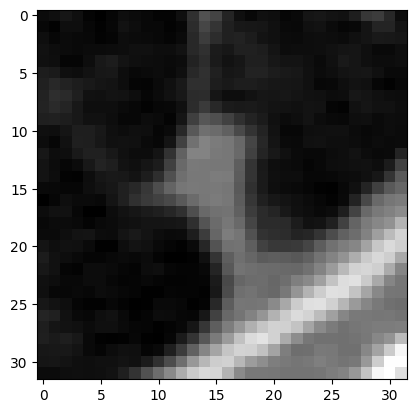

torch.Size([1, 5, 32, 32]) tensor([0.])


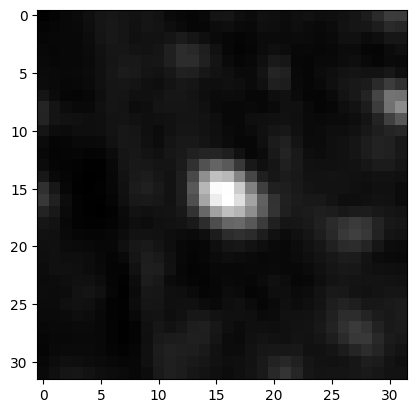

torch.Size([1, 5, 32, 32]) tensor([0.])


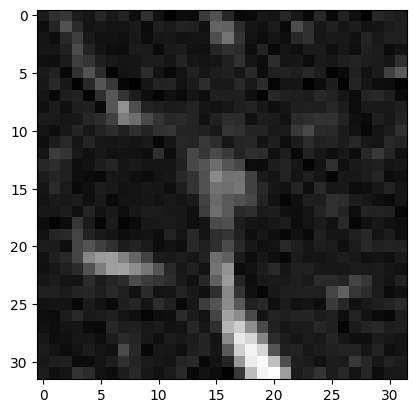

torch.Size([1, 5, 32, 32]) tensor([1.])


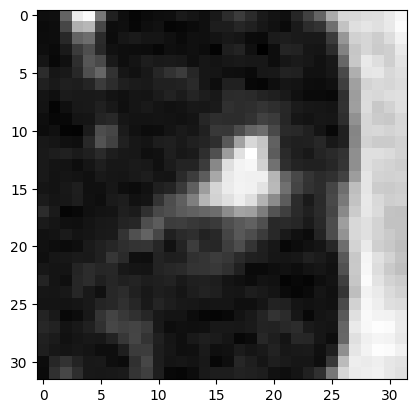

torch.Size([1, 5, 32, 32]) tensor([0.])


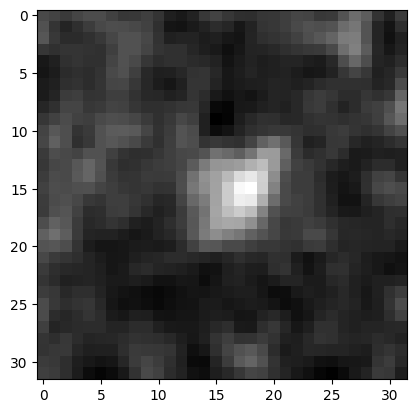

torch.Size([1, 5, 32, 32]) tensor([0.])


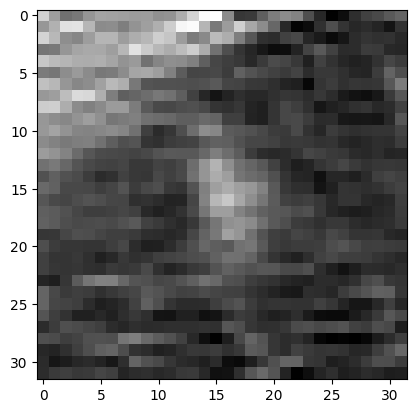

torch.Size([1, 5, 32, 32]) tensor([0.])


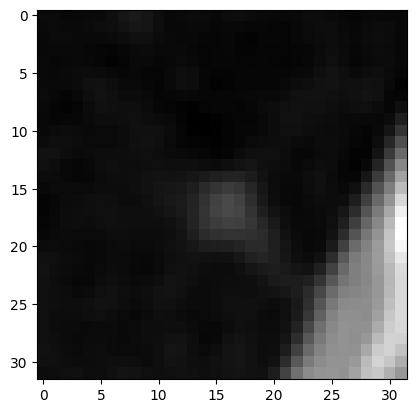

torch.Size([1, 5, 32, 32]) tensor([0.])


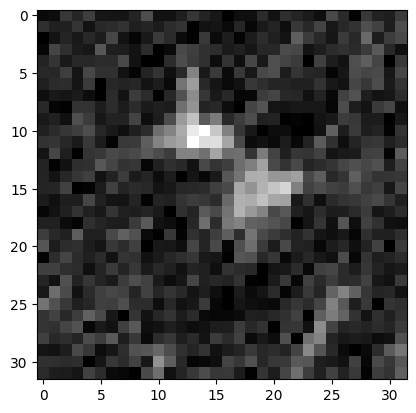

torch.Size([1, 5, 32, 32]) tensor([0.])


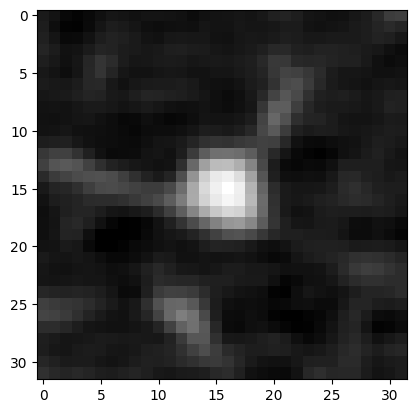

torch.Size([1, 5, 32, 32]) tensor([0.])


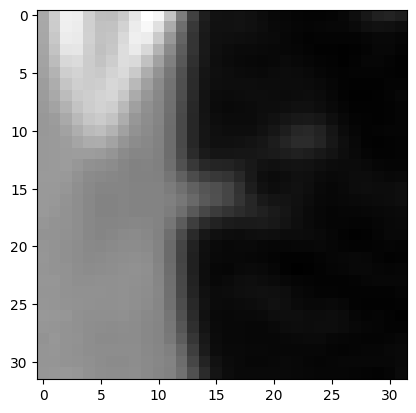

torch.Size([1, 5, 32, 32]) tensor([1.])


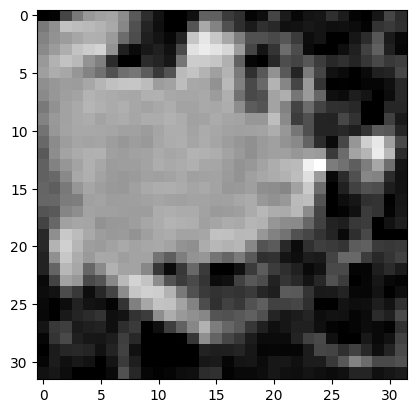

torch.Size([1, 5, 32, 32]) tensor([0.])


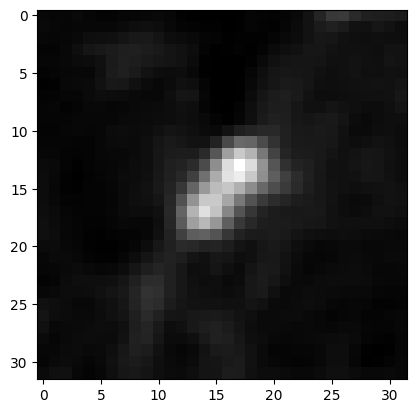

torch.Size([1, 5, 32, 32]) tensor([0.])


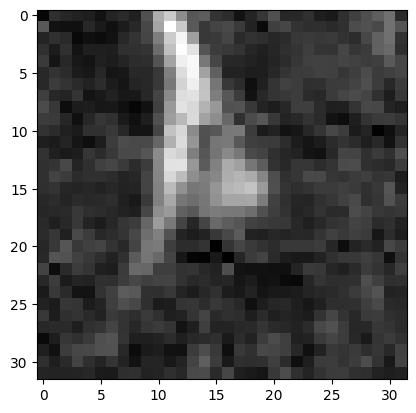

torch.Size([1, 5, 32, 32]) tensor([1.])


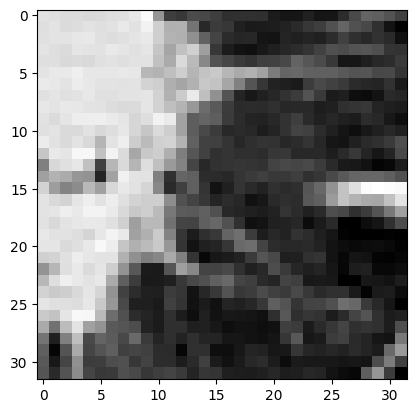

torch.Size([1, 5, 32, 32]) tensor([0.])


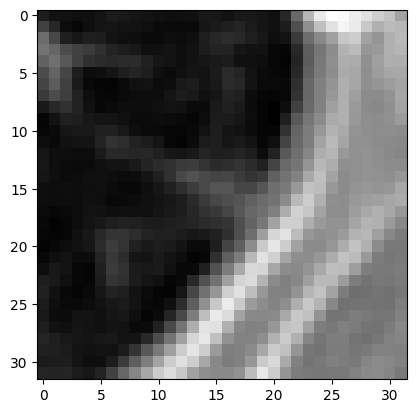

torch.Size([1, 5, 32, 32]) tensor([1.])


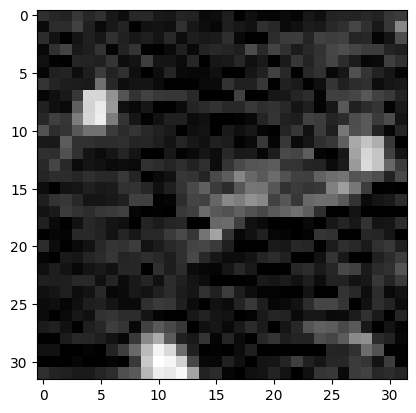

torch.Size([1, 5, 32, 32]) tensor([0.])


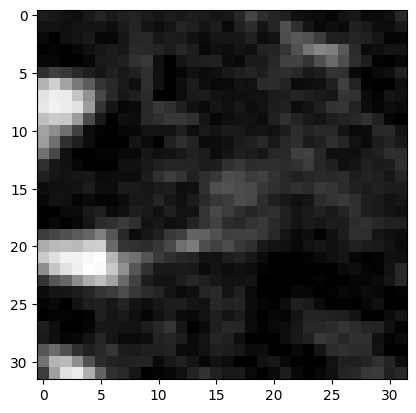

torch.Size([1, 5, 32, 32]) tensor([1.])


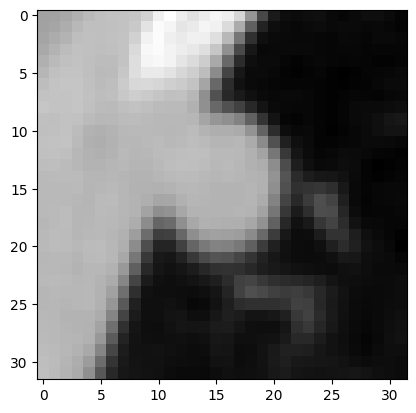

torch.Size([1, 5, 32, 32]) tensor([1.])


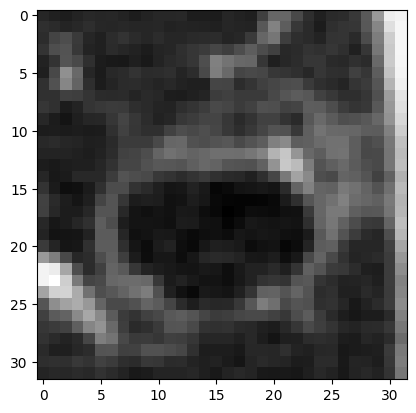

torch.Size([1, 5, 32, 32]) tensor([0.])


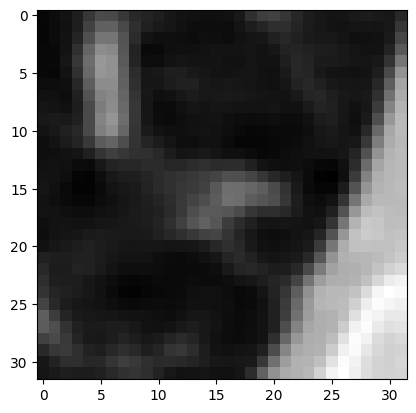

torch.Size([1, 5, 32, 32]) tensor([0.])


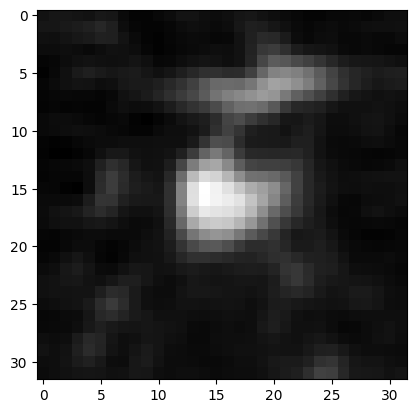

torch.Size([1, 5, 32, 32]) tensor([1.])


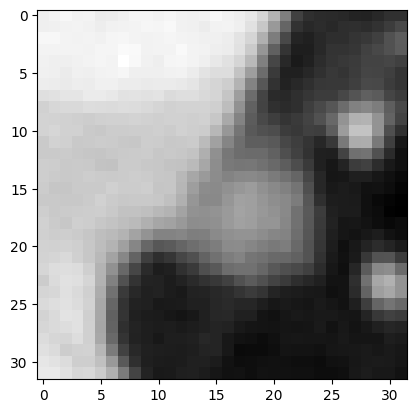

torch.Size([1, 5, 32, 32]) tensor([0.])


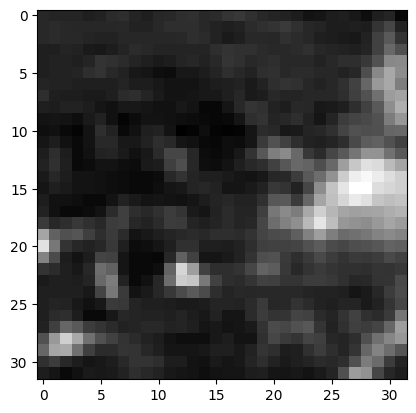

torch.Size([1, 5, 32, 32]) tensor([0.])


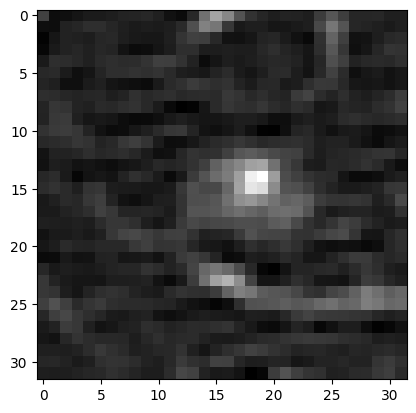

torch.Size([1, 5, 32, 32]) tensor([1.])


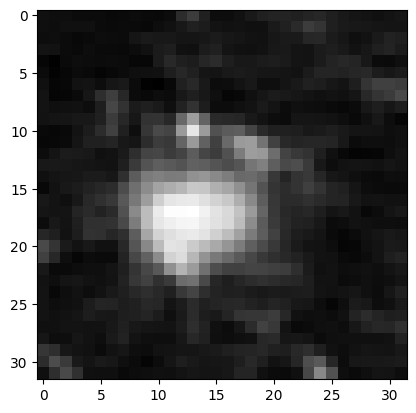

torch.Size([1, 5, 32, 32]) tensor([0.])


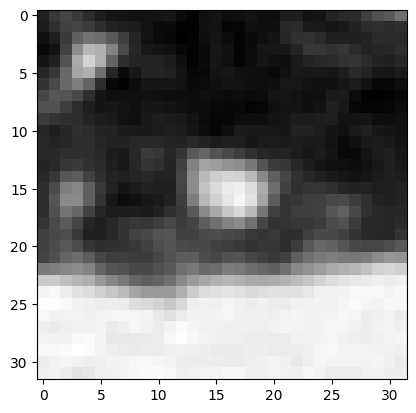

torch.Size([1, 5, 32, 32]) tensor([0.])


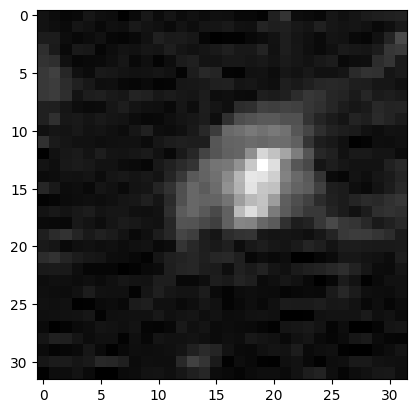

torch.Size([1, 5, 32, 32]) tensor([0.])


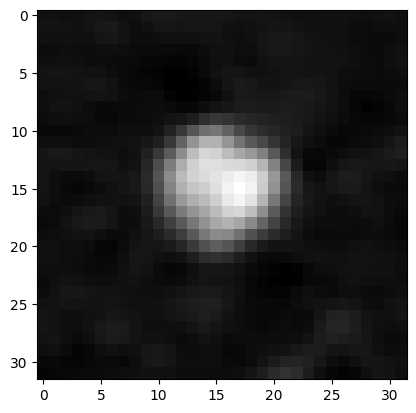

torch.Size([1, 5, 32, 32]) tensor([0.])


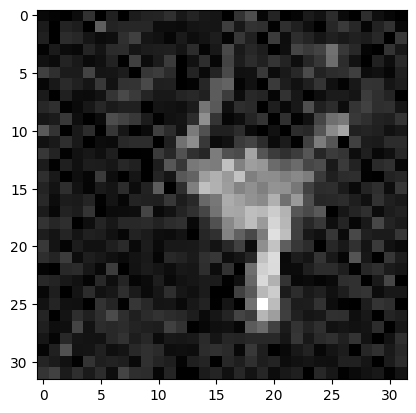

torch.Size([1, 5, 32, 32]) tensor([0.])


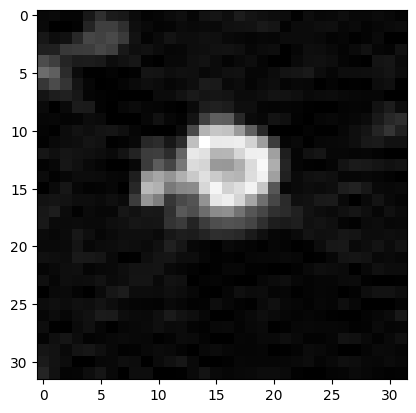

torch.Size([1, 5, 32, 32]) tensor([0.])


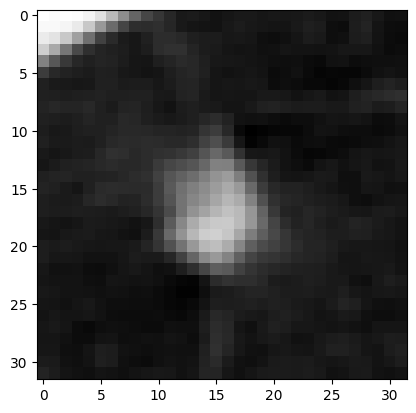

torch.Size([1, 5, 32, 32]) tensor([1.])


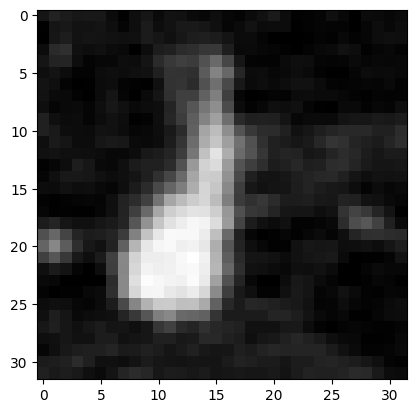

torch.Size([1, 5, 32, 32]) tensor([0.])


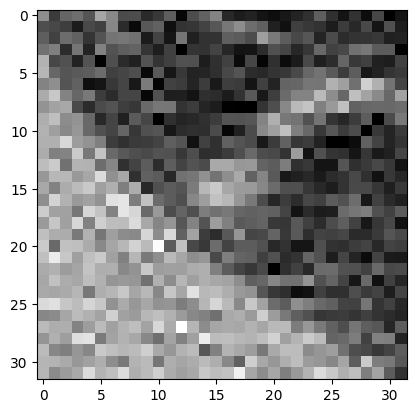

torch.Size([1, 5, 32, 32]) tensor([0.])


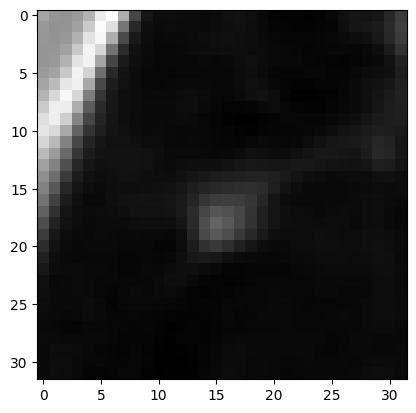

torch.Size([1, 5, 32, 32]) tensor([1.])


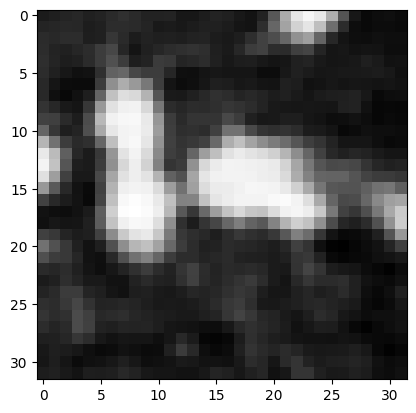

torch.Size([1, 5, 32, 32]) tensor([1.])


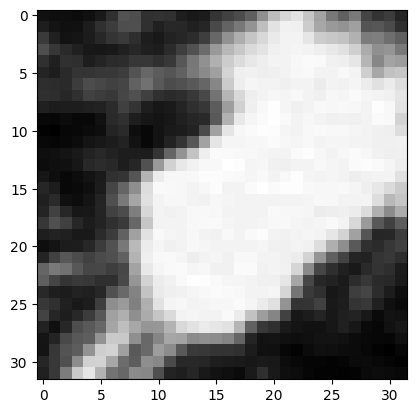

torch.Size([1, 5, 32, 32]) tensor([1.])


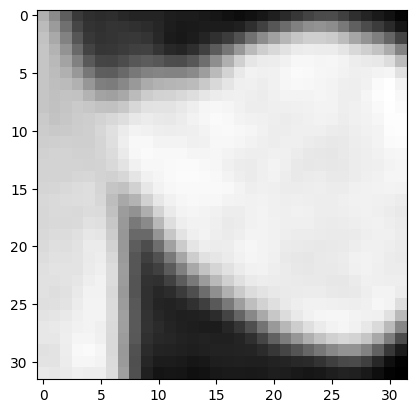

torch.Size([1, 5, 32, 32]) tensor([0.])


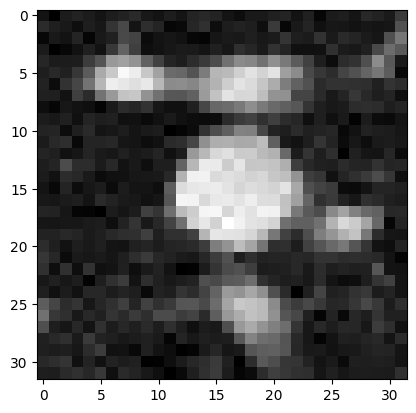

torch.Size([1, 5, 32, 32]) tensor([1.])


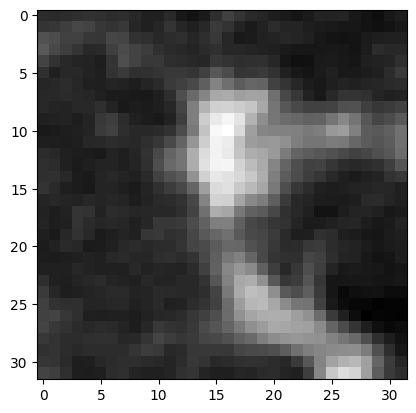

torch.Size([1, 5, 32, 32]) tensor([0.])


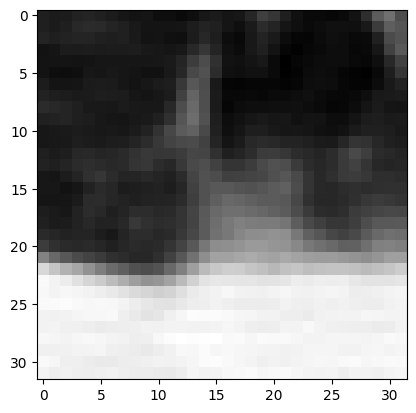

torch.Size([1, 5, 32, 32]) tensor([0.])


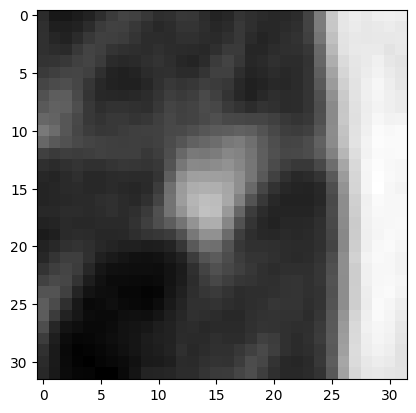

torch.Size([1, 5, 32, 32]) tensor([0.])


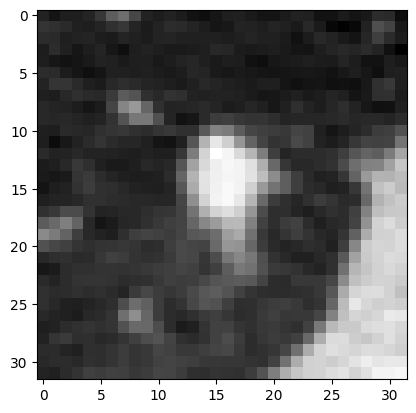

torch.Size([1, 5, 32, 32]) tensor([1.])


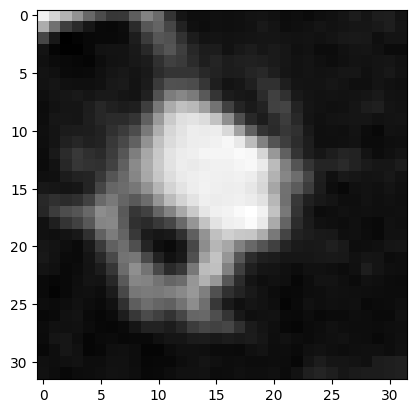

torch.Size([1, 5, 32, 32]) tensor([1.])


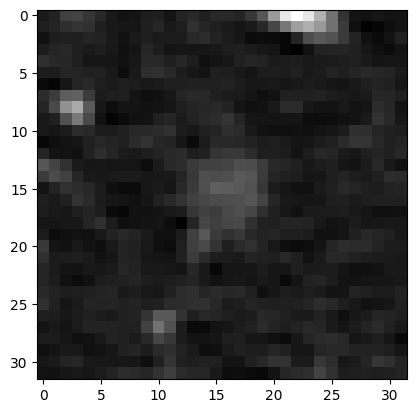

torch.Size([1, 5, 32, 32]) tensor([0.])


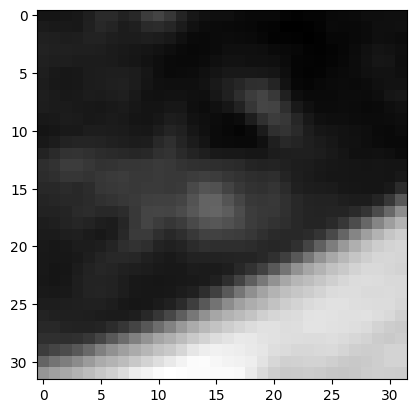

torch.Size([1, 5, 32, 32]) tensor([0.])


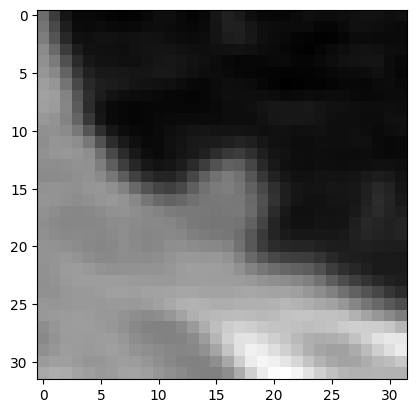

torch.Size([1, 5, 32, 32]) tensor([0.])


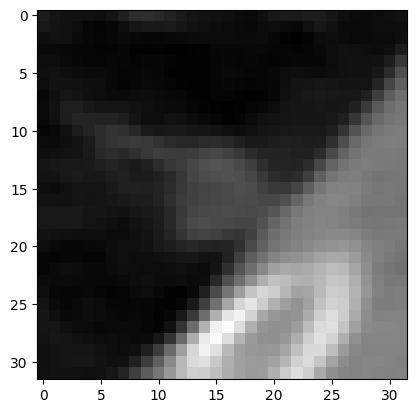

torch.Size([1, 5, 32, 32]) tensor([0.])


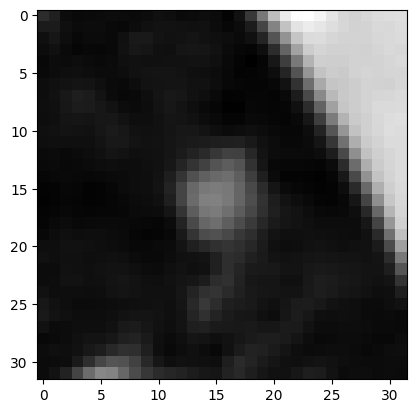

torch.Size([1, 5, 32, 32]) tensor([0.])


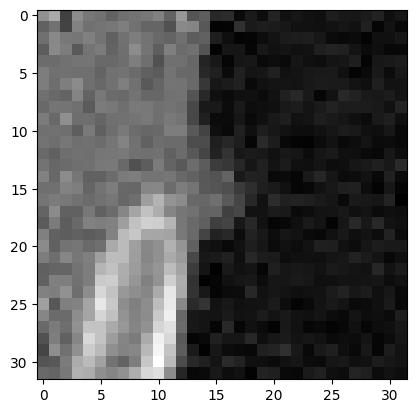

torch.Size([1, 5, 32, 32]) tensor([0.])


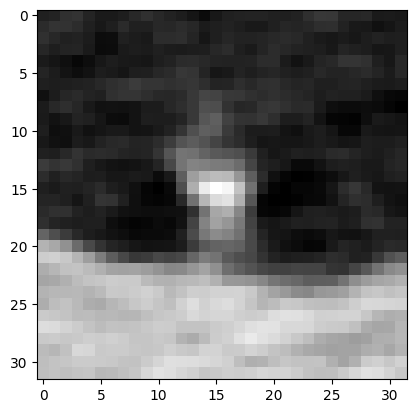

torch.Size([1, 5, 32, 32]) tensor([1.])


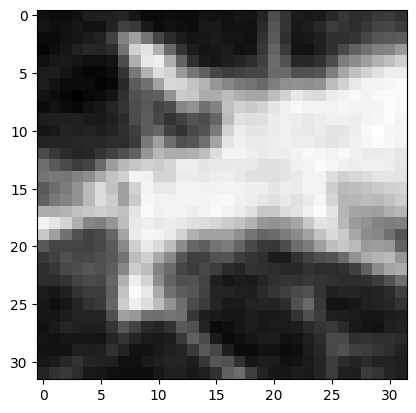

torch.Size([1, 5, 32, 32]) tensor([0.])


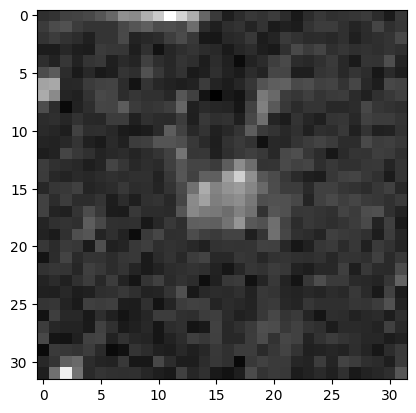

torch.Size([1, 5, 32, 32]) tensor([1.])


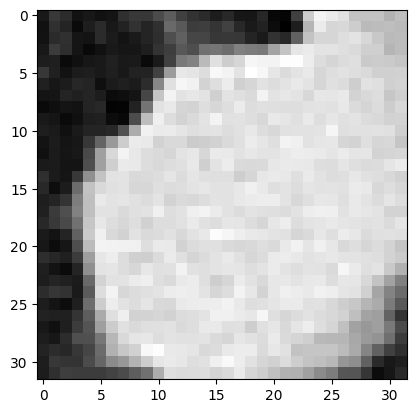

torch.Size([1, 5, 32, 32]) tensor([1.])


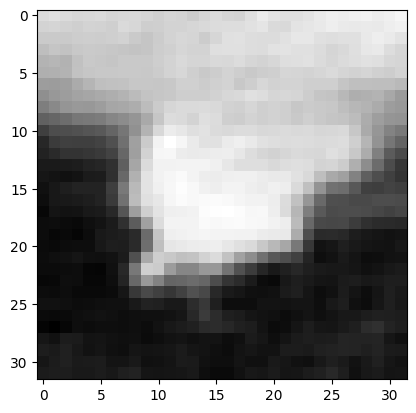

torch.Size([1, 5, 32, 32]) tensor([1.])


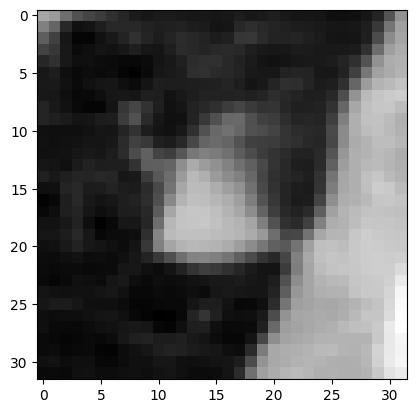

torch.Size([1, 5, 32, 32]) tensor([1.])


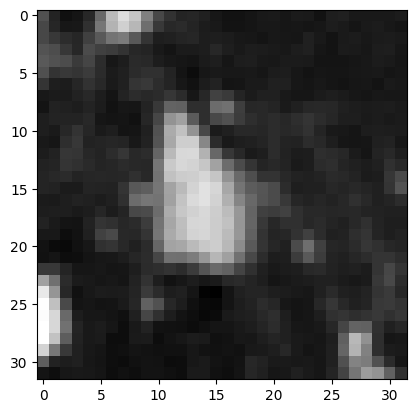

torch.Size([1, 5, 32, 32]) tensor([0.])


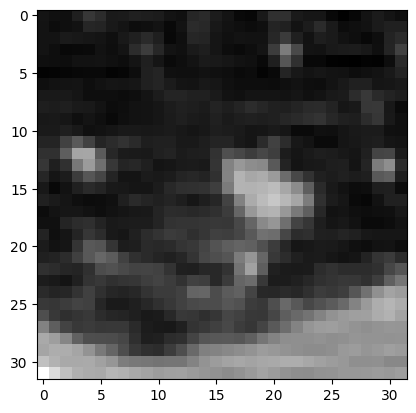

torch.Size([1, 5, 32, 32]) tensor([0.])


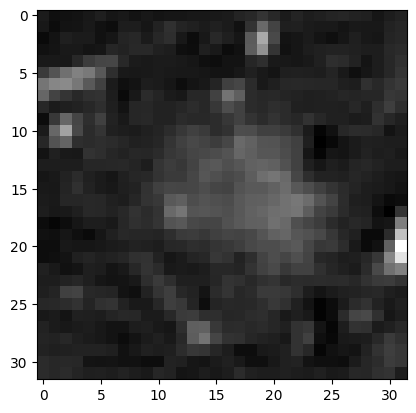

torch.Size([1, 5, 32, 32]) tensor([0.])


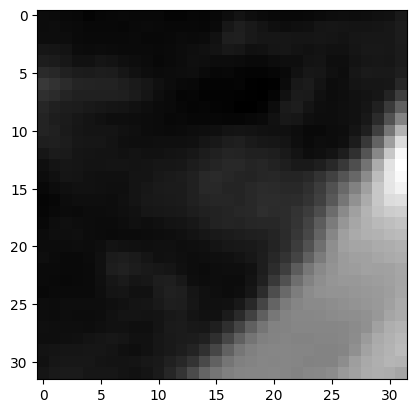

torch.Size([1, 5, 32, 32]) tensor([1.])


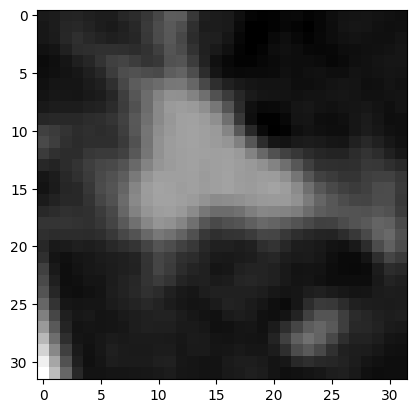

torch.Size([1, 5, 32, 32]) tensor([1.])


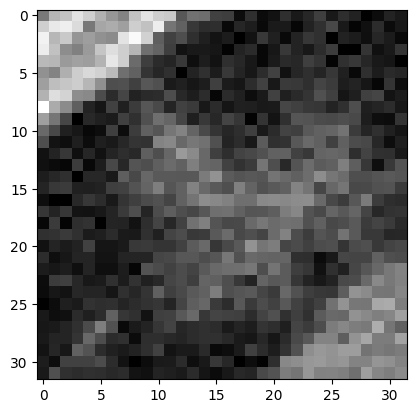

torch.Size([1, 5, 32, 32]) tensor([0.])


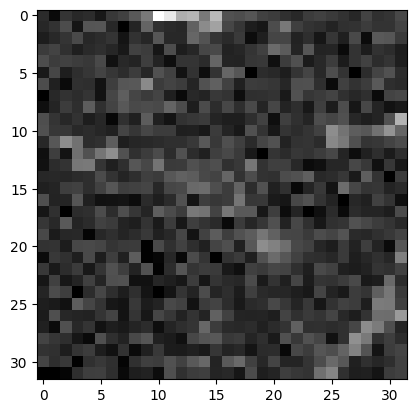

torch.Size([1, 5, 32, 32]) tensor([1.])


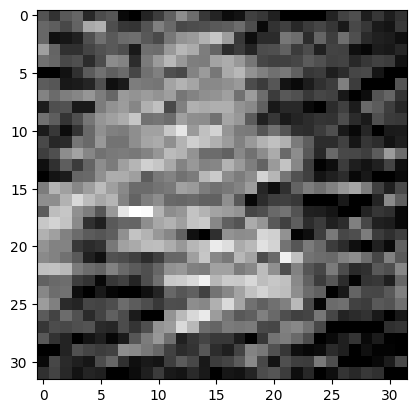

torch.Size([1, 5, 32, 32]) tensor([0.])


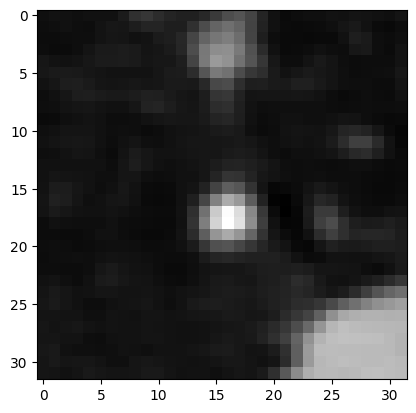

torch.Size([1, 5, 32, 32]) tensor([0.])


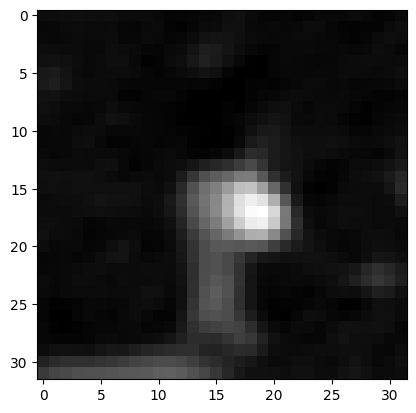

torch.Size([1, 5, 32, 32]) tensor([1.])


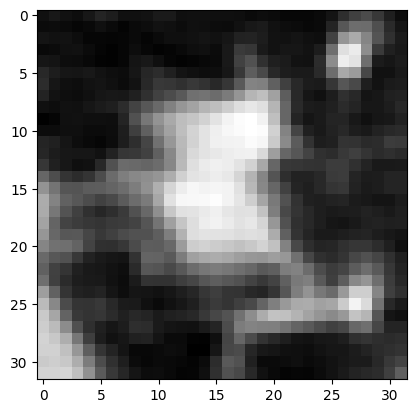

torch.Size([1, 5, 32, 32]) tensor([0.])


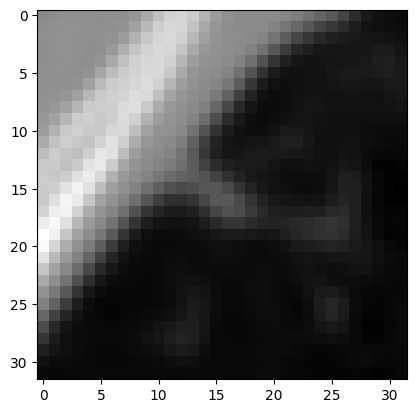

torch.Size([1, 5, 32, 32]) tensor([0.])


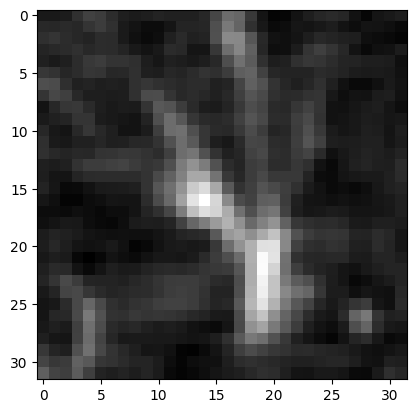

torch.Size([1, 5, 32, 32]) tensor([1.])


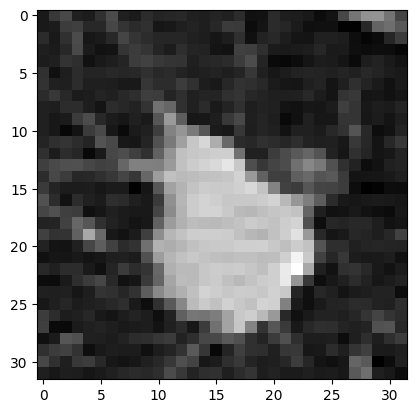

torch.Size([1, 5, 32, 32]) tensor([1.])


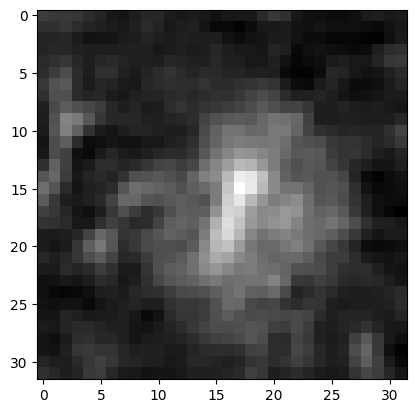

torch.Size([1, 5, 32, 32]) tensor([0.])


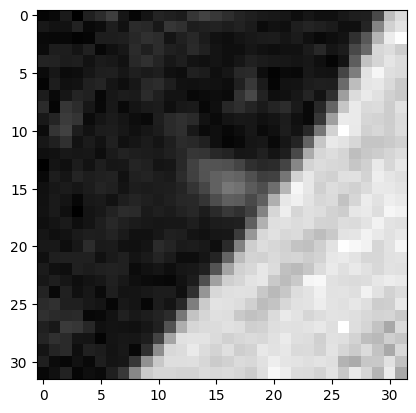

torch.Size([1, 5, 32, 32]) tensor([0.])


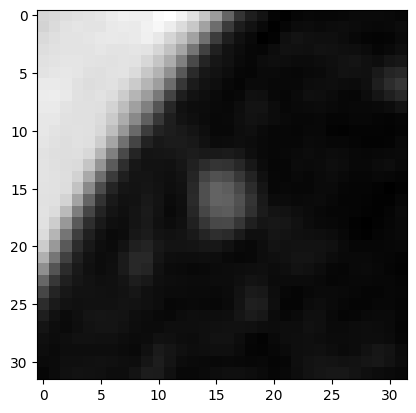

torch.Size([1, 5, 32, 32]) tensor([1.])


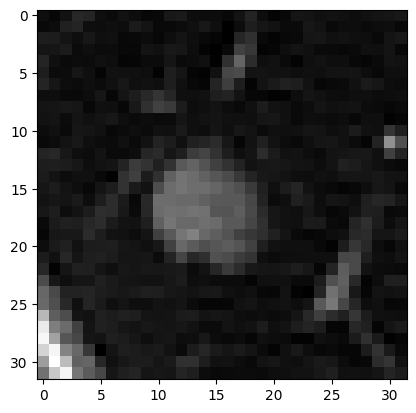

torch.Size([1, 5, 32, 32]) tensor([1.])


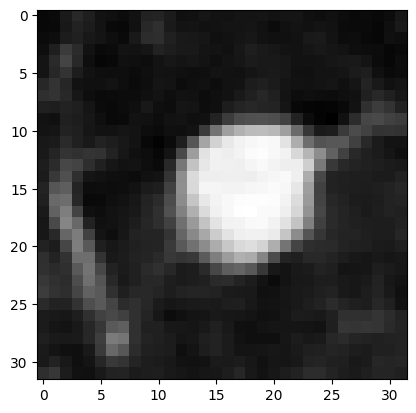

torch.Size([1, 5, 32, 32]) tensor([1.])


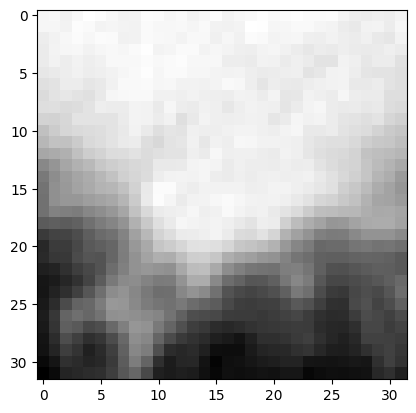

torch.Size([1, 5, 32, 32]) tensor([0.])


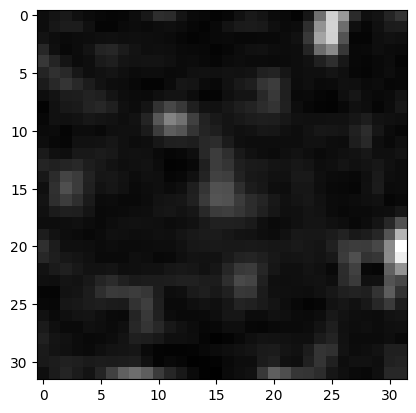

torch.Size([1, 5, 32, 32]) tensor([0.])


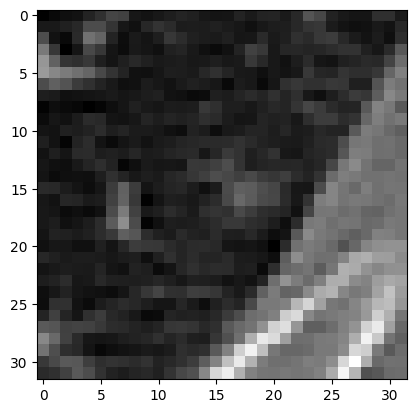

torch.Size([1, 5, 32, 32]) tensor([1.])


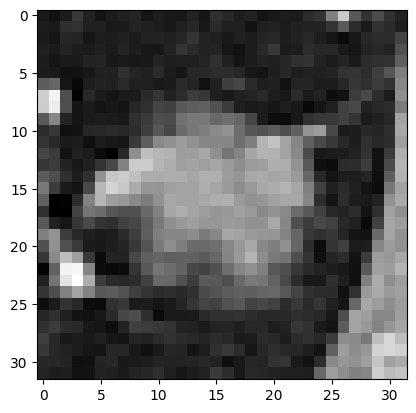

torch.Size([1, 5, 32, 32]) tensor([0.])


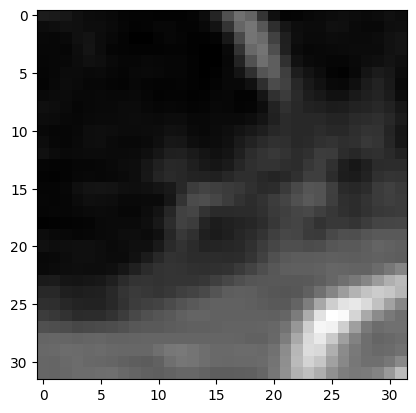

torch.Size([1, 5, 32, 32]) tensor([0.])


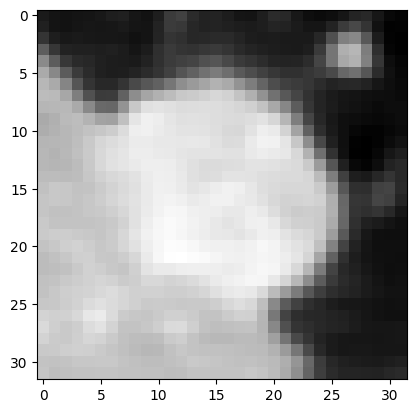

torch.Size([1, 5, 32, 32]) tensor([0.])


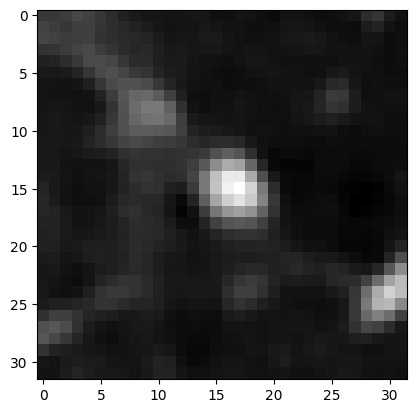

torch.Size([1, 5, 32, 32]) tensor([0.])


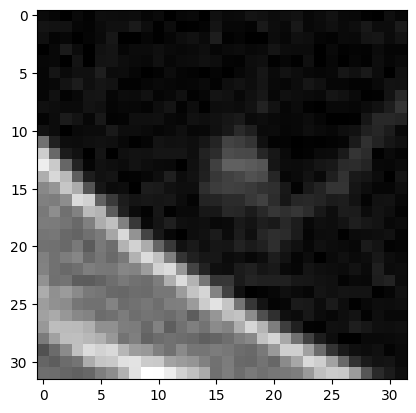

torch.Size([1, 5, 32, 32]) tensor([0.])


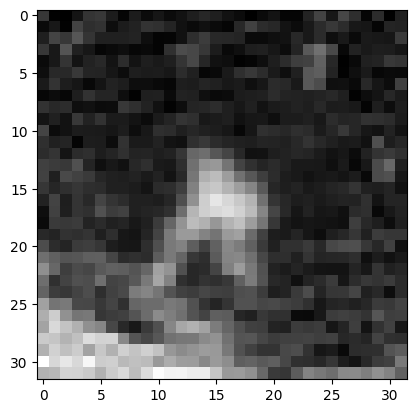

torch.Size([1, 5, 32, 32]) tensor([1.])


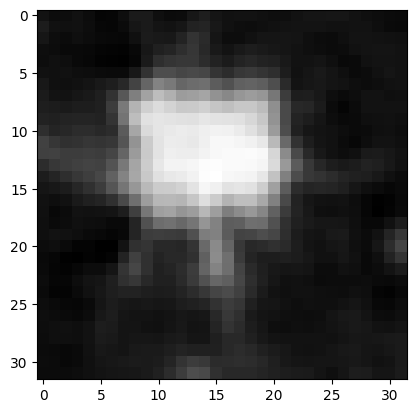

torch.Size([1, 5, 32, 32]) tensor([0.])


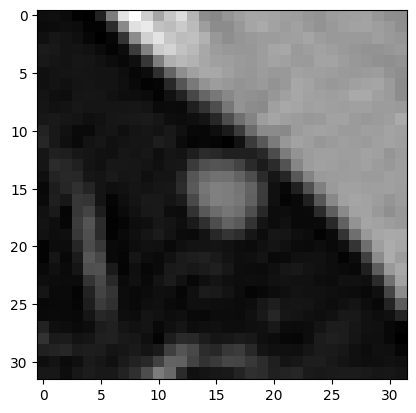

torch.Size([1, 5, 32, 32]) tensor([1.])


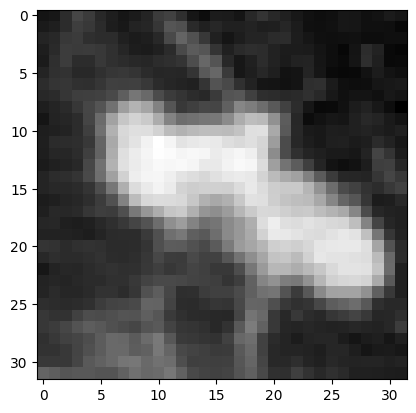

torch.Size([1, 5, 32, 32]) tensor([1.])


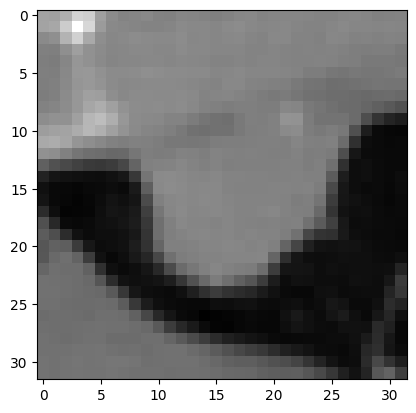

torch.Size([1, 5, 32, 32]) tensor([0.])


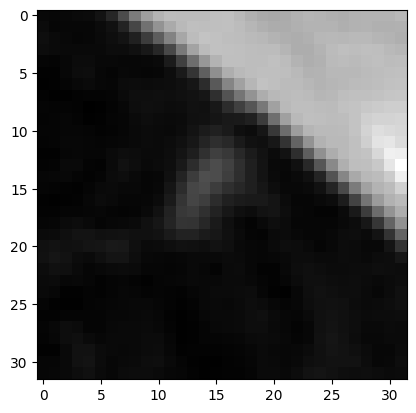

torch.Size([1, 5, 32, 32]) tensor([1.])


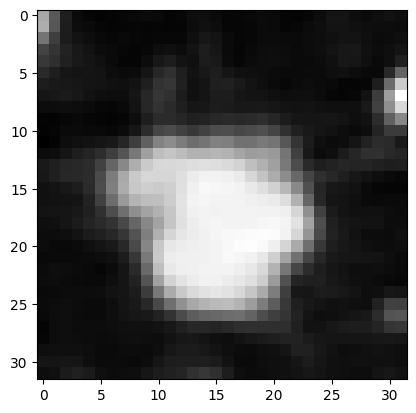

torch.Size([1, 5, 32, 32]) tensor([0.])


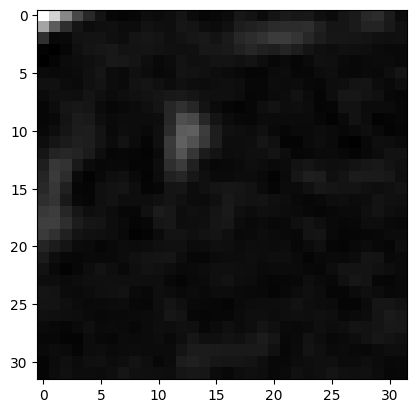

torch.Size([1, 5, 32, 32]) tensor([0.])


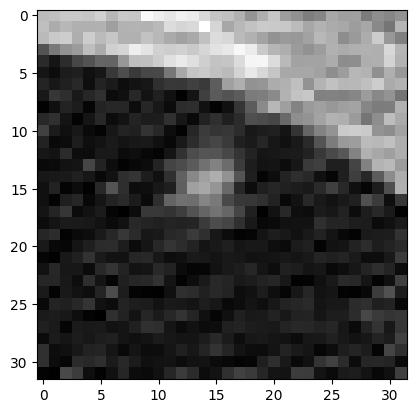

torch.Size([1, 5, 32, 32]) tensor([0.])


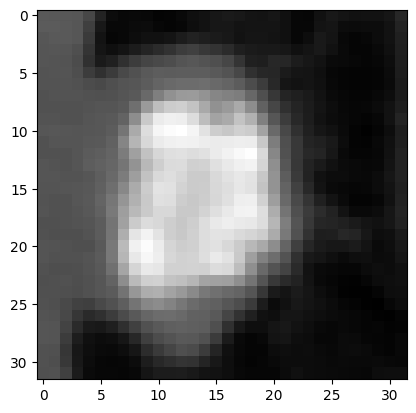

torch.Size([1, 5, 32, 32]) tensor([0.])


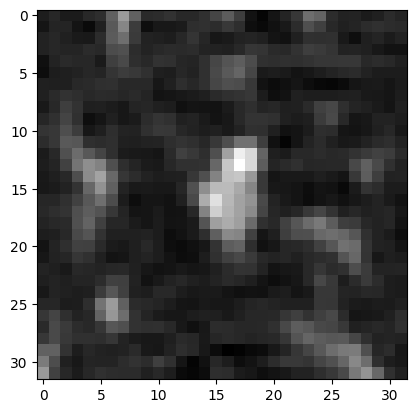

torch.Size([1, 5, 32, 32]) tensor([1.])


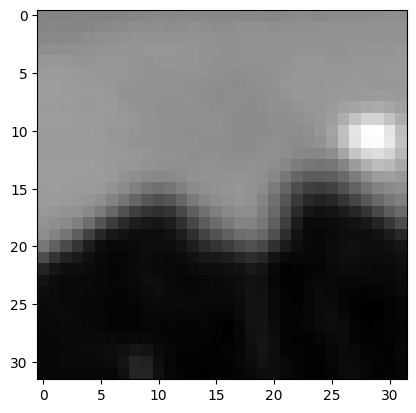

torch.Size([1, 5, 32, 32]) tensor([0.])


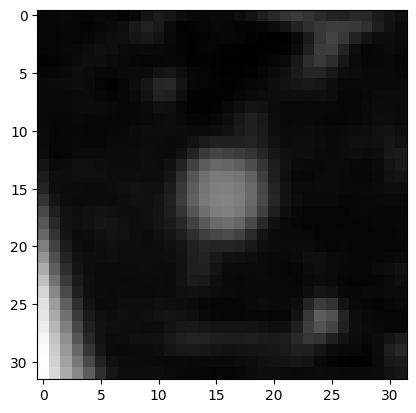

torch.Size([1, 5, 32, 32]) tensor([0.])


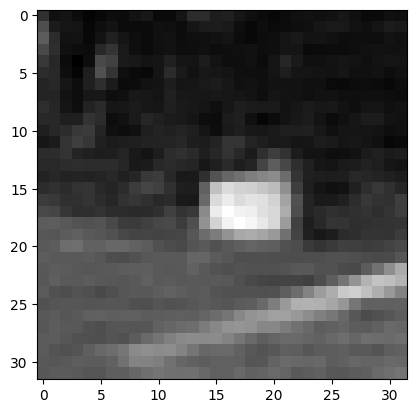

torch.Size([1, 5, 32, 32]) tensor([0.])


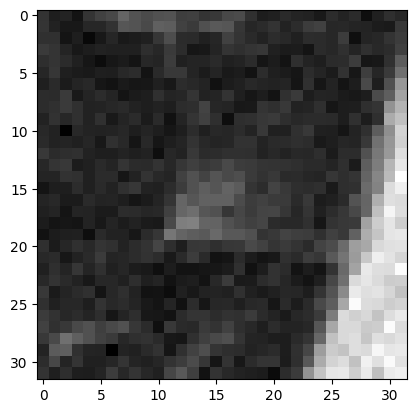

torch.Size([1, 5, 32, 32]) tensor([0.])


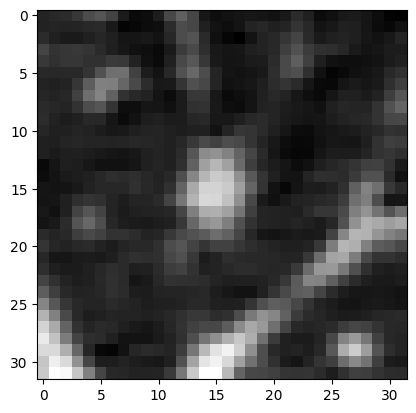

torch.Size([1, 5, 32, 32]) tensor([0.])


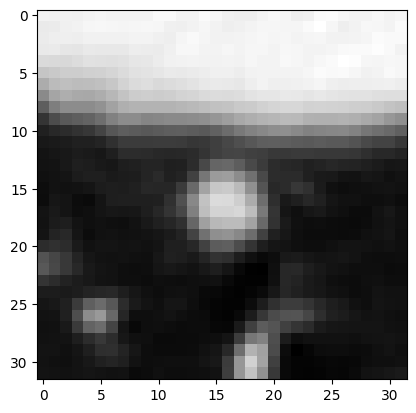

torch.Size([1, 5, 32, 32]) tensor([0.])


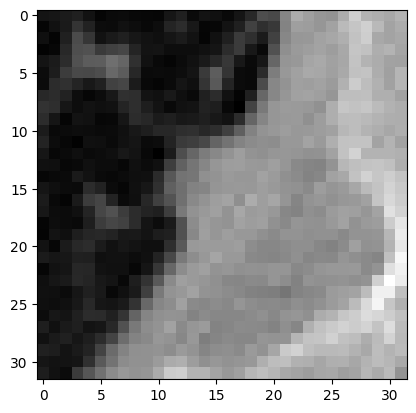

torch.Size([1, 5, 32, 32]) tensor([1.])


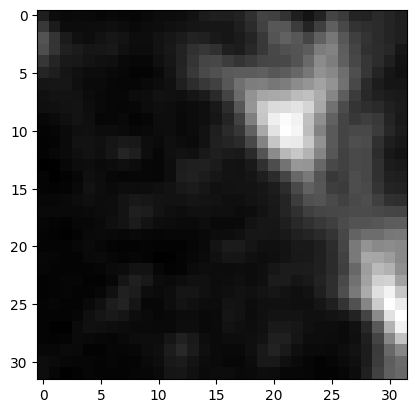

torch.Size([1, 5, 32, 32]) tensor([0.])


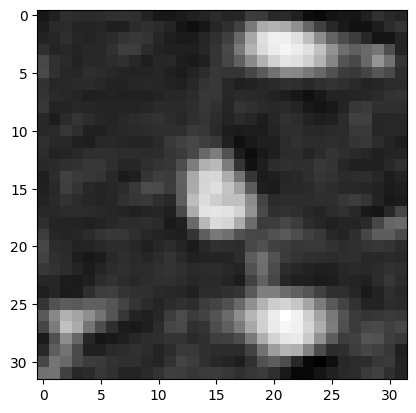

torch.Size([1, 5, 32, 32]) tensor([0.])


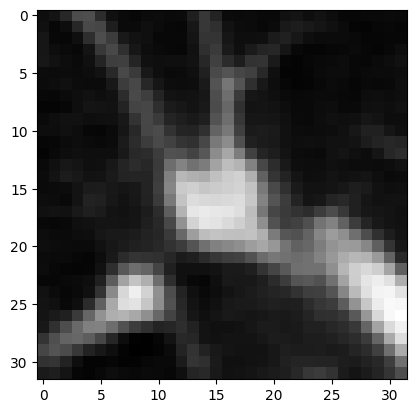

torch.Size([1, 5, 32, 32]) tensor([1.])


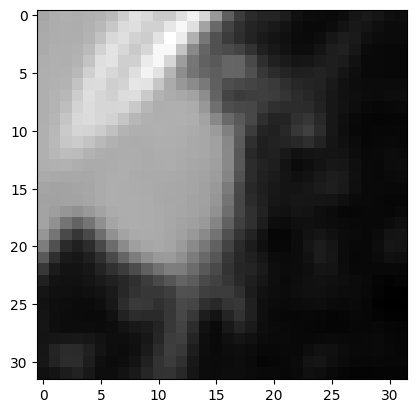

torch.Size([1, 5, 32, 32]) tensor([0.])


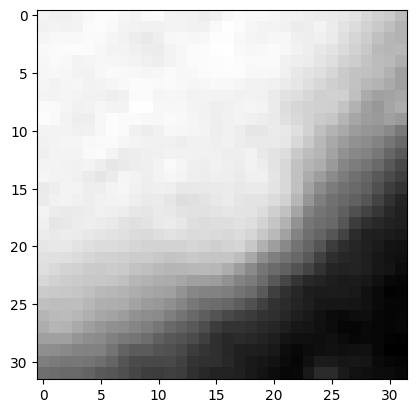

torch.Size([1, 5, 32, 32]) tensor([0.])


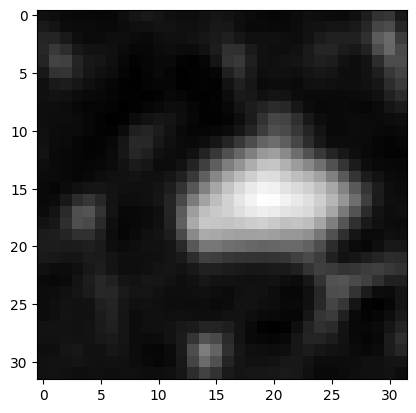

torch.Size([1, 5, 32, 32]) tensor([1.])


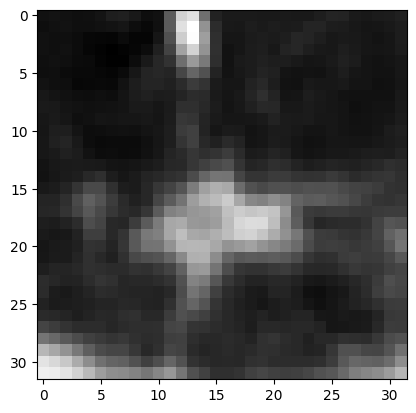

torch.Size([1, 5, 32, 32]) tensor([0.])


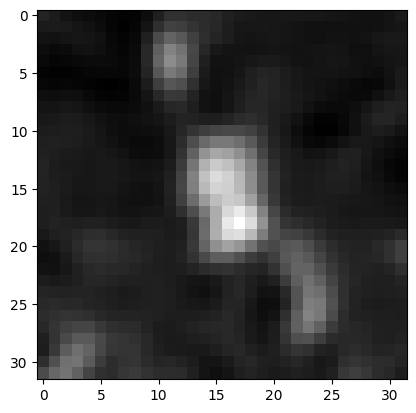

torch.Size([1, 5, 32, 32]) tensor([0.])


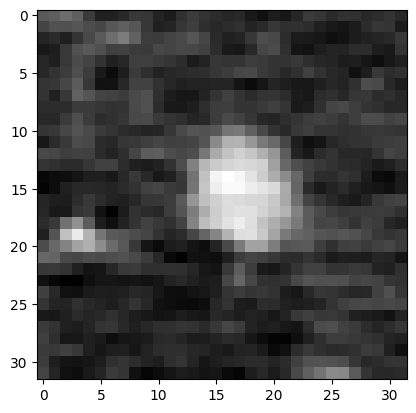

torch.Size([1, 5, 32, 32]) tensor([0.])


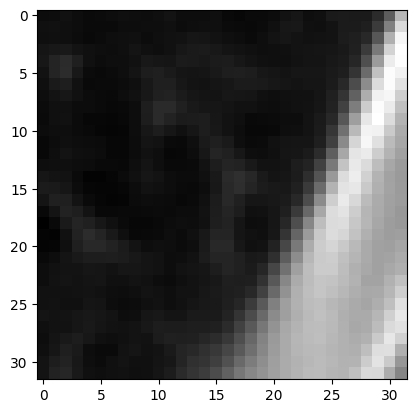

torch.Size([1, 5, 32, 32]) tensor([1.])


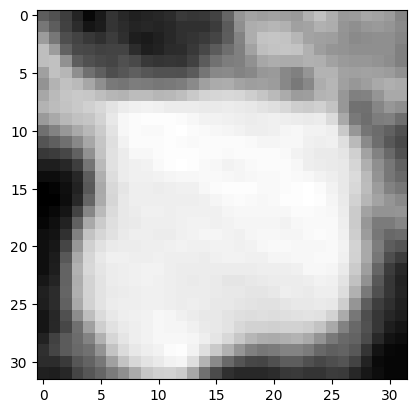

torch.Size([1, 5, 32, 32]) tensor([0.])


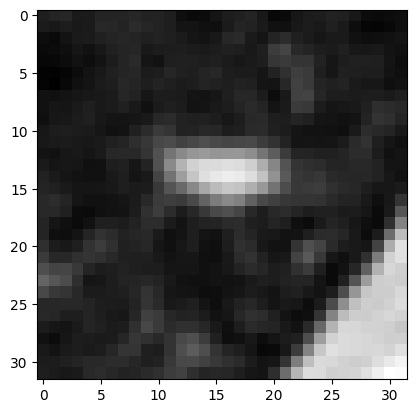

torch.Size([1, 5, 32, 32]) tensor([1.])


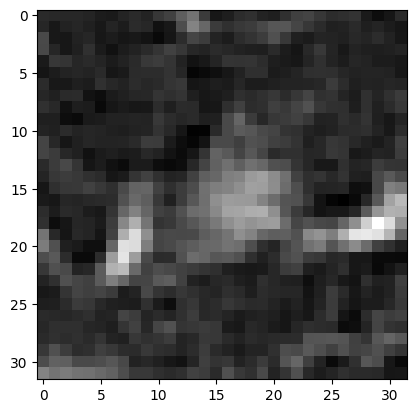

torch.Size([1, 5, 32, 32]) tensor([0.])


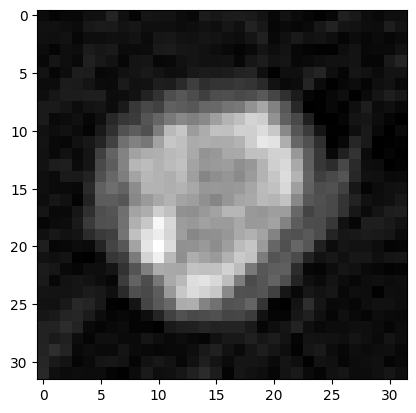

torch.Size([1, 5, 32, 32]) tensor([1.])


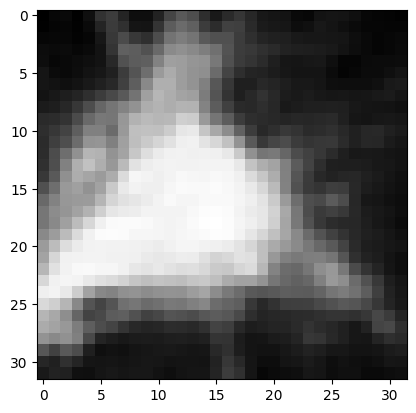

torch.Size([1, 5, 32, 32]) tensor([0.])


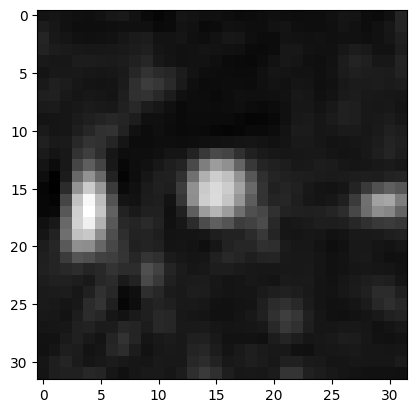

torch.Size([1, 5, 32, 32]) tensor([0.])


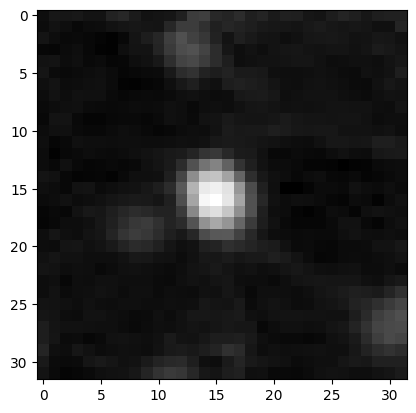

torch.Size([1, 5, 32, 32]) tensor([1.])


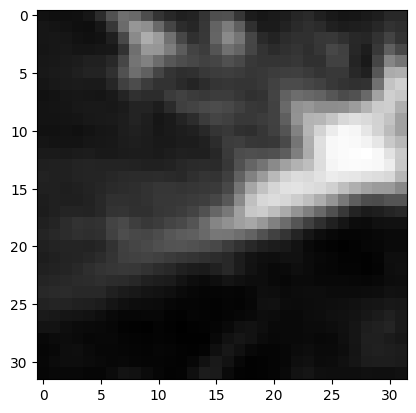

torch.Size([1, 5, 32, 32]) tensor([1.])


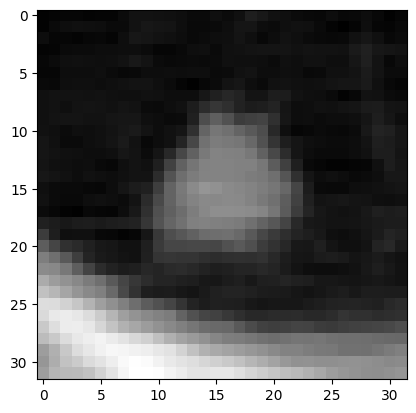

torch.Size([1, 5, 32, 32]) tensor([1.])


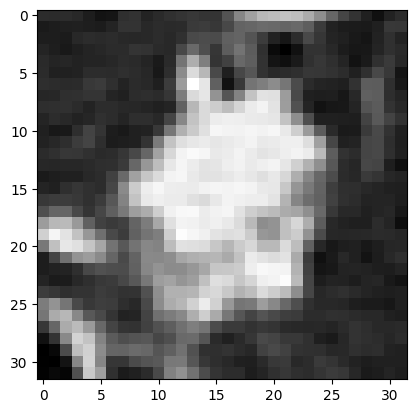

torch.Size([1, 5, 32, 32]) tensor([1.])


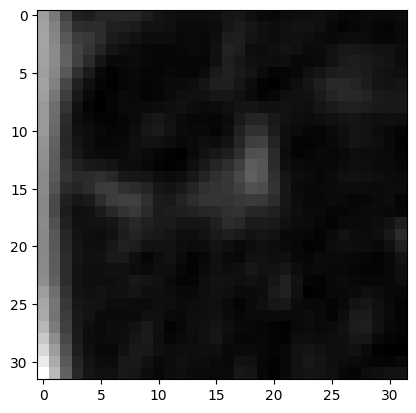

torch.Size([1, 5, 32, 32]) tensor([1.])


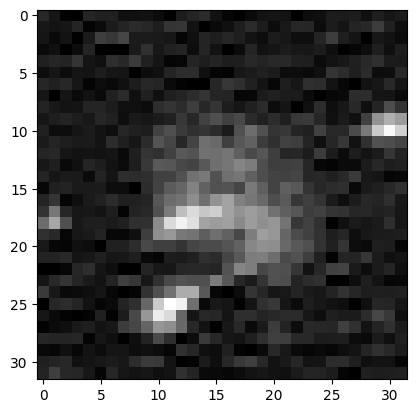

torch.Size([1, 5, 32, 32]) tensor([0.])


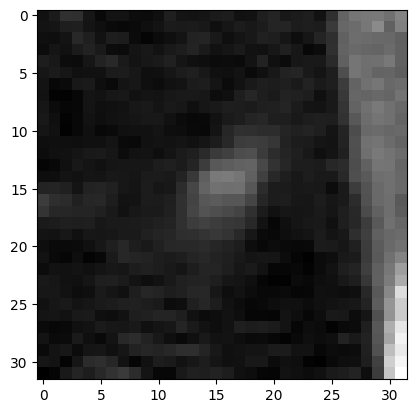

torch.Size([1, 5, 32, 32]) tensor([0.])


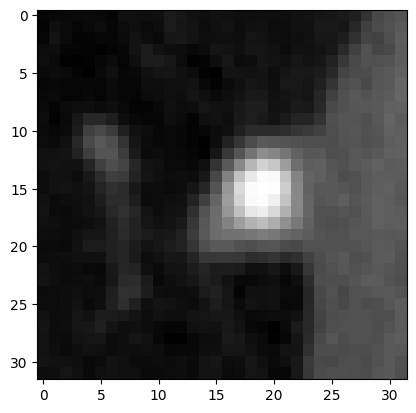

torch.Size([1, 5, 32, 32]) tensor([1.])


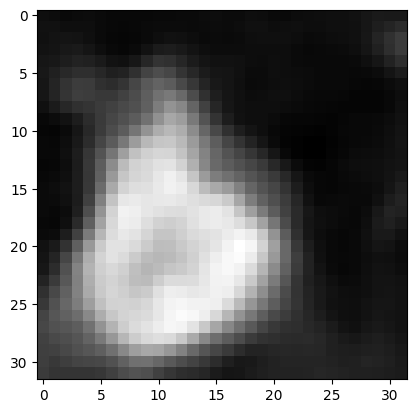

torch.Size([1, 5, 32, 32]) tensor([1.])


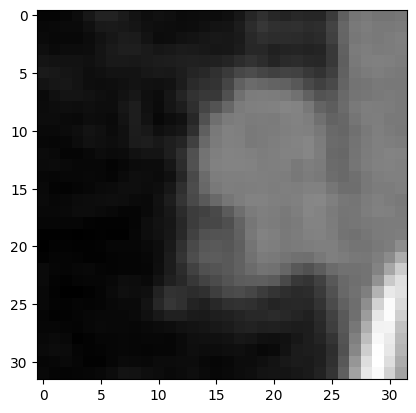

torch.Size([1, 5, 32, 32]) tensor([0.])


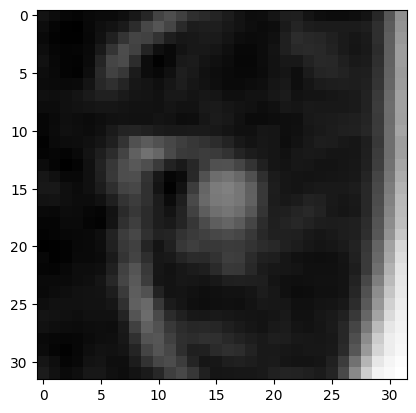

torch.Size([1, 5, 32, 32]) tensor([0.])


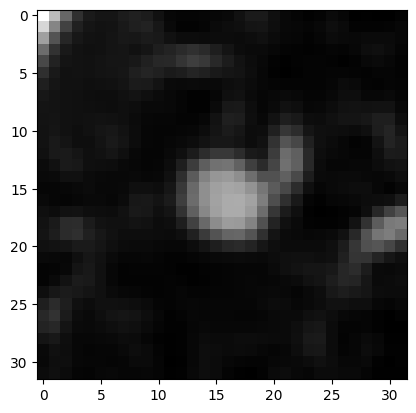

torch.Size([1, 5, 32, 32]) tensor([1.])


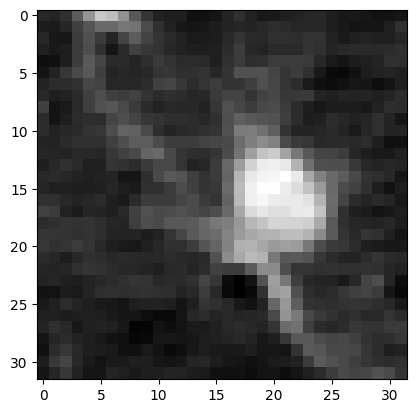

torch.Size([1, 5, 32, 32]) tensor([0.])


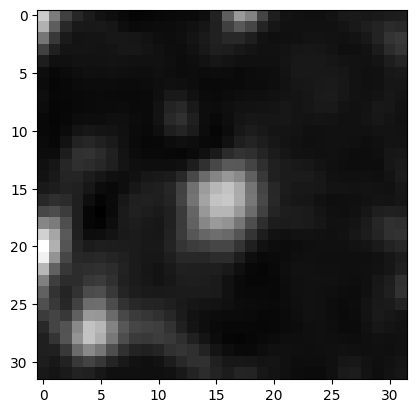

torch.Size([1, 5, 32, 32]) tensor([0.])


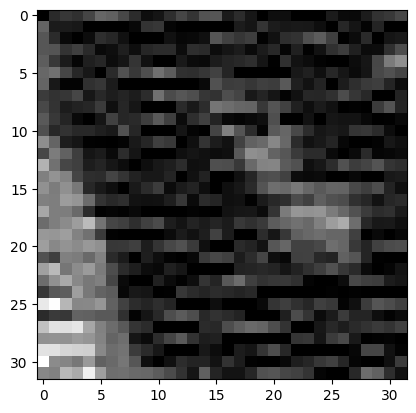

torch.Size([1, 5, 32, 32]) tensor([1.])


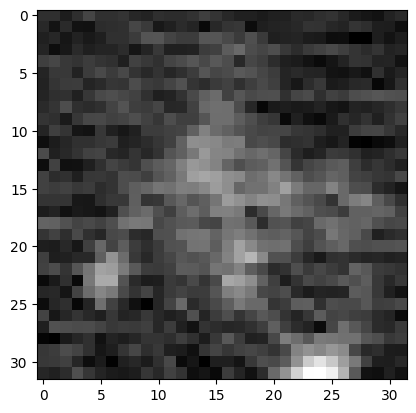

torch.Size([1, 5, 32, 32]) tensor([1.])


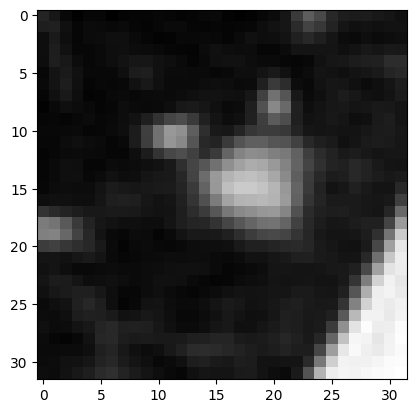

torch.Size([1, 5, 32, 32]) tensor([0.])


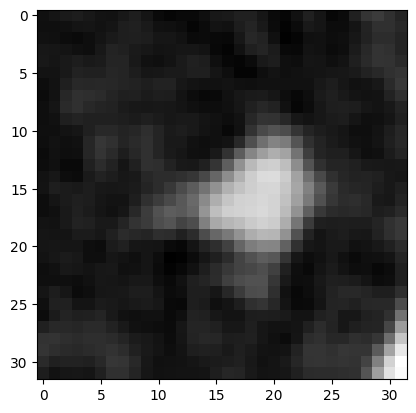

torch.Size([1, 5, 32, 32]) tensor([1.])


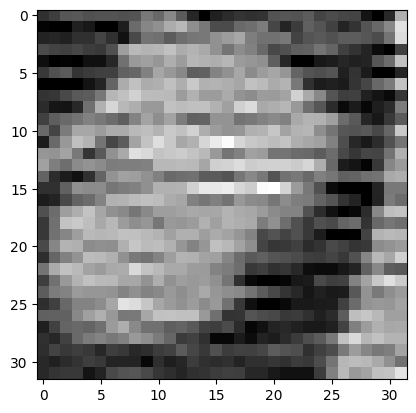

torch.Size([1, 5, 32, 32]) tensor([1.])


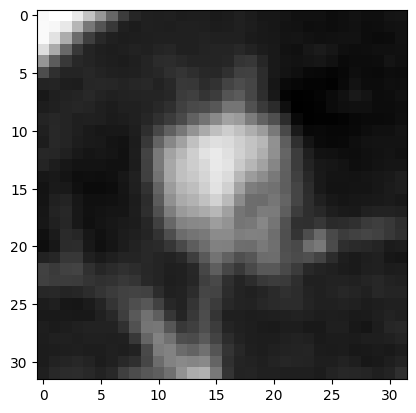

torch.Size([1, 5, 32, 32]) tensor([1.])


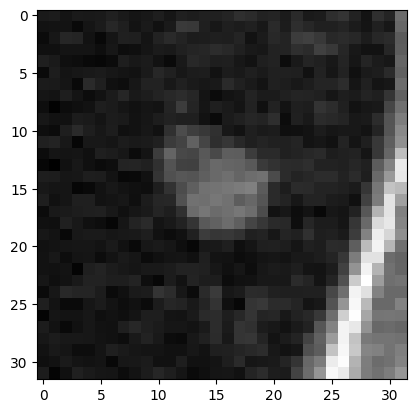

torch.Size([1, 5, 32, 32]) tensor([0.])


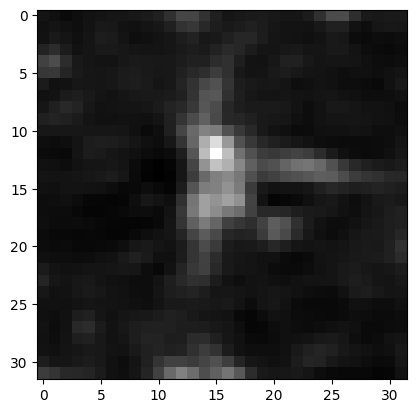

torch.Size([1, 5, 32, 32]) tensor([0.])


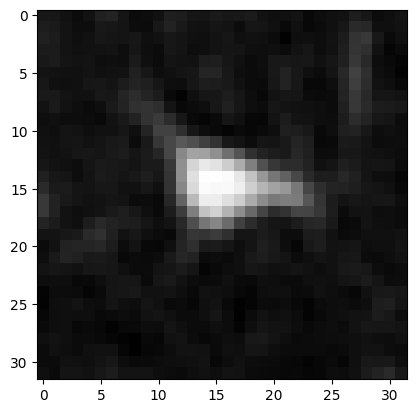

torch.Size([1, 5, 32, 32]) tensor([1.])


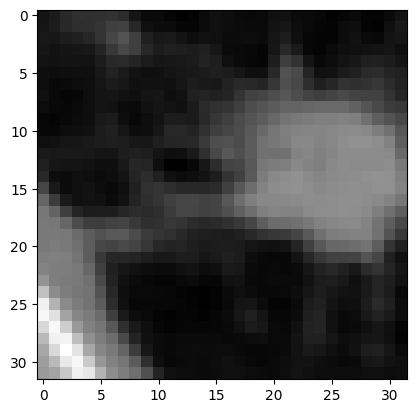

torch.Size([1, 5, 32, 32]) tensor([1.])


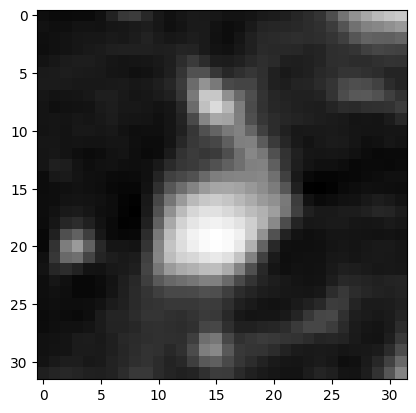

torch.Size([1, 5, 32, 32]) tensor([1.])


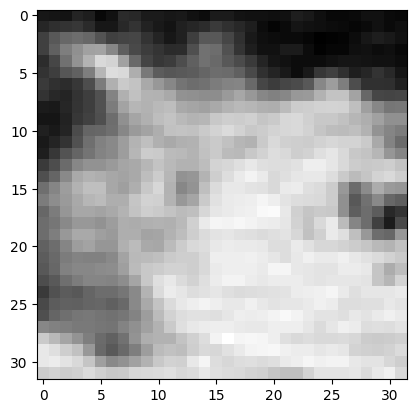

torch.Size([1, 5, 32, 32]) tensor([1.])


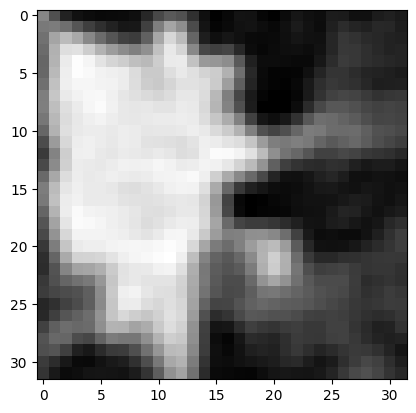

torch.Size([1, 5, 32, 32]) tensor([1.])


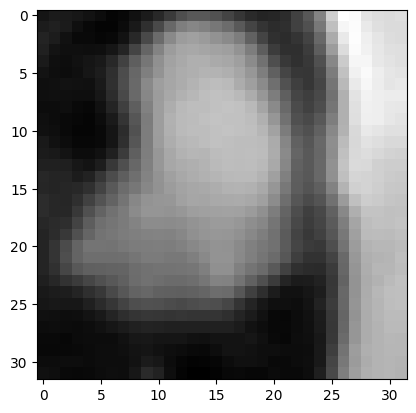

torch.Size([1, 5, 32, 32]) tensor([1.])


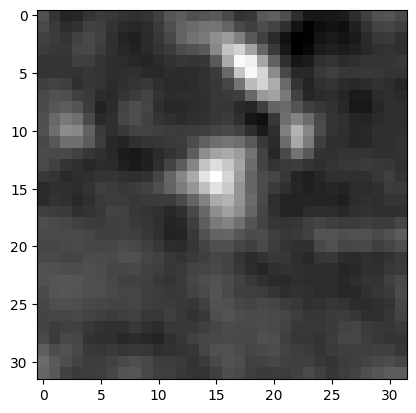

torch.Size([1, 5, 32, 32]) tensor([0.])


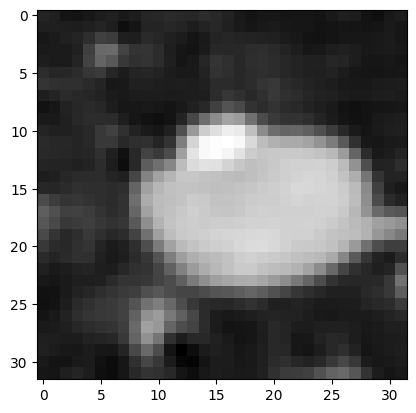

torch.Size([1, 5, 32, 32]) tensor([0.])


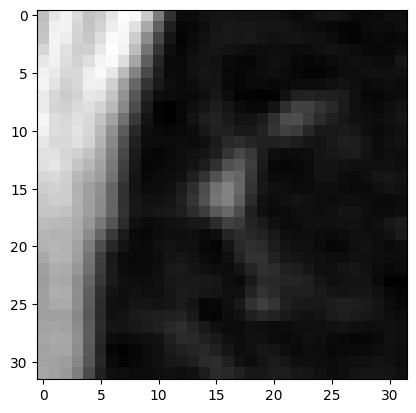

torch.Size([1, 5, 32, 32]) tensor([1.])


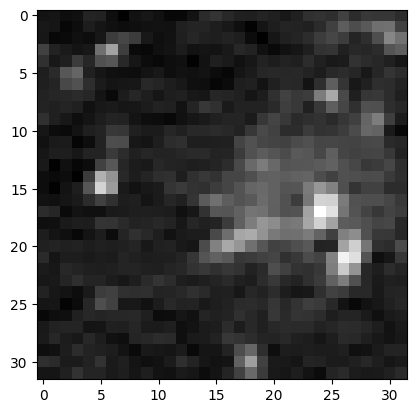

torch.Size([1, 5, 32, 32]) tensor([0.])


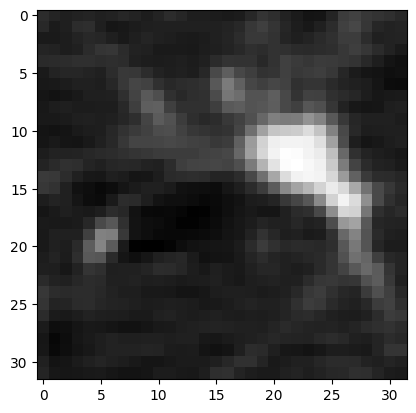

torch.Size([1, 5, 32, 32]) tensor([0.])


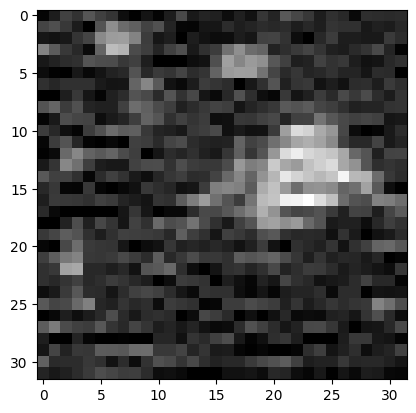

torch.Size([1, 5, 32, 32]) tensor([0.])


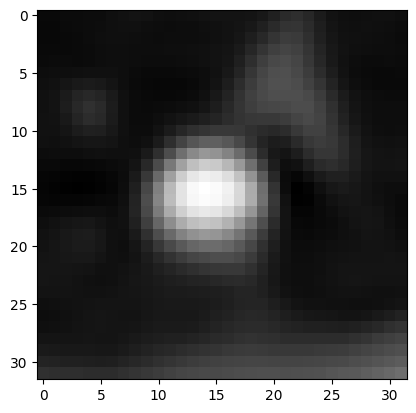

torch.Size([1, 5, 32, 32]) tensor([0.])


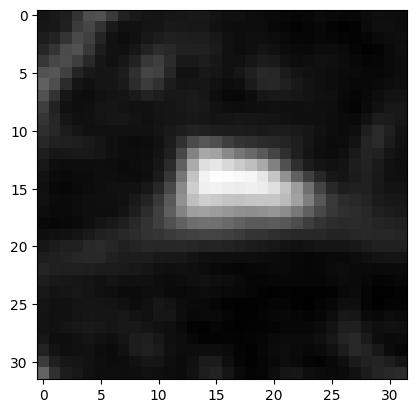

torch.Size([1, 5, 32, 32]) tensor([0.])


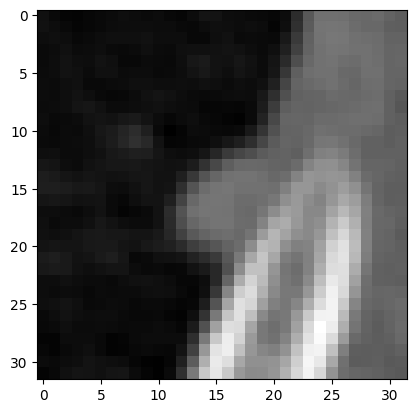

torch.Size([1, 5, 32, 32]) tensor([0.])


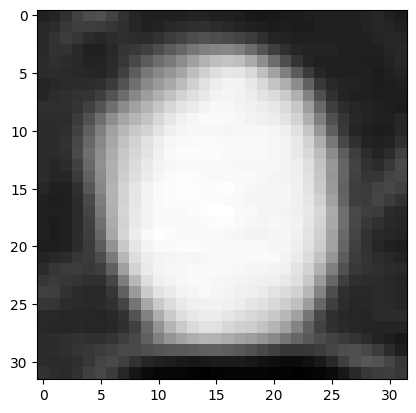

torch.Size([1, 5, 32, 32]) tensor([0.])


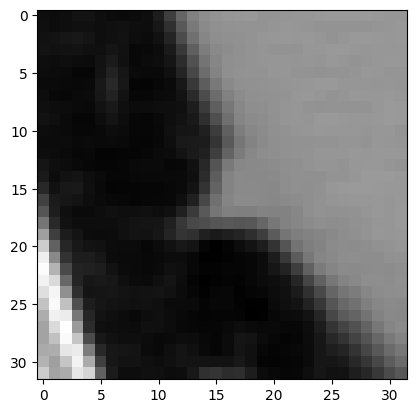

torch.Size([1, 5, 32, 32]) tensor([0.])


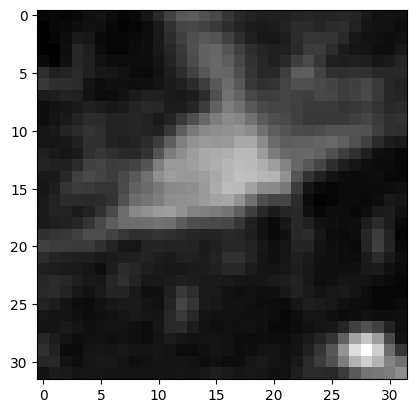

torch.Size([1, 5, 32, 32]) tensor([0.])


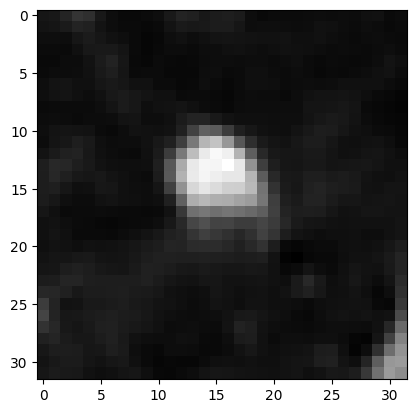

torch.Size([1, 5, 32, 32]) tensor([0.])


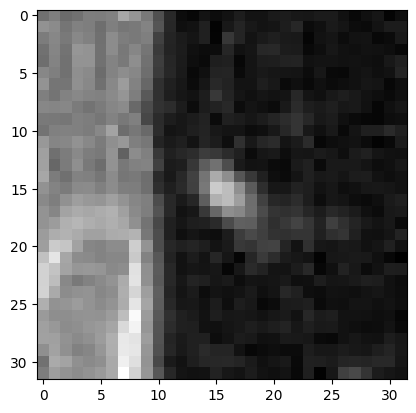

torch.Size([1, 5, 32, 32]) tensor([0.])


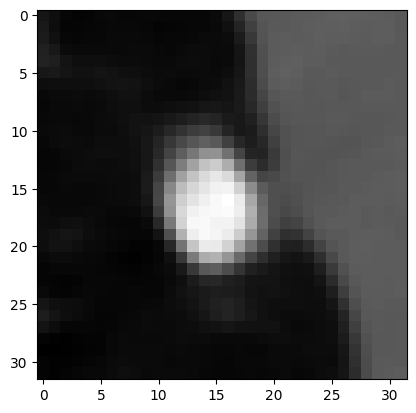

torch.Size([1, 5, 32, 32]) tensor([1.])


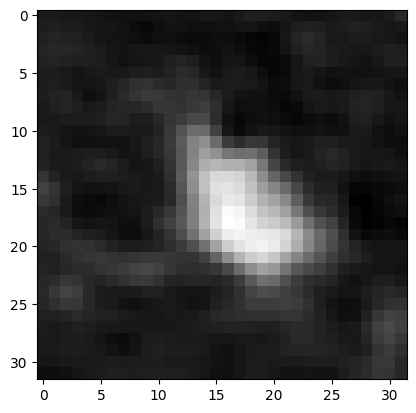

torch.Size([1, 5, 32, 32]) tensor([0.])


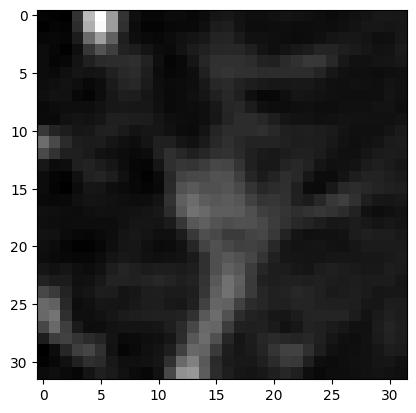

torch.Size([1, 5, 32, 32]) tensor([0.])


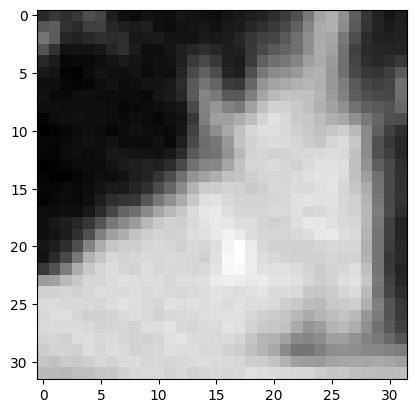

torch.Size([1, 5, 32, 32]) tensor([1.])


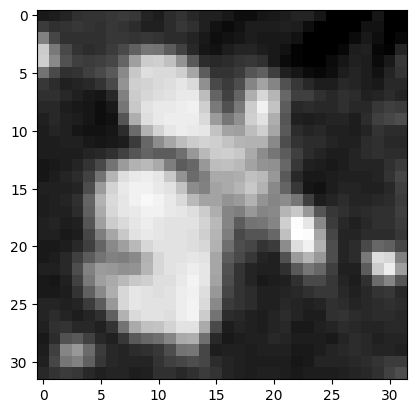

torch.Size([1, 5, 32, 32]) tensor([1.])


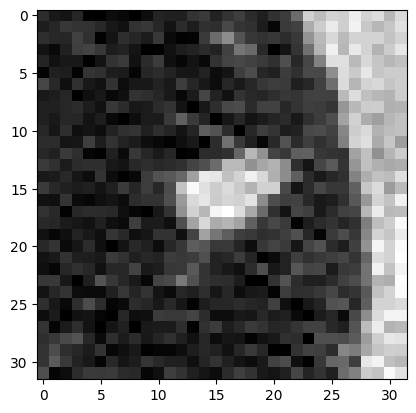

torch.Size([1, 5, 32, 32]) tensor([1.])


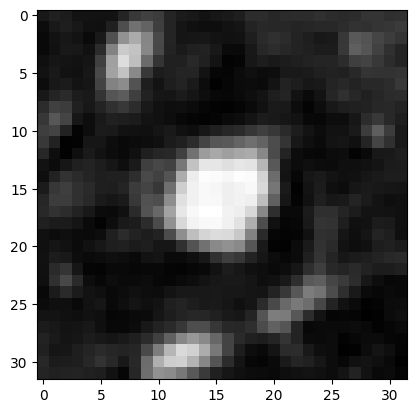

torch.Size([1, 5, 32, 32]) tensor([0.])


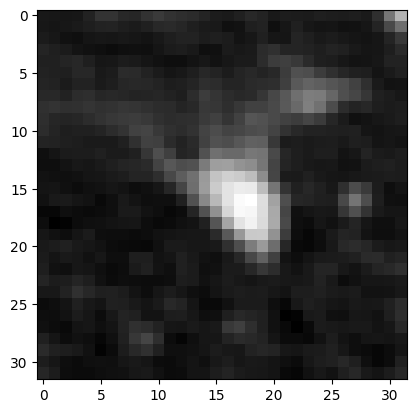

torch.Size([1, 5, 32, 32]) tensor([1.])


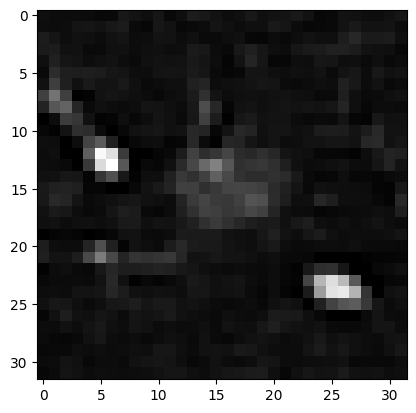

torch.Size([1, 5, 32, 32]) tensor([0.])


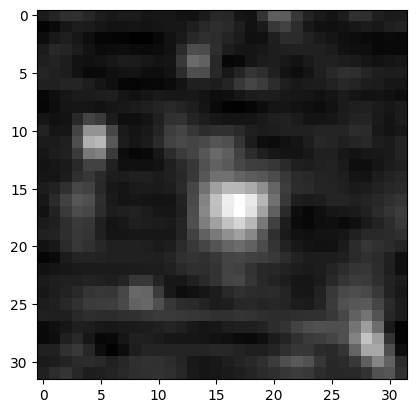

torch.Size([1, 5, 32, 32]) tensor([0.])


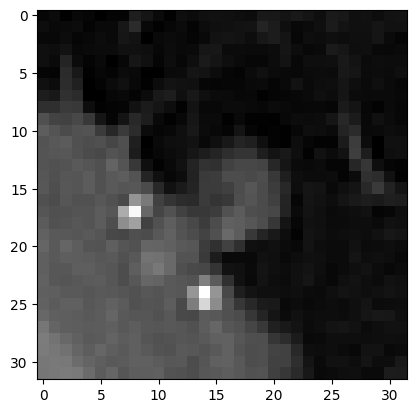

torch.Size([1, 5, 32, 32]) tensor([1.])


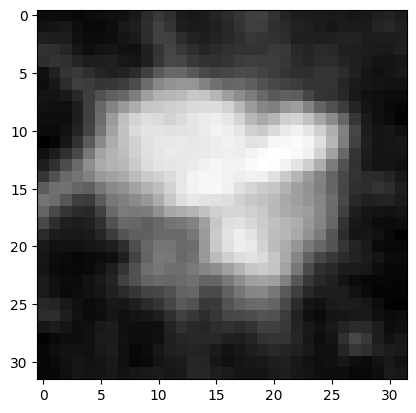

torch.Size([1, 5, 32, 32]) tensor([0.])


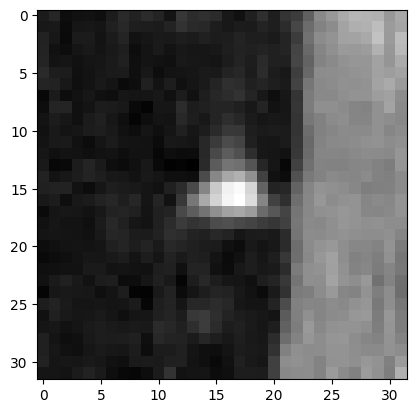

torch.Size([1, 5, 32, 32]) tensor([0.])


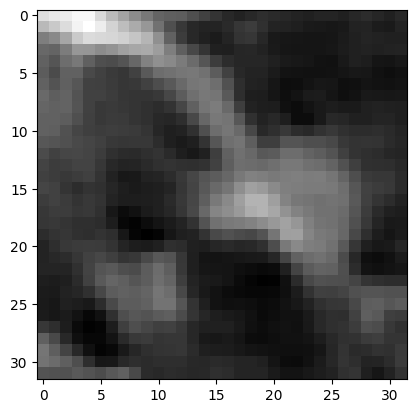

torch.Size([1, 5, 32, 32]) tensor([1.])


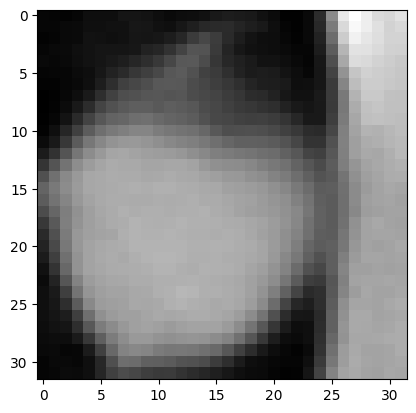

torch.Size([1, 5, 32, 32]) tensor([0.])


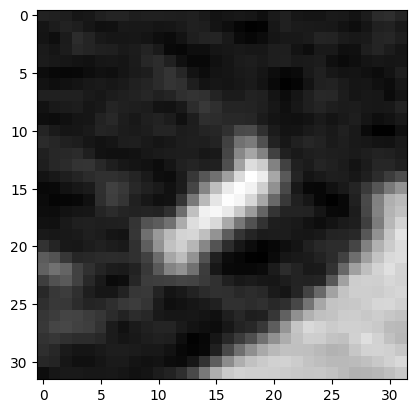

torch.Size([1, 5, 32, 32]) tensor([1.])


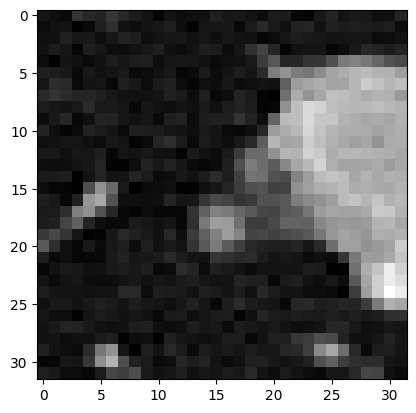

torch.Size([1, 5, 32, 32]) tensor([0.])


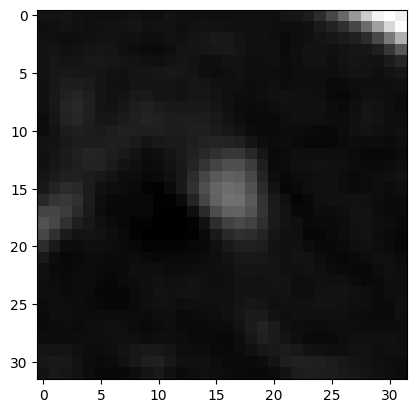

torch.Size([1, 5, 32, 32]) tensor([1.])


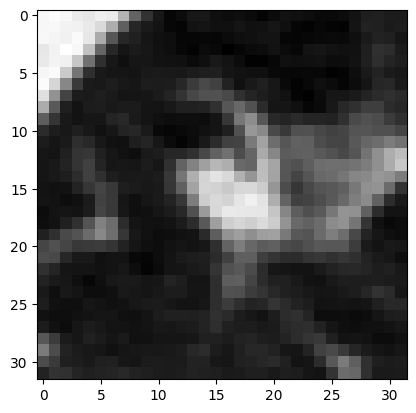

torch.Size([1, 5, 32, 32]) tensor([0.])


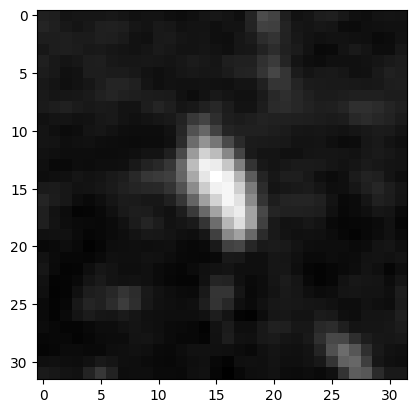

torch.Size([1, 5, 32, 32]) tensor([0.])


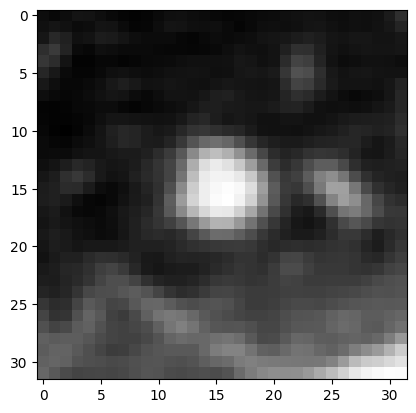

torch.Size([1, 5, 32, 32]) tensor([0.])


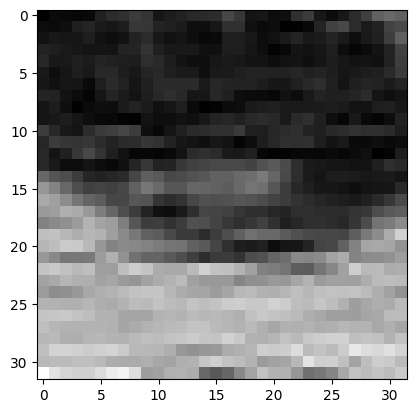

torch.Size([1, 5, 32, 32]) tensor([0.])


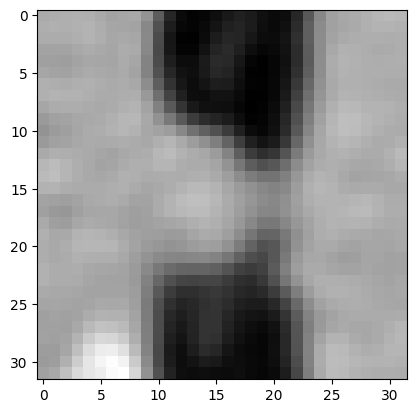

torch.Size([1, 5, 32, 32]) tensor([0.])


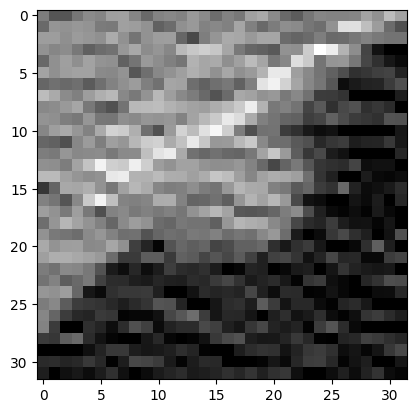

torch.Size([1, 5, 32, 32]) tensor([0.])


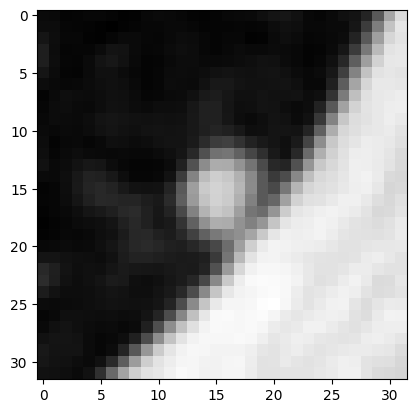

torch.Size([1, 5, 32, 32]) tensor([0.])


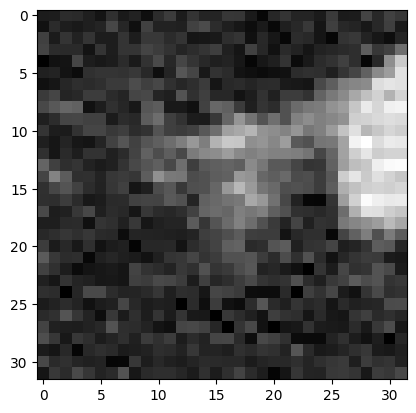

torch.Size([1, 5, 32, 32]) tensor([1.])


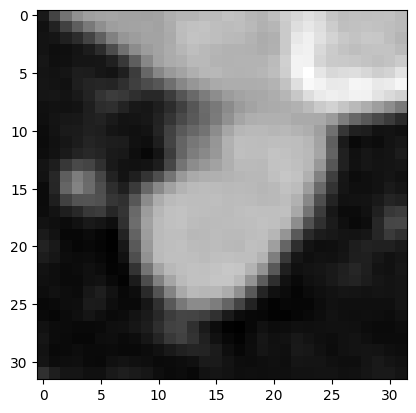

torch.Size([1, 5, 32, 32]) tensor([0.])


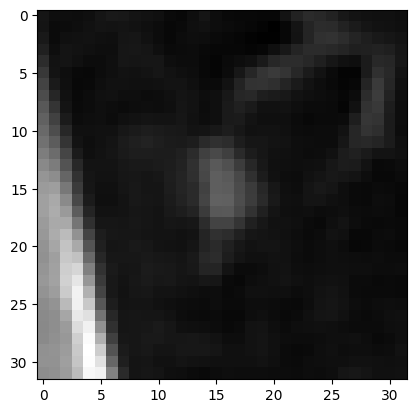

torch.Size([1, 5, 32, 32]) tensor([1.])


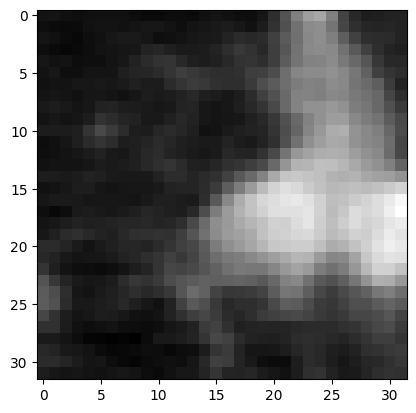

torch.Size([1, 5, 32, 32]) tensor([1.])


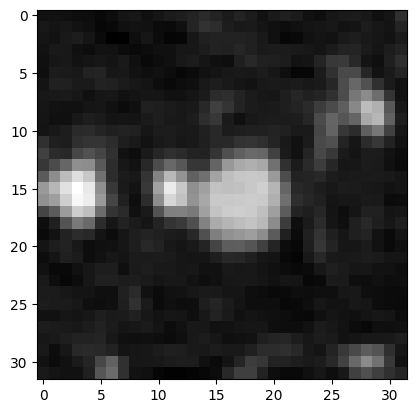

torch.Size([1, 5, 32, 32]) tensor([1.])


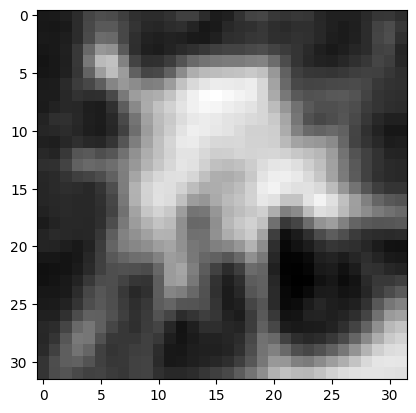

torch.Size([1, 5, 32, 32]) tensor([0.])


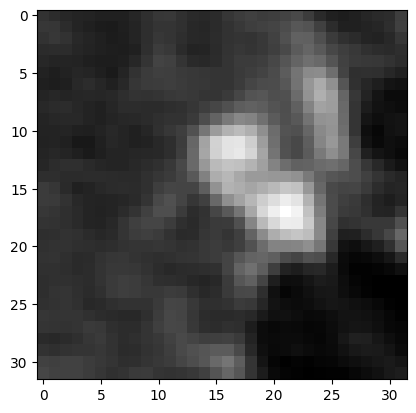

torch.Size([1, 5, 32, 32]) tensor([0.])


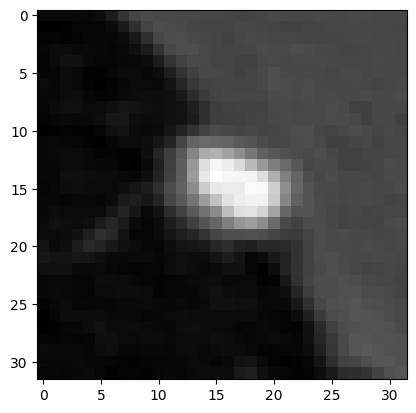

torch.Size([1, 5, 32, 32]) tensor([0.])


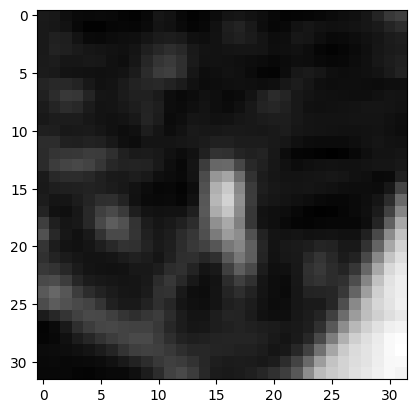

torch.Size([1, 5, 32, 32]) tensor([0.])


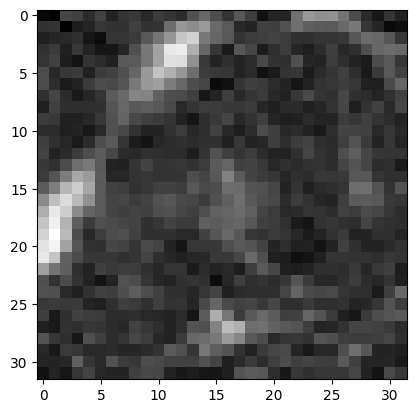

torch.Size([1, 5, 32, 32]) tensor([1.])


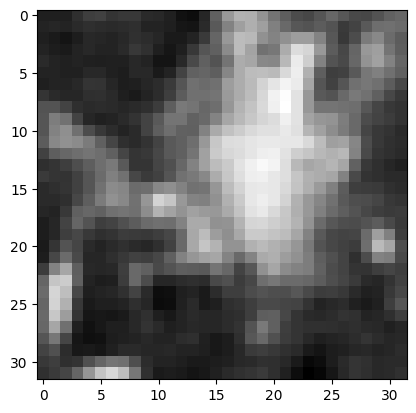

torch.Size([1, 5, 32, 32]) tensor([0.])


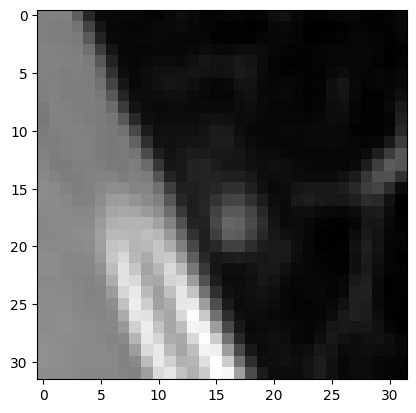

torch.Size([1, 5, 32, 32]) tensor([1.])


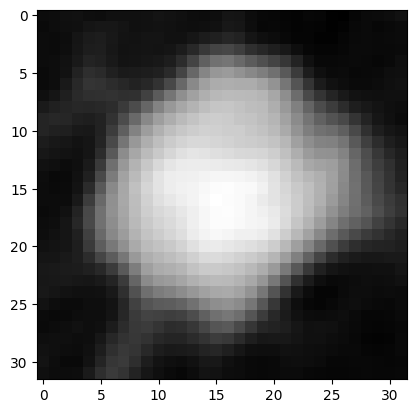

torch.Size([1, 5, 32, 32]) tensor([1.])


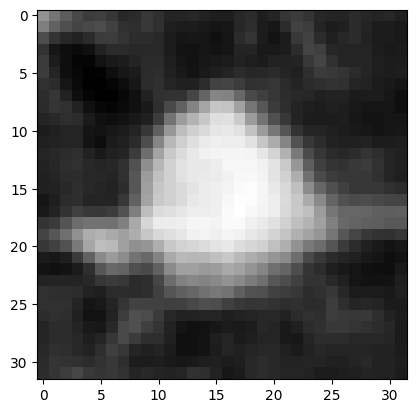

torch.Size([1, 5, 32, 32]) tensor([1.])


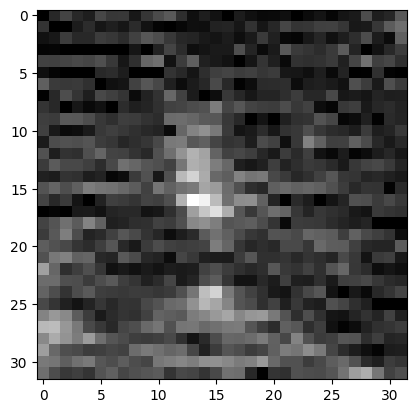

torch.Size([1, 5, 32, 32]) tensor([0.])


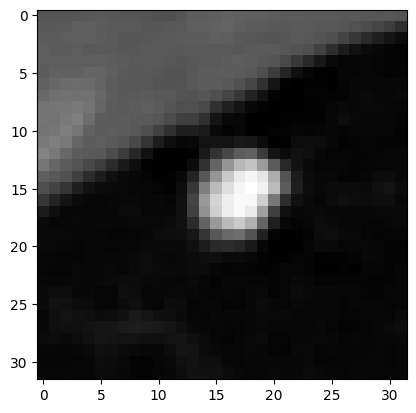

torch.Size([1, 5, 32, 32]) tensor([0.])


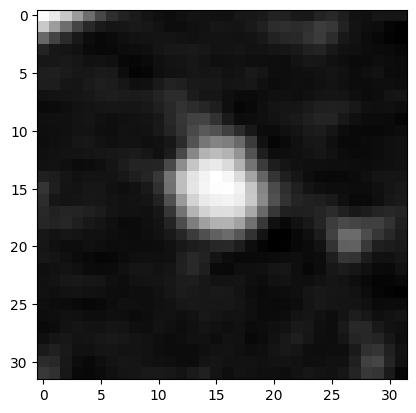

torch.Size([1, 5, 32, 32]) tensor([0.])


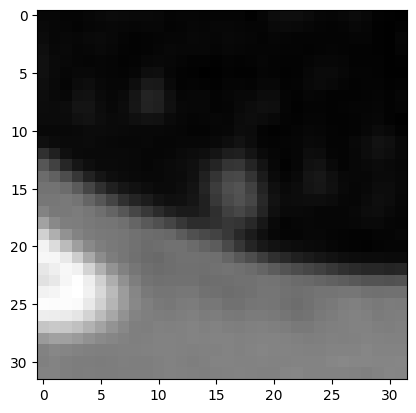

torch.Size([1, 5, 32, 32]) tensor([1.])


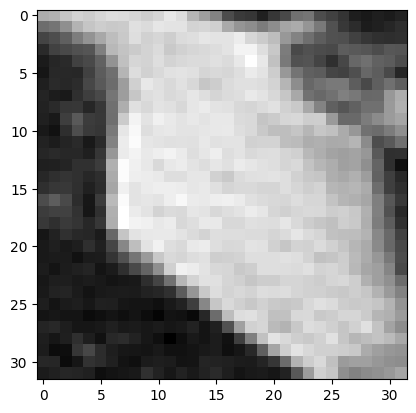

torch.Size([1, 5, 32, 32]) tensor([1.])


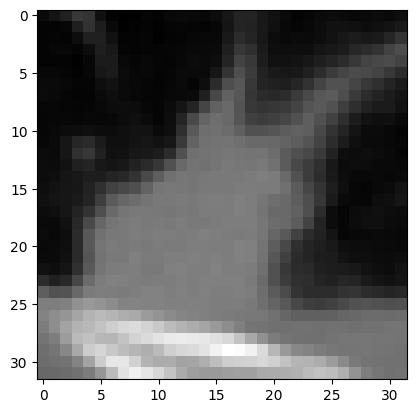

torch.Size([1, 5, 32, 32]) tensor([0.])


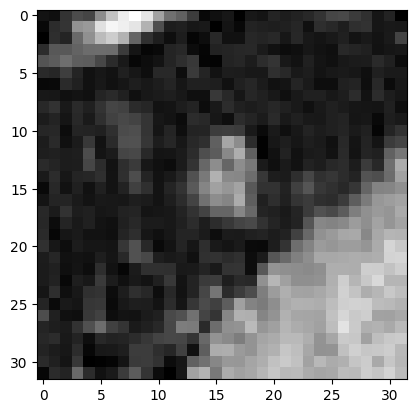

torch.Size([1, 5, 32, 32]) tensor([0.])


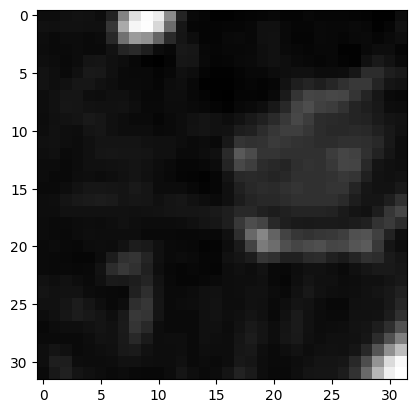

torch.Size([1, 5, 32, 32]) tensor([0.])


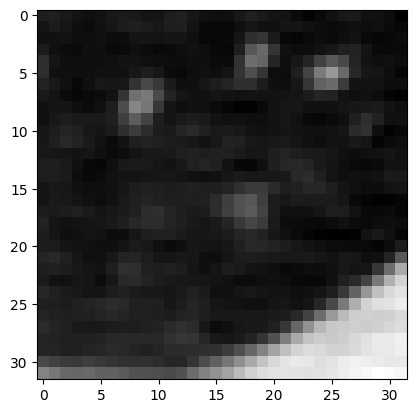

torch.Size([1, 5, 32, 32]) tensor([0.])


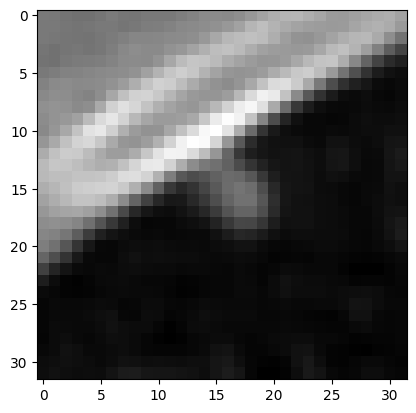

torch.Size([1, 5, 32, 32]) tensor([0.])


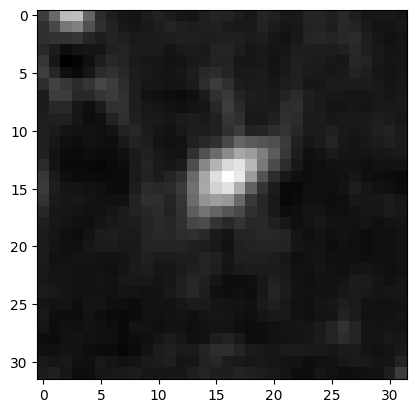

torch.Size([1, 5, 32, 32]) tensor([0.])


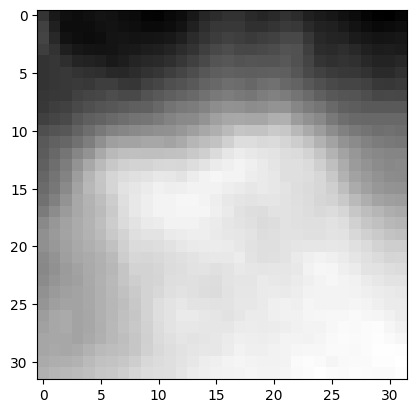

torch.Size([1, 5, 32, 32]) tensor([1.])


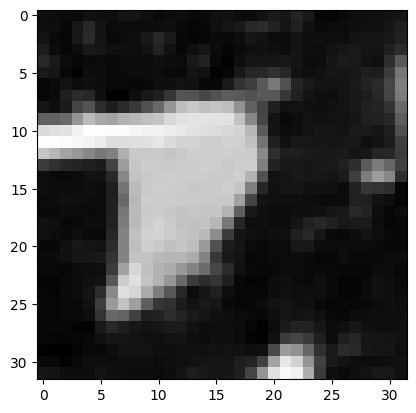

torch.Size([1, 5, 32, 32]) tensor([0.])


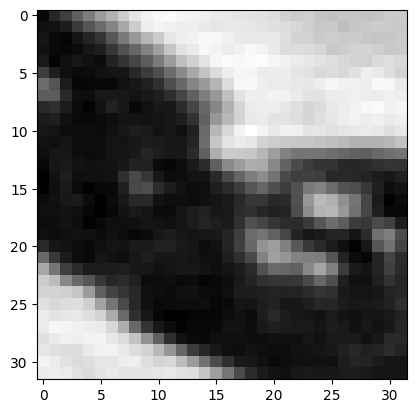

torch.Size([1, 5, 32, 32]) tensor([1.])


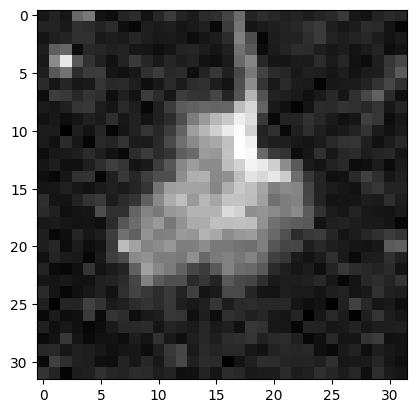

torch.Size([1, 5, 32, 32]) tensor([0.])


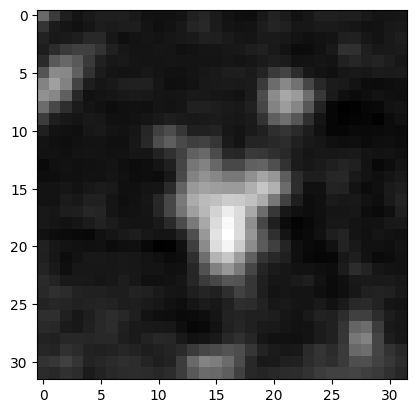

torch.Size([1, 5, 32, 32]) tensor([1.])


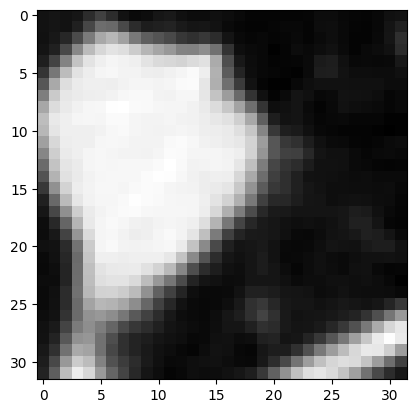

torch.Size([1, 5, 32, 32]) tensor([1.])


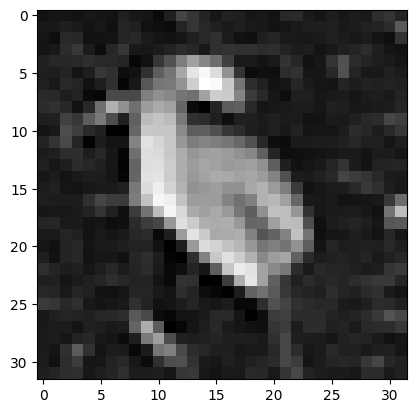

torch.Size([1, 5, 32, 32]) tensor([0.])


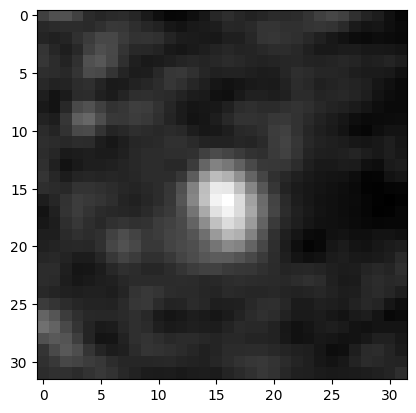

torch.Size([1, 5, 32, 32]) tensor([1.])


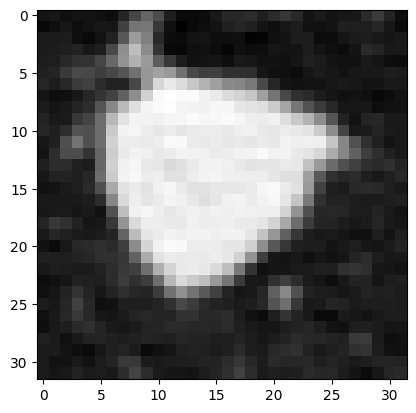

torch.Size([1, 5, 32, 32]) tensor([0.])


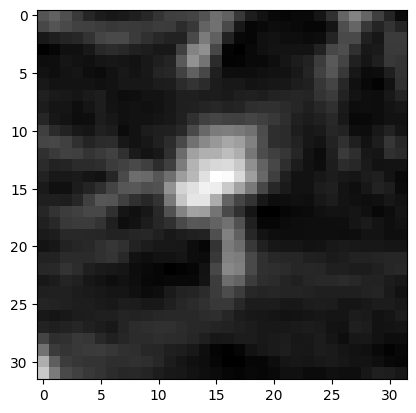

torch.Size([1, 5, 32, 32]) tensor([1.])


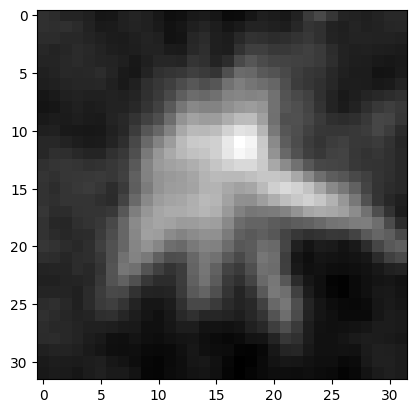

torch.Size([1, 5, 32, 32]) tensor([0.])


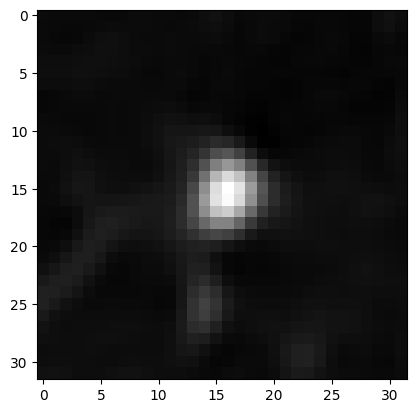

torch.Size([1, 5, 32, 32]) tensor([0.])


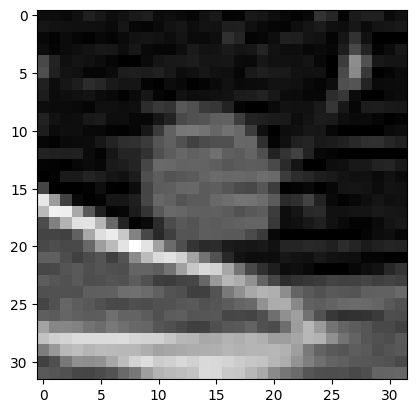

torch.Size([1, 5, 32, 32]) tensor([0.])


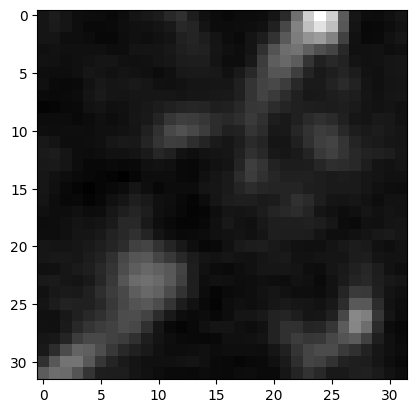

torch.Size([1, 5, 32, 32]) tensor([1.])


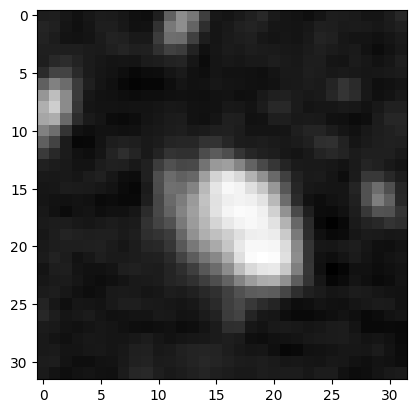

torch.Size([1, 5, 32, 32]) tensor([0.])


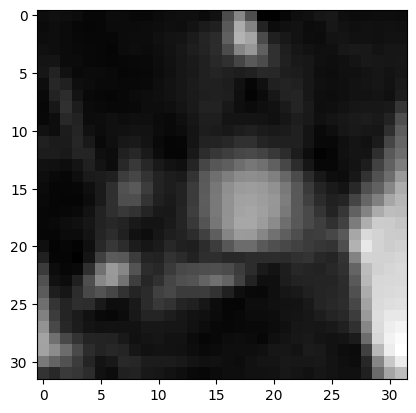

torch.Size([1, 5, 32, 32]) tensor([1.])


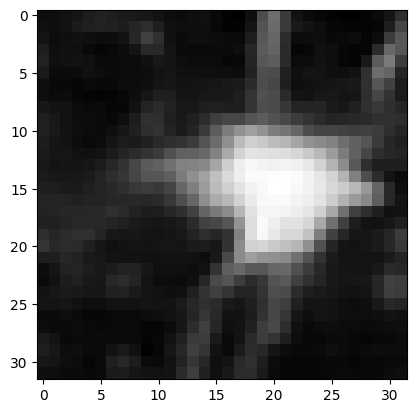

torch.Size([1, 5, 32, 32]) tensor([1.])


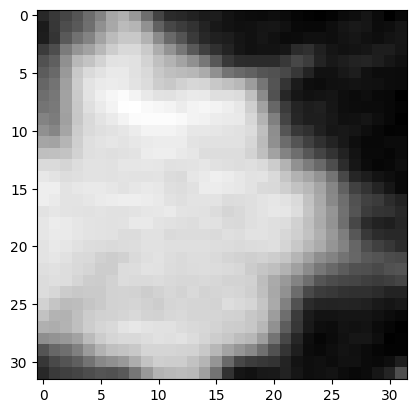

torch.Size([1, 5, 32, 32]) tensor([1.])


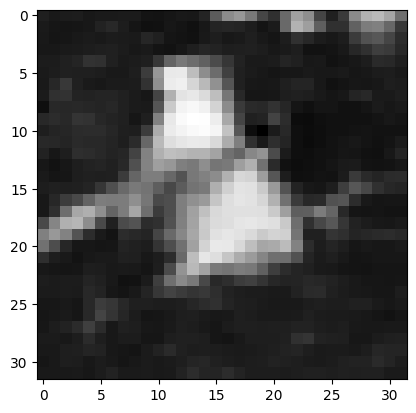

torch.Size([1, 5, 32, 32]) tensor([1.])


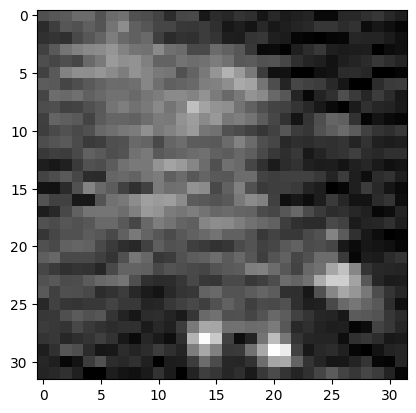

torch.Size([1, 5, 32, 32]) tensor([0.])


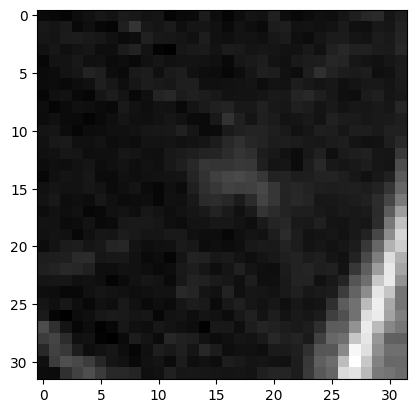

torch.Size([1, 5, 32, 32]) tensor([1.])


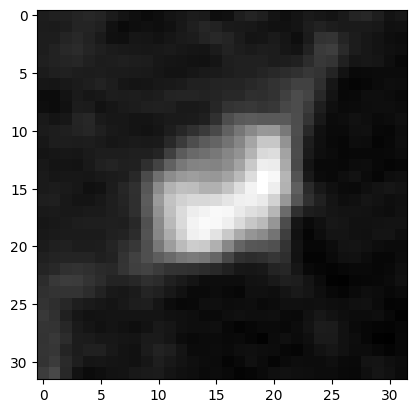

torch.Size([1, 5, 32, 32]) tensor([0.])


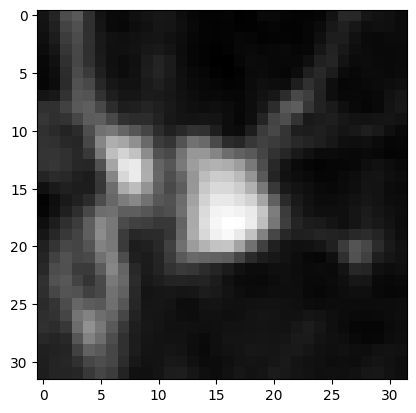

torch.Size([1, 5, 32, 32]) tensor([0.])


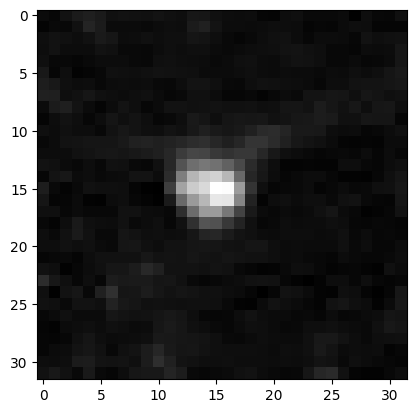

torch.Size([1, 5, 32, 32]) tensor([0.])


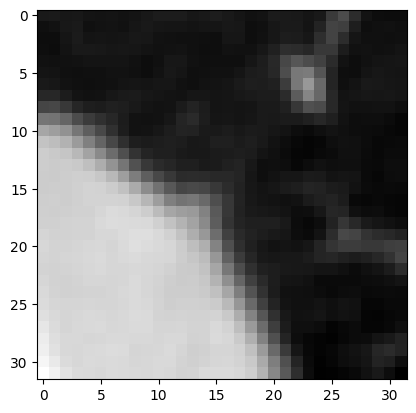

torch.Size([1, 5, 32, 32]) tensor([1.])


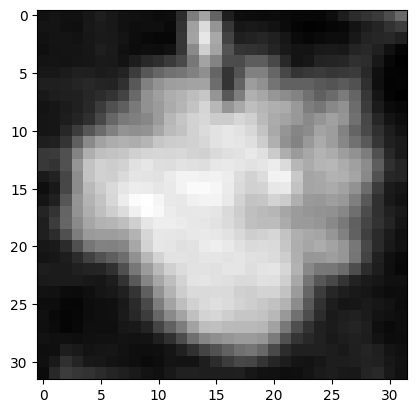

torch.Size([1, 5, 32, 32]) tensor([0.])


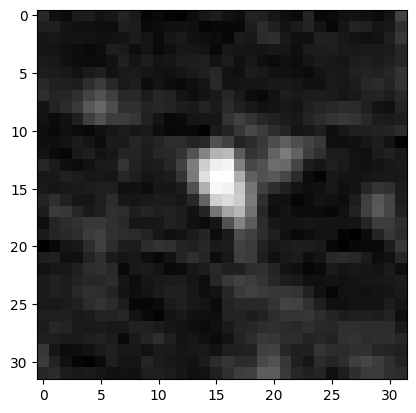

torch.Size([1, 5, 32, 32]) tensor([1.])


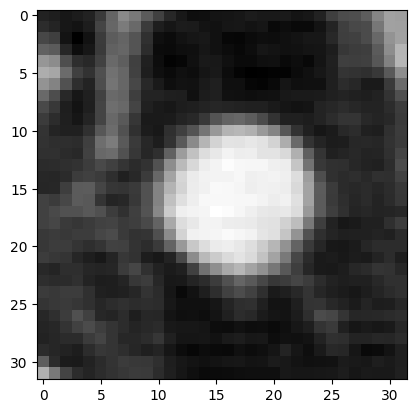

torch.Size([1, 5, 32, 32]) tensor([0.])


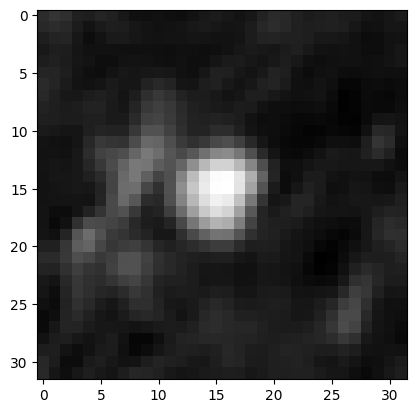

torch.Size([1, 5, 32, 32]) tensor([0.])


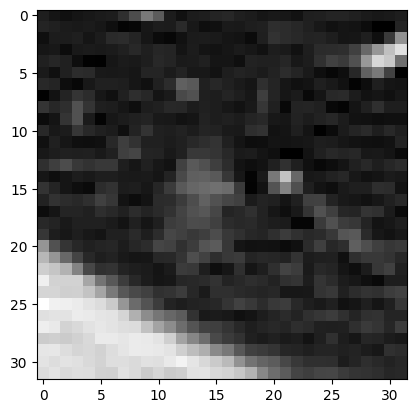

torch.Size([1, 5, 32, 32]) tensor([0.])


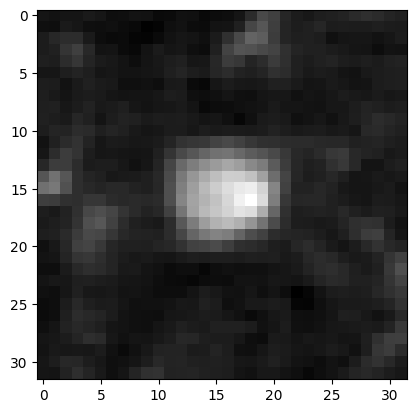

torch.Size([1, 5, 32, 32]) tensor([0.])


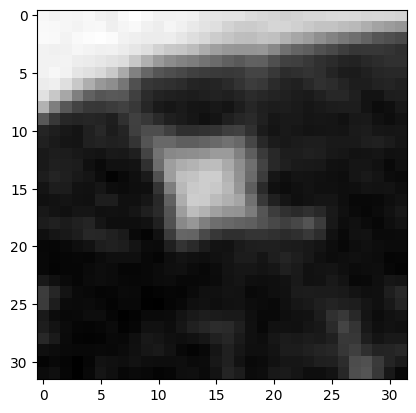

torch.Size([1, 5, 32, 32]) tensor([0.])


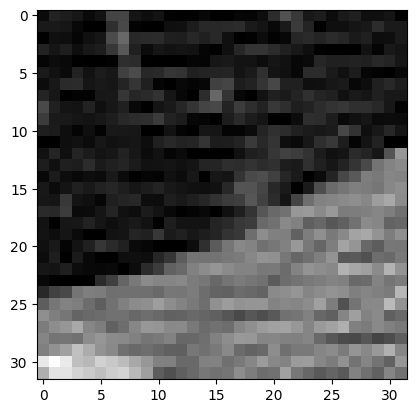

torch.Size([1, 5, 32, 32]) tensor([1.])


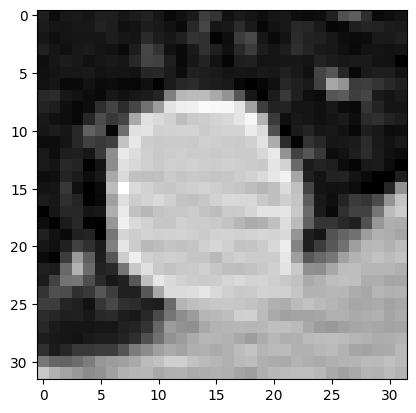

torch.Size([1, 5, 32, 32]) tensor([0.])


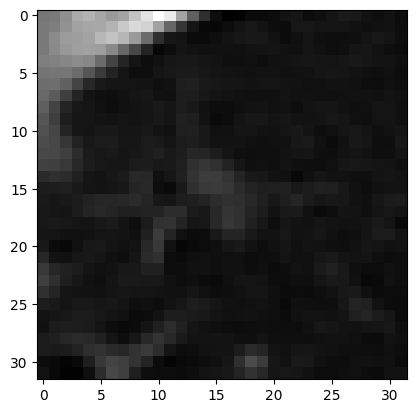

torch.Size([1, 5, 32, 32]) tensor([0.])


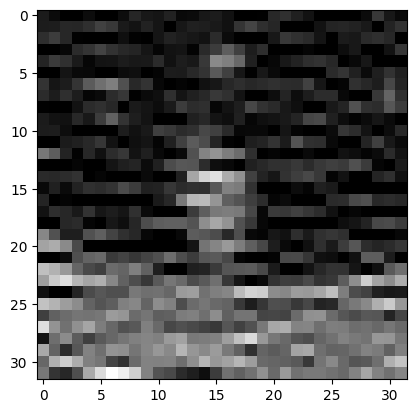

torch.Size([1, 5, 32, 32]) tensor([1.])


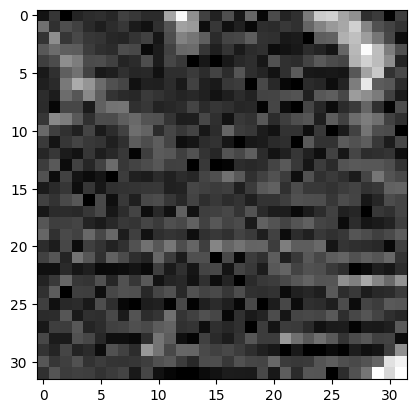

torch.Size([1, 5, 32, 32]) tensor([1.])


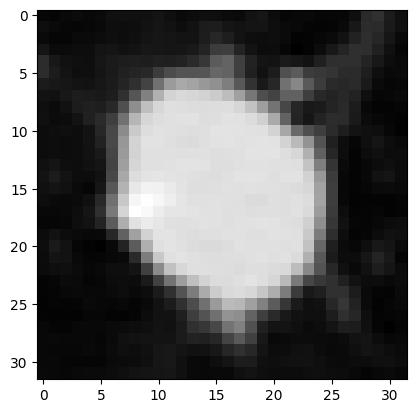

torch.Size([1, 5, 32, 32]) tensor([0.])


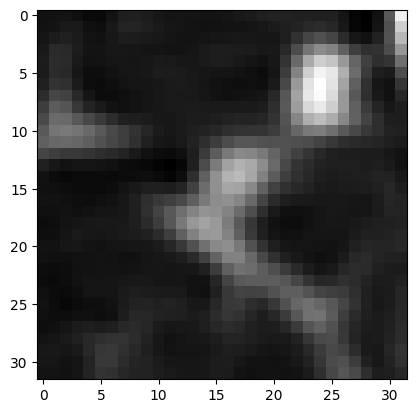

torch.Size([1, 5, 32, 32]) tensor([1.])


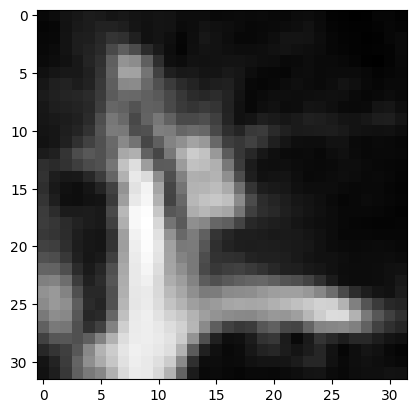

torch.Size([1, 5, 32, 32]) tensor([0.])


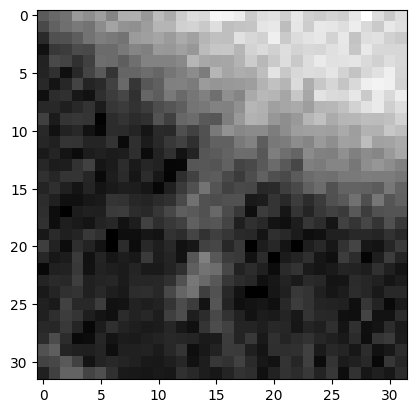

torch.Size([1, 5, 32, 32]) tensor([1.])


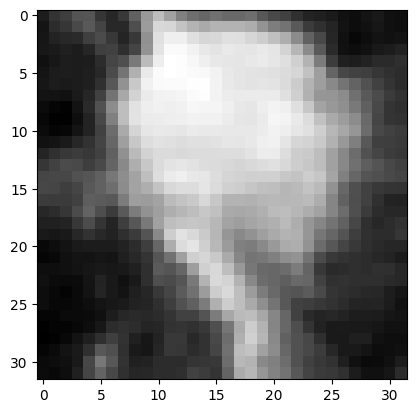

torch.Size([1, 5, 32, 32]) tensor([1.])


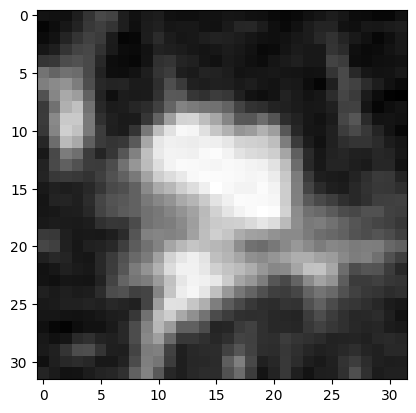

torch.Size([1, 5, 32, 32]) tensor([0.])


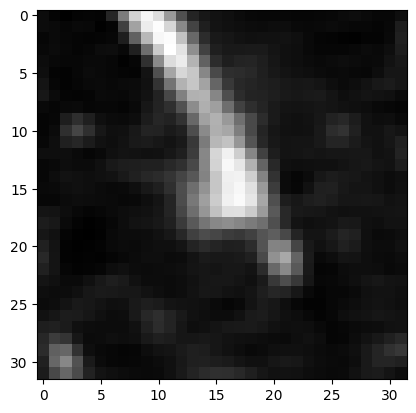

torch.Size([1, 5, 32, 32]) tensor([0.])


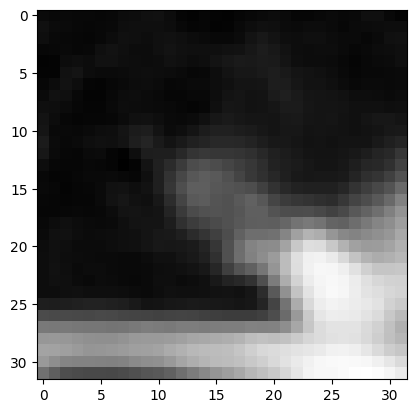

torch.Size([1, 5, 32, 32]) tensor([0.])


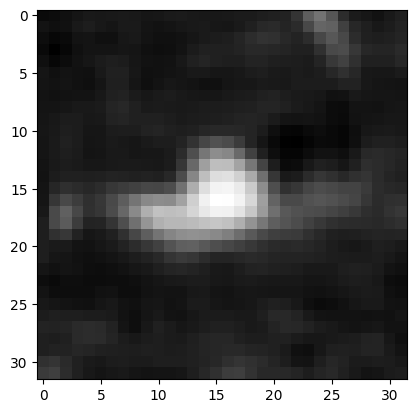

torch.Size([1, 5, 32, 32]) tensor([0.])


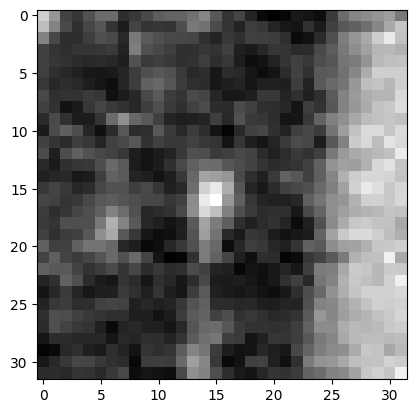

torch.Size([1, 5, 32, 32]) tensor([1.])


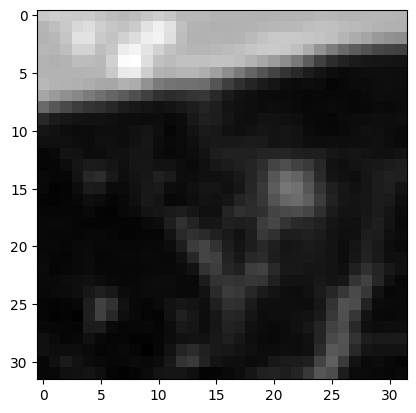

torch.Size([1, 5, 32, 32]) tensor([1.])


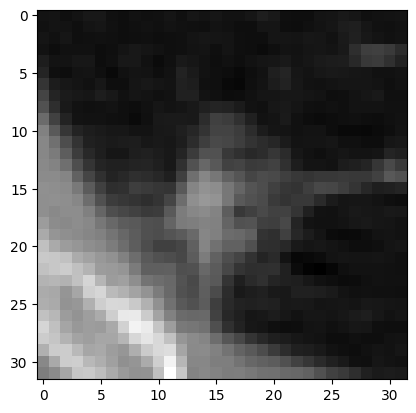

torch.Size([1, 5, 32, 32]) tensor([0.])


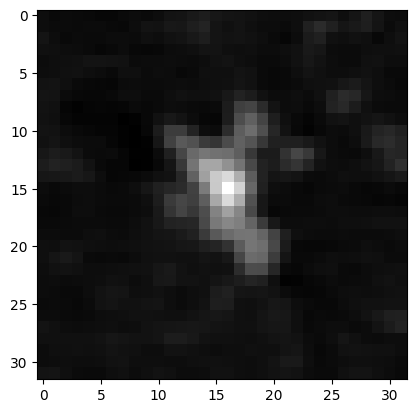

torch.Size([1, 5, 32, 32]) tensor([1.])


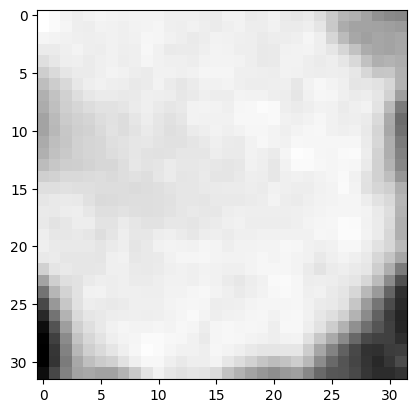

torch.Size([1, 5, 32, 32]) tensor([0.])


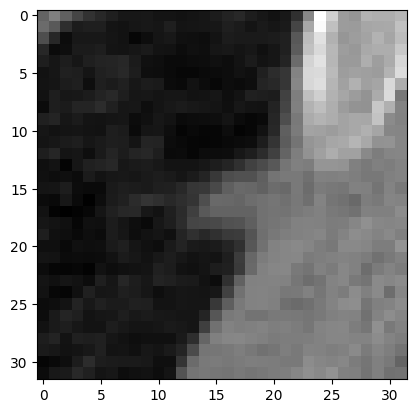

torch.Size([1, 5, 32, 32]) tensor([0.])


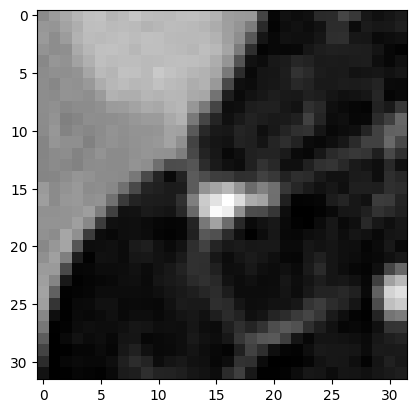

torch.Size([1, 5, 32, 32]) tensor([1.])


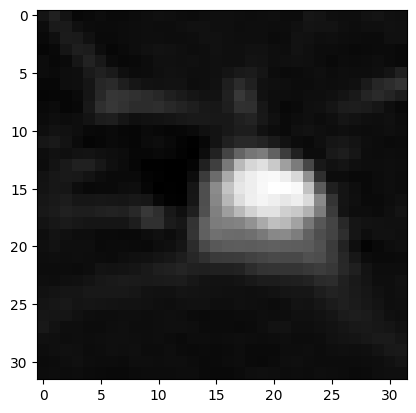

torch.Size([1, 5, 32, 32]) tensor([0.])


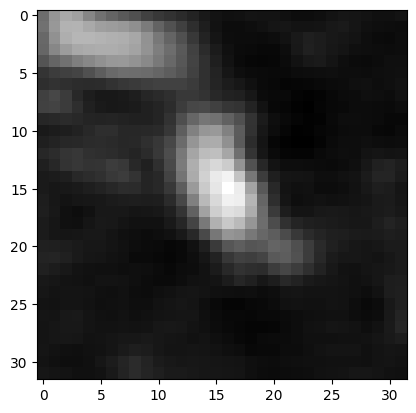

torch.Size([1, 5, 32, 32]) tensor([1.])


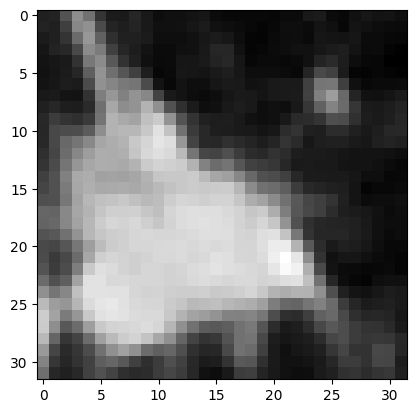

torch.Size([1, 5, 32, 32]) tensor([0.])


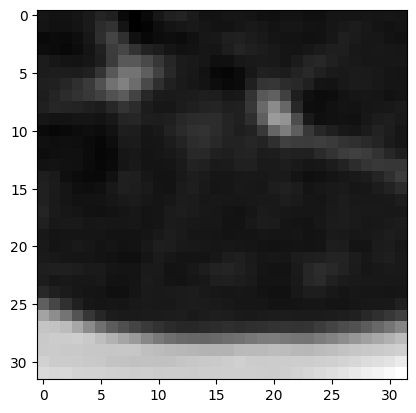

torch.Size([1, 5, 32, 32]) tensor([0.])


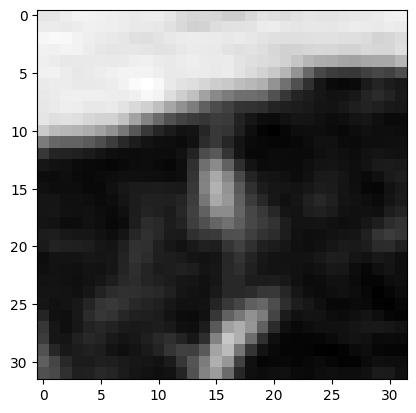

torch.Size([1, 5, 32, 32]) tensor([1.])


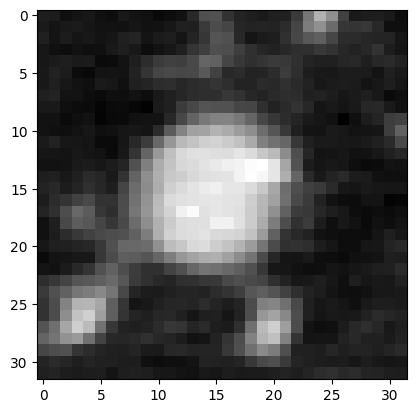

torch.Size([1, 5, 32, 32]) tensor([0.])


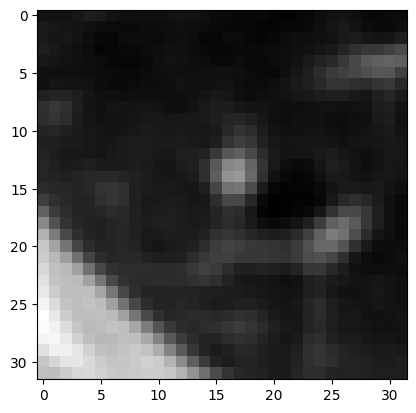

torch.Size([1, 5, 32, 32]) tensor([0.])


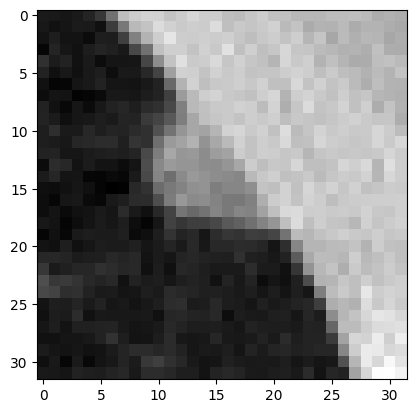

torch.Size([1, 5, 32, 32]) tensor([0.])


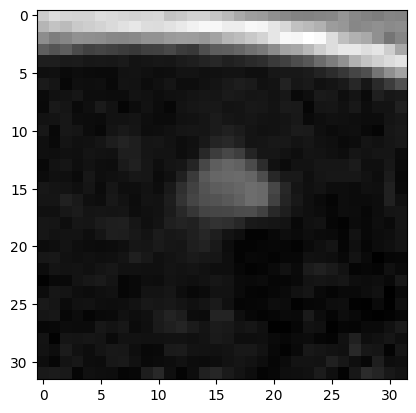

torch.Size([1, 5, 32, 32]) tensor([0.])


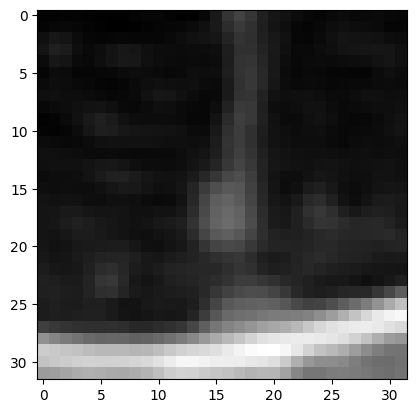

torch.Size([1, 5, 32, 32]) tensor([0.])


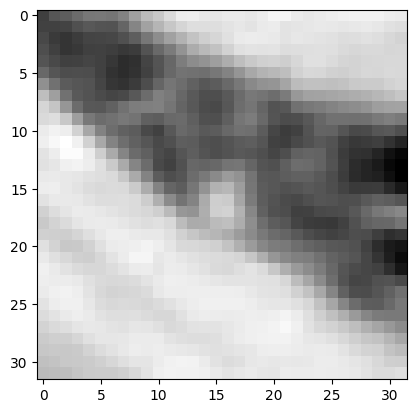

torch.Size([1, 5, 32, 32]) tensor([1.])


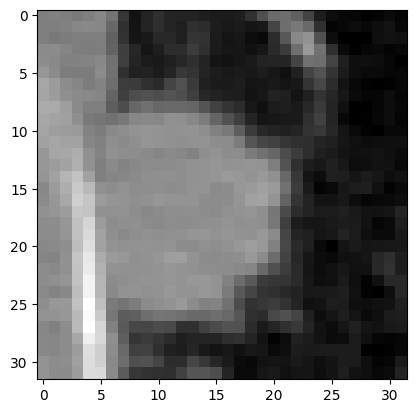

torch.Size([1, 5, 32, 32]) tensor([1.])


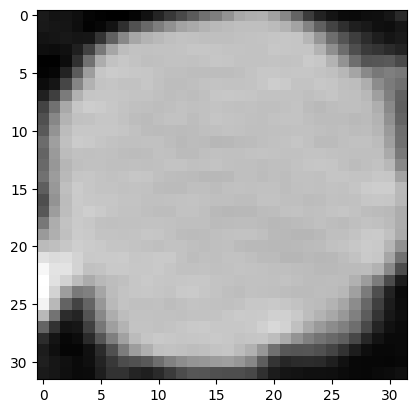

torch.Size([1, 5, 32, 32]) tensor([1.])


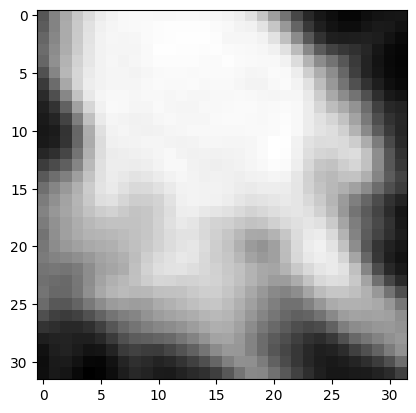

torch.Size([1, 5, 32, 32]) tensor([0.])


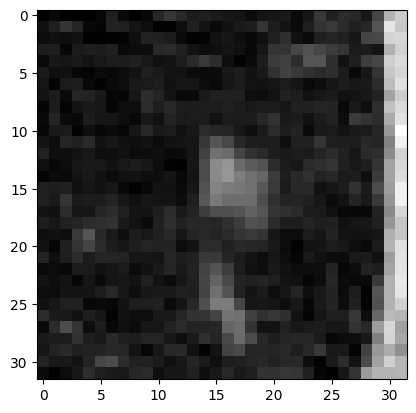

torch.Size([1, 5, 32, 32]) tensor([0.])


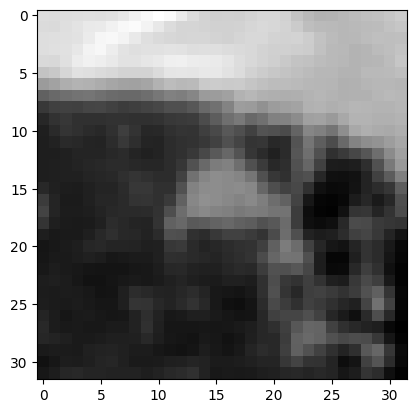

torch.Size([1, 5, 32, 32]) tensor([0.])


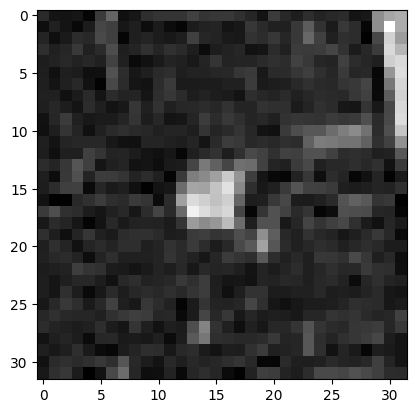

torch.Size([1, 5, 32, 32]) tensor([1.])


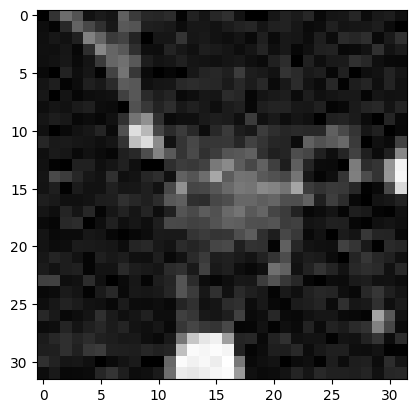

torch.Size([1, 5, 32, 32]) tensor([0.])


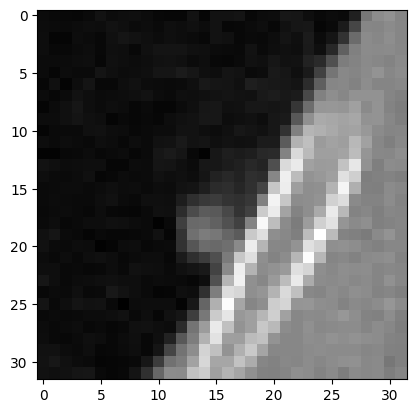

torch.Size([1, 5, 32, 32]) tensor([1.])


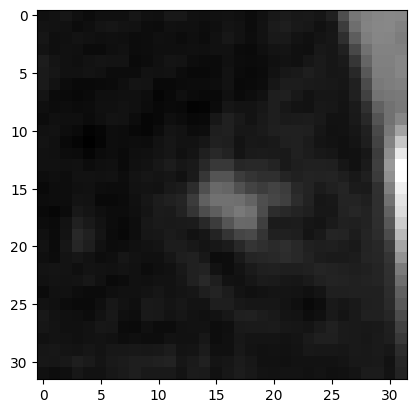

torch.Size([1, 5, 32, 32]) tensor([0.])


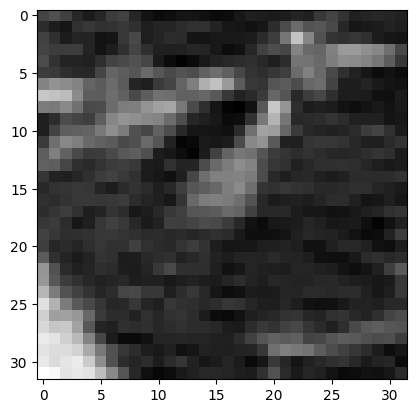

torch.Size([1, 5, 32, 32]) tensor([1.])


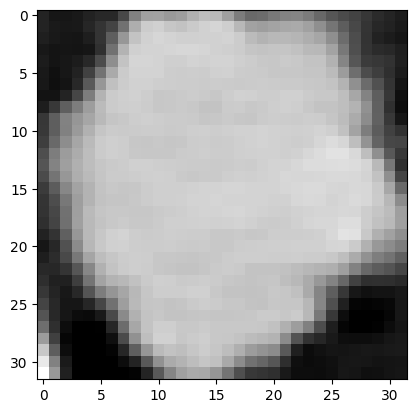

torch.Size([1, 5, 32, 32]) tensor([1.])


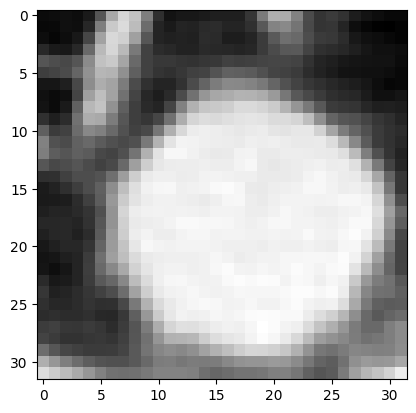

torch.Size([1, 5, 32, 32]) tensor([1.])


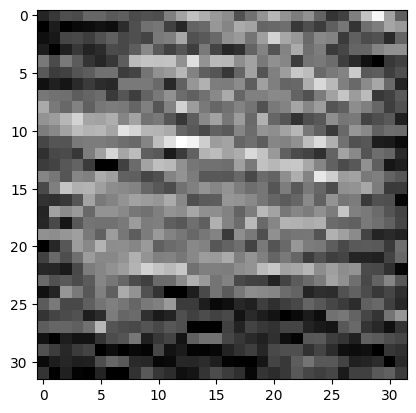

torch.Size([1, 5, 32, 32]) tensor([1.])


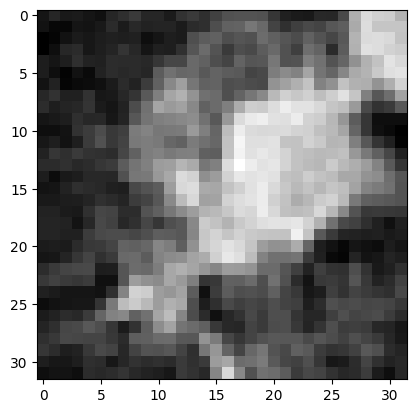

torch.Size([1, 5, 32, 32]) tensor([1.])


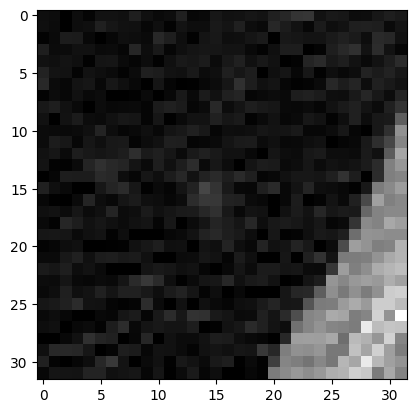

torch.Size([1, 5, 32, 32]) tensor([1.])


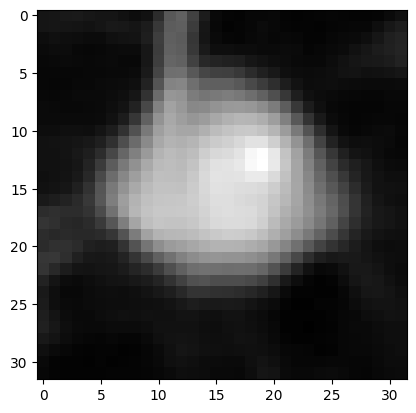

torch.Size([1, 5, 32, 32]) tensor([1.])


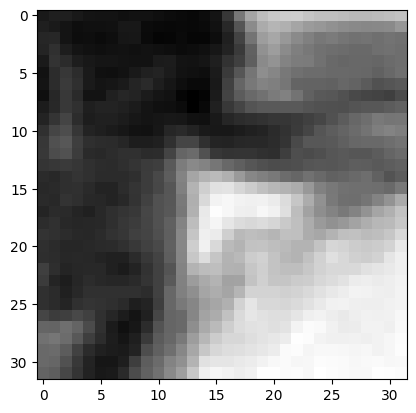

torch.Size([1, 5, 32, 32]) tensor([0.])


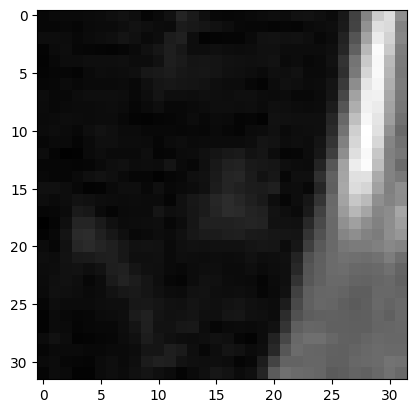

torch.Size([1, 5, 32, 32]) tensor([0.])


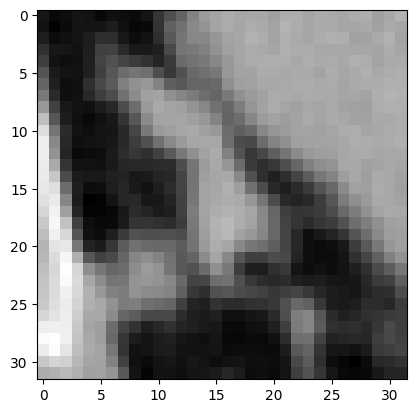

torch.Size([1, 5, 32, 32]) tensor([0.])


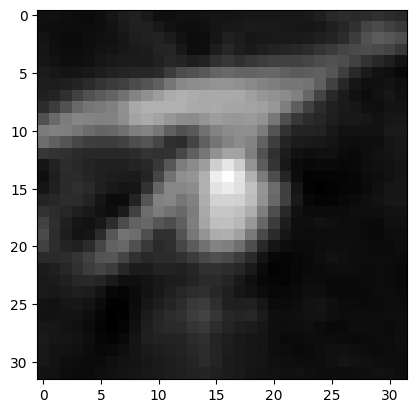

torch.Size([1, 5, 32, 32]) tensor([1.])


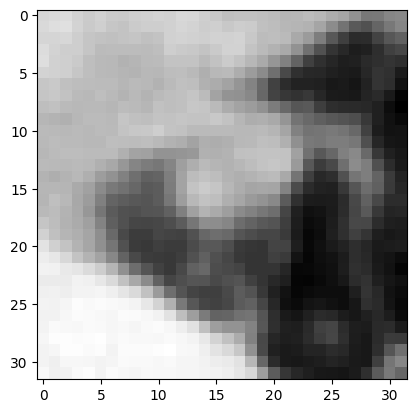

torch.Size([1, 5, 32, 32]) tensor([0.])


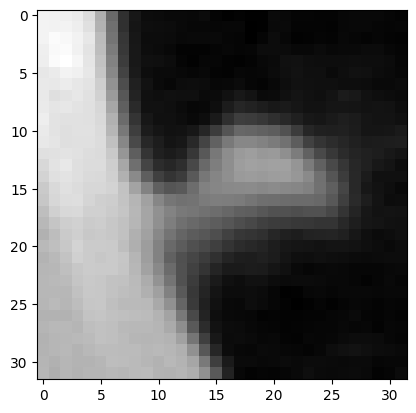

torch.Size([1, 5, 32, 32]) tensor([0.])


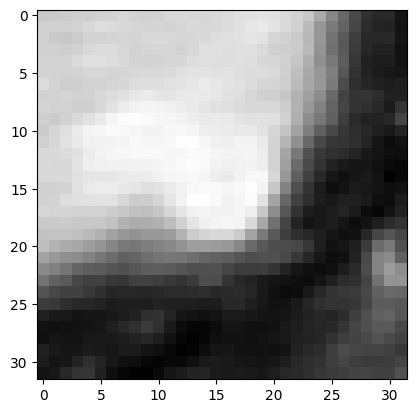

torch.Size([1, 5, 32, 32]) tensor([0.])


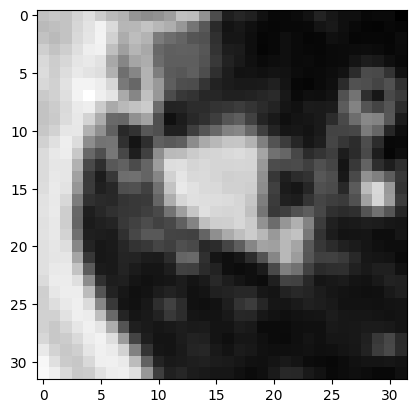

torch.Size([1, 5, 32, 32]) tensor([1.])


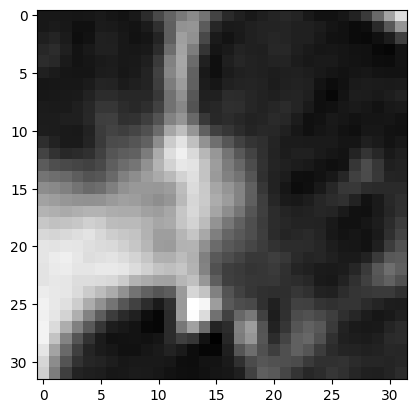

torch.Size([1, 5, 32, 32]) tensor([1.])


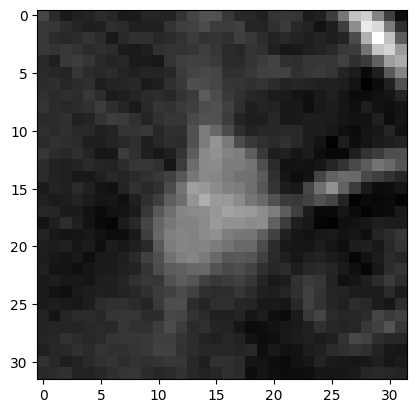

torch.Size([1, 5, 32, 32]) tensor([0.])


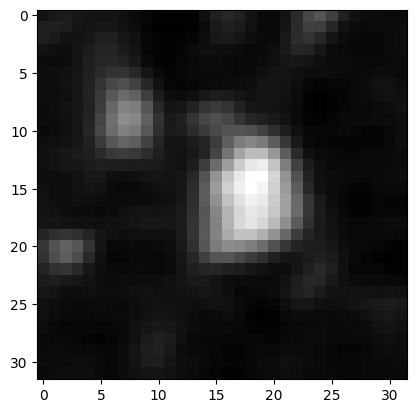

torch.Size([1, 5, 32, 32]) tensor([0.])


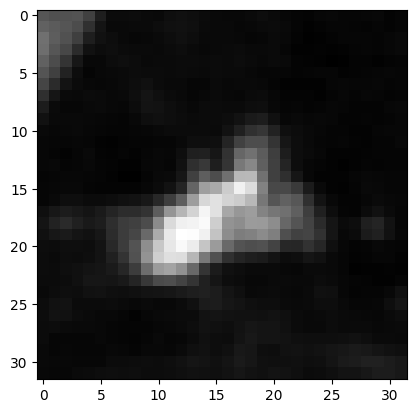

torch.Size([1, 5, 32, 32]) tensor([1.])


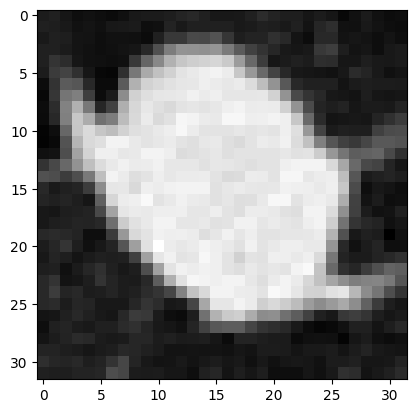

In [17]:
for i, volumen in enumerate(x):
    print(volumen.shape, y[i])
    plt.imshow(volumen.permute(1,2,3,0)[0], cmap = "gray")
    plt.show(); plt.close()
#     for j, value in enumerate(volumen.permute(1,2,3,0)):
#         plt.imshow(value)
#         plt.show()
#         plt.close()

In [17]:
print("          Train          ")
print("1", list(y_train).count(1))
print("2", list(y_train).count(2))
print("3", list(y_train).count(3))
print("4", list(y_train).count(4))
print("5", list(y_train).count(5))

print("          Test          ")
print("1", list(y_train).count(1))
print("2", list(y_train).count(2))
print("3", list(y_train).count(3))
print("4", list(y_train).count(4))
print("5", list(y_train).count(5))


          Train          
1 97
2 39
3 312
4 161
5 127
          Test          
1 97
2 39
3 312
4 161
5 127


In [18]:
img_size = 32; nodule_size = 16
def get_dataset_aug(directory_):
    T.manual_seed(0)
    
#     df_3R = pd.read_csv(os.path.join(LIDC_path, "meta_created_info_3d_3R.csv")) 
    df = pd.read_csv(os.path.join(LIDC_path, "meta_created_info_3d_4R.csv")) 
#     df = pd.concat([df_4R, df_3R])
    
    for c, row in enumerate(df["folder"]):
        patient_folder  = os.path.join(LIDC_path,row)
        length_folder   = len(os.listdir(patient_folder)) 
        if (length_folder == 2): df.drop(df[df['folder'] == row].index, inplace = True)
    
    X_train, X_test, y_train, y_test = train_test_split(df["folder"], df["malignancy"], test_size=0.20, random_state=100)
    num_data = len(X_train)
    print(len(X_train), len(X_test))
    
    aug_size = 6
    x = T.zeros((num_data * aug_size, 3, img_size, img_size))
    y = T.zeros((num_data * aug_size, len(T.Tensor([1., 0., 0., 0., 0.]))))
    augmenter = Augmenter(hflip=True, rotate=True, blurring=True)
    
    for c, row in enumerate(X_train):
        patient_folder  = os.path.join(LIDC_path,row)
        length_folder   = len(os.listdir(patient_folder)) 
        if (length_folder == 2): continue;
        image_folder    = sorted(os.listdir(patient_folder))
        middle_value    = len(image_folder)//2
        tensor_image_3d = [image_folder[middle_value-1], image_folder[middle_value], image_folder[middle_value+1]]

        patient = df[df['folder'] == row]
        for i, value in enumerate(tensor_image_3d):

            im = np.load(os.path.join(root, patient_folder, value))
            im = im - np.min(im)
            im = ((im/np.max(im))*255).astype(np.uint8)
            width, height = im.shape; width = width//2; height = height//2
            if((im.shape[0] < 32) or (im.shape[1] < 32)): im = cv.resize(im, (32, 32))
            elif((im.shape[0] < width+nodule_size) or (im.shape[1] < width+nodule_size)): im = cv.resize(im, (32, 32))
            else: im = im[width-nodule_size:width+nodule_size, width-nodule_size:width+nodule_size]

            for j, image in enumerate(augmenter.augment(im)):
                x[c * aug_size + j, i, :, :] = T.from_numpy(np.array(image).astype(np.float32))
                if(int(patient.malignancy) == 1): y[c * aug_size + j, 0:] = T.Tensor([1., 0., 0., 0., 0.])
                if(int(patient.malignancy) == 2): y[c * aug_size + j, 0:] = T.Tensor([0., 1., 0., 0., 0.])
                if(int(patient.malignancy) == 3): y[c * aug_size + j, 0:] = T.Tensor([0., 0., 1., 0., 0.])
                if(int(patient.malignancy) == 4): y[c * aug_size + j, 0:] = T.Tensor([0., 0., 0., 1., 0.])
                if(int(patient.malignancy) == 5): y[c * aug_size + j, 0:] = T.Tensor([0., 0., 0., 0., 1.])
        

    mu = x.mean()
    sd = x.std()
    x = (x - mu) / sd

    trainset = TensorDataset(x, y)
    num_data = len(X_test)
    x = T.zeros((num_data * aug_size, 3, img_size, img_size))
    y = T.zeros((num_data * aug_size, len(T.Tensor([1., 0., 0., 0., 0.]))))
    
    for c, row in enumerate(X_test):
        patient_folder  = os.path.join(LIDC_path,row)
        length_folder   = len(os.listdir(patient_folder)) 
        if (length_folder == 2): continue;
        image_folder    = sorted(os.listdir(patient_folder))
        middle_value    = len(image_folder)//2
        tensor_image_3d = [image_folder[middle_value-1], image_folder[middle_value], image_folder[middle_value+1]]

        patient = df[df['folder'] == row]
        for i, value in enumerate(tensor_image_3d):

            im = np.load(os.path.join(root, patient_folder, value))
            im = im - np.min(im)
            im = ((im/np.max(im))*255).astype(np.uint8)
            width, height = im.shape; width = width//2; height = height//2
            if((im.shape[0] < 32) or (im.shape[1] < 32)): im = cv.resize(im, (32, 32))
            elif((im.shape[0] < width+nodule_size) or (im.shape[1] < width+nodule_size)): im = cv.resize(im, (32, 32))
            else: im = im[width-nodule_size:width+nodule_size, width-nodule_size:width+nodule_size]

            for j, image in enumerate(augmenter.augment(im)):
                x[c * aug_size + j, i, :, :] = T.from_numpy(np.array(image).astype(np.float32))
                if(int(patient.malignancy) == 1): y[c * aug_size + j, 0:] = T.Tensor([1., 0., 0., 0., 0.])
                if(int(patient.malignancy) == 2): y[c * aug_size + j, 0:] = T.Tensor([0., 1., 0., 0., 0.])
                if(int(patient.malignancy) == 3): y[c * aug_size + j, 0:] = T.Tensor([0., 0., 1., 0., 0.])
                if(int(patient.malignancy) == 4): y[c * aug_size + j, 0:] = T.Tensor([0., 0., 0., 1., 0.])
                if(int(patient.malignancy) == 5): y[c * aug_size + j, 0:] = T.Tensor([0., 0., 0., 0., 1.])

    x = (x - mu) / sd
    testset = TensorDataset(x, y)

    return trainset, testset

In [19]:
img_size = 32; nodule_size = 16
def get_dataset(X_train, y_train, X_test, y_test, LIDC_path, df):
#     T.manual_seed(0)
    num_data = len(X_train)
    x = T.zeros((num_data, 1, 5, img_size, img_size))
    y = T.zeros((num_data, 1))
    
    for c, row in enumerate(X_train):
        patient_folder  = os.path.join(LIDC_path,row)
        length_folder   = len(os.listdir(patient_folder)) 
        image_folder    = sorted(os.listdir(patient_folder))
        middle_value    = len(image_folder)//2

        if (length_folder == 1): 
            tensor_image_3d = [image_folder, image_folder, image_folder, image_folder, image_folder]
        elif (length_folder == 2): 
            tensor_image_3d = [image_folder[0], image_folder[0], image_folder[1], image_folder[1], image_folder[1]]
        elif (length_folder == 3): 
            tensor_image_3d = [image_folder[0], image_folder[0], image_folder[1], image_folder[2], image_folder[2]]
        elif (length_folder == 4): 
            tensor_image_3d = [image_folder[0], image_folder[1], image_folder[2], image_folder[3], image_folder[3]]
        elif (length_folder >= 5): 
            tensor_image_3d = [image_folder[middle_value-2], image_folder[middle_value-1], image_folder[middle_value], 
                               image_folder[middle_value+1], image_folder[middle_value+2]]

        patient = df[df['folder'] == row]
        for i, value in enumerate(tensor_image_3d):

            im = np.load(os.path.join(root, patient_folder, value))
            im = im - np.min(im)
            im = ((im/np.max(im))*255).astype(np.uint8)
            width, height = im.shape; width = width//2; height = height//2
            if((im.shape[0] < 32) or (im.shape[1] < 32)): im = cv.resize(im, (32, 32))
            elif((im.shape[0] < width+nodule_size) or (im.shape[1] < width+nodule_size)): im = cv.resize(im, (32, 32))
            else: im = im[width-nodule_size:width+nodule_size, width-nodule_size:width+nodule_size]

            x[c, 0, i, :, :] = T.from_numpy(np.array(im).astype(np.float32))
            if(int(patient.malignancy) == 1): y[c, 0:] = int(0)
            if(int(patient.malignancy) == 2): y[c, 0:] = int(0)
            if(int(patient.malignancy) == 4): y[c, 0:] = int(1)
            if(int(patient.malignancy) == 5): y[c, 0:] = int(1)
                
    mu = x.mean()
    sd = x.std()
    x = (x - mu) / sd

    trainset = TensorDataset(x, y)
    num_data = len(X_test)
    x = T.zeros((num_data, 1, 5, img_size, img_size))
    y = T.zeros((num_data, 1))
    
    for c, row in enumerate(X_test):
        patient_folder  = os.path.join(LIDC_path,row)
        length_folder   = len(os.listdir(patient_folder)) 
        image_folder    = sorted(os.listdir(patient_folder))
        middle_value    = len(image_folder)//2

        if (length_folder == 1): 
            tensor_image_3d = [image_folder, image_folder, image_folder, image_folder, image_folder]
        elif (length_folder == 2): 
            tensor_image_3d = [image_folder[0], image_folder[0], image_folder[1], image_folder[1], image_folder[1]]
        elif (length_folder == 3): 
            tensor_image_3d = [image_folder[0], image_folder[0], image_folder[1], image_folder[2], image_folder[2]]
        elif (length_folder == 4): 
            tensor_image_3d = [image_folder[0], image_folder[1], image_folder[2], image_folder[3], image_folder[3]]
        elif (length_folder >= 5): 
            tensor_image_3d = [image_folder[middle_value-2], image_folder[middle_value-1], image_folder[middle_value], 
                               image_folder[middle_value+1], image_folder[middle_value+2]]
        patient = df[df['folder'] == row]
        for i, value in enumerate(tensor_image_3d):

            im = np.load(os.path.join(root, patient_folder, value))
            im = im - np.min(im)
            im = ((im/np.max(im))*255).astype(np.uint8)
            width, height = im.shape; width = width//2; height = height//2
            if((im.shape[0] < 32) or (im.shape[1] < 32)): im = cv.resize(im, (32, 32))
            elif((im.shape[0] < width+nodule_size) or (im.shape[1] < width+nodule_size)): im = cv.resize(im, (32, 32))
            else: im = im[width-nodule_size:width+nodule_size, width-nodule_size:width+nodule_size]

            x[c, 0, i, :, :] = T.from_numpy(np.array(im).astype(np.float32))
            if(int(patient.malignancy) == 1): y[c, 0:] = int(0)
            if(int(patient.malignancy) == 2): y[c, 0:] = int(0)
            if(int(patient.malignancy) == 4): y[c, 0:] = int(1)
            if(int(patient.malignancy) == 5): y[c, 0:] = int(1)
                
    x = (x - mu) / sd
    testset = TensorDataset(x, y)

    return trainset, testset

## Transfer learning
Create each validate and train function

In [20]:
from sklearn.preprocessing import OneHotEncoder
class Trainer:
    def __init__(self, training_set, validation_set,batch_size, n_epochs, model, optimizer, loss, name, device='cuda',
                 deterministic=False, parallel=False):

        T.backends.cudnn.deterministic = deterministic
        self.batch_size = batch_size
        self.dataset = training_set
        self.valid_dataset = validation_set

        self.model = model
        self.device = device
        self.parallel = parallel
        if parallel:
            self.model = nn.DataParallel(model)
        self.model.cuda(self.device)
        self.optimizer = optimizer
        self.loss = loss
        self.n_epochs = n_epochs
        self.name = name
        self.log = ''


    def train_epoch(self, epoch):
        s_time = time.time()
        self.model.train()
        all_losses = []
        all_acc = []
        for data, target in self.dataset:
            data, target = data.cuda(self.device), target.cuda(self.device)
            self.optimizer.zero_grad()
            output = self.model(data)
            acc = self.calc_accuracy(output, target)
            #Si se usa la V2, se necesita realizar un .mean()
            loss = self.loss(output, target)
            loss.backward()
            self.optimizer.step()
            all_losses.append(loss.item())
            all_acc.append(acc.cpu())

        valid_acc = self.validate()
        self.report(all_losses, all_acc, valid_acc, epoch, time.time() - s_time)
        
    def report(self, all_losses, all_acc, valid_acc, epoch, duration):
        n_train = len(all_losses)
        loss = np.sum(all_losses) / n_train

        def summery(data):
            n = 0.0
            s_dist = 0
            for dist in data:
                s_dist += T.sum(dist)
                n += len(dist)

            return s_dist.float() / n

        tr_dist = summery(all_acc)
        va_dist = summery(valid_acc)
        
        
        dataset_valid, target, pred = self.predict()
        fpr, tpr, thresholds = metrics.roc_curve(target, pred)
        auc = metrics.auc(fpr, tpr)

        msg = f'epoch {epoch}: loss {loss:.3f} Tr Acc {tr_dist:.2f} Val Acc {va_dist:.2f} AUC {auc:.2f} duration {duration:.2f}'
        print(msg)
        self.log += msg + '\n'


    def predict(self):
        self.model.eval()
        all_pred = T.zeros(len(self.valid_dataset.dataset))
        all_targets = T.zeros(len(self.valid_dataset.dataset)); all_dataset = []; 
        for batch_idx, (data, target) in enumerate(self.valid_dataset):
            with T.no_grad():
                data, target = data.cuda(self.device), target.cuda(self.device)
                output = self.model(data)
                
            st = batch_idx * self.batch_size
            all_dataset.append(data)
            all_pred[st:st + output.shape[0]] = output.cpu().squeeze()
            all_targets[st:st + target.shape[0]] = target.cpu().squeeze()
        
        return all_dataset, all_targets, all_pred  


    def validate(self):
        dataset_valid, targets_append, pred_append = self.predict()
        matches = self.calc_accuracy(pred_append, targets_append)
        return [matches]

    def calc_accuracy(self, x, y):
        x_th = (x > 0.5).long()
        matches = x_th == y.long()
        return matches

    def run(self):
        start_t = time.time()
        for epoch in range(self.n_epochs):
            self.train_epoch(epoch)
        diff = time.time() - start_t
        print(f'took {diff} seconds')
        with open(os.path.join('results',f'{self.name}.txt'),'w') as f:
            f.write(self.log)
        print(f'took {diff} seconds')

In [24]:
def get_metrics(target, pred):
    prec, recall, _, _ = metrics.precision_recall_fscore_support(target, pred>0.5, average='binary')
    fpr, tpr, thresholds = metrics.roc_curve(target, pred)
    auc = metrics.auc(fpr, tpr)
    conf_mat = 0
    return prec, recall, auc

def calc_accuracy(x, y):
    x_th = (x > 0.5).long()
    matches = x_th == y.long()
    return matches

def reset_rand():
    seed = 1000
    T.manual_seed(seed)
    T.cuda.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)

embedding_layer = {}
def get_activation(name):
    def hook(model, input, output):
        embedding_layer[name] = output.detach()
    return hook

def kfold(src_path, batch_size, n_epochs, loss, model_optimizer, name, device, deterministic=False, parallel=False,
          dataset_func=get_dataset):

    print(f'Experiment {name}')
    all_pred = T.zeros(921); all_dataset = []; targets_app = T.zeros(921)
    i = 0; fold = 0
    f = open(os.path.join('results', f'{name}.txt'), 'w')
    f.write(f'{batch_size} {n_epochs} {"Optimizer: Adam"}\n')
    
    df_3R = pd.read_csv(os.path.join(LIDC_path, "meta_created_info_3d_3R.csv")) 
    df_4R = pd.read_csv(os.path.join(LIDC_path, "meta_created_info_3d_4R.csv")) 
    df_all = pd.concat([df_4R, df_3R]).reset_index()
    df_benign = df_all[df_all['malignancy']<3]
    df_malign = df_all[df_all['malignancy']>3]
    df = pd.concat([df_benign, df_malign]).reset_index()
    
    skf = StratifiedKFold(n_splits=10, shuffle=False)
    skf.get_n_splits(df["folder"], df["malignancy"])
    
    for train_index, test_index in skf.split(df["folder"], df["malignancy"]):
        reset_rand()
        X_train, X_test = df["folder"][train_index], df["folder"][test_index]
        y_train, y_test = df["malignancy"][train_index], df["malignancy"][test_index]
        print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)
        trset, testset = dataset_func(X_train, y_train, X_test, y_test, src_path, df)
        
        print(f'------------ fold {fold+1} ------------')
        f.write(f'------------ fold {fold+1} ------------\n')
        print(f'Training Size: {len(trset)}, Validation Size: {len(testset)}')
        trset = DataLoader(trset, batch_size, shuffle=True)
        testset = DataLoader(testset, batch_size, shuffle=False)
        model,optimizer = model_optimizer()

        tr = Trainer(trset, testset, batch_size, n_epochs, model, optimizer, loss, f'{name}_{fold + 1}', device, 
                     deterministic, parallel)
        tr.run()

        dataset_valid, targets_, pred_ = tr.predict()
        T.save(model.state_dict(), f'results/{name}_fold_{fold}.pth')

        
        all_pred[i:i+pred_.shape[0]] = pred_
        all_dataset.append(dataset_valid)
        targets_app[i:i+targets_.shape[0]] = targets_
        i += targets_.shape[0]; fold += 1 

        prec, recall, auc = get_metrics(targets_, pred_)
        print(f'AUC: {auc}, Precision : {prec}, Recall: {recall}')
        f.write(f'AUC: {auc}, Precision : {prec}, Recall: {recall}\n')
                
        del tr

    T.save(all_dataset, f'results/completeDataset_{name}')
    T.save(all_pred, f'results/pedict_{name}')
    T.save(targets_app, f'results/target_{name}')
    
    matches = calc_accuracy(all_pred, targets_app)
    acc = matches.float().mean()
    all_pred = all_pred.numpy()
    targets_app = targets_app.numpy()
    #all_dataset = all_dataset.numpy()
    embedido16d = model.get_embebido16d()
    embebido1d = model.get_embebido1d()

    print("Finalizing")
    prec, recall, auc = get_metrics(targets_app, all_pred)
    print(f'all_pred: {all_pred}, all_targets {targets_app}')
    print(f'accuray: {acc}, AUC: {auc}, Precision : {prec}, Recall: {recall}')
    f.write(f'accuray: {acc}, AUC: {auc}, Precision : {prec}, Recall: {recall}')
    result = {'all_pred': all_pred, 'all_targets': targets_app}

    
    return all_pred, all_dataset, targets_app, embedido16d, embebido1d

In [25]:
def model_opt():
    model = RFBMultiHAttnNetwork_V3()
    optm = Adam(model.parameters())#, lr=0.00001)
    return model, optm

all_pred, all_dataset, all_targets, embebido16d, embebido1d =  kfold(LIDC_path,
                                            6,
                                            50,
                                            loss = nn.BCELoss(),
                                            model_optimizer = model_opt,
                                            name = 'Experimento',
                                            device = 'cuda',
                                            deterministic = True,
                                            dataset_func = get_dataset)

nombre_archivo = "embebido16d_nodulos.npy" #Creo el nombre del archivo donde voy a guardar mi embebido de alta dimensionalidad
np.save(nombre_archivo, embebido16d)

nombre_archivo2 = "embebido1d_nodulos.npy" #Creo el nombre del archivo donde voy a guardar mi embebido de 1 dimension
np.save(nombre_archivo2, embebido1d)

Experiment Experimento
(479,) (479,) (54,) (54,)


/tmp/ipykernel_32678/3793377489.py:38: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 1): y[c, 0:] = int(0)
/tmp/ipykernel_32678/3793377489.py:39: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 2): y[c, 0:] = int(0)
/tmp/ipykernel_32678/3793377489.py:40: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 4): y[c, 0:] = int(1)
/tmp/ipykernel_32678/3793377489.py:41: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 5): y[c, 0:] = int(1)
/tmp/ipykernel_32678/3793377489.py:81: FutureWarning: Calling int on a s

------------ fold 1 ------------
Training Size: 479, Validation Size: 54
epoch 0: loss 0.524 Tr Acc 0.74 Val Acc 0.74 AUC 0.81 duration 116.64
epoch 1: loss 0.468 Tr Acc 0.76 Val Acc 0.74 AUC 0.84 duration 117.19
epoch 2: loss 0.418 Tr Acc 0.82 Val Acc 0.70 AUC 0.83 duration 116.84
epoch 3: loss 0.361 Tr Acc 0.82 Val Acc 0.72 AUC 0.86 duration 116.95
epoch 4: loss 0.378 Tr Acc 0.84 Val Acc 0.80 AUC 0.89 duration 117.39
epoch 5: loss 0.350 Tr Acc 0.86 Val Acc 0.80 AUC 0.89 duration 117.27
epoch 6: loss 0.336 Tr Acc 0.86 Val Acc 0.76 AUC 0.86 duration 117.22
epoch 7: loss 0.274 Tr Acc 0.90 Val Acc 0.80 AUC 0.91 duration 117.22
epoch 8: loss 0.263 Tr Acc 0.89 Val Acc 0.81 AUC 0.91 duration 117.46
epoch 9: loss 0.240 Tr Acc 0.90 Val Acc 0.80 AUC 0.89 duration 117.15
epoch 10: loss 0.256 Tr Acc 0.89 Val Acc 0.80 AUC 0.92 duration 117.27
epoch 11: loss 0.242 Tr Acc 0.87 Val Acc 0.78 AUC 0.88 duration 117.13
epoch 12: loss 0.291 Tr Acc 0.89 Val Acc 0.87 AUC 0.92 duration 117.39
epoch 13: loss

/tmp/ipykernel_32678/3793377489.py:38: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 1): y[c, 0:] = int(0)
/tmp/ipykernel_32678/3793377489.py:39: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 2): y[c, 0:] = int(0)
/tmp/ipykernel_32678/3793377489.py:40: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 4): y[c, 0:] = int(1)
/tmp/ipykernel_32678/3793377489.py:41: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 5): y[c, 0:] = int(1)
/tmp/ipykernel_32678/3793377489.py:81: FutureWarning: Calling int on a s

------------ fold 2 ------------
Training Size: 479, Validation Size: 54
epoch 0: loss 0.519 Tr Acc 0.75 Val Acc 0.78 AUC 0.86 duration 115.14
epoch 1: loss 0.471 Tr Acc 0.78 Val Acc 0.83 AUC 0.89 duration 115.20
epoch 2: loss 0.427 Tr Acc 0.81 Val Acc 0.80 AUC 0.92 duration 115.08
epoch 3: loss 0.395 Tr Acc 0.81 Val Acc 0.67 AUC 0.86 duration 115.08
epoch 4: loss 0.407 Tr Acc 0.81 Val Acc 0.70 AUC 0.91 duration 115.18
epoch 5: loss 0.392 Tr Acc 0.81 Val Acc 0.91 AUC 0.97 duration 115.25
epoch 6: loss 0.365 Tr Acc 0.85 Val Acc 0.80 AUC 0.83 duration 115.09
epoch 7: loss 0.305 Tr Acc 0.87 Val Acc 0.91 AUC 0.96 duration 115.18
epoch 8: loss 0.279 Tr Acc 0.90 Val Acc 0.93 AUC 0.96 duration 115.13
epoch 9: loss 0.265 Tr Acc 0.90 Val Acc 0.94 AUC 0.98 duration 115.05
epoch 10: loss 0.279 Tr Acc 0.87 Val Acc 0.85 AUC 0.96 duration 115.21
epoch 11: loss 0.264 Tr Acc 0.88 Val Acc 0.94 AUC 0.98 duration 115.16
epoch 12: loss 0.285 Tr Acc 0.87 Val Acc 0.91 AUC 0.96 duration 115.15
epoch 13: loss

/tmp/ipykernel_32678/3793377489.py:38: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 1): y[c, 0:] = int(0)
/tmp/ipykernel_32678/3793377489.py:39: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 2): y[c, 0:] = int(0)
/tmp/ipykernel_32678/3793377489.py:40: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 4): y[c, 0:] = int(1)
/tmp/ipykernel_32678/3793377489.py:41: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 5): y[c, 0:] = int(1)
/tmp/ipykernel_32678/3793377489.py:81: FutureWarning: Calling int on a s

------------ fold 3 ------------
Training Size: 479, Validation Size: 54
epoch 0: loss 0.527 Tr Acc 0.73 Val Acc 0.72 AUC 0.84 duration 115.05
epoch 1: loss 0.481 Tr Acc 0.76 Val Acc 0.83 AUC 0.86 duration 115.16
epoch 2: loss 0.421 Tr Acc 0.81 Val Acc 0.81 AUC 0.87 duration 115.13
epoch 3: loss 0.371 Tr Acc 0.82 Val Acc 0.72 AUC 0.92 duration 115.11
epoch 4: loss 0.361 Tr Acc 0.84 Val Acc 0.81 AUC 0.92 duration 115.27
epoch 5: loss 0.327 Tr Acc 0.86 Val Acc 0.83 AUC 0.93 duration 115.12
epoch 6: loss 0.319 Tr Acc 0.86 Val Acc 0.87 AUC 0.95 duration 115.04
epoch 7: loss 0.267 Tr Acc 0.90 Val Acc 0.85 AUC 0.94 duration 115.00
epoch 8: loss 0.256 Tr Acc 0.90 Val Acc 0.85 AUC 0.96 duration 115.12
epoch 9: loss 0.227 Tr Acc 0.91 Val Acc 0.85 AUC 0.91 duration 115.16
epoch 10: loss 0.251 Tr Acc 0.90 Val Acc 0.83 AUC 0.94 duration 115.01
epoch 11: loss 0.200 Tr Acc 0.92 Val Acc 0.83 AUC 0.94 duration 115.23
epoch 12: loss 0.248 Tr Acc 0.90 Val Acc 0.87 AUC 0.95 duration 115.20
epoch 13: loss

/tmp/ipykernel_32678/3793377489.py:38: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 1): y[c, 0:] = int(0)
/tmp/ipykernel_32678/3793377489.py:39: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 2): y[c, 0:] = int(0)
/tmp/ipykernel_32678/3793377489.py:40: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 4): y[c, 0:] = int(1)
/tmp/ipykernel_32678/3793377489.py:41: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 5): y[c, 0:] = int(1)
/tmp/ipykernel_32678/3793377489.py:81: FutureWarning: Calling int on a s

------------ fold 4 ------------
Training Size: 480, Validation Size: 53
epoch 0: loss 0.528 Tr Acc 0.75 Val Acc 0.83 AUC 0.91 duration 114.89
epoch 1: loss 0.442 Tr Acc 0.79 Val Acc 0.89 AUC 0.96 duration 114.95
epoch 2: loss 0.425 Tr Acc 0.80 Val Acc 0.81 AUC 0.93 duration 114.94
epoch 3: loss 0.390 Tr Acc 0.81 Val Acc 0.42 AUC 0.89 duration 115.00
epoch 4: loss 0.372 Tr Acc 0.84 Val Acc 0.91 AUC 0.97 duration 115.05
epoch 5: loss 0.369 Tr Acc 0.84 Val Acc 0.94 AUC 0.99 duration 114.98
epoch 6: loss 0.352 Tr Acc 0.84 Val Acc 0.92 AUC 0.98 duration 114.92
epoch 7: loss 0.319 Tr Acc 0.87 Val Acc 0.96 AUC 0.98 duration 114.84
epoch 8: loss 0.304 Tr Acc 0.87 Val Acc 0.92 AUC 0.98 duration 114.96
epoch 9: loss 0.296 Tr Acc 0.88 Val Acc 0.94 AUC 0.97 duration 114.99
epoch 10: loss 0.281 Tr Acc 0.90 Val Acc 0.96 AUC 0.98 duration 114.82
epoch 11: loss 0.274 Tr Acc 0.89 Val Acc 0.92 AUC 0.96 duration 114.95
epoch 12: loss 0.215 Tr Acc 0.91 Val Acc 0.94 AUC 0.98 duration 114.97
epoch 13: loss

/tmp/ipykernel_32678/3793377489.py:38: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 1): y[c, 0:] = int(0)
/tmp/ipykernel_32678/3793377489.py:39: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 2): y[c, 0:] = int(0)
/tmp/ipykernel_32678/3793377489.py:40: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 4): y[c, 0:] = int(1)
/tmp/ipykernel_32678/3793377489.py:41: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 5): y[c, 0:] = int(1)
/tmp/ipykernel_32678/3793377489.py:81: FutureWarning: Calling int on a s

------------ fold 5 ------------
Training Size: 480, Validation Size: 53
epoch 0: loss 0.532 Tr Acc 0.75 Val Acc 0.64 AUC 0.88 duration 115.14
epoch 1: loss 0.439 Tr Acc 0.80 Val Acc 0.79 AUC 0.89 duration 115.19
epoch 2: loss 0.436 Tr Acc 0.81 Val Acc 0.72 AUC 0.92 duration 115.35
epoch 3: loss 0.418 Tr Acc 0.81 Val Acc 0.89 AUC 0.94 duration 115.14
epoch 4: loss 0.381 Tr Acc 0.85 Val Acc 0.70 AUC 0.93 duration 115.21
epoch 5: loss 0.367 Tr Acc 0.84 Val Acc 0.87 AUC 0.94 duration 115.20
epoch 6: loss 0.371 Tr Acc 0.84 Val Acc 0.85 AUC 0.94 duration 115.13
epoch 7: loss 0.322 Tr Acc 0.85 Val Acc 0.83 AUC 0.95 duration 115.23
epoch 8: loss 0.338 Tr Acc 0.88 Val Acc 0.89 AUC 0.98 duration 115.14
epoch 9: loss 0.302 Tr Acc 0.88 Val Acc 0.87 AUC 0.97 duration 115.12
epoch 10: loss 0.294 Tr Acc 0.88 Val Acc 0.91 AUC 0.97 duration 115.23
epoch 11: loss 0.281 Tr Acc 0.89 Val Acc 0.79 AUC 0.94 duration 115.26
epoch 12: loss 0.278 Tr Acc 0.89 Val Acc 0.85 AUC 0.99 duration 115.23
epoch 13: loss

/tmp/ipykernel_32678/3793377489.py:38: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 1): y[c, 0:] = int(0)
/tmp/ipykernel_32678/3793377489.py:39: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 2): y[c, 0:] = int(0)
/tmp/ipykernel_32678/3793377489.py:40: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 4): y[c, 0:] = int(1)
/tmp/ipykernel_32678/3793377489.py:41: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 5): y[c, 0:] = int(1)
/tmp/ipykernel_32678/3793377489.py:81: FutureWarning: Calling int on a s

------------ fold 6 ------------
Training Size: 480, Validation Size: 53
epoch 0: loss 0.527 Tr Acc 0.77 Val Acc 0.62 AUC 0.83 duration 115.27
epoch 1: loss 0.433 Tr Acc 0.80 Val Acc 0.77 AUC 0.90 duration 115.23
epoch 2: loss 0.434 Tr Acc 0.80 Val Acc 0.68 AUC 0.93 duration 115.26
epoch 3: loss 0.421 Tr Acc 0.81 Val Acc 0.81 AUC 0.92 duration 115.24
epoch 4: loss 0.362 Tr Acc 0.83 Val Acc 0.70 AUC 0.90 duration 115.34
epoch 5: loss 0.362 Tr Acc 0.83 Val Acc 0.77 AUC 0.92 duration 115.16
epoch 6: loss 0.330 Tr Acc 0.85 Val Acc 0.77 AUC 0.94 duration 115.18
epoch 7: loss 0.321 Tr Acc 0.86 Val Acc 0.92 AUC 0.96 duration 115.11
epoch 8: loss 0.291 Tr Acc 0.88 Val Acc 0.92 AUC 0.93 duration 115.12
epoch 9: loss 0.293 Tr Acc 0.88 Val Acc 0.91 AUC 0.95 duration 115.07
epoch 10: loss 0.271 Tr Acc 0.88 Val Acc 0.87 AUC 0.90 duration 115.13
epoch 11: loss 0.244 Tr Acc 0.89 Val Acc 0.87 AUC 0.93 duration 115.13
epoch 12: loss 0.217 Tr Acc 0.90 Val Acc 0.87 AUC 0.94 duration 115.17
epoch 13: loss

/tmp/ipykernel_32678/3793377489.py:38: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 1): y[c, 0:] = int(0)
/tmp/ipykernel_32678/3793377489.py:39: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 2): y[c, 0:] = int(0)
/tmp/ipykernel_32678/3793377489.py:40: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 4): y[c, 0:] = int(1)
/tmp/ipykernel_32678/3793377489.py:41: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 5): y[c, 0:] = int(1)
/tmp/ipykernel_32678/3793377489.py:81: FutureWarning: Calling int on a s

------------ fold 7 ------------
Training Size: 480, Validation Size: 53
epoch 0: loss 0.512 Tr Acc 0.77 Val Acc 0.72 AUC 0.84 duration 115.29
epoch 1: loss 0.420 Tr Acc 0.79 Val Acc 0.64 AUC 0.88 duration 115.32
epoch 2: loss 0.433 Tr Acc 0.81 Val Acc 0.83 AUC 0.88 duration 115.27
epoch 3: loss 0.412 Tr Acc 0.82 Val Acc 0.81 AUC 0.88 duration 115.23
epoch 4: loss 0.372 Tr Acc 0.84 Val Acc 0.75 AUC 0.90 duration 115.17
epoch 5: loss 0.356 Tr Acc 0.82 Val Acc 0.74 AUC 0.88 duration 115.26
epoch 6: loss 0.349 Tr Acc 0.85 Val Acc 0.87 AUC 0.93 duration 115.19
epoch 7: loss 0.309 Tr Acc 0.87 Val Acc 0.81 AUC 0.95 duration 115.17
epoch 8: loss 0.294 Tr Acc 0.89 Val Acc 0.89 AUC 0.95 duration 115.19
epoch 9: loss 0.303 Tr Acc 0.89 Val Acc 0.91 AUC 0.95 duration 115.21
epoch 10: loss 0.273 Tr Acc 0.89 Val Acc 0.77 AUC 0.95 duration 115.07
epoch 11: loss 0.247 Tr Acc 0.89 Val Acc 0.83 AUC 0.91 duration 115.17
epoch 12: loss 0.238 Tr Acc 0.90 Val Acc 0.87 AUC 0.93 duration 115.09
epoch 13: loss

/tmp/ipykernel_32678/3793377489.py:38: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 1): y[c, 0:] = int(0)
/tmp/ipykernel_32678/3793377489.py:39: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 2): y[c, 0:] = int(0)
/tmp/ipykernel_32678/3793377489.py:40: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 4): y[c, 0:] = int(1)
/tmp/ipykernel_32678/3793377489.py:41: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 5): y[c, 0:] = int(1)
/tmp/ipykernel_32678/3793377489.py:81: FutureWarning: Calling int on a s

------------ fold 8 ------------
Training Size: 480, Validation Size: 53
epoch 0: loss 0.512 Tr Acc 0.78 Val Acc 0.77 AUC 0.83 duration 115.12
epoch 1: loss 0.441 Tr Acc 0.78 Val Acc 0.74 AUC 0.85 duration 115.19
epoch 2: loss 0.436 Tr Acc 0.80 Val Acc 0.72 AUC 0.81 duration 115.18
epoch 3: loss 0.399 Tr Acc 0.81 Val Acc 0.83 AUC 0.88 duration 115.17
epoch 4: loss 0.371 Tr Acc 0.85 Val Acc 0.79 AUC 0.87 duration 115.22
epoch 5: loss 0.341 Tr Acc 0.84 Val Acc 0.79 AUC 0.88 duration 115.13
epoch 6: loss 0.342 Tr Acc 0.85 Val Acc 0.83 AUC 0.87 duration 115.15
epoch 7: loss 0.316 Tr Acc 0.87 Val Acc 0.79 AUC 0.86 duration 115.13
epoch 8: loss 0.297 Tr Acc 0.88 Val Acc 0.81 AUC 0.91 duration 115.19
epoch 9: loss 0.287 Tr Acc 0.89 Val Acc 0.81 AUC 0.88 duration 115.21
epoch 10: loss 0.241 Tr Acc 0.90 Val Acc 0.83 AUC 0.91 duration 115.20
epoch 11: loss 0.246 Tr Acc 0.88 Val Acc 0.79 AUC 0.86 duration 115.17
epoch 12: loss 0.233 Tr Acc 0.90 Val Acc 0.83 AUC 0.91 duration 115.23
epoch 13: loss

/tmp/ipykernel_32678/3793377489.py:38: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 1): y[c, 0:] = int(0)
/tmp/ipykernel_32678/3793377489.py:39: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 2): y[c, 0:] = int(0)
/tmp/ipykernel_32678/3793377489.py:40: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 4): y[c, 0:] = int(1)
/tmp/ipykernel_32678/3793377489.py:41: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 5): y[c, 0:] = int(1)
/tmp/ipykernel_32678/3793377489.py:81: FutureWarning: Calling int on a s

------------ fold 9 ------------
Training Size: 480, Validation Size: 53
epoch 0: loss 0.510 Tr Acc 0.77 Val Acc 0.83 AUC 0.88 duration 115.22
epoch 1: loss 0.444 Tr Acc 0.79 Val Acc 0.77 AUC 0.86 duration 115.18
epoch 2: loss 0.433 Tr Acc 0.79 Val Acc 0.68 AUC 0.86 duration 115.15
epoch 3: loss 0.402 Tr Acc 0.82 Val Acc 0.68 AUC 0.93 duration 115.15
epoch 4: loss 0.349 Tr Acc 0.85 Val Acc 0.83 AUC 0.92 duration 115.23
epoch 5: loss 0.333 Tr Acc 0.84 Val Acc 0.74 AUC 0.91 duration 115.15
epoch 6: loss 0.337 Tr Acc 0.87 Val Acc 0.81 AUC 0.92 duration 115.29
epoch 7: loss 0.317 Tr Acc 0.88 Val Acc 0.85 AUC 0.92 duration 115.27
epoch 8: loss 0.299 Tr Acc 0.87 Val Acc 0.87 AUC 0.94 duration 115.27
epoch 9: loss 0.276 Tr Acc 0.89 Val Acc 0.85 AUC 0.92 duration 115.24
epoch 10: loss 0.242 Tr Acc 0.90 Val Acc 0.79 AUC 0.92 duration 115.20
epoch 11: loss 0.242 Tr Acc 0.91 Val Acc 0.87 AUC 0.88 duration 115.22
epoch 12: loss 0.215 Tr Acc 0.93 Val Acc 0.77 AUC 0.90 duration 115.18
epoch 13: loss

/tmp/ipykernel_32678/3793377489.py:38: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 1): y[c, 0:] = int(0)
/tmp/ipykernel_32678/3793377489.py:39: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 2): y[c, 0:] = int(0)
/tmp/ipykernel_32678/3793377489.py:40: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 4): y[c, 0:] = int(1)
/tmp/ipykernel_32678/3793377489.py:41: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if(int(patient.malignancy) == 5): y[c, 0:] = int(1)
/tmp/ipykernel_32678/3793377489.py:81: FutureWarning: Calling int on a s

------------ fold 10 ------------
Training Size: 480, Validation Size: 53
epoch 0: loss 0.529 Tr Acc 0.75 Val Acc 0.85 AUC 0.92 duration 115.15
epoch 1: loss 0.439 Tr Acc 0.81 Val Acc 0.81 AUC 0.92 duration 115.05
epoch 2: loss 0.395 Tr Acc 0.83 Val Acc 0.79 AUC 0.93 duration 115.05
epoch 3: loss 0.367 Tr Acc 0.82 Val Acc 0.81 AUC 0.92 duration 115.09
epoch 4: loss 0.341 Tr Acc 0.86 Val Acc 0.81 AUC 0.91 duration 114.97
epoch 5: loss 0.340 Tr Acc 0.82 Val Acc 0.83 AUC 0.94 duration 115.08
epoch 6: loss 0.327 Tr Acc 0.86 Val Acc 0.85 AUC 0.95 duration 115.21
epoch 7: loss 0.311 Tr Acc 0.86 Val Acc 0.83 AUC 0.93 duration 115.18
epoch 8: loss 0.296 Tr Acc 0.89 Val Acc 0.77 AUC 0.95 duration 115.12
epoch 9: loss 0.282 Tr Acc 0.89 Val Acc 0.85 AUC 0.96 duration 115.12
epoch 10: loss 0.247 Tr Acc 0.90 Val Acc 0.87 AUC 0.92 duration 115.06
epoch 11: loss 0.244 Tr Acc 0.90 Val Acc 0.79 AUC 0.92 duration 115.19
epoch 12: loss 0.215 Tr Acc 0.93 Val Acc 0.79 AUC 0.92 duration 115.06
epoch 13: los

NameError: name 'model' is not defined

In [30]:
df['folder']

0     LICD-0001_NI000
1     LICD-0003_NI001
2     LICD-0003_NI002
3     LICD-0003_NI003
4     LICD-0004_NI000
           ...       
29    LICD-0390_NI007
30    LICD-0394_NI001
31    LICD-0399_NI000
32    LICD-0402_NI004
33    LICD-0402_NI006
Name: folder, Length: 921, dtype: object

In [31]:
X_train

287    LICD-0249_NI000
174    LICD-0142_NI002
516    LICD-0509_NI000
189    LICD-0159_NI001
786    LICD-0869_NI001
            ...       
855    LICD-0974_NI000
871    LICD-1000_NI000
835    LICD-0935_NI000
792    LICD-0879_NI000
520    LICD-0521_NI000
Name: folder, Length: 736, dtype: object

In [33]:
x.size()

torch.Size([736, 1, 5, 32, 32])

In [34]:
pato = T.Tensor([1., 0., 0., 0., 0.])
pato

tensor([1., 0., 0., 0., 0.])

### Cargo el dataset con las posiciones

In [4]:
data = pd.read_csv('PosicionNodulos.csv')


In [5]:
data

,patient_id,nodule_no,folder_id,Xmin,Xmax,Ymin,Ymax,Kmin,Kmax,Slice,x,y,Cuadrante
0,1,0,LIDC-IDRI-0001,297,341,340,392,86,95,89,318,365,4
1,2,0,LIDC-IDRI-0002,324,374,334,379,171,199,184,348,355,4
2,3,0,LIDC-IDRI-0003,350,384,331,367,62,70,65,366,348,4
3,3,1,LIDC-IDRI-0003,344,389,333,373,70,80,74,365,352,4
4,3,2,LIDC-IDRI-0003,299,318,192,205,81,85,82,307,197,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2620,1011,0,LIDC-IDRI-1011,389,423,282,311,53,61,56,405,295,4
2621,1011,1,LIDC-IDRI-1011,355,408,234,268,69,77,72,380,250,1
2622,1011,2,LIDC-IDRI-1011,202,228,152,182,84,89,85,214,166,2
2623,1011,3,LIDC-IDRI-1011,201,210,227,236,108,110,108,204,230,2


### Filtro para dejar unicamente la posición de los nodulos que se usaron en la arquitectura de Aleja

In [36]:
#Para obtener los nodulos coincidentes de ambos datasets deacuerdo por patient:id y nodule_no
nodsPosData = pd.merge(df, data, on=['patient_id', 'nodule_no'], how='inner')

# Copiar las filas coincidentes en real_data
nodsPosData = merged_data.copy()

# Si deseas reiniciar los índices en real_data
nodsPosData.reset_index(drop=True, inplace=True)

In [48]:
nodsPosData

,patient_id,nodule_no,folder,malignancy,is_cancer,calcification,lobulation,texture,spiculation,subtlety,...,Xmin,Xmax,Ymin,Ymax,Kmin,Kmax,Slice,x,y,Cuadrante
0,1,0,LICD-0001_NI000,5,True,6,3,5,5,5,...,297,341,340,392,86,95,89,318,365,4
1,3,1,LICD-0003_NI001,5,True,6,2,4,3,5,...,344,389,333,373,70,80,74,365,352,4
2,3,2,LICD-0003_NI002,4,True,6,2,5,2,4,...,299,318,192,205,81,85,82,307,197,1
3,3,3,LICD-0003_NI003,4,True,6,1,5,1,4,...,212,231,209,229,81,89,84,220,218,2
4,4,0,LICD-0004_NI000,1,False,3,1,5,1,3,...,136,147,318,329,74,79,75,140,322,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
916,390,7,LICD-0390_NI007,1,False,3,1,5,1,3,...,186,199,175,185,72,75,72,191,179,2
917,394,1,LICD-0394_NI001,3,Ambiguous,6,2,5,1,4,...,90,103,368,381,119,122,119,95,373,3
918,399,0,LICD-0399_NI000,2,False,6,2,5,1,4,...,171,181,151,164,113,118,114,175,156,2
919,402,4,LICD-0402_NI004,3,Ambiguous,6,1,1,1,2,...,153,165,342,350,201,207,203,158,345,3


In [31]:
df

,patient_id,nodule_no,folder,malignancy,is_cancer,calcification,lobulation,texture,spiculation,subtlety,margin,intercept,slope
0,1,0,LICD-0001_NI000,5,True,6,3,5,5,5,4,-1024.0,1.0
1,3,1,LICD-0003_NI001,5,True,6,2,4,3,5,3,-1024.0,1.0
2,3,2,LICD-0003_NI002,4,True,6,2,5,2,4,4,-1024.0,1.0
3,3,3,LICD-0003_NI003,4,True,6,1,5,1,4,5,-1024.0,1.0
4,4,0,LICD-0004_NI000,1,False,3,1,5,1,3,5,-1024.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
29,390,7,LICD-0390_NI007,1,False,3,1,5,1,3,5,-1024.0,1.0
30,394,1,LICD-0394_NI001,3,Ambiguous,6,2,5,1,4,4,-1024.0,1.0
31,399,0,LICD-0399_NI000,2,False,6,2,5,1,4,5,-1024.0,1.0
32,402,4,LICD-0402_NI004,3,Ambiguous,6,1,1,1,2,2,-1024.0,1.0


In [38]:
nodsPosData.to_csv('Atention_Nodule_Positions.csv', index=False)

In [39]:
data,columns

,patient_id,nodule_no,folder_id,Xmin,Xmax,Ymin,Ymax,Kmin,Kmax,Slice,x,y,Cuadrante
0,1,0,LIDC-IDRI-0001,297,341,340,392,86,95,89,318,365,4
1,2,0,LIDC-IDRI-0002,324,374,334,379,171,199,184,348,355,4
2,3,0,LIDC-IDRI-0003,350,384,331,367,62,70,65,366,348,4
3,3,1,LIDC-IDRI-0003,344,389,333,373,70,80,74,365,352,4
4,3,2,LIDC-IDRI-0003,299,318,192,205,81,85,82,307,197,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2620,1011,0,LIDC-IDRI-1011,389,423,282,311,53,61,56,405,295,4
2621,1011,1,LIDC-IDRI-1011,355,408,234,268,69,77,72,380,250,1
2622,1011,2,LIDC-IDRI-1011,202,228,152,182,84,89,85,214,166,2
2623,1011,3,LIDC-IDRI-1011,201,210,227,236,108,110,108,204,230,2


In [49]:
nodsPosData

,patient_id,nodule_no,folder,malignancy,is_cancer,calcification,lobulation,texture,spiculation,subtlety,...,Xmin,Xmax,Ymin,Ymax,Kmin,Kmax,Slice,x,y,Cuadrante
0,1,0,LICD-0001_NI000,5,True,6,3,5,5,5,...,297,341,340,392,86,95,89,318,365,4
1,3,1,LICD-0003_NI001,5,True,6,2,4,3,5,...,344,389,333,373,70,80,74,365,352,4
2,3,2,LICD-0003_NI002,4,True,6,2,5,2,4,...,299,318,192,205,81,85,82,307,197,1
3,3,3,LICD-0003_NI003,4,True,6,1,5,1,4,...,212,231,209,229,81,89,84,220,218,2
4,4,0,LICD-0004_NI000,1,False,3,1,5,1,3,...,136,147,318,329,74,79,75,140,322,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
916,390,7,LICD-0390_NI007,1,False,3,1,5,1,3,...,186,199,175,185,72,75,72,191,179,2
917,394,1,LICD-0394_NI001,3,Ambiguous,6,2,5,1,4,...,90,103,368,381,119,122,119,95,373,3
918,399,0,LICD-0399_NI000,2,False,6,2,5,1,4,...,171,181,151,164,113,118,114,175,156,2
919,402,4,LICD-0402_NI004,3,Ambiguous,6,1,1,1,2,...,153,165,342,350,201,207,203,158,345,3


In [ ]:
fc2

In [36]:
target

NameError: name 'target' is not defined